# 11 - Stable Diffusion Restoration

**Origin:** Existing Notebook 21, rebuilt against the normalized Notebook 08 contracts and extended with a paired all-painting scratch-aware prompt ablation  
**Controlled-300 refactor status:** Finished              
**Validation status:** Finished         
**Completion gate passed:** Yes          
**Output root:** `outputs/11_stable_diffusion_restoration/`  
**Depends on:** Notebooks 01 and 08

## Purpose

Generate reproducible Stable Diffusion 1.5 inpainting candidates for every methodologically eligible case declared by Notebook 08 while preserving the approved primary, contextual-prompt, uncertainty, zero-control, validation, provenance, and reporting contracts.

The controlled-300 base design contains:

- 2,620 primary generic-prompt candidate records using seed 2026;
- 300 identity/no-op zero controls within the primary records;
- 2,320 primary model-inference candidates;
- 815 predeclared nonzero contextual-prompt cases;
- four contextual prompt variants per selected case;
- 3,260 contextual-prompt candidates;
- 240 predeclared canonical nonzero uncertainty cases;
- 60 uncertainty paintings, exactly 12 per visual category;
- four canonical nonzero mask families per uncertainty painting;
- three additional generic seeds per uncertainty case;
- 720 base uncertainty-extension candidates.

The supplementary scratch-aware experiment contains:

- all 300 canonical `scratch_thin` cases, covering all 300 paintings;
- two matched prompt arms: `p00_generic` and `p05_scratch_aware`;
- four fixed seeds per painting: 2026, 2027, 2028, and 2029;
- 1,200 painting-seed pairs and 2,400 formal paired outcomes;
- reuse of the 480 generic outcomes already supplied by the base design;
- 720 additional generic seed controls;
- 1,200 scratch-aware candidates;
- 1,920 genuinely additional candidates.

The effective Notebook 11 design therefore contains:

- 8,520 total candidate rows and restored images;
- 8,220 model-inference candidates;
- 300 identity/no-op zero controls;
- six prompt-policy rows;
- 1,355 experimental-design rows.

The downstream approved Stable Diffusion evidence population contains 5,260 Notebook 11 records. The 3,260 metadata-context candidates remain controlled exploratory prompt evidence rather than primary comparison candidates.

Notebook 22 separately owns the 735 additional candidates needed to complete four-seed uncertainty for the 245 damage-size cases. Notebook 11 does not absorb or duplicate that responsibility.

The primary candidate remains the fixed generic-prompt candidate using seed 2026. Contextual prompts, repeated seeds, and the scratch-aware prompt form controlled ablations only. Evaluation metrics must never be used to choose prompts, paintings, seeds, examples, or primary candidates.

Within every formal scratch pair, the painting, damaged input, canonical mask, seed, model revision, scheduler, inference settings, mask policy, and compositing policy remain identical. Only the prompt treatment changes.

Binary missing-region masks use foreground values `>= 128`. Eligible synthetic-effect masks use foreground values `>= 13`. Pixels outside the approved mask are preserved exactly through masked compositing.

Thin scratch masks may lose or fragment spatial support during 512-pixel preprocessing and latent-grid mask resampling. Exact compositing may consequently reveal generated colour or texture mismatch as a narrow grey or dark line. The damage-aware prompt tests whether semantic conditioning mitigates this behaviour; it is not assumed to solve the underlying spatial-resolution limitation.

Stable Diffusion outputs are plausible prompt-conditioned reconstructions. They are not evidence of historically correct content and do not constitute conservation recommendations.

## Batch 1 - Contract, Initialization, and Dependency Preflight

This batch:

- initializes the controlled-300 Notebook 11 execution identity;
- loads the Stable Diffusion configuration;
- loads the supplementary scratch-prompt configuration;
- constructs the effective combined method contract;
- reads the refreshed inventory and project-path registry;
- validates the completed Notebook 08 handoff;
- declares every approved input and output;
- verifies helper, configuration, and schema versions;
- verifies the pinned model, scheduler, prompts, seeds, retry, mask, and compositing policies;
- verifies the all-painting paired scratch-ablation contract;
- checks the installed Diffusers and CUDA environment;
- reconciles the complete 8,520-candidate design;
- validates legacy cleanup and notebook-owned output paths;
- creates only the approved Notebook 11 output directories.

This batch does not download or load the Stable Diffusion model, perform inference, or generate canonical output artifacts.

In [1]:
from pathlib import Path
from importlib.metadata import version as package_version
import json
import platform
import sys

import accelerate
import diffusers
import matplotlib
import numpy as np
import pandas as pd
import safetensors
import torch
import transformers
import yaml
from IPython.display import display
from PIL import Image


# ---------------------------------------------------------------------------
# Minimal repository bootstrap
# ---------------------------------------------------------------------------

CURRENT_DIRECTORY = Path.cwd().resolve()

PROJECT_ROOT_MATCHES = [
    candidate
    for candidate in (
        CURRENT_DIRECTORY,
        *CURRENT_DIRECTORY.parents,
    )
    if (
        (candidate / ".git").exists()
        and (candidate / "src" / "restoration_eval").is_dir()
        and (candidate / "notebooks").is_dir()
    )
]

if not PROJECT_ROOT_MATCHES:
    raise FileNotFoundError(
        "Could not locate the painting-restoration repository root "
        f"from {CURRENT_DIRECTORY}."
    )

PROJECT_ROOT = PROJECT_ROOT_MATCHES[0]
SOURCE_DIRECTORY = PROJECT_ROOT / "src"

if str(SOURCE_DIRECTORY) not in sys.path:
    sys.path.insert(0, str(SOURCE_DIRECTORY))


# ---------------------------------------------------------------------------
# Versioned project helpers
# ---------------------------------------------------------------------------

from restoration_eval import __version__ as PACKAGE_VERSION

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
    utc_now_iso,
)

from restoration_eval.paths import (
    INVENTORY_RUN_PATH,
    PATHS_MODULE_VERSION,
    PROJECT_FILE_INVENTORY_PATH,
    PROJECT_PATHS_JSON_PATH,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    require_notebook_output_path,
    to_repo_relative,
    validate_project_paths_registry,
)

from restoration_eval.restoration_stable_diffusion import (
    CONFIG_SCHEMA_VERSION,
    MODEL_NAME,
    RESTORATION_GENERATOR_NAME,
    RESTORATION_GENERATOR_VERSION,
    load_stable_diffusion_config,
    runtime_environment,
)

from restoration_eval.restoration_stable_diffusion_scratch_prompt_contract import (
    SCRATCH_PROMPT_CONFIG_SCHEMA_VERSION,
    SCRATCH_PROMPT_EXTENSION_NAME,
    SCRATCH_PROMPT_EXTENSION_VERSION,
    SCRATCH_PROMPT_VARIANT_ID,
    build_effective_stable_diffusion_config,
    load_scratch_prompt_ablation_config,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    CASE_REGISTRY_SCHEMA,
    MODEL_ELIGIBILITY_SCHEMA,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    PROMPT_POLICY_SCHEMA,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    SCHEMAS_MODULE_VERSION,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)

from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)


# ---------------------------------------------------------------------------
# Notebook execution identity
# ---------------------------------------------------------------------------

NOTEBOOK_ID = "11"
NOTEBOOK_STEM = "11_stable_diffusion_restoration"
NOTEBOOK_NAME = "Stable Diffusion Restoration"

ORIGIN = (
    "Existing Notebook 21; rebuilt against normalized Notebook 08 "
    "contracts with retained contextual and uncertainty designs plus "
    "the paired all-painting scratch-aware prompt ablation"
)

RUN_STARTED_AT_UTC = utc_now_iso()

SUPPORTED_PYTHON_MINORS = {
    (3, 11),
    (3, 12),
}

HELPER_VERSIONS = {
    "restoration_eval": PACKAGE_VERSION,
    "paths": PATHS_MODULE_VERSION,
    "schemas": SCHEMAS_MODULE_VERSION,
    "manifests": MANIFESTS_MODULE_VERSION,
    "validation": VALIDATION_MODULE_VERSION,
    "restoration_stable_diffusion": RESTORATION_GENERATOR_VERSION,
    "scratch_prompt_extension": SCRATCH_PROMPT_EXTENSION_VERSION,
}

print("Notebook:", f"{NOTEBOOK_ID} - {NOTEBOOK_NAME}")
print("Repository root:", PROJECT_ROOT)
print("Run started:", RUN_STARTED_AT_UTC)
print("Python executable:", sys.executable)
print("Python:", platform.python_version())
print("pandas:", pd.__version__)
print("NumPy:", np.__version__)
print("Matplotlib:", matplotlib.__version__)
print("Pillow:", getattr(Image, "__version__", "unknown"))
print("PyYAML:", yaml.__version__)
print("PyTorch:", torch.__version__)
print("Diffusers:", diffusers.__version__)
print("Transformers:", transformers.__version__)
print("Accelerate:", accelerate.__version__)
print("Safetensors:", safetensors.__version__)
print("Base Stable Diffusion helper:", RESTORATION_GENERATOR_VERSION)
print("Scratch-prompt extension:", SCRATCH_PROMPT_EXTENSION_VERSION)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\transformers\utils\hub.py:128: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


Notebook: 11 - Stable Diffusion Restoration
Repository root: D:\Masters\FH\Thesis\painting-restoration-eval
Run started: 2026-09-12T20:14:56.814654Z
Python executable: D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Scripts\python.exe
Python: 3.12.6
pandas: 2.3.3
NumPy: 1.26.4
Matplotlib: 3.11.0
Pillow: 9.5.0
PyYAML: 6.0.3
PyTorch: 2.5.1+cu121
Diffusers: 0.27.2
Transformers: 4.48.3
Accelerate: 1.14.0
Safetensors: 0.8.0
Base Stable Diffusion helper: 5.2.0
Scratch-prompt extension: 1.1.0


In [2]:
# ---------------------------------------------------------------------------
# Approved configuration and dependency paths
# ---------------------------------------------------------------------------

BASE_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "experiments"
    / "stable_diffusion.yaml"
)

SCRATCH_CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "experiments"
    / "stable_diffusion_scratch_prompt_ablation.yaml"
)

HELPER_PATH = (
    PROJECT_ROOT
    / "src"
    / "restoration_eval"
    / "restoration_stable_diffusion.py"
)

SCRATCH_HELPER_PATH = (
    PROJECT_ROOT
    / "src"
    / "restoration_eval"
    / "restoration_stable_diffusion_scratch_prompt.py"
)

SCRATCH_CONTRACT_HELPER_PATH = (
    PROJECT_ROOT
    / "src"
    / "restoration_eval"
    / "restoration_stable_diffusion_scratch_prompt_contract.py"
)

SCHEMAS_PATH = (
    PROJECT_ROOT
    / "src"
    / "restoration_eval"
    / "schemas.py"
)

SCRATCH_CONTRACT_DOCUMENT_PATH = (
    PROJECT_ROOT
    / "docs"
    / "notebook_11_scratch_prompt_ablation_contract.md"
)

NOTEBOOK_ROADMAP_PATH = (
    PROJECT_ROOT
    / "docs"
    / "final_notebook_roadmap.md"
)

IMPLEMENTATION_GUIDELINES_PATH = (
    PROJECT_ROOT
    / "docs"
    / "refactoring_implementation_guidelines.md"
)

NOTEBOOK_PATH = (
    PROJECT_ROOT
    / "notebooks"
    / "11_stable_diffusion_restoration.ipynb"
)


# ---------------------------------------------------------------------------
# Frozen base and supplementary effective configuration
# ---------------------------------------------------------------------------

base_sd_config = load_stable_diffusion_config(
    BASE_CONFIG_PATH
)

scratch_prompt_config = (
    load_scratch_prompt_ablation_config(
        SCRATCH_CONFIG_PATH
    )
)

sd_config = build_effective_stable_diffusion_config(
    base_sd_config,
    scratch_prompt_config,
)

BASE_EXPECTED_COUNTS = base_sd_config["expected"]
EXPECTED_COUNTS = sd_config["expected"]

configured_inputs = sd_config["inputs"]
configured_output = sd_config["output"]
configured_model = sd_config["model"]
configured_prompt_policy = sd_config["prompt_policy"]
configured_design = sd_config["candidate_design"]
configured_execution = sd_config["execution"]

configured_scratch_policy = (
    scratch_prompt_config["effective_prompt_policy"]
)

configured_scratch_design = (
    scratch_prompt_config["candidate_design"]
)

configured_scratch_expected = (
    scratch_prompt_config["expected"]
)


# ---------------------------------------------------------------------------
# Explicit input paths
# ---------------------------------------------------------------------------

INPUTS = {
    "project_inventory": (
        PROJECT_ROOT / PROJECT_FILE_INVENTORY_PATH
    ),
    "inventory_run": (
        PROJECT_ROOT / INVENTORY_RUN_PATH
    ),
    "project_paths_registry": (
        PROJECT_ROOT / PROJECT_PATHS_JSON_PATH
    ),
    "stable_diffusion_base_config": BASE_CONFIG_PATH,
    "scratch_prompt_ablation_config": SCRATCH_CONFIG_PATH,
    "artworks": (
        PROJECT_ROOT
        / configured_inputs["artworks_path"]
    ),
    "case_registry": (
        PROJECT_ROOT
        / configured_inputs["case_registry_path"]
    ),
    "model_eligibility": (
        PROJECT_ROOT
        / configured_inputs["model_eligibility_path"]
    ),
    "schema_registry": (
        PROJECT_ROOT
        / configured_inputs["schema_registry_path"]
    ),
    "upstream_run_manifest": (
        PROJECT_ROOT
        / configured_inputs["upstream_run_manifest_path"]
    ),
    "upstream_artifacts": (
        PROJECT_ROOT
        / configured_inputs["upstream_artifacts_path"]
    ),
    "evaluation_contract_config": (
        PROJECT_ROOT
        / configured_inputs["evaluation_contract_config_path"]
    ),
    "synthetic_degradation_config": (
        PROJECT_ROOT
        / configured_inputs["synthetic_degradation_config_path"]
    ),
    "stable_diffusion_helper": HELPER_PATH,
    "scratch_prompt_helper": SCRATCH_HELPER_PATH,
    "scratch_prompt_contract_helper": (
        SCRATCH_CONTRACT_HELPER_PATH
    ),
    "schemas_helper": SCHEMAS_PATH,
    "scratch_prompt_contract_document": (
        SCRATCH_CONTRACT_DOCUMENT_PATH
    ),
    "notebook_roadmap": NOTEBOOK_ROADMAP_PATH,
    "implementation_guidelines": (
        IMPLEMENTATION_GUIDELINES_PATH
    ),
}


# ---------------------------------------------------------------------------
# Inventory, registry, and Notebook 08 handoff
# ---------------------------------------------------------------------------

inventory_df = pd.read_csv(
    INPUTS["project_inventory"],
    low_memory=False,
)

with INPUTS["inventory_run"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    inventory_run = json.load(handle)

project_paths_registry = load_project_paths_registry(
    PROJECT_ROOT
)

with INPUTS["upstream_run_manifest"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    upstream_run_manifest = json.load(handle)

upstream_artifacts_df = pd.read_csv(
    INPUTS["upstream_artifacts"]
)

with INPUTS["schema_registry"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    upstream_schema_registry = json.load(handle)

with INPUTS["evaluation_contract_config"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    evaluation_contract_config = yaml.safe_load(handle)

with INPUTS["synthetic_degradation_config"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    synthetic_degradation_config = yaml.safe_load(handle)

inventory_relative_paths = set(
    inventory_df["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

notebook_11_inventory_paths = sorted(
    relative_path
    for relative_path in inventory_relative_paths
    if relative_path.startswith(
        "outputs/11_stable_diffusion_restoration/"
    )
)

project_paths_errors = validate_project_paths_registry(
    project_paths_registry
)

upstream_artifact_validation = validate_dataframe(
    upstream_artifacts_df,
    ARTIFACT_MANIFEST_SCHEMA,
)

upstream_schema_names = {
    schema_record["name"]
    for schema_record
    in upstream_schema_registry["schemas"]
}


# ---------------------------------------------------------------------------
# Configuration checksums
# ---------------------------------------------------------------------------

CONFIGURATION_CHECKSUMS = {
    to_repo_relative(
        BASE_CONFIG_PATH,
        PROJECT_ROOT,
    ): sha256_file(BASE_CONFIG_PATH),
    to_repo_relative(
        SCRATCH_CONFIG_PATH,
        PROJECT_ROOT,
    ): sha256_file(SCRATCH_CONFIG_PATH),
}


# ---------------------------------------------------------------------------
# Installed environment preflight
# ---------------------------------------------------------------------------

DEPENDENCY_VERSIONS = {
    "torch": package_version("torch"),
    "diffusers": package_version("diffusers"),
    "transformers": package_version("transformers"),
    "accelerate": package_version("accelerate"),
    "safetensors": package_version("safetensors"),
    "Pillow": package_version("Pillow"),
}

CUDA_AVAILABLE = bool(torch.cuda.is_available())

EFFECTIVE_PREFLIGHT_DEVICE = (
    "cuda"
    if CUDA_AVAILABLE
    else "cpu"
)

sd_runtime_environment = runtime_environment(
    EFFECTIVE_PREFLIGHT_DEVICE
)


# ---------------------------------------------------------------------------
# Notebook-owned output paths
# ---------------------------------------------------------------------------

OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
    create=False,
)

OUTPUTS = {
    "candidates": (
        OUTPUT_ROOT
        / configured_output["candidates_path"]
    ),
    "prompt_policy": (
        OUTPUT_ROOT
        / configured_output["prompt_policy_path"]
    ),
    "restored_images": (
        OUTPUT_ROOT
        / configured_output["restored_directory"]
    ),
    "runtime_summary": (
        OUTPUT_ROOT
        / configured_output["runtime_summary_path"]
    ),
    "prompt_ablation_design": (
        OUTPUT_ROOT
        / configured_output["prompt_ablation_design_path"]
    ),
    "candidate_examples": (
        OUTPUT_ROOT
        / configured_output["candidate_examples_figure_path"]
    ),
    "prompt_comparison_examples": (
        OUTPUT_ROOT
        / configured_output["prompt_comparison_figure_path"]
    ),
    "prompt_policy_report": (
        OUTPUT_ROOT
        / configured_output["prompt_policy_report_path"]
    ),
    "run_manifest": (
        OUTPUT_ROOT
        / configured_output["run_manifest_path"]
    ),
    "artifact_manifest": (
        OUTPUT_ROOT
        / configured_output["artifacts_path"]
    ),
    "validation_checks": (
        OUTPUT_ROOT
        / configured_output["validation_path"]
    ),
    "checkpoint": (
        OUTPUT_ROOT
        / configured_output["checkpoint_path"]
    ),
    "smoke_directory": (
        OUTPUT_ROOT
        / configured_output["smoke_directory"]
    ),
    "failure_logs_directory": (
        OUTPUT_ROOT
        / configured_output[
            "retained_failure_logs_directory"
        ]
    ),
}

for output_path in OUTPUTS.values():
    require_notebook_output_path(
        output_path,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )

canonical_file_output_keys = {
    "candidates",
    "prompt_policy",
    "runtime_summary",
    "prompt_ablation_design",
    "candidate_examples",
    "prompt_comparison_examples",
    "prompt_policy_report",
    "run_manifest",
    "artifact_manifest",
    "validation_checks",
    "checkpoint",
}

PREEXISTING_NOTEBOOK_FILES = sorted(
    to_repo_relative(
        OUTPUTS[output_key],
        PROJECT_ROOT,
    )
    for output_key in canonical_file_output_keys
    if OUTPUTS[output_key].is_file()
)

PREEXISTING_RESTORED_IMAGE_COUNT = (
    len(
        list(
            OUTPUTS["restored_images"].rglob("*.png")
        )
    )
    if OUTPUTS["restored_images"].is_dir()
    else 0
)

OUTPUT_DIRECTORIES = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "data",
        "images",
        "metrics",
        "figures",
        "reports",
        "manifests",
        "validation",
        "work",
        "logs",
    ),
    PROJECT_ROOT,
)

OUTPUTS["restored_images"].mkdir(
    parents=True,
    exist_ok=True,
)

OUTPUTS["smoke_directory"].mkdir(
    parents=True,
    exist_ok=True,
)

print("Inventory run:", inventory_run["inventory_run_id"])
print("Inventory rows:", len(inventory_df))
print("Notebook 11 inventory outputs:", len(notebook_11_inventory_paths))
print("Notebook 08 status:", upstream_run_manifest["run_status"])
print("Base prompt policy:", base_sd_config["prompt_policy"]["policy_id"])
print("Effective prompt policy:", configured_prompt_policy["policy_id"])
print("CUDA available:", CUDA_AVAILABLE)
print("CUDA device:", sd_runtime_environment["gpu_name"] or "none")
print("Output root:", OUTPUT_ROOT)
print("Approved output directories created:", len(OUTPUT_DIRECTORIES))

Inventory run: inventory_20260911T185817Z_d65a6549
Inventory rows: 28732
Notebook 11 inventory outputs: 0
Notebook 08 status: completed
Base prompt policy: sd15_prompt_policy.v2
Effective prompt policy: sd15_prompt_policy.v3
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3060 Laptop GPU
Output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\11_stable_diffusion_restoration
Approved output directories created: 9


In [3]:
# ---------------------------------------------------------------------------
# Normalized input contract
# ---------------------------------------------------------------------------

def input_contract_record(
    input_key,
    producer,
    path,
    file_format,
    schema_version,
    required_columns_or_keys,
    expected_cardinality,
    applicability,
):
    return {
        "input_key": input_key,
        "producer": producer,
        "relative_path": to_repo_relative(
            path,
            PROJECT_ROOT,
        ),
        "required": True,
        "format": file_format,
        "schema_version": schema_version,
        "required_columns_or_keys": (
            required_columns_or_keys
        ),
        "expected_cardinality": expected_cardinality,
        "applicability": applicability,
    }


input_contract_records = [
    input_contract_record(
        "project_inventory",
        "tools/build_project_inventory.py",
        INPUTS["project_inventory"],
        "csv",
        "project_file_inventory.v1",
        (
            "inventory_schema_version, inventory_run_id, "
            "relative_path, file_kind, size_bytes, hash_value"
        ),
        len(inventory_df),
        "repository",
    ),
    input_contract_record(
        "inventory_run",
        "tools/build_project_inventory.py",
        INPUTS["inventory_run"],
        "json",
        "inventory_run.v1",
        (
            "inventory_run_id, status, inventory_sha256, "
            "summary"
        ),
        1,
        "repository",
    ),
    input_contract_record(
        "project_paths_registry",
        "validated notebook handoffs",
        INPUTS["project_paths_registry"],
        "json",
        "project_paths.v1",
        "registry_schema_version, artifacts",
        len(project_paths_registry["artifacts"]),
        "repository",
    ),
    input_contract_record(
        "stable_diffusion_base_config",
        "project configuration",
        BASE_CONFIG_PATH,
        "yaml",
        CONFIG_SCHEMA_VERSION,
        (
            "dataset, inputs, output, model, prompt_policy, "
            "candidate_design, execution, expected"
        ),
        1,
        "stable_diffusion_base",
    ),
    input_contract_record(
        "scratch_prompt_ablation_config",
        "project configuration",
        SCRATCH_CONFIG_PATH,
        "yaml",
        SCRATCH_PROMPT_CONFIG_SCHEMA_VERSION,
        (
            "effective_prompt_policy, candidate_design, "
            "expected, smoke, known_limitations"
        ),
        1,
        "scratch_prompt_ablation",
    ),
    input_contract_record(
        "artworks",
        "Notebook 01",
        INPUTS["artworks"],
        "csv",
        sd_config["schema_versions"]["artworks"],
        (
            "painting_id, title, artist, date_or_period, "
            "style_or_period, category"
        ),
        EXPECTED_COUNTS["artwork_count"],
        "prompt_metadata",
    ),
    input_contract_record(
        "case_registry",
        "Notebook 08",
        INPUTS["case_registry"],
        "csv",
        CASE_REGISTRY_SCHEMA.version,
        ", ".join(
            CASE_REGISTRY_SCHEMA.required_columns
        ),
        EXPECTED_COUNTS["case_registry_rows"],
        "all_cases",
    ),
    input_contract_record(
        "model_eligibility",
        "Notebook 08",
        INPUTS["model_eligibility"],
        "csv",
        MODEL_ELIGIBILITY_SCHEMA.version,
        ", ".join(
            MODEL_ELIGIBILITY_SCHEMA.required_columns
        ),
        EXPECTED_COUNTS["model_eligibility_rows"],
        "all_case_model_pairs",
    ),
    input_contract_record(
        "schema_registry",
        "Notebook 08",
        INPUTS["schema_registry"],
        "json",
        "schema_registry.v1",
        "schema_registry_version, producer_module, schemas",
        len(upstream_schema_registry["schemas"]),
        "upstream_contracts",
    ),
    input_contract_record(
        "upstream_run_manifest",
        "Notebook 08",
        INPUTS["upstream_run_manifest"],
        "json",
        "run_manifest.v1",
        (
            "run_id, run_status, validation_summary, "
            "completion_gate_passed"
        ),
        1,
        "notebook_08_handoff",
    ),
    input_contract_record(
        "upstream_artifacts",
        "Notebook 08",
        INPUTS["upstream_artifacts"],
        "csv",
        ARTIFACT_MANIFEST_SCHEMA.version,
        ", ".join(
            ARTIFACT_MANIFEST_SCHEMA.required_columns
        ),
        len(upstream_artifacts_df),
        "notebook_08_handoff",
    ),
    input_contract_record(
        "evaluation_contract_config",
        "project configuration",
        INPUTS["evaluation_contract_config"],
        "yaml",
        "evaluation_contract_config.v1",
        "dataset, output, models, schemas",
        1,
        "eligibility_policy",
    ),
    input_contract_record(
        "synthetic_degradation_config",
        "project configuration",
        INPUTS["synthetic_degradation_config"],
        "yaml",
        "synthetic_degradation_config.v1",
        "dataset, inputs, generator, degradations",
        1,
        "synthetic_mask_threshold",
    ),
    input_contract_record(
        "stable_diffusion_helper",
        "restoration_eval",
        HELPER_PATH,
        "python",
        RESTORATION_GENERATOR_VERSION,
        (
            "configuration, design, execution, resume, "
            "validation"
        ),
        1,
        "stable_diffusion_base",
    ),
    input_contract_record(
        "scratch_prompt_helper",
        "restoration_eval",
        SCRATCH_HELPER_PATH,
        "python",
        SCRATCH_PROMPT_EXTENSION_VERSION,
        (
            "effective configuration, paired case selection, "
            "prompt policy, design, candidate plan"
        ),
        1,
        "scratch_prompt_ablation",
    ),
    input_contract_record(
        "scratch_prompt_contract_helper",
        "restoration_eval",
        SCRATCH_CONTRACT_HELPER_PATH,
        "python",
        SCRATCH_PROMPT_EXTENSION_VERSION,
        (
            "schema-compatible roles and normalized "
            "damage semantics"
        ),
        1,
        "scratch_prompt_ablation",
    ),
    input_contract_record(
        "schemas_helper",
        "restoration_eval",
        SCHEMAS_PATH,
        "python",
        SCHEMAS_MODULE_VERSION,
        (
            "stable_diffusion_candidates, prompt_policy, "
            "prompt_ablation_design"
        ),
        1,
        "normalized_contracts",
    ),
    input_contract_record(
        "scratch_prompt_contract_document",
        "project documentation",
        SCRATCH_CONTRACT_DOCUMENT_PATH,
        "markdown",
        "notebook_11_scratch_prompt_ablation_contract.v1",
        (
            "formal matrix, prompt treatment, validation "
            "gates, limitations"
        ),
        1,
        "method_contract",
    ),
    input_contract_record(
        "notebook_roadmap",
        "project documentation",
        NOTEBOOK_ROADMAP_PATH,
        "markdown",
        "final_notebook_roadmap.v1",
        "Notebook 11 responsibilities and validation gate",
        1,
        "method_contract",
    ),
    input_contract_record(
        "implementation_guidelines",
        "project documentation",
        IMPLEMENTATION_GUIDELINES_PATH,
        "markdown",
        "refactoring_implementation_guidelines.v1",
        "input, output, validation, provenance rules",
        1,
        "repository_policy",
    ),
]

INPUT_CONTRACT = pd.DataFrame(
    input_contract_records
)


# ---------------------------------------------------------------------------
# Normalized output contract
# ---------------------------------------------------------------------------

def output_contract_record(
    output_key,
    path,
    artifact_role,
    file_format,
    schema_version,
    expected_cardinality,
    downstream_consumers,
):
    return {
        "output_key": output_key,
        "relative_path": to_repo_relative(
            path,
            PROJECT_ROOT,
        ),
        "artifact_role": artifact_role,
        "format": file_format,
        "schema_version": schema_version,
        "expected_cardinality": expected_cardinality,
        "downstream_consumers": downstream_consumers,
    }


output_contract_records = [
    output_contract_record(
        "stable_diffusion.candidates",
        OUTPUTS["candidates"],
        "primary",
        "csv",
        STABLE_DIFFUSION_CANDIDATES_SCHEMA.version,
        EXPECTED_COUNTS["candidate_count"],
        "Notebooks 13-21 and later reporting",
    ),
    output_contract_record(
        "stable_diffusion.prompt_policy",
        OUTPUTS["prompt_policy"],
        "method_contract",
        "csv",
        PROMPT_POLICY_SCHEMA.version,
        EXPECTED_COUNTS["prompt_policy_row_count"],
        "Prompt, metric, uncertainty, and XAI analyses",
    ),
    output_contract_record(
        "stable_diffusion.restored_images",
        OUTPUTS["restored_images"],
        "primary",
        "png_directory",
        sd_config["schema_versions"]["restored_images"],
        EXPECTED_COUNTS["restored_file_count"],
        "Notebooks 13-21",
    ),
    output_contract_record(
        "stable_diffusion.runtime_summary",
        OUTPUTS["runtime_summary"],
        "metrics",
        "csv",
        RESTORATION_RUNTIME_SUMMARY_SCHEMA.version,
        "derived normalized scopes",
        "Runtime and computational reporting",
    ),
    output_contract_record(
        "stable_diffusion.prompt_ablation_design",
        OUTPUTS["prompt_ablation_design"],
        "method_contract",
        "csv",
        PROMPT_ABLATION_DESIGN_SCHEMA.version,
        EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
        "Prompt and uncertainty analyses",
    ),
    output_contract_record(
        "stable_diffusion.candidate_examples",
        OUTPUTS["candidate_examples"],
        "reporting",
        "png",
        sd_config["schema_versions"][
            "candidate_examples_figure"
        ],
        1,
        "Thesis reporting",
    ),
    output_contract_record(
        "stable_diffusion.prompt_comparison_examples",
        OUTPUTS["prompt_comparison_examples"],
        "reporting",
        "png",
        sd_config["schema_versions"][
            "prompt_comparison_figure"
        ],
        1,
        "Paired scratch-prompt and contextual reporting",
    ),
    output_contract_record(
        "stable_diffusion.prompt_policy_report",
        OUTPUTS["prompt_policy_report"],
        "reporting",
        "markdown",
        sd_config["schema_versions"][
            "prompt_policy_report"
        ],
        1,
        "Thesis methods and limitations",
    ),
    output_contract_record(
        "stable_diffusion.run_manifest",
        OUTPUTS["run_manifest"],
        "provenance",
        "json",
        sd_config["schema_versions"]["run_manifest"],
        1,
        "All downstream notebooks",
    ),
    output_contract_record(
        "stable_diffusion.artifact_manifest",
        OUTPUTS["artifact_manifest"],
        "provenance",
        "csv",
        ARTIFACT_MANIFEST_SCHEMA.version,
        EXPECTED_COUNTS["artifact_record_count"],
        "Inventory and project-path registry",
    ),
    output_contract_record(
        "validation.11_stable_diffusion_restoration",
        OUTPUTS["validation_checks"],
        "validation",
        "csv",
        VALIDATION_CHECKS_SCHEMA.version,
        "one normalized validation table",
        "Completion gate and audit",
    ),
]

OUTPUT_CONTRACT = pd.DataFrame(
    output_contract_records
)

print("Declared inputs:", len(INPUT_CONTRACT))
print("Declared canonical outputs:", len(OUTPUT_CONTRACT))
print(
    "Expected artifact-manifest records:",
    EXPECTED_COUNTS["artifact_record_count"],
)
print(
    "Expected candidate rows:",
    EXPECTED_COUNTS["candidate_count"],
)
print(
    "Expected restored images:",
    EXPECTED_COUNTS["restored_file_count"],
)

Declared inputs: 20
Declared canonical outputs: 11
Expected artifact-manifest records: 9
Expected candidate rows: 8520
Expected restored images: 8520


In [4]:
# ---------------------------------------------------------------------------
# Dependency and fixed-policy summaries
# ---------------------------------------------------------------------------

dependency_preflight_df = pd.DataFrame(
    [
        {
            "dependency": "Python",
            "observed_version": platform.python_version(),
            "required_version": "3.11 or 3.12",
            "passed": (
                sys.version_info[:2]
                in SUPPORTED_PYTHON_MINORS
            ),
        },
        {
            "dependency": "torch",
            "observed_version": DEPENDENCY_VERSIONS["torch"],
            "required_version": "2.5.1+cu121",
            "passed": (
                DEPENDENCY_VERSIONS["torch"]
                == "2.5.1+cu121"
            ),
        },
        {
            "dependency": "diffusers",
            "observed_version": DEPENDENCY_VERSIONS[
                "diffusers"
            ],
            "required_version": "0.27.2",
            "passed": (
                DEPENDENCY_VERSIONS["diffusers"]
                == "0.27.2"
            ),
        },
        {
            "dependency": "transformers",
            "observed_version": DEPENDENCY_VERSIONS[
                "transformers"
            ],
            "required_version": "installed and importable",
            "passed": bool(
                DEPENDENCY_VERSIONS["transformers"]
            ),
        },
        {
            "dependency": "accelerate",
            "observed_version": DEPENDENCY_VERSIONS[
                "accelerate"
            ],
            "required_version": "installed and importable",
            "passed": bool(
                DEPENDENCY_VERSIONS["accelerate"]
            ),
        },
        {
            "dependency": "safetensors",
            "observed_version": DEPENDENCY_VERSIONS[
                "safetensors"
            ],
            "required_version": "installed and importable",
            "passed": bool(
                DEPENDENCY_VERSIONS["safetensors"]
            ),
        },
        {
            "dependency": "CUDA",
            "observed_version": (
                sd_runtime_environment["cuda_version"]
                if CUDA_AVAILABLE
                else "unavailable"
            ),
            "required_version": (
                "available; CPU fallback disabled"
            ),
            "passed": CUDA_AVAILABLE,
        },
    ]
)


policy_preflight_df = pd.DataFrame(
    [
        {
            "policy": "model_id",
            "approved_value": MODEL_NAME,
            "observed_value": configured_model["model_id"],
        },
        {
            "policy": "hf_model_id",
            "approved_value": (
                "stable-diffusion-v1-5/"
                "stable-diffusion-inpainting"
            ),
            "observed_value": configured_model["hf_model_id"],
        },
        {
            "policy": "model_revision",
            "approved_value": (
                "8a4288a76071f7280aedbdb3253bdb9e9d5d84bb"
            ),
            "observed_value": configured_model[
                "model_revision"
            ],
        },
        {
            "policy": "scheduler",
            "approved_value": "DDIMScheduler",
            "observed_value": configured_model["scheduler"],
        },
        {
            "policy": "inference_resolution",
            "approved_value": "512x512",
            "observed_value": (
                f"{configured_model['inference_width']}x"
                f"{configured_model['inference_height']}"
            ),
        },
        {
            "policy": "output_resolution",
            "approved_value": "768x768",
            "observed_value": (
                f"{configured_model['output_width']}x"
                f"{configured_model['output_height']}"
            ),
        },
        {
            "policy": "steps_guidance_strength",
            "approved_value": "30 / 7.5 / 1.0",
            "observed_value": (
                f"{configured_model['num_inference_steps']} / "
                f"{configured_model['guidance_scale']} / "
                f"{configured_model['strength']}"
            ),
        },
        {
            "policy": "base_prompt_policy",
            "approved_value": "sd15_prompt_policy.v2",
            "observed_value": base_sd_config[
                "prompt_policy"
            ]["policy_id"],
        },
        {
            "policy": "effective_prompt_policy",
            "approved_value": "sd15_prompt_policy.v3",
            "observed_value": configured_prompt_policy[
                "policy_id"
            ],
        },
        {
            "policy": "primary_prompt_variant",
            "approved_value": "p00_generic",
            "observed_value": configured_prompt_policy[
                "primary_variant_id"
            ],
        },
        {
            "policy": "scratch_prompt_variant",
            "approved_value": "p05_scratch_aware",
            "observed_value": configured_scratch_policy[
                "prompt_variant_id"
            ],
        },
        {
            "policy": "primary_seed",
            "approved_value": 2026,
            "observed_value": configured_design[
                "primary_seed"
            ],
        },
        {
            "policy": "uncertainty_seeds",
            "approved_value": [2026, 2027, 2028, 2029],
            "observed_value": configured_design[
                "uncertainty_seeds"
            ],
        },
        {
            "policy": "scratch_prompt_seeds",
            "approved_value": [2026, 2027, 2028, 2029],
            "observed_value": configured_scratch_design[
                "seeds"
            ],
        },
        {
            "policy": "scratch_painting_count",
            "approved_value": 300,
            "observed_value": configured_scratch_design[
                "painting_count"
            ],
        },
        {
            "policy": "scratch_prompt_arms",
            "approved_value": [
                "p00_generic",
                "p05_scratch_aware",
            ],
            "observed_value": configured_scratch_design[
                "prompt_variant_ids"
            ],
        },
        {
            "policy": "scratch_selection_policy",
            "approved_value": (
                "all_canonical_paintings_paired_non_metric.v1"
            ),
            "observed_value": configured_scratch_design[
                "selection_policy"
            ],
        },
        {
            "policy": "metric_selection_prohibited",
            "approved_value": True,
            "observed_value": configured_scratch_design[
                "prohibit_metric_selection"
            ],
        },
        {
            "policy": "retry_seed_policy",
            "approved_value": "preserve_exact_seed",
            "observed_value": configured_model[
                "retry_seed_policy"
            ],
        },
        {
            "policy": "compositing",
            "approved_value": (
                "masked_composite_preserve_outside.v1"
            ),
            "observed_value": configured_model[
                "compositing_policy"
            ],
        },
        {
            "policy": "binary_mask_threshold",
            "approved_value": "foreground >= 128",
            "observed_value": (
                "foreground >= "
                f"{configured_model['mask_threshold_policy']['binary_missing_region']['threshold']}"
            ),
        },
        {
            "policy": "synthetic_mask_threshold",
            "approved_value": "foreground >= 13",
            "observed_value": (
                "foreground >= "
                f"{configured_model['mask_threshold_policy']['synthetic_degradation']['threshold']}"
            ),
        },
        {
            "policy": "progress_interval",
            "approved_value": 10,
            "observed_value": configured_execution[
                "progress_interval_candidates"
            ],
        },
    ]
)

policy_preflight_df["passed"] = (
    policy_preflight_df["approved_value"].astype(str)
    == policy_preflight_df["observed_value"].astype(str)
)


# ---------------------------------------------------------------------------
# Effective candidate cardinality
# ---------------------------------------------------------------------------

candidate_cardinality_df = pd.DataFrame(
    [
        {
            "component": "primary candidates",
            "candidate_count": EXPECTED_COUNTS[
                "primary_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "eligible_nonzero_case_count"
            ],
            "identity_copy_count": EXPECTED_COUNTS[
                "zero_control_case_count"
            ],
        },
        {
            "component": "retained contextual prompts",
            "candidate_count": EXPECTED_COUNTS[
                "prompt_context_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "prompt_context_candidate_count"
            ],
            "identity_copy_count": 0,
        },
        {
            "component": "retained uncertainty extensions",
            "candidate_count": EXPECTED_COUNTS[
                "uncertainty_extension_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "uncertainty_extension_candidate_count"
            ],
            "identity_copy_count": 0,
        },
        {
            "component": "added generic scratch seed controls",
            "candidate_count": EXPECTED_COUNTS[
                "scratch_seed_control_extension_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "scratch_seed_control_extension_candidate_count"
            ],
            "identity_copy_count": 0,
        },
        {
            "component": "added scratch-aware prompts",
            "candidate_count": EXPECTED_COUNTS[
                "scratch_damage_prompt_candidate_count"
            ],
            "model_inference_count": EXPECTED_COUNTS[
                "scratch_damage_prompt_candidate_count"
            ],
            "identity_copy_count": 0,
        },
    ]
)

candidate_cardinality_df.loc[
    len(candidate_cardinality_df)
] = {
    "component": "total",
    "candidate_count": int(
        candidate_cardinality_df[
            "candidate_count"
        ].sum()
    ),
    "model_inference_count": int(
        candidate_cardinality_df[
            "model_inference_count"
        ].sum()
    ),
    "identity_copy_count": int(
        candidate_cardinality_df[
            "identity_copy_count"
        ].sum()
    ),
}


scratch_matrix_contract_df = pd.DataFrame(
    [
        {
            "component": "canonical scratch cases",
            "expected_count": configured_scratch_expected[
                "scratch_case_count"
            ],
        },
        {
            "component": "paintings",
            "expected_count": configured_scratch_design[
                "painting_count"
            ],
        },
        {
            "component": "prompt arms",
            "expected_count": configured_scratch_expected[
                "prompt_arm_count"
            ],
        },
        {
            "component": "seeds",
            "expected_count": configured_scratch_expected[
                "seed_count"
            ],
        },
        {
            "component": "painting-seed pairs",
            "expected_count": (
                configured_scratch_expected[
                    "scratch_case_count"
                ]
                * configured_scratch_expected[
                    "seed_count"
                ]
            ),
        },
        {
            "component": "formal paired outcomes",
            "expected_count": configured_scratch_expected[
                "paired_outcome_count"
            ],
        },
        {
            "component": "existing generic outcomes",
            "expected_count": configured_scratch_expected[
                "existing_generic_outcome_count"
            ],
        },
        {
            "component": "genuinely added candidates",
            "expected_count": configured_scratch_expected[
                "additional_candidate_count"
            ],
        },
    ]
)

print("Dependency checks:", len(dependency_preflight_df))
print("Fixed policy checks:", len(policy_preflight_df))
print(
    "Reconciled candidates:",
    int(
        candidate_cardinality_df.iloc[-1][
            "candidate_count"
        ]
    ),
)
print(
    "Reconciled model inference:",
    int(
        candidate_cardinality_df.iloc[-1][
            "model_inference_count"
        ]
    ),
)
print(
    "Reconciled identity copies:",
    int(
        candidate_cardinality_df.iloc[-1][
            "identity_copy_count"
        ]
    ),
)
print(
    "Formal scratch outcomes:",
    configured_scratch_expected[
        "paired_outcome_count"
    ],
)

Dependency checks: 7
Fixed policy checks: 23
Reconciled candidates: 8520
Reconciled model inference: 8220
Reconciled identity copies: 300
Formal scratch outcomes: 2400


In [5]:
# ---------------------------------------------------------------------------
# Batch 1 validation
# ---------------------------------------------------------------------------

VALIDATION = ValidationCollector()


def add_batch_1_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_1_preflight",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Python and dependency checks
# ---------------------------------------------------------------------------

for dependency_row in dependency_preflight_df.itertuples(index=False):
    add_batch_1_check(
        check_id=(
            "dependency_"
            + str(dependency_row.dependency)
            .lower()
            .replace(" ", "_")
        ),
        description=(
            f"{dependency_row.dependency} satisfies the "
            "approved Notebook 11 environment."
        ),
        expected=dependency_row.required_version,
        observed=dependency_row.observed_version,
        passed=dependency_row.passed,
    )


# ---------------------------------------------------------------------------
# Declared input existence and inventory coverage
# ---------------------------------------------------------------------------

for input_key, input_path in INPUTS.items():
    add_batch_1_check(
        check_id=f"input_exists_{input_key}",
        description=f"Declared input {input_key!r} exists.",
        expected=True,
        observed=input_path.exists(),
        passed=input_path.exists(),
        details=to_repo_relative(input_path, PROJECT_ROOT),
    )

inventory_summary = inventory_run["summary"]

add_batch_1_check(
    check_id="inventory_run_completed",
    description="The refreshed inventory run completed.",
    expected="completed",
    observed=inventory_run["status"],
    passed=inventory_run["status"] == "completed",
)

add_batch_1_check(
    check_id="inventory_read_errors",
    description="The refreshed inventory has no read errors.",
    expected=0,
    observed=inventory_summary["read_error_count"],
    passed=inventory_summary["read_error_count"] == 0,
)

add_batch_1_check(
    check_id="inventory_row_count",
    description="Inventory CSV rows match the inventory-run summary.",
    expected=inventory_summary["file_count"],
    observed=len(inventory_df),
    passed=len(inventory_df) == inventory_summary["file_count"],
)

inventory_self_keys = {
    "project_inventory",
    "inventory_run",
}

declared_inventory_paths = {
    input_key: to_repo_relative(input_path, PROJECT_ROOT)
    for input_key, input_path in INPUTS.items()
    if input_key not in inventory_self_keys
}

missing_inventory_inputs = {
    input_key: relative_path
    for input_key, relative_path in declared_inventory_paths.items()
    if relative_path not in inventory_relative_paths
}

add_batch_1_check(
    check_id="declared_inputs_in_inventory",
    description=(
        "Every non-self-referential declared input appears "
        "in the refreshed inventory."
    ),
    expected={},
    observed=missing_inventory_inputs,
    passed=not missing_inventory_inputs,
)

add_batch_1_check(
    check_id="deleted_output_absent_from_inventory",
    description=(
        "The refreshed inventory contains no stale "
        "Notebook 11 output files."
    ),
    expected=[],
    observed=notebook_11_inventory_paths,
    passed=not notebook_11_inventory_paths,
)


# ---------------------------------------------------------------------------
# Project-path registry and Notebook 08 handoff
# ---------------------------------------------------------------------------

add_batch_1_check(
    check_id="project_paths_registry_valid",
    description="The authoritative project-path registry is valid.",
    expected=[],
    observed=project_paths_errors,
    passed=not project_paths_errors,
)

registry_artifacts = {
    record["artifact_key"]: record
    for record in project_paths_registry["artifacts"]
}

registry_expectations = {
    "dataset.artworks": configured_inputs["artworks_path"],
    "experiment_contracts.case_registry": (
        configured_inputs["case_registry_path"]
    ),
    "experiment_contracts.model_eligibility": (
        configured_inputs["model_eligibility_path"]
    ),
    "experiment_contracts.schema_registry": (
        configured_inputs["schema_registry_path"]
    ),
}

for artifact_key, expected_path in registry_expectations.items():
    registry_record = registry_artifacts.get(artifact_key)

    observed_path = (
        registry_record["relative_path"]
        if registry_record
        else ""
    )

    validation_status = (
        registry_record["validation_status"]
        if registry_record
        else ""
    )

    add_batch_1_check(
        check_id="registry_" + artifact_key.replace(".", "_"),
        description=(
            f"Registry artifact {artifact_key!r} exists, "
            "is passed, and matches the configured path."
        ),
        expected={
            "relative_path": expected_path,
            "validation_status": "passed",
        },
        observed={
            "relative_path": observed_path,
            "validation_status": validation_status,
        },
        passed=(
            registry_record is not None
            and observed_path == expected_path
            and validation_status == "passed"
        ),
    )

add_batch_1_check(
    check_id="upstream_run_completed",
    description="Notebook 08 completed successfully.",
    expected="completed",
    observed=upstream_run_manifest["run_status"],
    passed=(
        upstream_run_manifest["run_status"]
        == configured_inputs["required_upstream_run_status"]
    ),
)

add_batch_1_check(
    check_id="upstream_completion_gate",
    description="Notebook 08 passed its completion gate.",
    expected=True,
    observed=upstream_run_manifest["completion_gate_passed"],
    passed=bool(upstream_run_manifest["completion_gate_passed"]),
)

add_batch_1_check(
    check_id="upstream_artifact_schema",
    description=(
        "Notebook 08 artifact records satisfy the "
        "normalized schema."
    ),
    expected=True,
    observed=upstream_artifact_validation.passed,
    passed=upstream_artifact_validation.passed,
    details=upstream_artifact_validation.to_dict(),
)

add_batch_1_check(
    check_id="upstream_required_schemas",
    description=(
        "Notebook 08 exposes the case-registry and "
        "model-eligibility schemas."
    ),
    expected={
        "case_registry",
        "model_eligibility",
    },
    observed=upstream_schema_names,
    passed={
        "case_registry",
        "model_eligibility",
    }.issubset(upstream_schema_names),
)


# ---------------------------------------------------------------------------
# Base and supplementary configuration contracts
# ---------------------------------------------------------------------------

for policy_row in policy_preflight_df.itertuples(index=False):
    add_batch_1_check(
        check_id=f"policy_{policy_row.policy}",
        description=(
            f"Policy {policy_row.policy!r} matches the "
            "approved effective configuration."
        ),
        expected=policy_row.approved_value,
        observed=policy_row.observed_value,
        passed=policy_row.passed,
    )

expected_base_config_relative_path = to_repo_relative(
    BASE_CONFIG_PATH,
    PROJECT_ROOT,
)

add_batch_1_check(
    check_id="scratch_config_base_link",
    description=(
        "The supplementary configuration explicitly links "
        "to the Stable Diffusion base configuration."
    ),
    expected=expected_base_config_relative_path,
    observed=scratch_prompt_config["base_config_path"],
    passed=(
        scratch_prompt_config["base_config_path"]
        == expected_base_config_relative_path
    ),
)

add_batch_1_check(
    check_id="scratch_damage_semantics",
    description=(
        "The logical scratch token is retained while the "
        "runtime selector uses Notebook 08's normalized "
        "binary-missing-region family."
    ),
    expected={
        "logical": "scratch_thin",
        "normalized": "binary_missing_region",
        "case_suffix": "__scratch_thin",
    },
    observed={
        "logical": configured_scratch_design[
            "logical_canonical_damage_type"
        ],
        "normalized": configured_scratch_design[
            "canonical_damage_type"
        ],
        "case_suffix": configured_scratch_design[
            "case_id_suffix"
        ],
    },
    passed=(
        configured_scratch_design[
            "logical_canonical_damage_type"
        ]
        == "scratch_thin"
        and configured_scratch_design[
            "canonical_damage_type"
        ]
        == "binary_missing_region"
        and configured_scratch_design[
            "case_id_suffix"
        ]
        == "__scratch_thin"
    ),
)

add_batch_1_check(
    check_id="scratch_seed_reuse",
    description=(
        "The paired scratch experiment reuses the exact "
        "frozen uncertainty seed policy."
    ),
    expected=configured_design["uncertainty_seeds"],
    observed=configured_scratch_design["seeds"],
    passed=(
        configured_scratch_design["seeds"]
        == configured_design["uncertainty_seeds"]
    ),
)

add_batch_1_check(
    check_id="configuration_checksums",
    description=(
        "Both base and supplementary configuration files "
        "have complete SHA-256 checksums."
    ),
    expected=2,
    observed=CONFIGURATION_CHECKSUMS,
    passed=(
        len(CONFIGURATION_CHECKSUMS) == 2
        and all(
            isinstance(checksum, str)
            and len(checksum) == 64
            for checksum in CONFIGURATION_CHECKSUMS.values()
        )
    ),
)


# ---------------------------------------------------------------------------
# Candidate and paired-matrix reconciliation
# ---------------------------------------------------------------------------

candidate_total = int(
    candidate_cardinality_df.iloc[-1]["candidate_count"]
)

inference_total = int(
    candidate_cardinality_df.iloc[-1]["model_inference_count"]
)

identity_total = int(
    candidate_cardinality_df.iloc[-1]["identity_copy_count"]
)

add_batch_1_check(
    check_id="base_candidate_contract",
    description=(
        "The controlled-300 base design contains exactly "
        "6,600 candidate records."
    ),
    expected=6600,
    observed=BASE_EXPECTED_COUNTS["candidate_count"],
    passed=BASE_EXPECTED_COUNTS["candidate_count"] == 6600,
)

add_batch_1_check(
    check_id="effective_candidate_count",
    description=(
        "Base and scratch-extension components reconcile "
        "to 8,520 effective candidates."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=candidate_total,
    passed=(
        candidate_total
        == EXPECTED_COUNTS["candidate_count"]
        == 8520
    ),
)

add_batch_1_check(
    check_id="effective_inference_count",
    description=(
        "Model-inference and identity-copy counts reconcile "
        "to the controlled-300 contract."
    ),
    expected={
        "model_inference": EXPECTED_COUNTS[
            "model_inference_candidate_count"
        ],
        "identity_copy": EXPECTED_COUNTS[
            "zero_control_case_count"
        ],
    },
    observed={
        "model_inference": inference_total,
        "identity_copy": identity_total,
    },
    passed=(
        inference_total
        == EXPECTED_COUNTS[
            "model_inference_candidate_count"
        ]
        == 8220
        and identity_total
        == EXPECTED_COUNTS["zero_control_case_count"]
        == 300
    ),
)

add_batch_1_check(
    check_id="scratch_matrix_cardinality",
    description=(
        "The formal scratch matrix contains 300 paintings, "
        "four seeds, two prompt arms, and 2,400 outcomes."
    ),
    expected={
        "paintings": 300,
        "seeds": 4,
        "prompt_arms": 2,
        "outcomes": 2400,
    },
    observed={
        "paintings": configured_scratch_design["painting_count"],
        "seeds": configured_scratch_expected["seed_count"],
        "prompt_arms": configured_scratch_expected[
            "prompt_arm_count"
        ],
        "outcomes": configured_scratch_expected[
            "paired_outcome_count"
        ],
    },
    passed=(
        configured_scratch_design["painting_count"] == 300
        and configured_scratch_expected["seed_count"] == 4
        and configured_scratch_expected["prompt_arm_count"] == 2
        and configured_scratch_expected["paired_outcome_count"]
        == 2400
    ),
)

add_batch_1_check(
    check_id="scratch_additional_candidates",
    description=(
        "The extension adds exactly 720 missing generic "
        "seed controls and 1,200 scratch-aware candidates."
    ),
    expected={
        "generic_extensions": 720,
        "scratch_aware": 1200,
        "total": 1920,
    },
    observed={
        "generic_extensions": EXPECTED_COUNTS[
            "scratch_seed_control_extension_candidate_count"
        ],
        "scratch_aware": EXPECTED_COUNTS[
            "scratch_damage_prompt_candidate_count"
        ],
        "total": configured_scratch_expected[
            "additional_candidate_count"
        ],
    },
    passed=(
        EXPECTED_COUNTS[
            "scratch_seed_control_extension_candidate_count"
        ]
        == 720
        and EXPECTED_COUNTS[
            "scratch_damage_prompt_candidate_count"
        ]
        == 1200
        and configured_scratch_expected[
            "additional_candidate_count"
        ]
        == 1920
    ),
)


# ---------------------------------------------------------------------------
# Normalized schema versions
# ---------------------------------------------------------------------------

schema_version_expectations = {
    "candidates": (
        STABLE_DIFFUSION_CANDIDATES_SCHEMA.version,
        "stable_diffusion_candidates.v1",
    ),
    "prompt_policy": (
        PROMPT_POLICY_SCHEMA.version,
        "prompt_policy.v1",
    ),
    "prompt_ablation_design": (
        PROMPT_ABLATION_DESIGN_SCHEMA.version,
        "prompt_ablation_design.v1",
    ),
    "runtime_summary": (
        RESTORATION_RUNTIME_SUMMARY_SCHEMA.version,
        "restoration_runtime_summary.v1",
    ),
}

for schema_name, (
    observed_version,
    expected_version,
) in schema_version_expectations.items():
    add_batch_1_check(
        check_id=f"schema_{schema_name}",
        description=(
            f"The {schema_name} schema has the "
            "approved version."
        ),
        expected=expected_version,
        observed=observed_version,
        passed=observed_version == expected_version,
    )


# ---------------------------------------------------------------------------
# Output ownership, clean rerun state, and legacy cleanup
# ---------------------------------------------------------------------------

output_ownership_valid = all(
    str(output_path.resolve()).startswith(
        str(OUTPUT_ROOT.resolve())
    )
    for output_path in OUTPUTS.values()
)

add_batch_1_check(
    check_id="output_ownership",
    description=(
        "Every declared output remains inside the "
        "Notebook 11 output root."
    ),
    expected=True,
    observed=output_ownership_valid,
    passed=output_ownership_valid,
)

preexisting_file_set = set(
    PREEXISTING_NOTEBOOK_FILES
)

preexisting_checkpoint_path = to_repo_relative(
    OUTPUTS["checkpoint"],
    PROJECT_ROOT,
)

preexisting_candidates_path = to_repo_relative(
    OUTPUTS["candidates"],
    PROJECT_ROOT,
)

clean_preexisting_state = bool(
    not PREEXISTING_NOTEBOOK_FILES
    and PREEXISTING_RESTORED_IMAGE_COUNT == 0
)

resumable_preexisting_state = bool(
    PREEXISTING_RESTORED_IMAGE_COUNT
    == EXPECTED_COUNTS["restored_file_count"]
    and (
        preexisting_checkpoint_path
        in preexisting_file_set
        or preexisting_candidates_path
        in preexisting_file_set
    )
)

preexisting_output_state_valid = bool(
    clean_preexisting_state
    or resumable_preexisting_state
)

add_batch_1_check(
    check_id="clean_rerun_state",
    description=(
        "Notebook 11 starts either from an empty output "
        "root or from a complete resumable candidate state."
    ),
    expected={
        "accepted_states": [
            "clean",
            "complete_resumable",
        ],
        "restored_images_if_resumable": (
            EXPECTED_COUNTS["restored_file_count"]
        ),
    },
    observed={
        "state": (
            "clean"
            if clean_preexisting_state
            else (
                "complete_resumable"
                if resumable_preexisting_state
                else "invalid_partial_or_stale"
            )
        ),
        "canonical_files": (
            PREEXISTING_NOTEBOOK_FILES
        ),
        "restored_images": (
            PREEXISTING_RESTORED_IMAGE_COUNT
        ),
        "checkpoint_present": (
            preexisting_checkpoint_path
            in preexisting_file_set
        ),
        "candidates_table_present": (
            preexisting_candidates_path
            in preexisting_file_set
        ),
    },
    passed=preexisting_output_state_valid,
)

legacy_targets = [
    (
        PROJECT_ROOT
        / "notebooks"
        / "11_opencv_lpips_metrics.ipynb"
    ),
    (
        PROJECT_ROOT
        / "notebooks"
        / "21_stable_diffusion_restoration.ipynb"
    ),
    (
        PROJECT_ROOT
        / "outputs"
        / "11_opencv_lpips_metrics"
    ),
    (
        PROJECT_ROOT
        / "outputs"
        / "21_stable_diffusion_restoration"
    ),
    (
        PROJECT_ROOT
        / "data"
        / "processed"
        / "restored"
        / "stable_diffusion"
    ),
]

remaining_legacy_targets = [
    to_repo_relative(path, PROJECT_ROOT)
    for path in legacy_targets
    if path.exists()
]

add_batch_1_check(
    check_id="legacy_cleanup",
    description=(
        "Approved obsolete Notebook 11/21 Stable "
        "Diffusion targets remain absent."
    ),
    expected=[],
    observed=remaining_legacy_targets,
    passed=not remaining_legacy_targets,
)

add_batch_1_check(
    check_id="target_notebook_exists",
    description=(
        "The Notebook 11 target exists at the "
        "approved path."
    ),
    expected=True,
    observed=NOTEBOOK_PATH.is_file(),
    passed=NOTEBOOK_PATH.is_file(),
)


# ---------------------------------------------------------------------------
# Contract-table integrity
# ---------------------------------------------------------------------------

add_batch_1_check(
    check_id="input_contract_unique",
    description="Input contract keys and paths are unique.",
    expected=True,
    observed={
        "unique_keys": INPUT_CONTRACT["input_key"].is_unique,
        "unique_paths": INPUT_CONTRACT["relative_path"].is_unique,
    },
    passed=(
        INPUT_CONTRACT["input_key"].is_unique
        and INPUT_CONTRACT["relative_path"].is_unique
    ),
)

add_batch_1_check(
    check_id="output_contract_unique",
    description="Output contract keys and paths are unique.",
    expected=True,
    observed={
        "unique_keys": OUTPUT_CONTRACT["output_key"].is_unique,
        "unique_paths": OUTPUT_CONTRACT["relative_path"].is_unique,
    },
    passed=(
        OUTPUT_CONTRACT["output_key"].is_unique
        and OUTPUT_CONTRACT["relative_path"].is_unique
    ),
)


# ---------------------------------------------------------------------------
# Render and enforce the Batch 1 gate
# ---------------------------------------------------------------------------

BATCH_1_VALIDATION_DF = VALIDATION.to_dataframe()
BATCH_1_VALIDATION_SUMMARY = VALIDATION.summary()

display(INPUT_CONTRACT)
display(OUTPUT_CONTRACT)
display(dependency_preflight_df)
display(policy_preflight_df)
display(candidate_cardinality_df)
display(scratch_matrix_contract_df)
display(BATCH_1_VALIDATION_DF)

print("Batch 1 validation summary:")
print(
    json.dumps(
        BATCH_1_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 1 passed. The base and supplementary contracts "
    "reconcile to 8,520 candidates, including the complete "
    "300-painting paired scratch experiment."
)
print(
    "No model was downloaded or loaded, no inference was "
    "performed, and no canonical artifact was generated."
)

,input_key,producer,relative_path,required,format,schema_version,required_columns_or_keys,expected_cardinality,applicability
0,project_inventory,tools/build_project_inventory.py,outputs/inventory/project_file_inventory.csv,True,csv,project_file_inventory.v1,"inventory_schema_version, inventory_run_id, re...",28732,repository
1,inventory_run,tools/build_project_inventory.py,outputs/inventory/inventory_run.json,True,json,inventory_run.v1,"inventory_run_id, status, inventory_sha256, su...",1,repository
2,project_paths_registry,validated notebook handoffs,outputs/inventory/project_paths.json,True,json,project_paths.v1,"registry_schema_version, artifacts",230,repository
3,stable_diffusion_base_config,project configuration,config/experiments/stable_diffusion.yaml,True,yaml,stable_diffusion_config.v1,"dataset, inputs, output, model, prompt_policy,...",1,stable_diffusion_base
4,scratch_prompt_ablation_config,project configuration,config/experiments/stable_diffusion_scratch_pr...,True,yaml,stable_diffusion_scratch_prompt_ablation_confi...,"effective_prompt_policy, candidate_design, exp...",1,scratch_prompt_ablation
5,artworks,Notebook 01,outputs/01_dataset_verification/data/artworks.csv,True,csv,artworks.v1,"painting_id, title, artist, date_or_period, st...",300,prompt_metadata
6,case_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,csv,case_registry.v1,"case_id, dataset_id, dataset_scope, experiment...",3425,all_cases
7,model_eligibility,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,csv,model_eligibility.v1,"case_id, model_id, eligible, eligibility_reaso...",17125,all_case_model_pairs
8,schema_registry,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,json,schema_registry.v1,"schema_registry_version, producer_module, schemas",5,upstream_contracts
9,upstream_run_manifest,Notebook 08,outputs/08_experiment_contracts_and_region_pol...,True,json,run_manifest.v1,"run_id, run_status, validation_summary, comple...",1,notebook_08_handoff


,output_key,relative_path,artifact_role,format,schema_version,expected_cardinality,downstream_consumers
0,stable_diffusion.candidates,outputs/11_stable_diffusion_restoration/data/c...,primary,csv,stable_diffusion_candidates.v1,8520,Notebooks 13-21 and later reporting
1,stable_diffusion.prompt_policy,outputs/11_stable_diffusion_restoration/data/p...,method_contract,csv,prompt_policy.v1,6,"Prompt, metric, uncertainty, and XAI analyses"
2,stable_diffusion.restored_images,outputs/11_stable_diffusion_restoration/images...,primary,png_directory,restored_images.stable_diffusion.v1,8520,Notebooks 13-21
3,stable_diffusion.runtime_summary,outputs/11_stable_diffusion_restoration/metric...,metrics,csv,restoration_runtime_summary.v1,derived normalized scopes,Runtime and computational reporting
4,stable_diffusion.prompt_ablation_design,outputs/11_stable_diffusion_restoration/metric...,method_contract,csv,prompt_ablation_design.v1,1355,Prompt and uncertainty analyses
5,stable_diffusion.candidate_examples,outputs/11_stable_diffusion_restoration/figure...,reporting,png,figure.stable_diffusion_candidates.v1,1,Thesis reporting
6,stable_diffusion.prompt_comparison_examples,outputs/11_stable_diffusion_restoration/figure...,reporting,png,figure.prompt_comparison.v1,1,Paired scratch-prompt and contextual reporting
7,stable_diffusion.prompt_policy_report,outputs/11_stable_diffusion_restoration/report...,reporting,markdown,report.prompt_policy.v1,1,Thesis methods and limitations
8,stable_diffusion.run_manifest,outputs/11_stable_diffusion_restoration/manife...,provenance,json,run_manifest.v1,1,All downstream notebooks
9,stable_diffusion.artifact_manifest,outputs/11_stable_diffusion_restoration/manife...,provenance,csv,artifact_manifest.v1,9,Inventory and project-path registry


,dependency,observed_version,required_version,passed
0,Python,3.12.6,3.11 or 3.12,True
1,torch,2.5.1+cu121,2.5.1+cu121,True
2,diffusers,0.27.2,0.27.2,True
3,transformers,4.48.3,installed and importable,True
4,accelerate,1.14.0,installed and importable,True
5,safetensors,0.8.0,installed and importable,True
6,CUDA,12.1,available; CPU fallback disabled,True


,policy,approved_value,observed_value,passed
0,model_id,stable_diffusion_inpainting,stable_diffusion_inpainting,True
1,hf_model_id,stable-diffusion-v1-5/stable-diffusion-inpainting,stable-diffusion-v1-5/stable-diffusion-inpainting,True
2,model_revision,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,True
3,scheduler,DDIMScheduler,DDIMScheduler,True
4,inference_resolution,512x512,512x512,True
5,output_resolution,768x768,768x768,True
6,steps_guidance_strength,30 / 7.5 / 1.0,30 / 7.5 / 1.0,True
7,base_prompt_policy,sd15_prompt_policy.v2,sd15_prompt_policy.v2,True
8,effective_prompt_policy,sd15_prompt_policy.v3,sd15_prompt_policy.v3,True
9,primary_prompt_variant,p00_generic,p00_generic,True


,component,candidate_count,model_inference_count,identity_copy_count
0,primary candidates,2620,2320,300
1,retained contextual prompts,3260,3260,0
2,retained uncertainty extensions,720,720,0
3,added generic scratch seed controls,720,720,0
4,added scratch-aware prompts,1200,1200,0
5,total,8520,8220,300


,component,expected_count
0,canonical scratch cases,300
1,paintings,300
2,prompt arms,2
3,seeds,4
4,painting-seed pairs,1200
5,formal paired outcomes,2400
6,existing generic outcomes,480
7,genuinely added candidates,1920


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,dependency_python,Python satisfies the approved Notebook 11 envi...,blocking,3.11 or 3.12,3.12.6,True,
1,batch_1_preflight,dependency_torch,torch satisfies the approved Notebook 11 envir...,blocking,2.5.1+cu121,2.5.1+cu121,True,
2,batch_1_preflight,dependency_diffusers,diffusers satisfies the approved Notebook 11 e...,blocking,0.27.2,0.27.2,True,
3,batch_1_preflight,dependency_transformers,transformers satisfies the approved Notebook 1...,blocking,installed and importable,4.48.3,True,
4,batch_1_preflight,dependency_accelerate,accelerate satisfies the approved Notebook 11 ...,blocking,installed and importable,1.14.0,True,
...,...,...,...,...,...,...,...,...
78,batch_1_preflight,clean_rerun_state,Notebook 11 starts either from an empty output...,blocking,"{""accepted_states"": [""clean"", ""complete_resuma...","{""candidates_table_present"": true, ""canonical_...",True,
79,batch_1_preflight,legacy_cleanup,Approved obsolete Notebook 11/21 Stable Diffus...,blocking,[],[],True,
80,batch_1_preflight,target_notebook_exists,The Notebook 11 target exists at the approved ...,blocking,True,True,True,
81,batch_1_preflight,input_contract_unique,Input contract keys and paths are unique.,blocking,True,"{""unique_keys"": true, ""unique_paths"": true}",True,


Batch 1 validation summary:
{
  "check_count": 83,
  "passed_count": 83,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 1 passed. The base and supplementary contracts reconcile to 8,520 candidates, including the complete 300-painting paired scratch experiment.
No model was downloaded or loaded, no inference was performed, and no canonical artifact was generated.


## Batch 2 - Input Loading, Effective Prompt Design, and Candidate Plan

This batch:

- loads and validates the 300-artwork table;
- loads the 3,425-case registry and 17,125 model-eligibility decisions;
- constructs the 2,620-case Stable Diffusion worklist;
- audits every referenced input, clean image, mask, and source manifest;
- selects 815 balanced nonzero cases for the four metadata-context prompt arms;
- selects 240 canonical uncertainty cases from 60 paintings, with 12 paintings per visual category;
- enumerates all 300 canonical thin-scratch cases;
- builds the six-row effective prompt policy;
- builds the 1,355-row experimental-design table;
- builds the complete 8,520-row candidate plan;
- materializes input and mask checksums for strict resume validation;
- reconstructs the 2,400-outcome paired scratch matrix;
- verifies that prompt treatment is the only intended difference inside every scratch pair;
- validates identifiers, paths, schemas, category balance, prompt counts, seed counts, and execution-role counts.

The resulting plan contains:

- 2,620 primary candidates;
- 4,460 prompt-context candidates, including 1,200 scratch-aware candidates;
- 1,440 uncertainty-extension candidates;
- 8,220 candidates requiring model inference;
- 300 identity/no-op zero controls.

Notebook 22 remains responsible for the separate 735-candidate damage-size uncertainty extension.

This batch does not load the Stable Diffusion pipeline, perform inference, or persist canonical Notebook 11 artifacts.

In [6]:
from restoration_eval.restoration_stable_diffusion import (
    build_eligible_case_worklist,
    materialize_input_checksums,
    select_prompt_ablation_cases,
    select_uncertainty_cases,
)

from restoration_eval.restoration_stable_diffusion_scratch_prompt_contract import (
    build_effective_candidate_plan,
    build_effective_prompt_ablation_design,
    build_effective_prompt_policy,
    select_paired_scratch_matrix,
    select_scratch_prompt_cases,
)

from restoration_eval.schemas import (
    ARTWORKS_SCHEMA,
)


# ---------------------------------------------------------------------------
# Load normalized upstream tables
# ---------------------------------------------------------------------------

artworks_df = pd.read_csv(
    INPUTS["artworks"]
)

case_registry_df = pd.read_csv(
    INPUTS["case_registry"]
)

model_eligibility_df = pd.read_csv(
    INPUTS["model_eligibility"]
)


# ---------------------------------------------------------------------------
# Validate upstream schemas
# ---------------------------------------------------------------------------

artworks_validation = validate_dataframe(
    artworks_df,
    ARTWORKS_SCHEMA,
    allow_extra_columns=True,
)

case_registry_validation = validate_dataframe(
    case_registry_df,
    CASE_REGISTRY_SCHEMA,
    allow_extra_columns=True,
)

model_eligibility_validation = validate_dataframe(
    model_eligibility_df,
    MODEL_ELIGIBILITY_SCHEMA,
    allow_extra_columns=True,
)


# ---------------------------------------------------------------------------
# Stable Diffusion eligible-case worklist
# ---------------------------------------------------------------------------

execution_worklist_df = build_eligible_case_worklist(
    case_registry_df,
    model_eligibility_df,
    artworks_df,
    base_sd_config,
)

zero_control_case_ids = set(
    execution_worklist_df.loc[
        execution_worklist_df["is_zero_control"],
        "case_id",
    ].astype(str)
)

nonzero_case_ids = set(
    execution_worklist_df.loc[
        ~execution_worklist_df["is_zero_control"],
        "case_id",
    ].astype(str)
)


# ---------------------------------------------------------------------------
# Worklist summaries
# ---------------------------------------------------------------------------

worklist_experiment_summary_df = (
    execution_worklist_df
    .groupby(
        "experiment_id",
        dropna=False,
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        zero_control_count=("is_zero_control", "sum"),
        input_count=("input_image_path", "nunique"),
        mask_count=("mask_or_effect_path", "nunique"),
    )
    .reset_index()
)

worklist_category_summary_df = (
    execution_worklist_df
    .groupby(
        "category",
        dropna=False,
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        zero_control_count=("is_zero_control", "sum"),
    )
    .reset_index()
)

stable_diffusion_eligibility_df = (
    model_eligibility_df.loc[
        model_eligibility_df["model_id"].eq(
            MODEL_NAME
        )
    ]
    .copy()
)

stable_diffusion_eligibility_df[
    "eligible_normalized"
] = (
    stable_diffusion_eligibility_df["eligible"]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

eligibility_summary_df = (
    stable_diffusion_eligibility_df
    .groupby(
        [
            "eligible_normalized",
            "eligibility_reason",
        ],
        dropna=False,
        sort=True,
    )
    .size()
    .reset_index(name="case_count")
)

prompt_metadata_fields = [
    "title",
    "artist",
    "category",
]

prompt_metadata_completeness_df = pd.DataFrame(
    [
        {
            "metadata_field": field,
            "available_count": int(
                artworks_df[field]
                .fillna("")
                .astype(str)
                .str.strip()
                .ne("")
                .sum()
            ),
            "missing_count": int(
                artworks_df[field]
                .fillna("")
                .astype(str)
                .str.strip()
                .eq("")
                .sum()
            ),
            "explicit_unknown_count": int(
                artworks_df[field]
                .fillna("")
                .astype(str)
                .str.strip()
                .str.lower()
                .eq("unknown")
                .sum()
            ),
        }
        for field in prompt_metadata_fields
    ]
)

print("Artwork rows:", len(artworks_df))
print("Case-registry rows:", len(case_registry_df))
print(
    "Model-eligibility rows:",
    len(model_eligibility_df),
)
print(
    "Eligible Stable Diffusion cases:",
    len(execution_worklist_df),
)
print(
    "Eligible nonzero cases:",
    len(nonzero_case_ids),
)
print(
    "Identity zero controls:",
    len(zero_control_case_ids),
)

Artwork rows: 300
Case-registry rows: 3425
Model-eligibility rows: 17125
Eligible Stable Diffusion cases: 2620
Eligible nonzero cases: 2320
Identity zero controls: 300


In [7]:
# ---------------------------------------------------------------------------
# Inventory-backed referenced-file audit
# ---------------------------------------------------------------------------

inventory_audit_df = inventory_df.copy()

inventory_audit_df["relative_path"] = (
    inventory_audit_df["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

if inventory_audit_df[
    "relative_path"
].duplicated().any():
    duplicate_inventory_paths = (
        inventory_audit_df.loc[
            inventory_audit_df[
                "relative_path"
            ].duplicated(keep=False),
            "relative_path",
        ]
        .astype(str)
        .tolist()
    )

    raise ValueError(
        "Inventory contains duplicate relative paths: "
        f"{duplicate_inventory_paths[:20]}"
    )

inventory_lookup = inventory_audit_df.set_index(
    "relative_path",
    drop=False,
)


def normalized_relative_path(path_value):
    return (
        str(path_value)
        .replace("\\", "/")
        .strip()
    )


def repository_relative_path_valid(
    relative_path,
):
    path = Path(relative_path)

    return bool(
        relative_path
        and not path.is_absolute()
        and ".." not in path.parts
    )


path_reference_rows = []

path_specs = (
    (
        "input_image",
        "input_image_path",
        "RGB",
    ),
    (
        "clean_image",
        "clean_image_path",
        "RGB",
    ),
    (
        "mask_or_effect",
        "mask_or_effect_path",
        "L",
    ),
)

for _, case_row in (
    execution_worklist_df.iterrows()
):
    for (
        path_kind,
        source_column,
        expected_mode,
    ) in path_specs:
        relative_path = (
            normalized_relative_path(
                case_row[source_column]
            )
        )

        absolute_path = (
            PROJECT_ROOT
            / relative_path
        )

        inventory_recorded = (
            relative_path
            in inventory_lookup.index
        )

        inventory_row = (
            inventory_lookup.loc[relative_path]
            if inventory_recorded
            else None
        )

        image_width = (
            pd.to_numeric(
                inventory_row["image_width"],
                errors="coerce",
            )
            if inventory_recorded
            else np.nan
        )

        image_height = (
            pd.to_numeric(
                inventory_row["image_height"],
                errors="coerce",
            )
            if inventory_recorded
            else np.nan
        )

        image_mode = (
            str(inventory_row["image_mode"])
            if inventory_recorded
            else ""
        )

        image_format = (
            str(inventory_row["image_format"])
            if inventory_recorded
            else ""
        )

        read_error_count = (
            pd.to_numeric(
                inventory_row[
                    "read_error_count"
                ],
                errors="coerce",
            )
            if inventory_recorded
            else np.nan
        )

        path_reference_rows.append(
            {
                "case_id": case_row["case_id"],
                "experiment_id": (
                    case_row["experiment_id"]
                ),
                "path_kind": path_kind,
                "relative_path": relative_path,
                "repository_relative": (
                    repository_relative_path_valid(
                        relative_path
                    )
                ),
                "file_exists": (
                    absolute_path.is_file()
                ),
                "inventory_recorded": (
                    inventory_recorded
                ),
                "image_width": image_width,
                "image_height": image_height,
                "image_mode": image_mode,
                "image_format": image_format,
                "inventory_read_error_count": (
                    read_error_count
                ),
                "dimensions_valid": bool(
                    image_width
                    == configured_model[
                        "output_width"
                    ]
                    and image_height
                    == configured_model[
                        "output_height"
                    ]
                ),
                "mode_valid": bool(
                    image_mode == expected_mode
                ),
                "format_valid": bool(
                    image_format == "PNG"
                ),
                "inventory_readable": bool(
                    read_error_count == 0
                ),
            }
        )

worklist_path_audit_df = pd.DataFrame(
    path_reference_rows
)

path_kind_summary_df = (
    worklist_path_audit_df
    .groupby(
        "path_kind",
        sort=True,
    )
    .agg(
        reference_count=(
            "relative_path",
            "size",
        ),
        unique_path_count=(
            "relative_path",
            "nunique",
        ),
        existing_count=(
            "file_exists",
            "sum",
        ),
        inventory_recorded_count=(
            "inventory_recorded",
            "sum",
        ),
        dimensions_valid_count=(
            "dimensions_valid",
            "sum",
        ),
        mode_valid_count=(
            "mode_valid",
            "sum",
        ),
        format_valid_count=(
            "format_valid",
            "sum",
        ),
        readable_count=(
            "inventory_readable",
            "sum",
        ),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# Source-manifest traceability
# ---------------------------------------------------------------------------

source_manifest_paths = sorted(
    execution_worklist_df[
        "source_manifest_path"
    ]
    .astype(str)
    .map(normalized_relative_path)
    .unique()
    .tolist()
)

source_manifest_audit_df = pd.DataFrame(
    [
        {
            "relative_path": relative_path,
            "repository_relative": (
                repository_relative_path_valid(
                    relative_path
                )
            ),
            "file_exists": (
                PROJECT_ROOT
                / relative_path
            ).is_file(),
            "inventory_recorded": (
                relative_path
                in inventory_lookup.index
            ),
        }
        for relative_path
        in source_manifest_paths
    ]
)

referenced_file_contract_columns = [
    "repository_relative",
    "file_exists",
    "inventory_recorded",
    "dimensions_valid",
    "mode_valid",
    "format_valid",
    "inventory_readable",
]

invalid_referenced_file_count = int(
    (
        ~worklist_path_audit_df[
            referenced_file_contract_columns
        ]
        .all(axis=1)
    )
    .sum()
)

print(
    "Referenced image and mask rows:",
    len(worklist_path_audit_df),
)
print(
    "Unique referenced files:",
    worklist_path_audit_df[
        "relative_path"
    ].nunique(),
)
print(
    "Unique source manifests:",
    len(source_manifest_audit_df),
)
print(
    "Invalid referenced-file rows:",
    invalid_referenced_file_count,
)

Referenced image and mask rows: 7860
Unique referenced files: 5540
Unique source manifests: 4
Invalid referenced-file rows: 0


In [8]:
# ---------------------------------------------------------------------------
# Effective six-row prompt policy
# ---------------------------------------------------------------------------

prompt_policy_df = (
    build_effective_prompt_policy(
        base_sd_config,
        scratch_prompt_config,
    )
)


# ---------------------------------------------------------------------------
# Retained metric-independent contextual-prompt selection
# ---------------------------------------------------------------------------

prompt_ablation_cases_df = (
    select_prompt_ablation_cases(
        execution_worklist_df,
        base_sd_config,
    )
)

prompt_ablation_category_summary_df = (
    prompt_ablation_cases_df
    .groupby(
        "category",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        experiment_count=(
            "experiment_id",
            "nunique",
        ),
    )
    .reset_index()
)

prompt_ablation_experiment_summary_df = (
    prompt_ablation_cases_df
    .groupby(
        "experiment_id",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        category_count=("category", "nunique"),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# Retained metric-independent uncertainty selection
# ---------------------------------------------------------------------------

uncertainty_cases_df = (
    select_uncertainty_cases(
        execution_worklist_df,
        base_sd_config,
    )
)

uncertainty_category_summary_df = (
    uncertainty_cases_df
    .groupby(
        "category",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        mask_type_count=(
            "canonical_mask_type",
            "nunique",
        ),
    )
    .reset_index()
)

uncertainty_painting_summary_df = (
    uncertainty_cases_df
    .groupby(
        [
            "category",
            "painting_id",
        ],
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        mask_type_count=(
            "canonical_mask_type",
            "nunique",
        ),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# All-painting canonical scratch enumeration
# ---------------------------------------------------------------------------

scratch_prompt_cases_df = (
    select_scratch_prompt_cases(
        execution_worklist_df,
        scratch_prompt_config,
    )
)

scratch_prompt_category_summary_df = (
    scratch_prompt_cases_df
    .groupby(
        "category",
        sort=True,
    )
    .agg(
        case_count=("case_id", "size"),
        painting_count=("painting_id", "nunique"),
        minimum_selection_rank=(
            "selection_rank",
            "min",
        ),
        maximum_selection_rank=(
            "selection_rank",
            "max",
        ),
    )
    .reset_index()
)

scratch_prompt_case_preview_df = (
    scratch_prompt_cases_df[
        [
            "selection_rank",
            "case_id",
            "painting_id",
            "category",
            "experiment_id",
            "damage_or_degradation_type",
            "is_zero_control",
        ]
    ]
    .head(10)
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Effective normalized experimental-design table
# ---------------------------------------------------------------------------

prompt_ablation_design_df = (
    build_effective_prompt_ablation_design(
        prompt_ablation_cases_df,
        uncertainty_cases_df,
        scratch_prompt_cases_df,
        base_sd_config,
        scratch_prompt_config,
    )
)

design_component_summary_df = (
    prompt_ablation_design_df
    .groupby(
        "design_component",
        sort=True,
    )
    .agg(
        design_row_count=(
            "design_row_id",
            "size",
        ),
        case_count=("case_id", "nunique"),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        category_count=(
            "category",
            "nunique",
        ),
        experiment_count=(
            "experiment_id",
            "nunique",
        ),
    )
    .reset_index()
)

design_selection_summary_df = (
    prompt_ablation_design_df
    .groupby(
        [
            "design_component",
            "selection_policy",
            "prompt_variant_count",
            "seed_count",
        ],
        sort=True,
        dropna=False,
    )
    .agg(
        design_row_count=(
            "design_row_id",
            "size",
        ),
        case_count=("case_id", "nunique"),
        painting_count=(
            "painting_id",
            "nunique",
        ),
    )
    .reset_index()
)

scratch_design_rows_df = (
    prompt_ablation_design_df.loc[
        prompt_ablation_design_df[
            "selection_policy"
        ].eq(
            configured_scratch_design[
                "selection_policy"
            ]
        )
    ]
    .copy()
)

print(
    "Prompt-policy rows:",
    len(prompt_policy_df),
)
print(
    "Retained contextual-prompt cases:",
    len(prompt_ablation_cases_df),
)
print(
    "Retained uncertainty cases:",
    len(uncertainty_cases_df),
)
print(
    "All-painting scratch cases:",
    len(scratch_prompt_cases_df),
)
print(
    "Effective design rows:",
    len(prompt_ablation_design_df),
)
print(
    "Scratch design rows:",
    len(scratch_design_rows_df),
)

Prompt-policy rows: 6
Retained contextual-prompt cases: 815
Retained uncertainty cases: 240
All-painting scratch cases: 300
Effective design rows: 1355
Scratch design rows: 300


In [9]:
# ---------------------------------------------------------------------------
# Complete effective candidate plan
# ---------------------------------------------------------------------------

candidate_plan_df = (
    build_effective_candidate_plan(
        execution_worklist_df,
        prompt_ablation_cases_df,
        uncertainty_cases_df,
        scratch_prompt_cases_df,
        base_sd_config,
        scratch_prompt_config,
    )
)


# ---------------------------------------------------------------------------
# Materialize strict-resume input checksums
# ---------------------------------------------------------------------------

candidate_plan_df = materialize_input_checksums(
    candidate_plan_df,
    project_root=PROJECT_ROOT,
    progress_callback=print,
)


# ---------------------------------------------------------------------------
# Formal paired scratch matrix
# ---------------------------------------------------------------------------

paired_scratch_matrix_df = (
    select_paired_scratch_matrix(
        candidate_plan_df,
        scratch_prompt_config,
    )
)

paired_generic_df = (
    paired_scratch_matrix_df.loc[
        paired_scratch_matrix_df[
            "prompt_variant_id"
        ].eq("p00_generic")
    ]
    .set_index(
        [
            "case_id",
            "seed",
        ]
    )
    .sort_index()
)

paired_scratch_aware_df = (
    paired_scratch_matrix_df.loc[
        paired_scratch_matrix_df[
            "prompt_variant_id"
        ].eq(SCRATCH_PROMPT_VARIANT_ID)
    ]
    .set_index(
        [
            "case_id",
            "seed",
        ]
    )
    .sort_index()
)

pair_keys_match = (
    paired_generic_df.index.equals(
        paired_scratch_aware_df.index
    )
)

PAIR_INVARIANT_COLUMNS = [
    "painting_id",
    "category",
    "experiment_id",
    "damage_or_degradation_type",
    "mask_or_effect_id",
    "input_image_path",
    "clean_image_path",
    "mask_or_effect_path",
    "input_sha256",
    "mask_sha256",
    "model_id",
    "hf_model_id",
    "model_revision",
    "configuration_id",
    "prompt_policy_id",
    "num_inference_steps",
    "guidance_scale",
    "strength",
    "scheduler",
    "precision",
    "device",
    "inference_width",
    "inference_height",
    "output_width",
    "output_height",
    "mask_threshold",
    "compositing_policy",
    "safety_checker_policy",
    "configuration_fingerprint",
]

pair_invariant_audit_df = pd.DataFrame(
    [
        {
            "field": field,
            "pair_count": len(paired_generic_df),
            "matching_pair_count": int(
                paired_generic_df[field]
                .astype(str)
                .eq(
                    paired_scratch_aware_df[
                        field
                    ].astype(str)
                )
                .sum()
            ),
            "all_pairs_match": bool(
                paired_generic_df[field]
                .astype(str)
                .eq(
                    paired_scratch_aware_df[
                        field
                    ].astype(str)
                )
                .all()
            ),
        }
        for field in PAIR_INVARIANT_COLUMNS
    ]
)

pair_prompt_difference_valid = bool(
    paired_generic_df["prompt"]
    .astype(str)
    .ne(
        paired_scratch_aware_df[
            "prompt"
        ].astype(str)
    )
    .all()
)

pair_negative_prompt_difference_valid = bool(
    paired_generic_df["negative_prompt"]
    .astype(str)
    .ne(
        paired_scratch_aware_df[
            "negative_prompt"
        ].astype(str)
    )
    .all()
)


# ---------------------------------------------------------------------------
# Candidate-plan summaries
# ---------------------------------------------------------------------------

candidate_role_summary_df = (
    candidate_plan_df
    .groupby(
        "execution_role",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        painting_count=("painting_id", "nunique"),
        prompt_variant_count=(
            "prompt_variant_id",
            "nunique",
        ),
        seed_count=("seed", "nunique"),
    )
    .reset_index()
)

candidate_seed_summary_df = (
    candidate_plan_df
    .groupby(
        "seed",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        execution_role_count=(
            "execution_role",
            "nunique",
        ),
        prompt_variant_count=(
            "prompt_variant_id",
            "nunique",
        ),
    )
    .reset_index()
)

candidate_prompt_summary_df = (
    candidate_plan_df
    .groupby(
        "prompt_variant_id",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        painting_count=("painting_id", "nunique"),
        seed_count=("seed", "nunique"),
        minimum_prompt_words=(
            "prompt",
            lambda values: min(
                len(str(value).split())
                for value in values
            ),
        ),
        maximum_prompt_words=(
            "prompt",
            lambda values: max(
                len(str(value).split())
                for value in values
            ),
        ),
    )
    .reset_index()
)

candidate_selection_summary_df = (
    candidate_plan_df
    .groupby(
        [
            "candidate_selection_policy",
            "prompt_variant_id",
            "execution_role",
        ],
        sort=True,
        dropna=False,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        case_count=("case_id", "nunique"),
        painting_count=("painting_id", "nunique"),
        seed_count=("seed", "nunique"),
    )
    .reset_index()
)

candidate_prompt_examples_df = (
    candidate_plan_df
    .sort_values(
        [
            "prompt_variant_id",
            "category",
            "painting_id",
            "case_id",
            "seed",
        ],
        kind="stable",
    )
    .groupby(
        "prompt_variant_id",
        sort=True,
        as_index=False,
    )
    .head(1)
    [
        [
            "prompt_variant_id",
            "painting_id",
            "category",
            "seed",
            "prompt",
            "negative_prompt",
            "prompt_metadata_fields_used",
        ]
    ]
    .reset_index(drop=True)
)

primary_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df[
            "execution_role"
        ].eq("primary")
    ]
    .copy()
)

prompt_context_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df[
            "execution_role"
        ].eq("prompt_context")
    ]
    .copy()
)

uncertainty_extension_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df[
            "execution_role"
        ].eq("uncertainty_extension")
    ]
    .copy()
)

scratch_added_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df[
            "candidate_selection_policy"
        ].eq(
            configured_scratch_design[
                "selection_policy"
            ]
        )
    ]
    .copy()
)

scratch_aware_candidates_df = (
    candidate_plan_df.loc[
        candidate_plan_df[
            "prompt_variant_id"
        ].eq(SCRATCH_PROMPT_VARIANT_ID)
    ]
    .copy()
)

planned_zero_control_count = int(
    primary_candidates_df["case_id"]
    .astype(str)
    .isin(zero_control_case_ids)
    .sum()
)

planned_model_inference_count = (
    len(candidate_plan_df)
    - planned_zero_control_count
)

absolute_restored_path_lengths = (
    candidate_plan_df["restored_path"]
    .map(
        lambda relative_path: len(
            str(
                OUTPUT_ROOT
                / relative_path
            )
        )
    )
)

candidate_filename_lengths = (
    candidate_plan_df["candidate_id"]
    .astype(str)
    .str.len()
    + len(".png")
)

candidate_prompt_word_counts = (
    candidate_plan_df["prompt"]
    .astype(str)
    .map(
        lambda value: len(
            value.split()
        )
    )
)

print(
    "Planned candidates:",
    len(candidate_plan_df),
)
print(
    "Planned model inference:",
    planned_model_inference_count,
)
print(
    "Planned identity copies:",
    planned_zero_control_count,
)
print(
    "Formal paired scratch outcomes:",
    len(paired_scratch_matrix_df),
)
print(
    "Formal painting-seed pairs:",
    len(paired_generic_df),
)
print(
    "Genuinely added scratch candidates:",
    len(scratch_added_candidates_df),
)
print(
    "Pair keys match:",
    pair_keys_match,
)
print(
    "All invariant fields match:",
    bool(
        pair_invariant_audit_df[
            "all_pairs_match"
        ].all()
    ),
)
print(
    "Maximum absolute output path length:",
    int(
        absolute_restored_path_lengths.max()
    ),
)
print(
    "Maximum filename length:",
    int(
        candidate_filename_lengths.max()
    ),
)

Checksummed 10/2620 unique case input pairs
Checksummed 20/2620 unique case input pairs
Checksummed 30/2620 unique case input pairs
Checksummed 40/2620 unique case input pairs
Checksummed 50/2620 unique case input pairs
Checksummed 60/2620 unique case input pairs
Checksummed 70/2620 unique case input pairs
Checksummed 80/2620 unique case input pairs
Checksummed 90/2620 unique case input pairs
Checksummed 100/2620 unique case input pairs
Checksummed 110/2620 unique case input pairs
Checksummed 120/2620 unique case input pairs
Checksummed 130/2620 unique case input pairs
Checksummed 140/2620 unique case input pairs
Checksummed 150/2620 unique case input pairs
Checksummed 160/2620 unique case input pairs
Checksummed 170/2620 unique case input pairs
Checksummed 180/2620 unique case input pairs
Checksummed 190/2620 unique case input pairs
Checksummed 200/2620 unique case input pairs
Checksummed 210/2620 unique case input pairs
Checksummed 220/2620 unique case input pairs
Checksummed 230/262

In [10]:
# ---------------------------------------------------------------------------
# Batch 2 validation
# ---------------------------------------------------------------------------

# Make this validation cell safe to rerun without duplicating Batch 2 checks.
prior_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != "batch_2_input_design"
]

VALIDATION = ValidationCollector()
VALIDATION.extend(prior_validation_checks)


def add_batch_2_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_2_input_design",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


# ---------------------------------------------------------------------------
# Upstream dataframe schemas
# ---------------------------------------------------------------------------

for schema_name, validation_result in (
    ("artworks", artworks_validation),
    ("case_registry", case_registry_validation),
    ("model_eligibility", model_eligibility_validation),
):
    add_batch_2_check(
        check_id=f"schema_{schema_name}",
        description=(
            f"The {schema_name} table satisfies its "
            "normalized schema."
        ),
        expected=True,
        observed=validation_result.passed,
        passed=validation_result.passed,
        details=validation_result.to_dict(),
    )


# ---------------------------------------------------------------------------
# Worklist cardinality
# ---------------------------------------------------------------------------

add_batch_2_check(
    check_id="eligible_case_count",
    description=(
        "The Stable Diffusion worklist contains exactly "
        "2,620 eligible cases."
    ),
    expected=EXPECTED_COUNTS["eligible_case_count"],
    observed=len(execution_worklist_df),
    passed=(
        len(execution_worklist_df)
        == EXPECTED_COUNTS["eligible_case_count"]
        == 2620
    ),
)

add_batch_2_check(
    check_id="eligible_nonzero_count",
    description=(
        "The worklist contains exactly 2,320 nonzero cases."
    ),
    expected=EXPECTED_COUNTS["eligible_nonzero_case_count"],
    observed=len(nonzero_case_ids),
    passed=(
        len(nonzero_case_ids)
        == EXPECTED_COUNTS["eligible_nonzero_case_count"]
        == 2320
    ),
)

add_batch_2_check(
    check_id="zero_control_count",
    description=(
        "The worklist contains exactly 300 zero controls."
    ),
    expected=EXPECTED_COUNTS["zero_control_case_count"],
    observed=len(zero_control_case_ids),
    passed=(
        len(zero_control_case_ids)
        == EXPECTED_COUNTS["zero_control_case_count"]
        == 300
    ),
)

approved_experiment_counts = {
    "canonical_missing_region": 1500,
    "damage_size_sensitivity": 245,
    "mask_robustness": 525,
    "synthetic_degradation": 350,
}

observed_experiment_counts = (
    execution_worklist_df
    .groupby("experiment_id")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="eligible_experiment_counts",
    description=(
        "Eligible cases match all four controlled-300 "
        "experiment scopes."
    ),
    expected=approved_experiment_counts,
    observed=observed_experiment_counts,
    passed=observed_experiment_counts == approved_experiment_counts,
)


# ---------------------------------------------------------------------------
# Referenced files and source manifests
# ---------------------------------------------------------------------------

referenced_files_passed = bool(
    worklist_path_audit_df[
        referenced_file_contract_columns
    ]
    .all(axis=1)
    .all()
)

add_batch_2_check(
    check_id="referenced_file_contract",
    description=(
        "Every referenced input, clean image, and mask is "
        "repository-relative, inventoried, readable, 768x768, "
        "and has the expected PNG mode."
    ),
    expected=True,
    observed=referenced_files_passed,
    passed=referenced_files_passed,
    details=path_kind_summary_df.to_dict(orient="records"),
)

source_manifests_passed = bool(
    source_manifest_audit_df[
        [
            "repository_relative",
            "file_exists",
            "inventory_recorded",
        ]
    ]
    .all(axis=1)
    .all()
)

add_batch_2_check(
    check_id="source_manifest_contract",
    description=(
        "Every declared source manifest exists and appears "
        "in the refreshed inventory."
    ),
    expected=True,
    observed=source_manifests_passed,
    passed=source_manifests_passed,
    details=source_manifest_audit_df.to_dict(orient="records"),
)


# ---------------------------------------------------------------------------
# Effective prompt policy
# ---------------------------------------------------------------------------

approved_prompt_variants = {
    "p00_generic",
    "p01_category",
    "p02_artist",
    "p03_artist_category",
    "p04_full_context",
    "p05_scratch_aware",
}

observed_prompt_variants = set(
    prompt_policy_df["prompt_variant_id"]
)

add_batch_2_check(
    check_id="prompt_policy_variants",
    description=(
        "The effective policy contains the five retained "
        "prompt variants and the scratch-aware treatment."
    ),
    expected=approved_prompt_variants,
    observed=observed_prompt_variants,
    passed=(
        observed_prompt_variants == approved_prompt_variants
        and len(prompt_policy_df)
        == EXPECTED_COUNTS["prompt_policy_row_count"]
        == 6
    ),
)

effective_prompt_policy_ids = set(
    prompt_policy_df["prompt_policy_id"]
)

add_batch_2_check(
    check_id="effective_prompt_policy_id",
    description=(
        "Every effective prompt-policy row uses version v3."
    ),
    expected={"sd15_prompt_policy.v3"},
    observed=effective_prompt_policy_ids,
    passed=(
        effective_prompt_policy_ids
        == {"sd15_prompt_policy.v3"}
    ),
)

scratch_policy_row = (
    prompt_policy_df.loc[
        prompt_policy_df["prompt_variant_id"].eq(
            SCRATCH_PROMPT_VARIANT_ID
        )
    ]
    .iloc[0]
)

scratch_policy_valid = bool(
    scratch_policy_row["prompt_template"]
    == configured_scratch_policy["positive_prompt"]
    and "scratch"
    not in str(
        scratch_policy_row["prompt_template"]
    ).lower()
    and "scratch"
    in str(
        scratch_policy_row["negative_prompt"]
    ).lower()
    and scratch_policy_row["metadata_fields"]
    == '["damage_or_degradation_type"]'
)

add_batch_2_check(
    check_id="scratch_prompt_policy",
    description=(
        "The scratch-aware treatment uses the approved "
        "target-state prompt and scratch-specific negative "
        "extension."
    ),
    expected=True,
    observed=scratch_policy_valid,
    passed=scratch_policy_valid,
)


# ---------------------------------------------------------------------------
# Contextual-prompt and uncertainty designs
# ---------------------------------------------------------------------------

add_batch_2_check(
    check_id="prompt_ablation_case_count",
    description=(
        "The contextual-prompt cohort contains exactly "
        "815 nonzero cases."
    ),
    expected=BASE_EXPECTED_COUNTS[
        "prompt_ablation_case_count"
    ],
    observed=len(prompt_ablation_cases_df),
    passed=(
        len(prompt_ablation_cases_df)
        == BASE_EXPECTED_COUNTS[
            "prompt_ablation_case_count"
        ]
        == 815
        and not prompt_ablation_cases_df[
            "is_zero_control"
        ].any()
    ),
)

expected_prompt_category_counts = {
    category: 163
    for category in sorted(
        artworks_df["category"].unique()
    )
}

observed_prompt_category_counts = (
    prompt_ablation_cases_df
    .groupby("category")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="prompt_ablation_category_balance",
    description=(
        "Contextual-prompt cases are balanced at 163 cases "
        "per visual category."
    ),
    expected=expected_prompt_category_counts,
    observed=observed_prompt_category_counts,
    passed=(
        observed_prompt_category_counts
        == expected_prompt_category_counts
    ),
)

prompt_metadata_valid = bool(
    prompt_ablation_cases_df["title"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .all()
    and prompt_ablation_cases_df["artist"]
    .fillna("")
    .astype(str)
    .str.strip()
    .str.lower()
    .ne("unknown")
    .all()
    and prompt_ablation_cases_df["category"]
    .fillna("")
    .astype(str)
    .str.strip()
    .ne("")
    .all()
)

add_batch_2_check(
    check_id="prompt_ablation_metadata",
    description=(
        "Every contextual-prompt case has usable title, "
        "artist, and category metadata."
    ),
    expected=True,
    observed=prompt_metadata_valid,
    passed=prompt_metadata_valid,
)

add_batch_2_check(
    check_id="retained_selection_policy_non_metric",
    description=(
        "Contextual and uncertainty selections use the "
        "approved non-metric policy."
    ),
    expected="deterministic_hash_stratified_non_metric.v1",
    observed=configured_design["selection_policy"],
    passed=(
        configured_design["selection_policy"]
        == "deterministic_hash_stratified_non_metric.v1"
    ),
)

add_batch_2_check(
    check_id="uncertainty_case_count",
    description=(
        "The base uncertainty cohort contains exactly "
        "240 canonical nonzero cases."
    ),
    expected=BASE_EXPECTED_COUNTS["uncertainty_case_count"],
    observed=len(uncertainty_cases_df),
    passed=(
        len(uncertainty_cases_df)
        == BASE_EXPECTED_COUNTS["uncertainty_case_count"]
        == 240
        and uncertainty_cases_df["experiment_id"]
        .eq("canonical_missing_region")
        .all()
        and not uncertainty_cases_df[
            "is_zero_control"
        ].any()
    ),
)

uncertainty_structure_valid = bool(
    uncertainty_category_summary_df[
        "painting_count"
    ]
    .eq(12)
    .all()
    and uncertainty_category_summary_df[
        "case_count"
    ]
    .eq(48)
    .all()
    and uncertainty_painting_summary_df[
        "case_count"
    ]
    .eq(4)
    .all()
    and uncertainty_painting_summary_df[
        "mask_type_count"
    ]
    .eq(4)
    .all()
)

add_batch_2_check(
    check_id="uncertainty_structure",
    description=(
        "The base uncertainty cohort contains 12 paintings "
        "per category and four canonical masks per painting."
    ),
    expected=True,
    observed=uncertainty_structure_valid,
    passed=uncertainty_structure_valid,
    details=uncertainty_category_summary_df.to_dict(
        orient="records"
    ),
)


# ---------------------------------------------------------------------------
# All-painting scratch design
# ---------------------------------------------------------------------------

scratch_case_contract_valid = bool(
    len(scratch_prompt_cases_df) == 300
    and scratch_prompt_cases_df[
        "painting_id"
    ].nunique() == 300
    and scratch_prompt_cases_df[
        "case_id"
    ]
    .astype(str)
    .str.endswith("__scratch_thin")
    .all()
    and scratch_prompt_cases_df[
        "experiment_id"
    ]
    .eq("canonical_missing_region")
    .all()
    and scratch_prompt_cases_df[
        "damage_or_degradation_type"
    ]
    .eq("binary_missing_region")
    .all()
    and not scratch_prompt_cases_df[
        "is_zero_control"
    ].any()
)

add_batch_2_check(
    check_id="scratch_case_contract",
    description=(
        "Every painting contributes exactly one canonical "
        "nonzero thin-scratch case."
    ),
    expected={
        "cases": 300,
        "paintings": 300,
    },
    observed={
        "cases": len(scratch_prompt_cases_df),
        "paintings": scratch_prompt_cases_df[
            "painting_id"
        ].nunique(),
    },
    passed=scratch_case_contract_valid,
)

expected_scratch_category_counts = {
    category: 60
    for category in sorted(
        artworks_df["category"].unique()
    )
}

scratch_category_counts = (
    scratch_prompt_cases_df
    .groupby("category")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="scratch_category_coverage",
    description=(
        "Every visual category contributes all 60 "
        "canonical thin-scratch cases."
    ),
    expected=expected_scratch_category_counts,
    observed=scratch_category_counts,
    passed=(
        scratch_category_counts
        == expected_scratch_category_counts
    ),
)

add_batch_2_check(
    check_id="scratch_selection_non_metric",
    description=(
        "The scratch experiment enumerates all paintings "
        "and prohibits metric-based selection."
    ),
    expected={
        "selection_policy": (
            "all_canonical_paintings_paired_non_metric.v1"
        ),
        "metric_selection": False,
    },
    observed={
        "selection_policy": configured_scratch_design[
            "selection_policy"
        ],
        "metric_selection": (
            not configured_scratch_design[
                "prohibit_metric_selection"
            ]
        ),
    },
    passed=(
        configured_scratch_design["selection_policy"]
        == "all_canonical_paintings_paired_non_metric.v1"
        and configured_scratch_design[
            "prohibit_metric_selection"
        ]
        is True
    ),
)


# ---------------------------------------------------------------------------
# Effective design table
# ---------------------------------------------------------------------------

design_validation = validate_dataframe(
    prompt_ablation_design_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
)

add_batch_2_check(
    check_id="design_schema",
    description=(
        "The effective design table satisfies its "
        "normalized schema."
    ),
    expected=True,
    observed=design_validation.passed,
    passed=design_validation.passed,
    details=design_validation.to_dict(),
)

add_batch_2_check(
    check_id="design_row_count",
    description=(
        "The effective design contains 1,055 base rows "
        "and 300 formal scratch rows."
    ),
    expected=EXPECTED_COUNTS[
        "prompt_ablation_design_row_count"
    ],
    observed=len(prompt_ablation_design_df),
    passed=(
        len(prompt_ablation_design_df)
        == EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ]
        == 1355
        and prompt_ablation_design_df[
            "design_row_id"
        ].is_unique
    ),
)

scratch_design_valid = bool(
    len(scratch_design_rows_df) == 300
    and scratch_design_rows_df[
        "case_id"
    ].nunique() == 300
    and scratch_design_rows_df[
        "prompt_variant_count"
    ].eq(2).all()
    and scratch_design_rows_df[
        "seed_count"
    ].eq(4).all()
)

add_batch_2_check(
    check_id="scratch_design_rows",
    description=(
        "The design table records two prompts and four "
        "seeds for each of the 300 scratch cases."
    ),
    expected=True,
    observed=scratch_design_valid,
    passed=scratch_design_valid,
)


# ---------------------------------------------------------------------------
# Candidate-plan schema and cardinality
# ---------------------------------------------------------------------------

candidate_plan_validation = validate_dataframe(
    candidate_plan_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
)

add_batch_2_check(
    check_id="candidate_schema",
    description=(
        "The complete candidate plan satisfies the "
        "normalized candidate schema."
    ),
    expected=True,
    observed=candidate_plan_validation.passed,
    passed=candidate_plan_validation.passed,
    details=candidate_plan_validation.to_dict(),
)

add_batch_2_check(
    check_id="candidate_count",
    description=(
        "The plan contains exactly 8,520 unique candidates "
        "and output paths."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=len(candidate_plan_df),
    passed=(
        len(candidate_plan_df)
        == EXPECTED_COUNTS["candidate_count"]
        == 8520
        and candidate_plan_df["candidate_id"].is_unique
        and candidate_plan_df["restored_path"].is_unique
    ),
)

approved_role_counts = {
    "primary": 2620,
    "prompt_context": 4460,
    "uncertainty_extension": 1440,
}

observed_role_counts = (
    candidate_plan_df
    .groupby("execution_role")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="candidate_role_counts",
    description=(
        "Execution roles reconcile to 2,620 primary, "
        "4,460 prompt-context, and 1,440 uncertainty rows."
    ),
    expected=approved_role_counts,
    observed=observed_role_counts,
    passed=observed_role_counts == approved_role_counts,
)

primary_policy_valid = bool(
    len(primary_candidates_df) == 2620
    and primary_candidates_df[
        "prompt_variant_id"
    ].eq("p00_generic").all()
    and primary_candidates_df["seed"].eq(2026).all()
    and primary_candidates_df["case_id"].is_unique
)

add_batch_2_check(
    check_id="primary_candidate_policy",
    description=(
        "Every eligible case retains one generic seed-2026 "
        "primary candidate."
    ),
    expected=True,
    observed=primary_policy_valid,
    passed=primary_policy_valid,
)

approved_seed_counts = {
    2026: 6180,
    2027: 780,
    2028: 780,
    2029: 780,
}

observed_seed_counts = (
    candidate_plan_df
    .groupby("seed")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="candidate_seed_counts",
    description=(
        "Seed counts match the primary, prompt, and "
        "repeated-seed designs."
    ),
    expected=approved_seed_counts,
    observed=observed_seed_counts,
    passed=observed_seed_counts == approved_seed_counts,
)

approved_prompt_counts = {
    "p00_generic": 4060,
    "p01_category": 815,
    "p02_artist": 815,
    "p03_artist_category": 815,
    "p04_full_context": 815,
    "p05_scratch_aware": 1200,
}

observed_prompt_counts = (
    candidate_plan_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)

add_batch_2_check(
    check_id="candidate_prompt_counts",
    description=(
        "Prompt counts match the generic, contextual, and "
        "scratch-aware treatment design."
    ),
    expected=approved_prompt_counts,
    observed=observed_prompt_counts,
    passed=observed_prompt_counts == approved_prompt_counts,
)

effective_candidate_policy_valid = bool(
    candidate_plan_df[
        "prompt_policy_id"
    ].eq("sd15_prompt_policy.v3").all()
    and candidate_plan_df[
        "configuration_fingerprint"
    ]
    .astype(str)
    .str.fullmatch(r"[0-9a-f]{64}")
    .all()
    and candidate_plan_df[
        "configuration_fingerprint"
    ].nunique() == 1
)

add_batch_2_check(
    check_id="effective_candidate_policy",
    description=(
        "Every candidate records the v3 prompt policy and "
        "one complete configuration fingerprint."
    ),
    expected=True,
    observed=effective_candidate_policy_valid,
    passed=effective_candidate_policy_valid,
)


# ---------------------------------------------------------------------------
# Added candidates and formal paired scratch matrix
# ---------------------------------------------------------------------------

added_prompt_counts = (
    scratch_added_candidates_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)

approved_added_prompt_counts = {
    "p00_generic": 720,
    "p05_scratch_aware": 1200,
}

add_batch_2_check(
    check_id="genuinely_added_candidates",
    description=(
        "The scratch extension adds 720 missing generic "
        "controls and 1,200 scratch-aware candidates."
    ),
    expected=approved_added_prompt_counts,
    observed=added_prompt_counts,
    passed=(
        len(scratch_added_candidates_df) == 1920
        and added_prompt_counts
        == approved_added_prompt_counts
    ),
)

paired_prompt_counts = (
    paired_scratch_matrix_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)

paired_case_counts = (
    paired_scratch_matrix_df
    .groupby("case_id")
    .size()
)

paired_case_seed_counts = (
    paired_scratch_matrix_df
    .groupby(
        [
            "case_id",
            "seed",
        ]
    )["prompt_variant_id"]
    .nunique()
)

paired_matrix_valid = bool(
    len(paired_scratch_matrix_df) == 2400
    and paired_scratch_matrix_df[
        "case_id"
    ].nunique() == 300
    and paired_scratch_matrix_df[
        "painting_id"
    ].nunique() == 300
    and set(
        paired_scratch_matrix_df["seed"]
    )
    == {2026, 2027, 2028, 2029}
    and paired_prompt_counts
    == {
        "p00_generic": 1200,
        "p05_scratch_aware": 1200,
    }
    and paired_case_counts.eq(8).all()
    and paired_case_seed_counts.eq(2).all()
    and not paired_scratch_matrix_df[
        "case_id"
    ].isin(zero_control_case_ids).any()
)

add_batch_2_check(
    check_id="paired_scratch_matrix",
    description=(
        "All 300 paintings have both prompt arms at all "
        "four seeds with no zero controls."
    ),
    expected={
        "outcomes": 2400,
        "paintings": 300,
        "pairs": 1200,
    },
    observed={
        "outcomes": len(paired_scratch_matrix_df),
        "paintings": paired_scratch_matrix_df[
            "painting_id"
        ].nunique(),
        "pairs": len(paired_generic_df),
    },
    passed=paired_matrix_valid,
)

pair_invariants_valid = bool(
    pair_keys_match
    and pair_invariant_audit_df[
        "all_pairs_match"
    ].all()
)

add_batch_2_check(
    check_id="paired_generation_invariants",
    description=(
        "Every generic/scratch-aware pair has identical "
        "input, mask, seed, model, inference, and compositing "
        "settings."
    ),
    expected=True,
    observed=pair_invariants_valid,
    passed=pair_invariants_valid,
    details=pair_invariant_audit_df.to_dict(
        orient="records"
    ),
)

add_batch_2_check(
    check_id="paired_prompt_difference",
    description=(
        "The prompt treatment is the only intentionally "
        "different generation input inside each pair."
    ),
    expected={
        "positive_prompt_differs": True,
        "negative_prompt_differs": True,
    },
    observed={
        "positive_prompt_differs": (
            pair_prompt_difference_valid
        ),
        "negative_prompt_differs": (
            pair_negative_prompt_difference_valid
        ),
    },
    passed=(
        pair_prompt_difference_valid
        and pair_negative_prompt_difference_valid
    ),
)

scratch_candidate_prompt_valid = bool(
    len(scratch_aware_candidates_df) == 1200
    and scratch_aware_candidates_df[
        "prompt"
    ].eq(
        configured_scratch_policy[
            "positive_prompt"
        ]
    ).all()
    and not scratch_aware_candidates_df[
        "prompt"
    ].str.contains(
        "scratch",
        case=False,
        na=False,
    ).any()
    and scratch_aware_candidates_df[
        "negative_prompt"
    ].str.contains(
        "scratch",
        case=False,
        na=False,
    ).all()
    and scratch_aware_candidates_df[
        "prompt_metadata_fields_used"
    ].eq(
        '["damage_or_degradation_type"]'
    ).all()
)

add_batch_2_check(
    check_id="scratch_candidate_prompts",
    description=(
        "All 1,200 treatment candidates use the approved "
        "target-state and scratch-negative prompt policy."
    ),
    expected=True,
    observed=scratch_candidate_prompt_valid,
    passed=scratch_candidate_prompt_valid,
)


# ---------------------------------------------------------------------------
# Checksums, rendered prompts, and safe paths
# ---------------------------------------------------------------------------

rendered_unknown_count = int(
    candidate_plan_df["prompt"]
    .str.contains(
        "unknown",
        case=False,
        na=False,
    )
    .sum()
)

maximum_prompt_words = int(
    candidate_prompt_word_counts.max()
)

rendered_prompts_valid = bool(
    rendered_unknown_count == 0
    and maximum_prompt_words <= 70
)

add_batch_2_check(
    check_id="rendered_prompt_contract",
    description=(
        "Rendered prompts contain no unknown placeholders "
        "and remain within the conservative word limit."
    ),
    expected={
        "unknown_count": 0,
        "maximum_words": 70,
    },
    observed={
        "unknown_count": rendered_unknown_count,
        "maximum_words": maximum_prompt_words,
    },
    passed=rendered_prompts_valid,
)

checksum_contract_valid = bool(
    candidate_plan_df["input_sha256"]
    .astype(str)
    .str.fullmatch(r"[0-9a-f]{64}")
    .all()
    and candidate_plan_df["mask_sha256"]
    .astype(str)
    .str.fullmatch(r"[0-9a-f]{64}")
    .all()
)

add_batch_2_check(
    check_id="input_checksums",
    description=(
        "Every candidate records complete input and mask "
        "SHA-256 checksums."
    ),
    expected=True,
    observed=checksum_contract_valid,
    passed=checksum_contract_valid,
)

path_length_contract_valid = bool(
    absolute_restored_path_lengths.max() < 240
    and candidate_filename_lengths.max() < 120
)

add_batch_2_check(
    check_id="output_path_lengths",
    description=(
        "Planned output paths and filenames remain "
        "Windows/Git safe."
    ),
    expected={
        "maximum_absolute_path": 239,
        "maximum_filename": 119,
    },
    observed={
        "maximum_absolute_path": int(
            absolute_restored_path_lengths.max()
        ),
        "maximum_filename": int(
            candidate_filename_lengths.max()
        ),
    },
    passed=path_length_contract_valid,
)

add_batch_2_check(
    check_id="planned_inference_count",
    description=(
        "The effective plan contains 8,220 model "
        "inferences and 300 identity controls."
    ),
    expected={
        "model_inference": 8220,
        "identity_controls": 300,
    },
    observed={
        "model_inference": planned_model_inference_count,
        "identity_controls": planned_zero_control_count,
    },
    passed=(
        planned_model_inference_count == 8220
        and planned_zero_control_count == 300
    ),
)


# ---------------------------------------------------------------------------
# Render and enforce the Batch 2 gate
# ---------------------------------------------------------------------------

BATCH_2_VALIDATION_DF = VALIDATION.to_dataframe()

BATCH_2_ONLY_VALIDATION_DF = (
    BATCH_2_VALIDATION_DF.loc[
        BATCH_2_VALIDATION_DF[
            "validation_stage"
        ].eq("batch_2_input_design")
    ]
    .reset_index(drop=True)
)

BATCH_2_VALIDATION_SUMMARY = VALIDATION.summary()

display(worklist_experiment_summary_df)
display(worklist_category_summary_df)
display(eligibility_summary_df)
display(prompt_metadata_completeness_df)
display(path_kind_summary_df)
display(source_manifest_audit_df)
display(prompt_policy_df)
display(prompt_ablation_category_summary_df)
display(prompt_ablation_experiment_summary_df)
display(uncertainty_category_summary_df)
display(uncertainty_painting_summary_df)
display(scratch_prompt_category_summary_df)
display(scratch_prompt_case_preview_df)
display(design_component_summary_df)
display(design_selection_summary_df)
display(candidate_role_summary_df)
display(candidate_seed_summary_df)
display(candidate_prompt_summary_df)
display(candidate_selection_summary_df)
display(candidate_prompt_examples_df)
display(pair_invariant_audit_df)
display(BATCH_2_ONLY_VALIDATION_DF)

print("Batch 2 validation summary:")
print(
    json.dumps(
        BATCH_2_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 2 passed. The complete 8,520-candidate input, "
    "prompt, experimental-design, checksum, and paired "
    "scratch contracts are valid."
)
print(
    "No model was downloaded or loaded, no inference was "
    "performed, and no canonical output artifact was persisted."
)

,experiment_id,case_count,painting_count,zero_control_count,input_count,mask_count
0,canonical_missing_region,1500,300,300,1500,1500
1,damage_size_sensitivity,245,35,0,245,245
2,mask_robustness,525,35,0,525,525
3,synthetic_degradation,350,35,0,350,350


,category,case_count,painting_count,zero_control_count
0,abstraction_surrealism,524,60,60
1,architecture_structured,524,60,60
2,high_texture_brushwork,524,60,60
3,landscape_natural,524,60,60
4,portrait_figure,524,60,60


,eligible_normalized,eligibility_reason,case_count
0,False,Blur or defocus is not missing content and req...,350
1,False,Pigment bleeding is a colour/structure transpo...,105
2,False,Tonal or colour change is not a missing-region...,350
3,True,Approved binary missing-region restoration case.,1970
4,True,Approved identity/no-op zero control for the b...,300
5,True,Approved supplementary localized degradation d...,350


,metadata_field,available_count,missing_count,explicit_unknown_count
0,title,300,0,0
1,artist,300,0,1
2,category,300,0,0


,path_kind,reference_count,unique_path_count,existing_count,inventory_recorded_count,dimensions_valid_count,mode_valid_count,format_valid_count,readable_count
0,clean_image,2620,300,2620,2620,2620,2620,2620,2620
1,input_image,2620,2620,2620,2620,2620,2620,2620,2620
2,mask_or_effect,2620,2620,2620,2620,2620,2620,2620,2620


,relative_path,repository_relative,file_exists,inventory_recorded
0,outputs/04_canonical_damaged_image_generation/...,True,True,True
1,outputs/05_damage_size_sensitivity_dataset_gen...,True,True,True
2,outputs/06_mask_robustness_dataset_generation/...,True,True,True
3,outputs/07_synthetic_degradation_dataset_gener...,True,True,True


,prompt_policy_id,prompt_variant_id,variant_order,variant_family,is_primary,requires_metadata,metadata_fields,prompt_template,negative_prompt,status
0,sd15_prompt_policy.v3,p00_generic,0,generic,True,False,[],a complete aged fine-art painting with seamles...,"modern objects, text, watermark, signature, fr...",approved
1,sd15_prompt_policy.v3,p01_category,1,contextual,False,True,"[""category""]",a complete aged fine-art painting in the {cate...,"modern objects, text, watermark, signature, fr...",approved
2,sd15_prompt_policy.v3,p02_artist,2,contextual,False,True,"[""artist""]",a complete aged fine-art painting by {artist} ...,"modern objects, text, watermark, signature, fr...",approved
3,sd15_prompt_policy.v3,p03_artist_category,3,contextual,False,True,"[""artist"", ""category""]",a complete aged {category} painting by {artist...,"modern objects, text, watermark, signature, fr...",approved
4,sd15_prompt_policy.v3,p04_full_context,4,contextual,False,True,"[""title"", ""artist"", ""category""]","a complete aged painting titled {title}, by {a...","modern objects, text, watermark, signature, fr...",approved
5,sd15_prompt_policy.v3,p05_scratch_aware,5,contextual,False,True,"[""damage_or_degradation_type""]",a complete undamaged aged fine-art painting wi...,"modern objects, text, watermark, signature, fr...",approved


,category,case_count,painting_count,experiment_count
0,abstraction_surrealism,163,31,4
1,architecture_structured,163,34,4
2,high_texture_brushwork,163,31,4
3,landscape_natural,163,28,4
4,portrait_figure,163,26,4


,experiment_id,case_count,painting_count,category_count
0,canonical_missing_region,155,131,5
1,damage_size_sensitivity,155,35,5
2,mask_robustness,155,35,5
3,synthetic_degradation,350,35,5


,category,case_count,painting_count,mask_type_count
0,abstraction_surrealism,48,12,4
1,architecture_structured,48,12,4
2,high_texture_brushwork,48,12,4
3,landscape_natural,48,12,4
4,portrait_figure,48,12,4


,category,painting_id,case_count,mask_type_count
0,abstraction_surrealism,p031,4,4
1,abstraction_surrealism,p033,4,4
2,abstraction_surrealism,p040,4,4
3,abstraction_surrealism,p051,4,4
4,abstraction_surrealism,p055,4,4
5,abstraction_surrealism,p057,4,4
6,abstraction_surrealism,p058,4,4
7,abstraction_surrealism,p068,4,4
8,abstraction_surrealism,p069,4,4
9,abstraction_surrealism,p075,4,4


,category,case_count,painting_count,minimum_selection_rank,maximum_selection_rank
0,abstraction_surrealism,60,60,31,100
1,architecture_structured,60,60,21,150
2,high_texture_brushwork,60,60,41,250
3,landscape_natural,60,60,11,200
4,portrait_figure,60,60,1,300


,selection_rank,case_id,painting_id,category,experiment_id,damage_or_degradation_type,is_zero_control
0,1,canonical__p001__scratch_thin,p001,portrait_figure,canonical_missing_region,binary_missing_region,False
1,2,canonical__p002__scratch_thin,p002,portrait_figure,canonical_missing_region,binary_missing_region,False
2,3,canonical__p003__scratch_thin,p003,portrait_figure,canonical_missing_region,binary_missing_region,False
3,4,canonical__p004__scratch_thin,p004,portrait_figure,canonical_missing_region,binary_missing_region,False
4,5,canonical__p005__scratch_thin,p005,portrait_figure,canonical_missing_region,binary_missing_region,False
5,6,canonical__p006__scratch_thin,p006,portrait_figure,canonical_missing_region,binary_missing_region,False
6,7,canonical__p007__scratch_thin,p007,portrait_figure,canonical_missing_region,binary_missing_region,False
7,8,canonical__p008__scratch_thin,p008,portrait_figure,canonical_missing_region,binary_missing_region,False
8,9,canonical__p009__scratch_thin,p009,portrait_figure,canonical_missing_region,binary_missing_region,False
9,10,canonical__p010__scratch_thin,p010,portrait_figure,canonical_missing_region,binary_missing_region,False


,design_component,design_row_count,case_count,painting_count,category_count,experiment_count
0,prompt_ablation,1115,1077,300,5,4
1,uncertainty,240,240,60,5,1


,design_component,selection_policy,prompt_variant_count,seed_count,design_row_count,case_count,painting_count
0,prompt_ablation,all_canonical_paintings_paired_non_metric.v1,2,4,300,300,300
1,prompt_ablation,deterministic_hash_stratified_non_metric.v1,4,1,815,815,150
2,uncertainty,deterministic_hash_stratified_non_metric.v1,1,4,240,240,60


,execution_role,candidate_count,case_count,painting_count,prompt_variant_count,seed_count
0,primary,2620,2620,300,1,1
1,prompt_context,4460,1077,300,5,4
2,uncertainty_extension,1440,480,300,1,3


,seed,candidate_count,case_count,execution_role_count,prompt_variant_count
0,2026,6180,2620,2,6
1,2027,780,480,2,2
2,2028,780,480,2,2
3,2029,780,480,2,2


,prompt_variant_id,candidate_count,case_count,painting_count,seed_count,minimum_prompt_words,maximum_prompt_words
0,p00_generic,4060,2620,300,4,24,24
1,p01_category,815,815,150,1,29,30
2,p02_artist,815,815,150,1,26,33
3,p03_artist_category,815,815,150,1,27,34
4,p04_full_context,815,815,150,1,33,48
5,p05_scratch_aware,1200,300,300,4,31,31


,candidate_selection_policy,prompt_variant_id,execution_role,candidate_count,case_count,painting_count,seed_count
0,all_canonical_paintings_paired_non_metric.v1,p00_generic,uncertainty_extension,720,240,240,3
1,all_canonical_paintings_paired_non_metric.v1,p05_scratch_aware,prompt_context,1200,300,300,4
2,deterministic_hash_stratified_non_metric.v1,p00_generic,primary,2620,2620,300,1
3,deterministic_hash_stratified_non_metric.v1,p00_generic,uncertainty_extension,720,240,60,3
4,deterministic_hash_stratified_non_metric.v1,p01_category,prompt_context,815,815,150,1
5,deterministic_hash_stratified_non_metric.v1,p02_artist,prompt_context,815,815,150,1
6,deterministic_hash_stratified_non_metric.v1,p03_artist_category,prompt_context,815,815,150,1
7,deterministic_hash_stratified_non_metric.v1,p04_full_context,prompt_context,815,815,150,1


,prompt_variant_id,painting_id,category,seed,prompt,negative_prompt,prompt_metadata_fields_used
0,p00_generic,p031,abstraction_surrealism,2026,a complete aged fine-art painting with seamles...,"modern objects, text, watermark, signature, fr...",[]
1,p01_category,p032,abstraction_surrealism,2026,a complete aged fine-art painting in the abstr...,"modern objects, text, watermark, signature, fr...","[""category""]"
2,p02_artist,p032,abstraction_surrealism,2026,a complete aged fine-art painting by Piet Mond...,"modern objects, text, watermark, signature, fr...","[""artist""]"
3,p03_artist_category,p032,abstraction_surrealism,2026,a complete aged abstraction surrealism paintin...,"modern objects, text, watermark, signature, fr...","[""artist"", ""category""]"
4,p04_full_context,p032,abstraction_surrealism,2026,a complete aged painting titled Composition (N...,"modern objects, text, watermark, signature, fr...","[""title"", ""artist"", ""category""]"
5,p05_scratch_aware,p031,abstraction_surrealism,2026,a complete undamaged aged fine-art painting wi...,"modern objects, text, watermark, signature, fr...","[""damage_or_degradation_type""]"


,field,pair_count,matching_pair_count,all_pairs_match
0,painting_id,1200,1200,True
1,category,1200,1200,True
2,experiment_id,1200,1200,True
3,damage_or_degradation_type,1200,1200,True
4,mask_or_effect_id,1200,1200,True
5,input_image_path,1200,1200,True
6,clean_image_path,1200,1200,True
7,mask_or_effect_path,1200,1200,True
8,input_sha256,1200,1200,True
9,mask_sha256,1200,1200,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_input_design,schema_artworks,The artworks table satisfies its normalized sc...,blocking,True,True,True,"{""column_count"": 36, ""duplicate_primary_key_ro..."
1,batch_2_input_design,schema_case_registry,The case_registry table satisfies its normaliz...,blocking,True,True,True,"{""column_count"": 14, ""duplicate_primary_key_ro..."
2,batch_2_input_design,schema_model_eligibility,The model_eligibility table satisfies its norm...,blocking,True,True,True,"{""column_count"": 7, ""duplicate_primary_key_row..."
3,batch_2_input_design,eligible_case_count,The Stable Diffusion worklist contains exactly...,blocking,2620,2620,True,
4,batch_2_input_design,eligible_nonzero_count,"The worklist contains exactly 2,320 nonzero ca...",blocking,2320,2320,True,
5,batch_2_input_design,zero_control_count,The worklist contains exactly 300 zero controls.,blocking,300,300,True,
6,batch_2_input_design,eligible_experiment_counts,Eligible cases match all four controlled-300 e...,blocking,"{""canonical_missing_region"": 1500, ""damage_siz...","{""canonical_missing_region"": 1500, ""damage_siz...",True,
7,batch_2_input_design,referenced_file_contract,"Every referenced input, clean image, and mask ...",blocking,True,True,True,"[{""dimensions_valid_count"": 2620, ""existing_co..."
8,batch_2_input_design,source_manifest_contract,Every declared source manifest exists and appe...,blocking,True,True,True,"[{""file_exists"": true, ""inventory_recorded"": t..."
9,batch_2_input_design,prompt_policy_variants,The effective policy contains the five retaine...,blocking,"""{'p02_artist', 'p00_generic', 'p04_full_conte...","""{'p02_artist', 'p01_category', 'p05_scratch_a...",True,


Batch 2 validation summary:
{
  "check_count": 123,
  "passed_count": 123,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 2 passed. The complete 8,520-candidate input, prompt, experimental-design, checksum, and paired scratch contracts are valid.
No model was downloaded or loaded, no inference was performed, and no canonical output artifact was persisted.


## Batch 3 - Pinned Model Loading and Controlled Paired Smoke Inference

This batch:

- loads the pinned Stable Diffusion 1.5 inpainting model once;
- verifies the CUDA device, model identifier, scheduler, precision, and safety-checker policy;
- retains the existing fixed-seed repeatability smoke test;
- retains the alternate-seed sensitivity smoke test;
- retains the generic-versus-full-context prompt smoke test;
- retains the identity/no-op zero-control smoke test;
- adds a matched generic-versus-scratch-aware smoke test using `canonical__p039__scratch_thin`;
- uses seed 2026 for both scratch-prompt arms;
- verifies that every nonzero smoke output changes only pixels inside its approved mask;
- verifies that the scratch smoke pair differs only in its prompt treatment;
- renders the scratch input, mask, generic restoration, scratch-aware restoration, and their difference map.

Smoke outputs are temporary QA evidence under `work/smoke/`. They are not canonical restoration candidates and are not included in the 8,520-row candidate plan or the 8,220-inference workload.

No full candidate execution occurs in this batch.

In [11]:
import time

import matplotlib.pyplot as plt

from restoration_eval.restoration_stable_diffusion import (
    gpu_memory_snapshot,
    load_stable_diffusion_pipeline,
    prepare_inpaint_inputs,
    render_prompt,
    run_stable_diffusion_candidate,
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Smoke-case lookup
# ---------------------------------------------------------------------------

smoke_config = base_sd_config["smoke"]

deterministic_case_id = smoke_config[
    "deterministic_case_id"
]

contextual_case_id = smoke_config[
    "contextual_case_id"
]

zero_control_case_id = smoke_config[
    "zero_control_case_id"
]

primary_seed = int(
    smoke_config["primary_seed"]
)

alternate_seed = int(
    smoke_config["alternate_seed"]
)

scratch_smoke_config = (
    scratch_prompt_config["smoke"]
)

scratch_pair_case_id = (
    scratch_smoke_config["paired_case_id"]
)

scratch_pair_seed = int(
    scratch_smoke_config["seed"]
)


def get_planned_candidate(
    case_id,
    prompt_variant_id,
    seed,
):
    matches = candidate_plan_df.loc[
        candidate_plan_df["case_id"].eq(
            case_id
        )
        & candidate_plan_df[
            "prompt_variant_id"
        ].eq(prompt_variant_id)
        & candidate_plan_df["seed"].eq(
            int(seed)
        )
    ]

    if len(matches) != 1:
        raise ValueError(
            "Expected exactly one planned candidate for "
            f"case={case_id!r}, "
            f"prompt={prompt_variant_id!r}, "
            f"seed={seed}; observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def get_primary_candidate(case_id):
    matches = candidate_plan_df.loc[
        candidate_plan_df["case_id"].eq(
            case_id
        )
        & candidate_plan_df[
            "execution_role"
        ].eq("primary")
    ]

    if len(matches) != 1:
        raise ValueError(
            f"Expected one primary candidate for "
            f"{case_id!r}; observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def make_smoke_candidate(
    source_candidate,
    *,
    smoke_label,
    seed=None,
    prompt_variant_id=None,
    prompt=None,
    negative_prompt=None,
    prompt_metadata_fields_used=None,
):
    candidate = dict(source_candidate)

    if seed is not None:
        candidate["seed"] = int(seed)

    if prompt_variant_id is not None:
        candidate["prompt_variant_id"] = (
            prompt_variant_id
        )

    if prompt is not None:
        candidate["prompt"] = prompt

    if negative_prompt is not None:
        candidate["negative_prompt"] = (
            negative_prompt
        )

    if prompt_metadata_fields_used is not None:
        candidate[
            "prompt_metadata_fields_used"
        ] = prompt_metadata_fields_used

    candidate["candidate_id"] = (
        f"smoke__{smoke_label}"
    )

    candidate["candidate_index"] = 0
    candidate["execution_role"] = "smoke_qa"
    candidate["is_primary_candidate"] = False

    candidate["restored_path"] = (
        f"work/smoke/{smoke_label}.png"
    )

    candidate["restored_sha256"] = ""
    candidate["runtime_seconds"] = np.nan
    candidate["gpu_memory_before_bytes"] = np.nan
    candidate["gpu_memory_after_bytes"] = np.nan
    candidate["gpu_peak_memory_bytes"] = np.nan
    candidate["retry_count"] = 0
    candidate["attempt_count"] = 0
    candidate["started_at_utc"] = ""
    candidate["completed_at_utc"] = ""
    candidate["execution_action"] = "pending"
    candidate["status"] = "planned"
    candidate["issue"] = ""

    return candidate


deterministic_primary = get_primary_candidate(
    deterministic_case_id
)

contextual_primary = get_primary_candidate(
    contextual_case_id
)

zero_control_primary = get_primary_candidate(
    zero_control_case_id
)

scratch_generic_planned = (
    get_planned_candidate(
        scratch_pair_case_id,
        "p00_generic",
        scratch_pair_seed,
    )
)

scratch_aware_planned = (
    get_planned_candidate(
        scratch_pair_case_id,
        SCRATCH_PROMPT_VARIANT_ID,
        scratch_pair_seed,
    )
)

contextual_source_row = (
    execution_worklist_df.loc[
        execution_worklist_df["case_id"].eq(
            contextual_case_id
        )
    ]
    .iloc[0]
    .to_dict()
)

contextual_prompt, contextual_metadata_fields = (
    render_prompt(
        contextual_source_row,
        "p04_full_context",
        base_sd_config,
    )
)


# ---------------------------------------------------------------------------
# Eight controlled smoke specifications
# ---------------------------------------------------------------------------

smoke_specifications = [
    {
        "smoke_label": "deterministic_repeat_a",
        "candidate": make_smoke_candidate(
            deterministic_primary,
            smoke_label="deterministic_repeat_a",
            seed=primary_seed,
        ),
        "methodological_role": (
            "fixed_seed_repeat_reference"
        ),
    },
    {
        "smoke_label": "deterministic_repeat_b",
        "candidate": make_smoke_candidate(
            deterministic_primary,
            smoke_label="deterministic_repeat_b",
            seed=primary_seed,
        ),
        "methodological_role": (
            "fixed_seed_repeat_replication"
        ),
    },
    {
        "smoke_label": "alternate_seed",
        "candidate": make_smoke_candidate(
            deterministic_primary,
            smoke_label="alternate_seed",
            seed=alternate_seed,
        ),
        "methodological_role": (
            "seed_sensitivity"
        ),
    },
    {
        "smoke_label": "context_generic",
        "candidate": make_smoke_candidate(
            contextual_primary,
            smoke_label="context_generic",
            seed=primary_seed,
        ),
        "methodological_role": (
            "prompt_ablation_generic"
        ),
    },
    {
        "smoke_label": "context_full",
        "candidate": make_smoke_candidate(
            contextual_primary,
            smoke_label="context_full",
            seed=primary_seed,
            prompt_variant_id=(
                "p04_full_context"
            ),
            prompt=contextual_prompt,
            prompt_metadata_fields_used=(
                contextual_metadata_fields
            ),
        ),
        "methodological_role": (
            "prompt_ablation_contextual"
        ),
    },
    {
        "smoke_label": "scratch_generic",
        "candidate": make_smoke_candidate(
            scratch_generic_planned,
            smoke_label="scratch_generic",
        ),
        "methodological_role": (
            "scratch_prompt_generic_reference"
        ),
    },
    {
        "smoke_label": "scratch_aware",
        "candidate": make_smoke_candidate(
            scratch_aware_planned,
            smoke_label="scratch_aware",
        ),
        "methodological_role": (
            "scratch_prompt_damage_aware_treatment"
        ),
    },
    {
        "smoke_label": "zero_control",
        "candidate": make_smoke_candidate(
            zero_control_primary,
            smoke_label="zero_control",
            seed=primary_seed,
        ),
        "methodological_role": (
            "identity_noop_control"
        ),
    },
]

smoke_specifications_df = pd.DataFrame(
    [
        {
            "smoke_label": specification[
                "smoke_label"
            ],
            "methodological_role": specification[
                "methodological_role"
            ],
            "case_id": specification[
                "candidate"
            ]["case_id"],
            "painting_id": specification[
                "candidate"
            ]["painting_id"],
            "prompt_variant_id": specification[
                "candidate"
            ]["prompt_variant_id"],
            "seed": specification[
                "candidate"
            ]["seed"],
            "candidate_selection_policy": (
                specification["candidate"][
                    "candidate_selection_policy"
                ]
            ),
            "restored_path": specification[
                "candidate"
            ]["restored_path"],
        }
        for specification
        in smoke_specifications
    ]
)

print(
    "Smoke specifications:",
    len(smoke_specifications_df),
)
print(
    "Deterministic case:",
    deterministic_case_id,
)
print(
    "Contextual case:",
    contextual_case_id,
)
print(
    "Scratch-pair case:",
    scratch_pair_case_id,
)
print(
    "Scratch-pair seed:",
    scratch_pair_seed,
)
print(
    "Zero-control case:",
    zero_control_case_id,
)
print(
    "Primary seed:",
    primary_seed,
)
print(
    "Alternate seed:",
    alternate_seed,
)

Smoke specifications: 8
Deterministic case: canonical__p039__loss_large
Contextual case: canonical__p001__loss_large
Scratch-pair case: canonical__p039__scratch_thin
Scratch-pair seed: 2026
Zero-control case: canonical__p001__zero_control
Primary seed: 2026
Alternate seed: 2027


In [12]:
# ---------------------------------------------------------------------------
# Load the pinned pipeline once
# ---------------------------------------------------------------------------

if not CUDA_AVAILABLE:
    raise RuntimeError(
        "CUDA is unavailable. The Notebook 11 contract "
        "prohibits silent CPU fallback."
    )

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

pipeline_load_started = (
    time.perf_counter()
)

stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
    load_stable_diffusion_pipeline(
        base_sd_config
    )
)

pipeline_load_seconds = (
    time.perf_counter()
    - pipeline_load_started
)

pipeline_scheduler_name = type(
    stable_diffusion_pipeline.scheduler
).__name__

pipeline_model_identifier = str(
    stable_diffusion_pipeline.config.get(
        "_name_or_path",
        "",
    )
)

pipeline_memory_snapshot = (
    gpu_memory_snapshot(
        EFFECTIVE_DEVICE
    )
)

PIPELINE_PREFLIGHT = {
    "requested_model_id": configured_model[
        "hf_model_id"
    ],
    "resolved_model_identifier": (
        pipeline_model_identifier
    ),
    "requested_revision": configured_model[
        "model_revision"
    ],
    "scheduler": pipeline_scheduler_name,
    "device": EFFECTIVE_DEVICE,
    "precision": configured_model["precision"],
    "safety_checker_disabled": (
        stable_diffusion_pipeline.safety_checker
        is None
    ),
    "attention_slicing_requested": bool(
        configured_model["attention_slicing"]
    ),
    "load_seconds": pipeline_load_seconds,
    "gpu_allocated_bytes": (
        pipeline_memory_snapshot["allocated"]
    ),
    "gpu_reserved_bytes": (
        pipeline_memory_snapshot["reserved"]
    ),
}

display(
    pd.DataFrame(
        [
            {
                "preflight_field": key,
                "observed_value": value,
            }
            for key, value
            in PIPELINE_PREFLIGHT.items()
        ]
    )
)

print("Pipeline loaded successfully.")
print(
    "Effective device:",
    EFFECTIVE_DEVICE,
)
print(
    "Scheduler:",
    pipeline_scheduler_name,
)
print(
    "Safety checker disabled:",
    PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)
print(
    "Pipeline load seconds:",
    round(
        pipeline_load_seconds,
        3,
    ),
)
print(
    "GPU allocated after load (GiB):",
    round(
        pipeline_memory_snapshot[
            "allocated"
        ]
        / (1024 ** 3),
        3,
    ),
)

D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\huggingface_hub\file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
vae\diffusion_pytorch_model.safetensors not found
Loading pipeline components...:  67%|██████▋   | 4/6 [00:03<00:01,  1.44it/s]D:\Masters\FH\Thesis\painting-restoration-eval\.venv\Lib\site-packages\diffusers\models\modeling_utils.py:110: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the 

,preflight_field,observed_value
0,requested_model_id,stable-diffusion-v1-5/stable-diffusion-inpainting
1,resolved_model_identifier,stable-diffusion-v1-5/stable-diffusion-inpainting
2,requested_revision,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb
3,scheduler,DDIMScheduler
4,device,cuda
5,precision,float16
6,safety_checker_disabled,True
7,attention_slicing_requested,True
8,load_seconds,55.661185
9,gpu_allocated_bytes,2156534784


Pipeline loaded successfully.
Effective device: cuda
Scheduler: DDIMScheduler
Safety checker disabled: True
Pipeline load seconds: 55.661
GPU allocated after load (GiB): 2.008


In [13]:
# ---------------------------------------------------------------------------
# Execute controlled smoke candidates
# ---------------------------------------------------------------------------

smoke_records = []

for smoke_index, specification in enumerate(
    smoke_specifications,
    start=1,
):
    smoke_label = specification[
        "smoke_label"
    ]

    candidate = specification[
        "candidate"
    ]

    print(
        f"[{smoke_index}/{len(smoke_specifications)}] "
        f"Running {smoke_label} | "
        f"case={candidate['case_id']} | "
        f"prompt={candidate['prompt_variant_id']} | "
        f"seed={candidate['seed']}"
    )

    smoke_record = (
        run_stable_diffusion_candidate(
            candidate,
            pipeline=stable_diffusion_pipeline,
            device=EFFECTIVE_DEVICE,
            project_root=PROJECT_ROOT,
            notebook_output_root=OUTPUT_ROOT,
            config=base_sd_config,
        )
    )

    smoke_record["smoke_label"] = (
        smoke_label
    )

    smoke_record["methodological_role"] = (
        specification[
            "methodological_role"
        ]
    )

    smoke_records.append(
        smoke_record
    )

    print(
        "  status=",
        smoke_record["status"],
        "| action=",
        smoke_record["execution_action"],
        "| attempts=",
        smoke_record["attempt_count"],
        "| runtime_seconds=",
        round(
            float(
                smoke_record[
                    "runtime_seconds"
                ]
            ),
            3,
        ),
        "| issue=",
        smoke_record["issue"] or "none",
    )

smoke_results_df = pd.DataFrame(
    smoke_records
)

failed_smoke_results_df = (
    smoke_results_df.loc[
        ~smoke_results_df["status"].eq(
            "completed"
        )
    ]
    .copy()
)

if not failed_smoke_results_df.empty:
    display(
        failed_smoke_results_df[
            [
                "smoke_label",
                "case_id",
                "prompt_variant_id",
                "seed",
                "status",
                "attempt_count",
                "issue",
            ]
        ]
    )

    raise RuntimeError(
        "One or more smoke candidates failed. "
        "Inspect the displayed records before continuing."
    )

print(
    "Completed smoke candidates:",
    int(
        smoke_results_df["status"]
        .eq("completed")
        .sum()
    ),
)
print(
    "Smoke execution actions:",
    smoke_results_df[
        "execution_action"
    ].value_counts().to_dict(),
)
print(
    "Total smoke runtime seconds:",
    round(
        float(
            smoke_results_df[
                "runtime_seconds"
            ].sum()
        ),
        3,
    ),
)

[1/8] Running deterministic_repeat_a | case=canonical__p039__loss_large | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:07<00:00,  4.25it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 14.519 | issue= none
[2/8] Running deterministic_repeat_b | case=canonical__p039__loss_large | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:06<00:00,  4.94it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 6.944 | issue= none
[3/8] Running alternate_seed | case=canonical__p039__loss_large | prompt=p00_generic | seed=2027


100%|██████████| 30/30 [00:05<00:00,  5.02it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 6.64 | issue= none
[4/8] Running context_generic | case=canonical__p001__loss_large | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:05<00:00,  5.20it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.587 | issue= none
[5/8] Running context_full | case=canonical__p001__loss_large | prompt=p04_full_context | seed=2026


100%|██████████| 30/30 [00:05<00:00,  5.03it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 6.822 | issue= none
[6/8] Running scratch_generic | case=canonical__p039__scratch_thin | prompt=p00_generic | seed=2026


100%|██████████| 30/30 [00:05<00:00,  5.08it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 7.181 | issue= none
[7/8] Running scratch_aware | case=canonical__p039__scratch_thin | prompt=p05_scratch_aware | seed=2026


100%|██████████| 30/30 [00:05<00:00,  5.15it/s]


  status= completed | action= stable_diffusion_inpaint | attempts= 1 | runtime_seconds= 6.514 | issue= none
[8/8] Running zero_control | case=canonical__p001__zero_control | prompt=p00_generic | seed=2026
  status= completed | action= identity_noop | attempts= 1 | runtime_seconds= 0.644 | issue= none
Completed smoke candidates: 8
Smoke execution actions: {'stable_diffusion_inpaint': 7, 'identity_noop': 1}
Total smoke runtime seconds: 56.852


In [14]:
# ---------------------------------------------------------------------------
# Reload and validate smoke outputs
# ---------------------------------------------------------------------------

smoke_output_audit_df = (
    validate_candidate_outputs(
        smoke_results_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=OUTPUT_ROOT,
    )
)

smoke_output_audit_df = (
    smoke_output_audit_df.merge(
        smoke_results_df[
            [
                "candidate_id",
                "smoke_label",
                "methodological_role",
            ]
        ],
        on="candidate_id",
        how="left",
        validate="one_to_one",
    )
)


def smoke_result(smoke_label):
    matches = smoke_results_df.loc[
        smoke_results_df[
            "smoke_label"
        ].eq(smoke_label)
    ]

    if len(matches) != 1:
        raise ValueError(
            f"Expected one result for "
            f"{smoke_label!r}; "
            f"observed {len(matches)}."
        )

    return matches.iloc[0].to_dict()


def restored_array(smoke_label):
    result = smoke_result(
        smoke_label
    )

    restored_path = (
        OUTPUT_ROOT
        / result["restored_path"]
    )

    with Image.open(
        restored_path
    ) as image:
        return np.asarray(
            image.convert("RGB"),
            dtype=np.uint8,
        )


def comparison_statistics(
    reference_array,
    comparison_array,
    binary_mask,
):
    absolute_difference = np.abs(
        reference_array.astype(np.int16)
        - comparison_array.astype(np.int16)
    )

    different_pixels = np.any(
        absolute_difference > 0,
        axis=2,
    )

    mask_boolean = (
        binary_mask > 0
    )

    return {
        "maximum_absolute_difference": int(
            absolute_difference.max()
        ),
        "mean_absolute_difference": float(
            absolute_difference.mean()
        ),
        "different_pixel_fraction": float(
            different_pixels.mean()
        ),
        "inside_different_pixels": int(
            np.count_nonzero(
                different_pixels
                & mask_boolean
            )
        ),
        "outside_different_pixels": int(
            np.count_nonzero(
                different_pixels
                & ~mask_boolean
            )
        ),
    }


deterministic_prepared = (
    prepare_inpaint_inputs(
        deterministic_primary,
        project_root=PROJECT_ROOT,
    )
)

contextual_prepared = (
    prepare_inpaint_inputs(
        contextual_primary,
        project_root=PROJECT_ROOT,
    )
)

scratch_prepared = (
    prepare_inpaint_inputs(
        scratch_generic_planned,
        project_root=PROJECT_ROOT,
    )
)

zero_prepared = prepare_inpaint_inputs(
    zero_control_primary,
    project_root=PROJECT_ROOT,
)

repeat_a_array = restored_array(
    "deterministic_repeat_a"
)

repeat_b_array = restored_array(
    "deterministic_repeat_b"
)

alternate_seed_array = restored_array(
    "alternate_seed"
)

context_generic_array = restored_array(
    "context_generic"
)

context_full_array = restored_array(
    "context_full"
)

scratch_generic_array = restored_array(
    "scratch_generic"
)

scratch_aware_array = restored_array(
    "scratch_aware"
)

zero_output_array = restored_array(
    "zero_control"
)

fixed_repeat_statistics = (
    comparison_statistics(
        repeat_a_array,
        repeat_b_array,
        deterministic_prepared[
            "binary_mask"
        ],
    )
)

alternate_seed_statistics = (
    comparison_statistics(
        repeat_a_array,
        alternate_seed_array,
        deterministic_prepared[
            "binary_mask"
        ],
    )
)

context_prompt_statistics = (
    comparison_statistics(
        context_generic_array,
        context_full_array,
        contextual_prepared[
            "binary_mask"
        ],
    )
)

scratch_prompt_statistics = (
    comparison_statistics(
        scratch_generic_array,
        scratch_aware_array,
        scratch_prepared[
            "binary_mask"
        ],
    )
)

zero_pixel_exact = bool(
    np.array_equal(
        np.asarray(
            zero_prepared["source_image"],
            dtype=np.uint8,
        ),
        zero_output_array,
    )
)

fixed_repeat_tolerance = {
    "maximum_absolute_difference": 1,
    "maximum_mean_absolute_difference": 0.005,
    "maximum_different_pixel_fraction": 0.01,
}

fixed_repeat_passed = bool(
    fixed_repeat_statistics[
        "maximum_absolute_difference"
    ]
    <= fixed_repeat_tolerance[
        "maximum_absolute_difference"
    ]
    and fixed_repeat_statistics[
        "mean_absolute_difference"
    ]
    <= fixed_repeat_tolerance[
        "maximum_mean_absolute_difference"
    ]
    and fixed_repeat_statistics[
        "different_pixel_fraction"
    ]
    <= fixed_repeat_tolerance[
        "maximum_different_pixel_fraction"
    ]
    and fixed_repeat_statistics[
        "outside_different_pixels"
    ]
    == 0
)

alternate_seed_passed = bool(
    alternate_seed_statistics[
        "inside_different_pixels"
    ]
    > 0
    and alternate_seed_statistics[
        "outside_different_pixels"
    ]
    == 0
)

context_prompt_passed = bool(
    context_prompt_statistics[
        "inside_different_pixels"
    ]
    > 0
    and context_prompt_statistics[
        "outside_different_pixels"
    ]
    == 0
)

scratch_prompt_passed = bool(
    scratch_prompt_statistics[
        "inside_different_pixels"
    ]
    > 0
    and scratch_prompt_statistics[
        "outside_different_pixels"
    ]
    == 0
)

smoke_comparison_df = pd.DataFrame(
    [
        {
            "comparison_id": (
                "fixed_seed_repeat"
            ),
            "reference": (
                "deterministic_repeat_a"
            ),
            "comparison": (
                "deterministic_repeat_b"
            ),
            **fixed_repeat_statistics,
            "passed": fixed_repeat_passed,
        },
        {
            "comparison_id": (
                "alternate_seed"
            ),
            "reference": (
                "deterministic_repeat_a"
            ),
            "comparison": (
                "alternate_seed"
            ),
            **alternate_seed_statistics,
            "passed": alternate_seed_passed,
        },
        {
            "comparison_id": (
                "contextual_prompt"
            ),
            "reference": (
                "context_generic"
            ),
            "comparison": (
                "context_full"
            ),
            **context_prompt_statistics,
            "passed": context_prompt_passed,
        },
        {
            "comparison_id": (
                "scratch_aware_prompt"
            ),
            "reference": (
                "scratch_generic"
            ),
            "comparison": (
                "scratch_aware"
            ),
            **scratch_prompt_statistics,
            "passed": scratch_prompt_passed,
        },
    ]
)

scratch_smoke_pair_invariant_audit_df = (
    pair_invariant_audit_df.copy()
)

print(
    "Smoke output audits passed:",
    int(
        smoke_output_audit_df[
            "passed"
        ].sum()
    ),
    "/",
    len(smoke_output_audit_df),
)
print(
    "Fixed-seed repeat passed:",
    fixed_repeat_passed,
)
print(
    "Alternate-seed sensitivity passed:",
    alternate_seed_passed,
)
print(
    "Contextual-prompt sensitivity passed:",
    context_prompt_passed,
)
print(
    "Scratch-aware prompt sensitivity passed:",
    scratch_prompt_passed,
)
print(
    "Scratch prompt inside-different pixels:",
    scratch_prompt_statistics[
        "inside_different_pixels"
    ],
)
print(
    "Scratch prompt outside-different pixels:",
    scratch_prompt_statistics[
        "outside_different_pixels"
    ],
)
print(
    "Zero-control pixel identity passed:",
    zero_pixel_exact,
)

Smoke output audits passed: 8 / 8
Fixed-seed repeat passed: True
Alternate-seed sensitivity passed: True
Contextual-prompt sensitivity passed: True
Scratch-aware prompt sensitivity passed: True
Scratch prompt inside-different pixels: 5552
Scratch prompt outside-different pixels: 0
Zero-control pixel identity passed: True


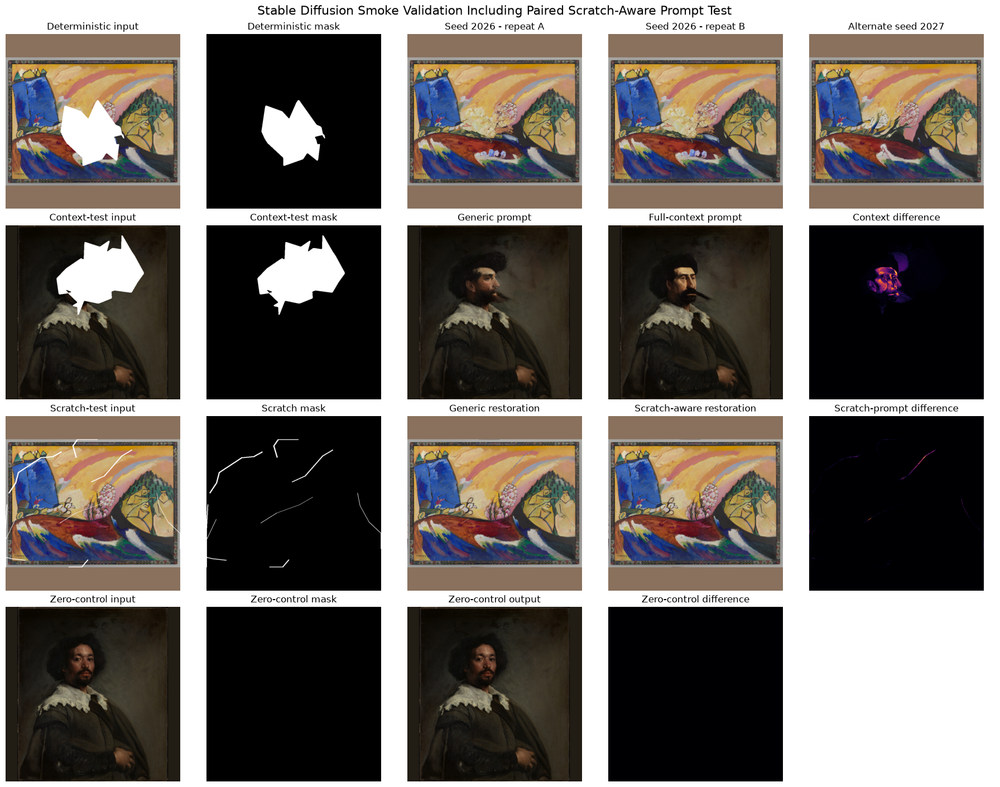

Rendered fixed-seed, alternate-seed, contextual-prompt, scratch-aware-prompt, and zero-control comparisons.


In [15]:
# ---------------------------------------------------------------------------
# Render smoke outputs and difference maps
# ---------------------------------------------------------------------------

deterministic_source_array = np.asarray(
    deterministic_prepared["source_image"],
    dtype=np.uint8,
)

contextual_source_array = np.asarray(
    contextual_prepared["source_image"],
    dtype=np.uint8,
)

scratch_source_array = np.asarray(
    scratch_prepared["source_image"],
    dtype=np.uint8,
)

zero_source_array = np.asarray(
    zero_prepared["source_image"],
    dtype=np.uint8,
)

context_difference_map = np.max(
    np.abs(
        context_generic_array.astype(
            np.int16
        )
        - context_full_array.astype(
            np.int16
        )
    ),
    axis=2,
)

scratch_difference_map = np.max(
    np.abs(
        scratch_generic_array.astype(
            np.int16
        )
        - scratch_aware_array.astype(
            np.int16
        )
    ),
    axis=2,
)

zero_difference_map = np.max(
    np.abs(
        zero_source_array.astype(
            np.int16
        )
        - zero_output_array.astype(
            np.int16
        )
    ),
    axis=2,
)

figure, axes = plt.subplots(
    4,
    5,
    figsize=(18, 14),
    constrained_layout=True,
)

display_items = [
    (
        axes[0, 0],
        deterministic_source_array,
        "Deterministic input",
        None,
    ),
    (
        axes[0, 1],
        deterministic_prepared[
            "binary_mask"
        ],
        "Deterministic mask",
        "gray",
    ),
    (
        axes[0, 2],
        repeat_a_array,
        "Seed 2026 - repeat A",
        None,
    ),
    (
        axes[0, 3],
        repeat_b_array,
        "Seed 2026 - repeat B",
        None,
    ),
    (
        axes[0, 4],
        alternate_seed_array,
        f"Alternate seed {alternate_seed}",
        None,
    ),
    (
        axes[1, 0],
        contextual_source_array,
        "Context-test input",
        None,
    ),
    (
        axes[1, 1],
        contextual_prepared[
            "binary_mask"
        ],
        "Context-test mask",
        "gray",
    ),
    (
        axes[1, 2],
        context_generic_array,
        "Generic prompt",
        None,
    ),
    (
        axes[1, 3],
        context_full_array,
        "Full-context prompt",
        None,
    ),
    (
        axes[1, 4],
        context_difference_map,
        "Context difference",
        "inferno",
    ),
    (
        axes[2, 0],
        scratch_source_array,
        "Scratch-test input",
        None,
    ),
    (
        axes[2, 1],
        scratch_prepared[
            "binary_mask"
        ],
        "Scratch mask",
        "gray",
    ),
    (
        axes[2, 2],
        scratch_generic_array,
        "Generic restoration",
        None,
    ),
    (
        axes[2, 3],
        scratch_aware_array,
        "Scratch-aware restoration",
        None,
    ),
    (
        axes[2, 4],
        scratch_difference_map,
        "Scratch-prompt difference",
        "inferno",
    ),
    (
        axes[3, 0],
        zero_source_array,
        "Zero-control input",
        None,
    ),
    (
        axes[3, 1],
        zero_prepared[
            "binary_mask"
        ],
        "Zero-control mask",
        "gray",
    ),
    (
        axes[3, 2],
        zero_output_array,
        "Zero-control output",
        None,
    ),
    (
        axes[3, 3],
        zero_difference_map,
        "Zero-control difference",
        "inferno",
    ),
]

for (
    axis,
    image_array,
    title,
    colour_map,
) in display_items:
    axis.imshow(
        image_array,
        cmap=colour_map,
    )
    axis.set_title(title)
    axis.axis("off")

axes[3, 4].axis("off")

figure.suptitle(
    "Stable Diffusion Smoke Validation Including "
    "Paired Scratch-Aware Prompt Test",
    fontsize=16,
)

plt.show()

print(
    "Rendered fixed-seed, alternate-seed, contextual-prompt, "
    "scratch-aware-prompt, and zero-control comparisons."
)

In [16]:
# ---------------------------------------------------------------------------
# Batch 3 validation
# ---------------------------------------------------------------------------

# Make this validation cell safe to rerun without duplicating Batch 3 checks.
prior_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != "batch_3_smoke_inference"
]

VALIDATION = ValidationCollector()
VALIDATION.extend(prior_validation_checks)

def add_batch_3_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_3_smoke_inference",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_3_check(
    check_id="pipeline_model_identifier",
    description=(
        "The loaded pipeline reports the approved model."
    ),
    expected=configured_model[
        "hf_model_id"
    ],
    observed=pipeline_model_identifier,
    passed=(
        pipeline_model_identifier
        == configured_model[
            "hf_model_id"
        ]
    ),
)

add_batch_3_check(
    check_id="pipeline_revision_pin",
    description=(
        "The run uses the immutable approved model revision."
    ),
    expected=(
        "8a4288a76071f7280aedbdb3253bdb9e9d5d84bb"
    ),
    observed=configured_model[
        "model_revision"
    ],
    passed=(
        configured_model[
            "model_revision"
        ]
        == "8a4288a76071f7280aedbdb3253bdb9e9d5d84bb"
    ),
)

add_batch_3_check(
    check_id="pipeline_device",
    description=(
        "The pipeline uses CUDA without CPU fallback."
    ),
    expected="cuda",
    observed=EFFECTIVE_DEVICE,
    passed=(
        EFFECTIVE_DEVICE == "cuda"
    ),
)

add_batch_3_check(
    check_id="pipeline_scheduler",
    description=(
        "The loaded pipeline uses DDIMScheduler."
    ),
    expected="DDIMScheduler",
    observed=pipeline_scheduler_name,
    passed=(
        pipeline_scheduler_name
        == "DDIMScheduler"
    ),
)

add_batch_3_check(
    check_id="safety_checker_policy",
    description=(
        "The safety checker is disabled according to the "
        "recorded fixed-dataset research policy."
    ),
    expected=True,
    observed=PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
    passed=PIPELINE_PREFLIGHT[
        "safety_checker_disabled"
    ],
)

add_batch_3_check(
    check_id="smoke_completion",
    description=(
        "All eight smoke specifications completed."
    ),
    expected=8,
    observed=int(
        smoke_results_df["status"]
        .eq("completed")
        .sum()
    ),
    passed=(
        len(smoke_results_df) == 8
        and smoke_results_df[
            "status"
        ].eq("completed").all()
    ),
)

expected_smoke_actions = {
    "stable_diffusion_inpaint": 7,
    "identity_noop": 1,
}

observed_smoke_actions = (
    smoke_results_df[
        "execution_action"
    ]
    .value_counts()
    .to_dict()
)

add_batch_3_check(
    check_id="smoke_execution_actions",
    description=(
        "Seven smoke candidates use model inference and "
        "the zero control uses identity/no-op."
    ),
    expected=expected_smoke_actions,
    observed=observed_smoke_actions,
    passed=(
        observed_smoke_actions
        == expected_smoke_actions
    ),
)

add_batch_3_check(
    check_id="smoke_output_contract",
    description=(
        "Every smoke output reloads with the approved "
        "geometry, checksum, compositing, and zero policy."
    ),
    expected=8,
    observed=int(
        smoke_output_audit_df[
            "passed"
        ].sum()
    ),
    passed=(
        len(smoke_output_audit_df) == 8
        and smoke_output_audit_df[
            "passed"
        ].all()
    ),
    details=smoke_output_audit_df.to_dict(
        orient="records"
    ),
)

add_batch_3_check(
    check_id="fixed_seed_repeatability",
    description=(
        "Repeated inference with the same case, prompt, "
        "and seed satisfies the numerical tolerance."
    ),
    expected=fixed_repeat_tolerance,
    observed=fixed_repeat_statistics,
    passed=fixed_repeat_passed,
)

add_batch_3_check(
    check_id="alternate_seed_sensitivity",
    description=(
        "Changing only the seed changes pixels inside the "
        "mask while preserving the outside exactly."
    ),
    expected={
        "inside_different_pixels": "> 0",
        "outside_different_pixels": 0,
    },
    observed=alternate_seed_statistics,
    passed=alternate_seed_passed,
)

add_batch_3_check(
    check_id="contextual_prompt_sensitivity",
    description=(
        "Changing only the contextual prompt changes pixels "
        "inside the mask while preserving the outside exactly."
    ),
    expected={
        "inside_different_pixels": "> 0",
        "outside_different_pixels": 0,
    },
    observed=context_prompt_statistics,
    passed=context_prompt_passed,
)

add_batch_3_check(
    check_id="scratch_prompt_sensitivity",
    description=(
        "Changing only from the generic to scratch-aware "
        "prompt changes pixels inside the scratch mask while "
        "preserving the outside exactly."
    ),
    expected={
        "inside_different_pixels": "> 0",
        "outside_different_pixels": 0,
    },
    observed=scratch_prompt_statistics,
    passed=scratch_prompt_passed,
)

scratch_smoke_pair_contract_valid = bool(
    smoke_result(
        "scratch_generic"
    )["case_id"]
    == smoke_result(
        "scratch_aware"
    )["case_id"]
    == scratch_pair_case_id
    and int(
        smoke_result(
            "scratch_generic"
        )["seed"]
    )
    == int(
        smoke_result(
            "scratch_aware"
        )["seed"]
    )
    == scratch_pair_seed
    and smoke_result(
        "scratch_generic"
    )["input_image_path"]
    == smoke_result(
        "scratch_aware"
    )["input_image_path"]
    and smoke_result(
        "scratch_generic"
    )["mask_or_effect_path"]
    == smoke_result(
        "scratch_aware"
    )["mask_or_effect_path"]
    and smoke_result(
        "scratch_generic"
    )["prompt_variant_id"]
    == "p00_generic"
    and smoke_result(
        "scratch_aware"
    )["prompt_variant_id"]
    == SCRATCH_PROMPT_VARIANT_ID
)

add_batch_3_check(
    check_id="scratch_smoke_pair_contract",
    description=(
        "The smoke treatment pair uses one case, mask, and "
        "seed with exactly the two declared prompt arms."
    ),
    expected=True,
    observed=scratch_smoke_pair_contract_valid,
    passed=scratch_smoke_pair_contract_valid,
)

scratch_smoke_prompt_contract_valid = bool(
    smoke_result(
        "scratch_generic"
    )["prompt"]
    == base_sd_config[
        "prompt_policy"
    ]["generic_prompt"]
    and smoke_result(
        "scratch_aware"
    )["prompt"]
    == configured_scratch_policy[
        "positive_prompt"
    ]
    and "scratch"
    in smoke_result(
        "scratch_aware"
    )["negative_prompt"].lower()
)

add_batch_3_check(
    check_id="scratch_smoke_prompt_contract",
    description=(
        "The smoke pair uses the exact approved generic and "
        "scratch-aware prompt texts."
    ),
    expected=True,
    observed=scratch_smoke_prompt_contract_valid,
    passed=scratch_smoke_prompt_contract_valid,
)

add_batch_3_check(
    check_id="zero_control_identity",
    description=(
        "The zero-control output is pixel-identical to its "
        "input and performs no model inference."
    ),
    expected=True,
    observed=zero_pixel_exact,
    passed=(
        zero_pixel_exact
        and smoke_result(
            "zero_control"
        )["execution_action"]
        == "identity_noop"
    ),
)

smoke_seed_records = {
    row["smoke_label"]: int(
        row["seed"]
    )
    for _, row
    in smoke_results_df.iterrows()
}

expected_smoke_seeds = {
    "deterministic_repeat_a": primary_seed,
    "deterministic_repeat_b": primary_seed,
    "alternate_seed": alternate_seed,
    "context_generic": primary_seed,
    "context_full": primary_seed,
    "scratch_generic": scratch_pair_seed,
    "scratch_aware": scratch_pair_seed,
    "zero_control": primary_seed,
}

add_batch_3_check(
    check_id="smoke_seed_records",
    description=(
        "Every smoke record retains its declared seed."
    ),
    expected=expected_smoke_seeds,
    observed=smoke_seed_records,
    passed=(
        smoke_seed_records
        == expected_smoke_seeds
    ),
)

retry_policy_valid = bool(
    smoke_results_df["attempt_count"]
    .ge(1)
    .all()
    and smoke_results_df["retry_count"]
    .ge(0)
    .all()
    and smoke_results_df["retry_count"]
    .le(
        configured_model[
            "maximum_retries"
        ]
    )
    .all()
)

add_batch_3_check(
    check_id="smoke_retry_records",
    description=(
        "Attempts and retries are explicit and remain "
        "within the approved limit."
    ),
    expected={
        "maximum_retries": configured_model[
            "maximum_retries"
        ],
        "seed_policy": (
            "preserve_exact_seed"
        ),
    },
    observed={
        "maximum_observed_retry": int(
            smoke_results_df[
                "retry_count"
            ].max()
        ),
        "seed_policy": configured_model[
            "retry_seed_policy"
        ],
    },
    passed=retry_policy_valid,
)

smoke_paths_owned = bool(
    smoke_results_df["restored_path"]
    .astype(str)
    .str.startswith(
        "work/smoke/"
    )
    .all()
)

add_batch_3_check(
    check_id="smoke_output_ownership",
    description=(
        "All smoke outputs remain in the notebook-owned "
        "temporary QA directory."
    ),
    expected=True,
    observed=smoke_paths_owned,
    passed=smoke_paths_owned,
)


BATCH_3_VALIDATION_DF = (
    VALIDATION.to_dataframe()
)

BATCH_3_ONLY_VALIDATION_DF = (
    BATCH_3_VALIDATION_DF.loc[
        BATCH_3_VALIDATION_DF[
            "validation_stage"
        ].eq("batch_3_smoke_inference")
    ]
    .reset_index(drop=True)
)

BATCH_3_VALIDATION_SUMMARY = (
    VALIDATION.summary()
)

display(smoke_specifications_df)

display(
    smoke_results_df[
        [
            "smoke_label",
            "case_id",
            "prompt_variant_id",
            "seed",
            "execution_action",
            "runtime_seconds",
            "gpu_memory_before_bytes",
            "gpu_memory_after_bytes",
            "gpu_peak_memory_bytes",
            "retry_count",
            "attempt_count",
            "status",
            "issue",
        ]
    ]
)

display(smoke_output_audit_df)
display(smoke_comparison_df)
display(BATCH_3_ONLY_VALIDATION_DF)

print("Batch 3 validation summary:")
print(
    json.dumps(
        BATCH_3_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 3 passed. The pinned model, fixed-seed "
    "repeatability, seed sensitivity, contextual-prompt "
    "sensitivity, scratch-aware-prompt sensitivity, "
    "zero-control identity, and compositing policies are valid."
)

,smoke_label,methodological_role,case_id,painting_id,prompt_variant_id,seed,candidate_selection_policy,restored_path
0,deterministic_repeat_a,fixed_seed_repeat_reference,canonical__p039__loss_large,p039,p00_generic,2026,deterministic_hash_stratified_non_metric.v1,work/smoke/deterministic_repeat_a.png
1,deterministic_repeat_b,fixed_seed_repeat_replication,canonical__p039__loss_large,p039,p00_generic,2026,deterministic_hash_stratified_non_metric.v1,work/smoke/deterministic_repeat_b.png
2,alternate_seed,seed_sensitivity,canonical__p039__loss_large,p039,p00_generic,2027,deterministic_hash_stratified_non_metric.v1,work/smoke/alternate_seed.png
3,context_generic,prompt_ablation_generic,canonical__p001__loss_large,p001,p00_generic,2026,deterministic_hash_stratified_non_metric.v1,work/smoke/context_generic.png
4,context_full,prompt_ablation_contextual,canonical__p001__loss_large,p001,p04_full_context,2026,deterministic_hash_stratified_non_metric.v1,work/smoke/context_full.png
5,scratch_generic,scratch_prompt_generic_reference,canonical__p039__scratch_thin,p039,p00_generic,2026,deterministic_hash_stratified_non_metric.v1,work/smoke/scratch_generic.png
6,scratch_aware,scratch_prompt_damage_aware_treatment,canonical__p039__scratch_thin,p039,p05_scratch_aware,2026,all_canonical_paintings_paired_non_metric.v1,work/smoke/scratch_aware.png
7,zero_control,identity_noop_control,canonical__p001__zero_control,p001,p00_generic,2026,deterministic_hash_stratified_non_metric.v1,work/smoke/zero_control.png


,smoke_label,case_id,prompt_variant_id,seed,execution_action,runtime_seconds,gpu_memory_before_bytes,gpu_memory_after_bytes,gpu_peak_memory_bytes,retry_count,attempt_count,status,issue
0,deterministic_repeat_a,canonical__p039__loss_large,p00_generic,2026,stable_diffusion_inpaint,14.519365,2156534784,2165054976,2805533184,0,1,completed,
1,deterministic_repeat_b,canonical__p039__loss_large,p00_generic,2026,stable_diffusion_inpaint,6.944324,2165054976,2165054976,2805533184,0,1,completed,
2,alternate_seed,canonical__p039__loss_large,p00_generic,2027,stable_diffusion_inpaint,6.639547,2165054976,2165054976,2805533184,0,1,completed,
3,context_generic,canonical__p001__loss_large,p00_generic,2026,stable_diffusion_inpaint,7.587153,2165054976,2165054976,2805533184,0,1,completed,
4,context_full,canonical__p001__loss_large,p04_full_context,2026,stable_diffusion_inpaint,6.822439,2165054976,2165054976,2805533184,0,1,completed,
5,scratch_generic,canonical__p039__scratch_thin,p00_generic,2026,stable_diffusion_inpaint,7.181147,2165054976,2165054976,2805533184,0,1,completed,
6,scratch_aware,canonical__p039__scratch_thin,p05_scratch_aware,2026,stable_diffusion_inpaint,6.514129,2165054976,2165054976,2805533184,0,1,completed,
7,zero_control,canonical__p001__zero_control,p00_generic,2026,identity_noop,0.644036,2165054976,2165054976,2165054976,0,1,completed,


,candidate_id,case_id,file_exists,geometry_valid,checksum_matches,outside_mask_changed_pixels,inside_mask_changed_pixels,zero_control_valid,passed,details,smoke_label,methodological_role
0,smoke__deterministic_repeat_a,canonical__p039__loss_large,True,True,True,0,49001,True,True,,deterministic_repeat_a,fixed_seed_repeat_reference
1,smoke__deterministic_repeat_b,canonical__p039__loss_large,True,True,True,0,49001,True,True,,deterministic_repeat_b,fixed_seed_repeat_replication
2,smoke__alternate_seed,canonical__p039__loss_large,True,True,True,0,49001,True,True,,alternate_seed,seed_sensitivity
3,smoke__context_generic,canonical__p001__loss_large,True,True,True,0,70792,True,True,,context_generic,prompt_ablation_generic
4,smoke__context_full,canonical__p001__loss_large,True,True,True,0,70792,True,True,,context_full,prompt_ablation_contextual
5,smoke__scratch_generic,canonical__p039__scratch_thin,True,True,True,0,5664,True,True,,scratch_generic,scratch_prompt_generic_reference
6,smoke__scratch_aware,canonical__p039__scratch_thin,True,True,True,0,5664,True,True,,scratch_aware,scratch_prompt_damage_aware_treatment
7,smoke__zero_control,canonical__p001__zero_control,True,True,True,0,0,True,True,,zero_control,identity_noop_control


,comparison_id,reference,comparison,maximum_absolute_difference,mean_absolute_difference,different_pixel_fraction,inside_different_pixels,outside_different_pixels,passed
0,fixed_seed_repeat,deterministic_repeat_a,deterministic_repeat_b,0,0.000000,0.000000,0,0,True
1,alternate_seed,deterministic_repeat_a,alternate_seed,206,3.152638,0.083077,49001,0,True
2,contextual_prompt,context_generic,context_full,156,1.138023,0.119407,70429,0,True
3,scratch_aware_prompt,scratch_generic,scratch_aware,120,0.070058,0.009413,5552,0,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_smoke_inference,pipeline_model_identifier,The loaded pipeline reports the approved model.,blocking,stable-diffusion-v1-5/stable-diffusion-inpainting,stable-diffusion-v1-5/stable-diffusion-inpainting,True,
1,batch_3_smoke_inference,pipeline_revision_pin,The run uses the immutable approved model revi...,blocking,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,8a4288a76071f7280aedbdb3253bdb9e9d5d84bb,True,
2,batch_3_smoke_inference,pipeline_device,The pipeline uses CUDA without CPU fallback.,blocking,cuda,cuda,True,
3,batch_3_smoke_inference,pipeline_scheduler,The loaded pipeline uses DDIMScheduler.,blocking,DDIMScheduler,DDIMScheduler,True,
4,batch_3_smoke_inference,safety_checker_policy,The safety checker is disabled according to th...,blocking,True,True,True,
5,batch_3_smoke_inference,smoke_completion,All eight smoke specifications completed.,blocking,8,8,True,
6,batch_3_smoke_inference,smoke_execution_actions,Seven smoke candidates use model inference and...,blocking,"{""identity_noop"": 1, ""stable_diffusion_inpaint...","{""identity_noop"": 1, ""stable_diffusion_inpaint...",True,
7,batch_3_smoke_inference,smoke_output_contract,Every smoke output reloads with the approved g...,blocking,8,8,True,"[{""candidate_id"": ""smoke__deterministic_repeat..."
8,batch_3_smoke_inference,fixed_seed_repeatability,"Repeated inference with the same case, prompt,...",blocking,"{""maximum_absolute_difference"": 1, ""maximum_di...","{""different_pixel_fraction"": 0.0, ""inside_diff...",True,
9,batch_3_smoke_inference,alternate_seed_sensitivity,Changing only the seed changes pixels inside t...,blocking,"{""inside_different_pixels"": ""> 0"", ""outside_di...","{""different_pixel_fraction"": 0.083077324761284...",True,


Batch 3 validation summary:
{
  "check_count": 141,
  "passed_count": 141,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 3 passed. The pinned model, fixed-seed repeatability, seed sensitivity, contextual-prompt sensitivity, scratch-aware-prompt sensitivity, zero-control identity, and compositing policies are valid.


## Batch 4 — Full Stable Diffusion Candidate Execution

This batch:

- reuses the smoke-validated pinned pipeline, or reloads it from the local model cache after a kernel restart;
- verifies the effective combined configuration fingerprint;
- estimates execution time and required storage;
- executes all 8,520 candidates;
- performs 8,220 Stable Diffusion inference operations and 300 identity/no-op controls;
- includes the complete 2,400-outcome paired scratch-prompt matrix;
- prints progress every 10 candidates;
- writes an atomic checkpoint every five candidates;
- strictly resumes only candidates whose identity, inputs, mask, model revision, configuration fingerprint, output path, geometry, and checksum remain valid;
- records runtime, GPU memory, retries, attempts, timestamps, execution actions, and failures;
- reconciles candidate IDs, roles, prompts, seeds, files, and the checkpoint against the predeclared plan.

Canonical candidate tables and reports are persisted in later batches. If execution is interrupted, rerun the full-execution cell; at most four uncheckpointed candidates may need regeneration.

In [17]:
import shutil

from restoration_eval.restoration_stable_diffusion import (
    configuration_fingerprint,
    load_stable_diffusion_pipeline,
    run_stable_diffusion_candidates,
)


# ---------------------------------------------------------------------------
# Restore the pipeline after a kernel restart if necessary
# ---------------------------------------------------------------------------

pipeline_reloaded_for_batch_4 = False

if (
    "stable_diffusion_pipeline" not in globals()
    or stable_diffusion_pipeline is None
):
    print(
        "Pipeline is not present in memory; loading it "
        "from the pinned local cache."
    )

    pipeline_reload_started = time.perf_counter()

    stable_diffusion_pipeline, EFFECTIVE_DEVICE = (
        load_stable_diffusion_pipeline(
            base_sd_config
        )
    )

    pipeline_reload_seconds = (
        time.perf_counter()
        - pipeline_reload_started
    )

    pipeline_reloaded_for_batch_4 = True

    print(
        "Pipeline reload seconds:",
        round(pipeline_reload_seconds, 3),
    )
else:
    print(
        "Reusing the smoke-validated pipeline already "
        "loaded in GPU memory."
    )


# ---------------------------------------------------------------------------
# Execution-time and storage estimates
# ---------------------------------------------------------------------------

completed_smoke_inference_runtimes = (
    smoke_results_df.loc[
        smoke_results_df[
            "execution_action"
        ].eq("stable_diffusion_inpaint"),
        "runtime_seconds",
    ]
    .astype(float)
)

if len(completed_smoke_inference_runtimes) < 2:
    raise RuntimeError(
        "At least two completed smoke inferences are "
        "required for the execution estimate."
    )

# Exclude the first inference because it includes warm-up overhead.
steady_smoke_runtime_seconds = float(
    completed_smoke_inference_runtimes
    .iloc[1:]
    .median()
)

zero_control_smoke_runtime_seconds = float(
    smoke_results_df.loc[
        smoke_results_df[
            "execution_action"
        ].eq("identity_noop"),
        "runtime_seconds",
    ]
    .astype(float)
    .median()
)

estimated_full_execution_seconds = (
    steady_smoke_runtime_seconds
    * EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    + zero_control_smoke_runtime_seconds
    * EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
)

estimated_full_execution_hours = (
    estimated_full_execution_seconds / 3600
)

smoke_file_sizes = pd.Series(
    [
        (
            OUTPUT_ROOT
            / restored_path
        ).stat().st_size
        for restored_path
        in smoke_results_df["restored_path"]
    ],
    dtype="int64",
)

estimated_restored_bytes = int(
    smoke_file_sizes.mean()
    * EXPECTED_COUNTS["restored_file_count"]
)

disk_usage = shutil.disk_usage(OUTPUT_ROOT)

minimum_free_bytes = max(
    estimated_restored_bytes * 2,
    2 * 1024 ** 3,
)

storage_preflight_passed = bool(
    disk_usage.free >= minimum_free_bytes
)


# ---------------------------------------------------------------------------
# Plan, configuration, and resume state
# ---------------------------------------------------------------------------

checkpoint_path = OUTPUTS["checkpoint"]

if checkpoint_path.is_file():
    existing_checkpoint_df = pd.read_csv(
        checkpoint_path,
        low_memory=False,
    )
    existing_checkpoint_rows = len(
        existing_checkpoint_df
    )
else:
    existing_checkpoint_df = pd.DataFrame()
    existing_checkpoint_rows = 0

existing_canonical_image_count = len(
    list(
        OUTPUTS["restored_images"].rglob("*.png")
    )
)

effective_execution_fingerprint = (
    configuration_fingerprint(sd_config)
)

configuration_fingerprints = set(
    candidate_plan_df[
        "configuration_fingerprint"
    ]
    .astype(str)
)

planned_zero_control_count = int(
    candidate_plan_df["case_id"]
    .astype(str)
    .isin(zero_control_case_ids)
    .sum()
)

planned_model_inference_count = int(
    len(candidate_plan_df)
    - planned_zero_control_count
)

execution_preflight_df = pd.DataFrame(
    [
        {
            "preflight_item": "pipeline_device",
            "observed": EFFECTIVE_DEVICE,
            "required": "cuda",
            "passed": EFFECTIVE_DEVICE == "cuda",
        },
        {
            "preflight_item": "candidate_count",
            "observed": len(candidate_plan_df),
            "required": EXPECTED_COUNTS[
                "candidate_count"
            ],
            "passed": (
                len(candidate_plan_df)
                == EXPECTED_COUNTS[
                    "candidate_count"
                ]
                == 8520
            ),
        },
        {
            "preflight_item": "model_inference_count",
            "observed": planned_model_inference_count,
            "required": EXPECTED_COUNTS[
                "model_inference_candidate_count"
            ],
            "passed": (
                planned_model_inference_count
                == EXPECTED_COUNTS[
                    "model_inference_candidate_count"
                ]
                == 8220
            ),
        },
        {
            "preflight_item": "zero_control_count",
            "observed": planned_zero_control_count,
            "required": EXPECTED_COUNTS[
                "zero_control_case_count"
            ],
            "passed": (
                planned_zero_control_count
                == EXPECTED_COUNTS[
                    "zero_control_case_count"
                ]
                == 300
            ),
        },
        {
            "preflight_item": "formal_scratch_matrix",
            "observed": len(
                paired_scratch_matrix_df
            ),
            "required": EXPECTED_COUNTS[
                "scratch_prompt_paired_outcome_count"
            ],
            "passed": (
                len(paired_scratch_matrix_df)
                == EXPECTED_COUNTS[
                    "scratch_prompt_paired_outcome_count"
                ]
                == 2400
            ),
        },
        {
            "preflight_item": (
                "configuration_fingerprint"
            ),
            "observed": sorted(
                configuration_fingerprints
            ),
            "required": (
                effective_execution_fingerprint
            ),
            "passed": (
                configuration_fingerprints
                == {
                    effective_execution_fingerprint
                }
            ),
        },
        {
            "preflight_item": "unique_candidate_ids",
            "observed": candidate_plan_df[
                "candidate_id"
            ].nunique(),
            "required": len(candidate_plan_df),
            "passed": candidate_plan_df[
                "candidate_id"
            ].is_unique,
        },
        {
            "preflight_item": "unique_output_paths",
            "observed": candidate_plan_df[
                "restored_path"
            ].nunique(),
            "required": len(candidate_plan_df),
            "passed": candidate_plan_df[
                "restored_path"
            ].is_unique,
        },
        {
            "preflight_item": (
                "available_storage_bytes"
            ),
            "observed": disk_usage.free,
            "required": minimum_free_bytes,
            "passed": storage_preflight_passed,
        },
        {
            "preflight_item": "resume_enabled",
            "observed": configured_execution[
                "resume_enabled"
            ],
            "required": True,
            "passed": bool(
                configured_execution[
                    "resume_enabled"
                ]
            ),
        },
        {
            "preflight_item": (
                "progress_interval_candidates"
            ),
            "observed": configured_execution[
                "progress_interval_candidates"
            ],
            "required": 10,
            "passed": (
                configured_execution[
                    "progress_interval_candidates"
                ]
                == 10
            ),
        },
        {
            "preflight_item": (
                "checkpoint_interval_candidates"
            ),
            "observed": configured_execution[
                "checkpoint_interval_candidates"
            ],
            "required": 5,
            "passed": (
                configured_execution[
                    "checkpoint_interval_candidates"
                ]
                == 5
            ),
        },
    ]
)

display(execution_preflight_df)

if not execution_preflight_df["passed"].all():
    failed_preflight_df = (
        execution_preflight_df.loc[
            ~execution_preflight_df["passed"]
        ]
    )

    display(failed_preflight_df)

    raise RuntimeError(
        "Batch 4 execution preflight failed."
    )

print(
    "Estimated inference hours:",
    round(estimated_full_execution_hours, 2),
)
print(
    "Estimated restored-image storage (MiB):",
    round(
        estimated_restored_bytes / (1024 ** 2),
        1,
    ),
)
print(
    "Available storage (GiB):",
    round(
        disk_usage.free / (1024 ** 3),
        2,
    ),
)
print(
    "Existing checkpoint rows:",
    existing_checkpoint_rows,
)
print(
    "Existing canonical candidate images:",
    existing_canonical_image_count,
)
print(
    "Pipeline reloaded in this batch:",
    pipeline_reloaded_for_batch_4,
)
print(
    "Execution preflight passed:",
    bool(execution_preflight_df["passed"].all()),
)

Reusing the smoke-validated pipeline already loaded in GPU memory.


,preflight_item,observed,required,passed
0,pipeline_device,cuda,cuda,True
1,candidate_count,8520,8520,True
2,model_inference_count,8220,8220,True
3,zero_control_count,300,300,True
4,formal_scratch_matrix,2400,2400,True
5,configuration_fingerprint,[957641861685a186f7d38a375ab1bfbe3c86efdf3fc5f...,957641861685a186f7d38a375ab1bfbe3c86efdf3fc5ff...,True
6,unique_candidate_ids,8520,8520,True
7,unique_output_paths,8520,8520,True
8,available_storage_bytes,889467936768,12211931130,True
9,resume_enabled,True,True,True


Estimated inference hours: 15.77
Estimated restored-image storage (MiB): 5823.1
Available storage (GiB): 828.38
Existing checkpoint rows: 8520
Existing canonical candidate images: 8520
Pipeline reloaded in this batch: False
Execution preflight passed: True


In [18]:
# Reload the checkpoint-retry fix into the current kernel.
import importlib

import restoration_eval.restoration_stable_diffusion as stable_diffusion_runtime


stable_diffusion_runtime = importlib.reload(
    stable_diffusion_runtime
)

run_stable_diffusion_candidates = (
    stable_diffusion_runtime
    .run_stable_diffusion_candidates
)

print(
    "Reloaded Stable Diffusion helper with "
    "Windows-safe checkpoint retries."
)


# ---------------------------------------------------------------------------
# Full normalized, resumable candidate execution
# ---------------------------------------------------------------------------

FULL_EXECUTION_STARTED_AT_UTC = utc_now_iso()
full_execution_clock = time.perf_counter()

print(
    "Starting Stable Diffusion execution/recovery:",
    FULL_EXECUTION_STARTED_AT_UTC,
)
print(
    "Planned candidates:",
    len(candidate_plan_df),
)
print(
    "Planned model inferences:",
    planned_model_inference_count,
)
print(
    "Planned identity controls:",
    planned_zero_control_count,
)
print(
    "Formal scratch-prompt outcomes:",
    len(paired_scratch_matrix_df),
)


# ---------------------------------------------------------------------------
# Detect a complete checkpoint or completed canonical candidate table
# ---------------------------------------------------------------------------

resume_source_path = None

if checkpoint_path.is_file():
    resume_source_path = checkpoint_path
elif OUTPUTS["candidates"].is_file():
    resume_source_path = OUTPUTS["candidates"]

complete_resume_state = False
resume_state_issue = ""
resume_candidates_df = pd.DataFrame()

signature_columns = [
    "candidate_id",
    "seed",
    "configuration_fingerprint",
    "restored_path",
]


def normalized_resume_signature(frame):
    signature = frame[
        signature_columns
    ].copy()

    signature["candidate_id"] = (
        signature["candidate_id"].astype(str)
    )
    signature["seed"] = pd.to_numeric(
        signature["seed"],
        errors="raise",
    ).astype(int)
    signature["configuration_fingerprint"] = (
        signature[
            "configuration_fingerprint"
        ].astype(str)
    )
    signature["restored_path"] = (
        signature["restored_path"].astype(str)
    )

    return (
        signature
        .sort_values("candidate_id")
        .reset_index(drop=True)
    )


if resume_source_path is not None:
    try:
        resume_candidates_df = pd.read_csv(
            resume_source_path,
            low_memory=False,
        )

        resume_schema_validation = (
            validate_dataframe(
                resume_candidates_df,
                STABLE_DIFFUSION_CANDIDATES_SCHEMA,
            )
        )

        planned_signature_df = (
            normalized_resume_signature(
                candidate_plan_df
            )
        )

        observed_signature_df = (
            normalized_resume_signature(
                resume_candidates_df
            )
        )

        resume_files_valid = all(
            (
                OUTPUT_ROOT
                / str(relative_path)
            ).is_file()
            and (
                OUTPUT_ROOT
                / str(relative_path)
            ).stat().st_size > 0
            for relative_path
            in resume_candidates_df[
                "restored_path"
            ]
        )

        complete_resume_state = bool(
            resume_schema_validation.passed
            and len(resume_candidates_df)
            == EXPECTED_COUNTS["candidate_count"]
            and resume_candidates_df[
                "candidate_id"
            ].is_unique
            and resume_candidates_df[
                "restored_path"
            ].is_unique
            and resume_candidates_df[
                "status"
            ].astype(str).eq("completed").all()
            and observed_signature_df.equals(
                planned_signature_df
            )
            and resume_files_valid
        )

        if not complete_resume_state:
            resume_state_issue = (
                "Existing candidate state is incomplete "
                "or does not match the current plan."
            )

    except Exception as resume_error:
        resume_state_issue = (
            f"{type(resume_error).__name__}: "
            f"{resume_error}"
        )


# ---------------------------------------------------------------------------
# Fast reuse or strict helper-controlled continuation
# ---------------------------------------------------------------------------

if complete_resume_state:
    candidates_df = resume_candidates_df.copy()

    if not checkpoint_path.is_file():
        checkpoint_path.parent.mkdir(
            parents=True,
            exist_ok=True,
        )

        temporary_checkpoint_path = (
            checkpoint_path.with_suffix(
                checkpoint_path.suffix
                + ".resume.tmp"
            )
        )

        candidates_df.to_csv(
            temporary_checkpoint_path,
            index=False,
        )

        temporary_checkpoint_path.replace(
            checkpoint_path
        )

    print(
        "Complete candidate state verified and reused."
    )
    print(
        "No Stable Diffusion inference was performed."
    )
    print(
        "Resume source:",
        to_repo_relative(
            resume_source_path,
            PROJECT_ROOT,
        ),
    )

else:
    if resume_state_issue:
        print(
            "Fast-resume state was not accepted:",
            resume_state_issue,
        )

    print(
        "Continuing through the strict resumable "
        "execution helper."
    )
    print(
        "Progress will be printed every",
        configured_execution[
            "progress_interval_candidates"
        ],
        "candidates.",
    )
    print(
        "Checkpoint will be updated every",
        configured_execution[
            "checkpoint_interval_candidates"
        ],
        "candidates.",
    )

    try:
        candidates_df = (
            run_stable_diffusion_candidates(
                candidate_plan_df,
                pipeline=(
                    stable_diffusion_pipeline
                ),
                device=EFFECTIVE_DEVICE,
                project_root=PROJECT_ROOT,
                notebook_output_root=(
                    OUTPUT_ROOT
                ),
                config=sd_config,
                checkpoint_path=checkpoint_path,
                progress_callback=print,
            )
        )

    except (KeyboardInterrupt, Exception) as execution_error:
        elapsed_before_stop = (
            time.perf_counter()
            - full_execution_clock
        )

        checkpoint_rows_after_stop = (
            len(
                pd.read_csv(
                    checkpoint_path,
                    low_memory=False,
                )
            )
            if checkpoint_path.is_file()
            else 0
        )

        print(
            "Execution stopped after seconds:",
            round(elapsed_before_stop, 3),
        )
        print(
            "Safely checkpointed candidate rows:",
            checkpoint_rows_after_stop,
        )
        print(
            "Stop reason:",
            (
                f"{type(execution_error).__name__}: "
                f"{execution_error}"
            ),
        )
        print(
            "Rerun this cell to strictly validate "
            "and resume."
        )

        raise


FULL_EXECUTION_COMPLETED_AT_UTC = (
    utc_now_iso()
)

full_execution_wall_seconds = (
    time.perf_counter()
    - full_execution_clock
)

print(
    "Execution/recovery completed:",
    FULL_EXECUTION_COMPLETED_AT_UTC,
)
print(
    "Execution/recovery wall seconds:",
    round(full_execution_wall_seconds, 3),
)
print(
    "Returned candidate rows:",
    len(candidates_df),
)

Reloaded Stable Diffusion helper with Windows-safe checkpoint retries.
Starting Stable Diffusion execution/recovery: 2026-09-12T20:19:48.943666Z
Planned candidates: 8520
Planned model inferences: 8220
Planned identity controls: 300
Formal scratch-prompt outcomes: 2400
Complete candidate state verified and reused.
No Stable Diffusion inference was performed.
Resume source: outputs/11_stable_diffusion_restoration/work/candidate_checkpoint.csv
Execution/recovery completed: 2026-09-12T20:19:51.668616Z
Execution/recovery wall seconds: 2.73
Returned candidate rows: 8520


In [19]:
# ---------------------------------------------------------------------------
# Full-execution subsets and summaries
# ---------------------------------------------------------------------------

completed_candidates_df = (
    candidates_df.loc[
        candidates_df["status"].eq("completed")
    ]
    .copy()
)

failed_candidates_df = (
    candidates_df.loc[
        candidates_df["status"].eq("failed")
    ]
    .copy()
)

zero_control_execution_df = (
    candidates_df.loc[
        candidates_df["case_id"]
        .astype(str)
        .isin(zero_control_case_ids)
    ]
    .copy()
)

nonzero_execution_df = (
    candidates_df.loc[
        ~candidates_df["case_id"]
        .astype(str)
        .isin(zero_control_case_ids)
    ]
    .copy()
)

formal_scratch_candidate_ids = set(
    paired_scratch_matrix_df[
        "candidate_id"
    ]
    .astype(str)
)

formal_scratch_execution_df = (
    candidates_df.loc[
        candidates_df["candidate_id"]
        .astype(str)
        .isin(formal_scratch_candidate_ids)
    ]
    .copy()
)

candidate_execution_role_summary_df = (
    candidates_df
    .groupby(
        "execution_role",
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        completed_count=(
            "status",
            lambda values: int(
                values.eq("completed").sum()
            ),
        ),
        failed_count=(
            "status",
            lambda values: int(
                values.eq("failed").sum()
            ),
        ),
        total_runtime_seconds=(
            "runtime_seconds",
            "sum",
        ),
        mean_runtime_seconds=(
            "runtime_seconds",
            "mean",
        ),
        median_runtime_seconds=(
            "runtime_seconds",
            "median",
        ),
        maximum_runtime_seconds=(
            "runtime_seconds",
            "max",
        ),
        maximum_retry_count=(
            "retry_count",
            "max",
        ),
        maximum_gpu_peak_bytes=(
            "gpu_peak_memory_bytes",
            "max",
        ),
    )
    .reset_index()
)

candidate_execution_action_summary_df = (
    candidates_df
    .groupby(
        [
            "execution_role",
            "execution_action",
            "status",
        ],
        sort=True,
        dropna=False,
    )
    .size()
    .reset_index(
        name="candidate_count"
    )
)

candidate_retry_summary_df = (
    candidates_df
    .groupby(
        [
            "retry_count",
            "attempt_count",
            "status",
        ],
        sort=True,
        dropna=False,
    )
    .size()
    .reset_index(
        name="candidate_count"
    )
)

formal_scratch_pair_summary_df = (
    formal_scratch_execution_df
    .groupby(
        [
            "case_id",
            "seed",
        ],
        sort=True,
    )
    .agg(
        candidate_count=("candidate_id", "size"),
        prompt_count=(
            "prompt_variant_id",
            "nunique",
        ),
        completed_count=(
            "status",
            lambda values: int(
                values.eq("completed").sum()
            ),
        ),
    )
    .reset_index()
)


# ---------------------------------------------------------------------------
# Checkpoint and candidate identity reconciliation
# ---------------------------------------------------------------------------

if not checkpoint_path.is_file():
    raise FileNotFoundError(
        "The full-execution checkpoint is missing."
    )

final_checkpoint_df = pd.read_csv(
    checkpoint_path,
    low_memory=False,
)

candidate_schema_validation = validate_dataframe(
    candidates_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
)

execution_identity_df = (
    candidate_plan_df[
        [
            "candidate_id",
            "seed",
            "configuration_fingerprint",
        ]
    ]
    .merge(
        candidates_df[
            [
                "candidate_id",
                "seed",
                "configuration_fingerprint",
            ]
        ],
        on="candidate_id",
        how="outer",
        validate="one_to_one",
        suffixes=(
            "_planned",
            "_observed",
        ),
    )
)

seed_records_valid = bool(
    execution_identity_df[
        "seed_planned"
    ]
    .eq(
        execution_identity_df[
            "seed_observed"
        ]
    )
    .all()
)

fingerprint_records_valid = bool(
    execution_identity_df[
        "configuration_fingerprint_planned"
    ]
    .astype(str)
    .eq(
        execution_identity_df[
            "configuration_fingerprint_observed"
        ]
        .astype(str)
    )
    .all()
)

observed_candidate_ids = set(
    candidates_df["candidate_id"]
    .astype(str)
)

planned_candidate_ids = set(
    candidate_plan_df["candidate_id"]
    .astype(str)
)

checkpoint_candidate_ids = set(
    final_checkpoint_df["candidate_id"]
    .astype(str)
)


# ---------------------------------------------------------------------------
# Restored-file reconciliation
# ---------------------------------------------------------------------------

planned_output_audit_df = (
    candidates_df[
        [
            "candidate_id",
            "case_id",
            "execution_role",
            "restored_path",
            "status",
        ]
    ]
    .copy()
)

planned_output_audit_df[
    "absolute_path"
] = (
    planned_output_audit_df[
        "restored_path"
    ]
    .map(
        lambda relative_path: (
            OUTPUT_ROOT / str(relative_path)
        ).resolve()
    )
)

planned_output_audit_df[
    "file_exists"
] = (
    planned_output_audit_df[
        "absolute_path"
    ]
    .map(lambda path: path.is_file())
)

planned_output_audit_df[
    "size_bytes"
] = (
    planned_output_audit_df[
        "absolute_path"
    ]
    .map(
        lambda path: (
            path.stat().st_size
            if path.is_file()
            else 0
        )
    )
)

planned_output_audit_df[
    "nonempty"
] = (
    planned_output_audit_df[
        "size_bytes"
    ]
    .gt(0)
)

planned_restored_paths = set(
    planned_output_audit_df[
        "absolute_path"
    ]
)

observed_restored_paths = {
    path.resolve()
    for path
    in OUTPUTS["restored_images"].rglob("*.png")
    if path.is_file()
}

missing_restored_paths = (
    planned_restored_paths
    - observed_restored_paths
)

orphaned_restored_paths = (
    observed_restored_paths
    - planned_restored_paths
)

empty_restored_paths = {
    path
    for path in observed_restored_paths
    if path.stat().st_size <= 0
}


# ---------------------------------------------------------------------------
# Effective-design execution reconciliation
# ---------------------------------------------------------------------------

approved_role_counts = {
    "primary": 2620,
    "prompt_context": 4460,
    "uncertainty_extension": 1440,
}

observed_role_counts = (
    candidates_df
    .groupby("execution_role")
    .size()
    .to_dict()
)

approved_prompt_counts = {
    "p00_generic": 4060,
    "p01_category": 815,
    "p02_artist": 815,
    "p03_artist_category": 815,
    "p04_full_context": 815,
    "p05_scratch_aware": 1200,
}

observed_prompt_counts = (
    candidates_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)

approved_seed_counts = {
    2026: 6180,
    2027: 780,
    2028: 780,
    2029: 780,
}

observed_seed_counts = (
    candidates_df
    .groupby("seed")
    .size()
    .to_dict()
)

formal_scratch_prompt_counts = (
    formal_scratch_execution_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)

formal_scratch_pair_contract_valid = bool(
    len(formal_scratch_execution_df) == 2400
    and formal_scratch_execution_df[
        "painting_id"
    ].nunique() == 300
    and formal_scratch_execution_df[
        "case_id"
    ].nunique() == 300
    and set(
        formal_scratch_execution_df["seed"]
    )
    == {2026, 2027, 2028, 2029}
    and formal_scratch_prompt_counts
    == {
        "p00_generic": 1200,
        "p05_scratch_aware": 1200,
    }
    and len(formal_scratch_pair_summary_df) == 1200
    and formal_scratch_pair_summary_df[
        "candidate_count"
    ].eq(2).all()
    and formal_scratch_pair_summary_df[
        "prompt_count"
    ].eq(2).all()
    and formal_scratch_pair_summary_df[
        "completed_count"
    ].eq(2).all()
)

zero_control_actions_valid = bool(
    len(zero_control_execution_df)
    == EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
    and zero_control_execution_df[
        "execution_action"
    ]
    .isin(
        {
            "identity_noop",
            "reused_validated",
        }
    )
    .all()
)

nonzero_actions_valid = bool(
    len(nonzero_execution_df)
    == EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    and nonzero_execution_df[
        "execution_action"
    ]
    .isin(
        {
            "stable_diffusion_inpaint",
            "reused_validated",
        }
    )
    .all()
)

retry_records_valid = bool(
    candidates_df["retry_count"]
    .ge(0)
    .all()
    and candidates_df["retry_count"]
    .le(
        configured_model[
            "maximum_retries"
        ]
    )
    .all()
    and candidates_df[
        "attempt_count"
    ]
    .ge(1)
    .all()
)


# ---------------------------------------------------------------------------
# Batch 4 validation
# ---------------------------------------------------------------------------

# Make this validation cell safe to rerun without duplicating Batch 4 checks.
prior_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != "batch_4_full_execution"
]

VALIDATION = ValidationCollector()
VALIDATION.extend(prior_validation_checks)

def add_batch_4_check(
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
    severity="blocking",
):
    VALIDATION.add(
        validation_stage="batch_4_full_execution",
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_4_check(
    check_id="executed_candidate_schema",
    description=(
        "The returned execution table satisfies the "
        "normalized Stable Diffusion candidate schema."
    ),
    expected=True,
    observed=candidate_schema_validation.passed,
    passed=candidate_schema_validation.passed,
    details=candidate_schema_validation.to_dict(),
)

add_batch_4_check(
    check_id="returned_candidate_count",
    description=(
        "Full execution returned exactly 8520 "
        "candidate records."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=len(candidates_df),
    passed=(
        len(candidates_df)
        == EXPECTED_COUNTS["candidate_count"]
        == 8520
    ),
)

add_batch_4_check(
    check_id="candidate_identity_reconciliation",
    description=(
        "Returned candidate IDs exactly match the "
        "unique predeclared plan."
    ),
    expected=len(planned_candidate_ids),
    observed=len(observed_candidate_ids),
    passed=(
        candidates_df["candidate_id"].is_unique
        and observed_candidate_ids
        == planned_candidate_ids
    ),
)

add_batch_4_check(
    check_id="candidate_completion",
    description=(
        "Every planned candidate completed and no "
        "candidate failed."
    ),
    expected={
        "completed": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "failed": 0,
    },
    observed={
        "completed": len(
            completed_candidates_df
        ),
        "failed": len(
            failed_candidates_df
        ),
    },
    passed=(
        len(completed_candidates_df)
        == EXPECTED_COUNTS["candidate_count"]
        and failed_candidates_df.empty
    ),
)

add_batch_4_check(
    check_id="execution_action_policy",
    description=(
        "Zero controls use identity/no-op and nonzero "
        "cases use Stable Diffusion inference or strict reuse."
    ),
    expected=True,
    observed={
        "zero_control_actions_valid": (
            zero_control_actions_valid
        ),
        "nonzero_actions_valid": (
            nonzero_actions_valid
        ),
    },
    passed=(
        zero_control_actions_valid
        and nonzero_actions_valid
    ),
)

add_batch_4_check(
    check_id="restored_filesystem_exactness",
    description=(
        "Canonical restored storage contains one nonempty "
        "PNG per candidate and no missing or orphaned files."
    ),
    expected={
        "planned": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "observed": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "missing": 0,
        "orphaned": 0,
        "empty": 0,
    },
    observed={
        "planned": len(planned_restored_paths),
        "observed": len(observed_restored_paths),
        "missing": len(missing_restored_paths),
        "orphaned": len(orphaned_restored_paths),
        "empty": len(empty_restored_paths),
    },
    passed=(
        len(planned_restored_paths)
        == EXPECTED_COUNTS[
            "restored_file_count"
        ]
        and planned_output_audit_df[
            "file_exists"
        ].all()
        and planned_output_audit_df[
            "nonempty"
        ].all()
        and not missing_restored_paths
        and not orphaned_restored_paths
        and not empty_restored_paths
    ),
)

add_batch_4_check(
    check_id="checkpoint_reconciliation",
    description=(
        "The final atomic checkpoint contains exactly "
        "the complete candidate plan."
    ),
    expected=EXPECTED_COUNTS["candidate_count"],
    observed=len(final_checkpoint_df),
    passed=(
        len(final_checkpoint_df)
        == EXPECTED_COUNTS["candidate_count"]
        and final_checkpoint_df[
            "candidate_id"
        ].is_unique
        and checkpoint_candidate_ids
        == planned_candidate_ids
    ),
)

add_batch_4_check(
    check_id="seed_reconciliation",
    description=(
        "Every executed candidate retains its "
        "predeclared seed."
    ),
    expected=True,
    observed=seed_records_valid,
    passed=seed_records_valid,
)

add_batch_4_check(
    check_id="configuration_fingerprint",
    description=(
        "Every executed candidate retains the exact "
        "approved combined-configuration fingerprint."
    ),
    expected=True,
    observed=fingerprint_records_valid,
    passed=fingerprint_records_valid,
)

add_batch_4_check(
    check_id="execution_role_counts",
    description=(
        "Executed roles match the complete effective "
        "candidate design."
    ),
    expected=approved_role_counts,
    observed=observed_role_counts,
    passed=(
        observed_role_counts
        == approved_role_counts
    ),
)

add_batch_4_check(
    check_id="execution_prompt_counts",
    description=(
        "Executed prompt arms match the retained base "
        "design and scratch-aware extension."
    ),
    expected=approved_prompt_counts,
    observed=observed_prompt_counts,
    passed=(
        observed_prompt_counts
        == approved_prompt_counts
    ),
)

add_batch_4_check(
    check_id="execution_seed_counts",
    description=(
        "Executed seed counts match the approved nested "
        "repetition design."
    ),
    expected=approved_seed_counts,
    observed=observed_seed_counts,
    passed=(
        observed_seed_counts
        == approved_seed_counts
    ),
)

add_batch_4_check(
    check_id="formal_scratch_pair_completion",
    description=(
        "All 1,200 painting-seed pairs contain completed "
        "generic and scratch-aware outcomes."
    ),
    expected={
        "outcomes": 2400,
        "pairs": 1200,
        "paintings": 300,
        "prompts_per_pair": 2,
    },
    observed={
        "outcomes": len(
            formal_scratch_execution_df
        ),
        "pairs": len(
            formal_scratch_pair_summary_df
        ),
        "paintings": (
            formal_scratch_execution_df[
                "painting_id"
            ].nunique()
        ),
        "prompt_counts": (
            formal_scratch_prompt_counts
        ),
    },
    passed=formal_scratch_pair_contract_valid,
)

add_batch_4_check(
    check_id="retry_accounting",
    description=(
        "Every attempt and retry is explicit and "
        "within the configured limit."
    ),
    expected={
        "maximum_retries": configured_model[
            "maximum_retries"
        ],
    },
    observed={
        "maximum_retry_count": int(
            candidates_df[
                "retry_count"
            ].max()
        ),
        "maximum_attempt_count": int(
            candidates_df[
                "attempt_count"
            ].max()
        ),
    },
    passed=retry_records_valid,
)


# ---------------------------------------------------------------------------
# Render and enforce the Batch 4 gate
# ---------------------------------------------------------------------------

BATCH_4_VALIDATION_DF = VALIDATION.to_dataframe()

BATCH_4_ONLY_VALIDATION_DF = (
    BATCH_4_VALIDATION_DF.loc[
        BATCH_4_VALIDATION_DF[
            "validation_stage"
        ].eq("batch_4_full_execution")
    ]
    .drop_duplicates(
        subset=["check_id"],
        keep="last",
    )
    .reset_index(drop=True)
)

BATCH_4_VALIDATION_SUMMARY = VALIDATION.summary()

display(candidate_execution_role_summary_df)
display(candidate_execution_action_summary_df)
display(candidate_retry_summary_df)
display(formal_scratch_pair_summary_df.head(10))
display(BATCH_4_ONLY_VALIDATION_DF)

if not failed_candidates_df.empty:
    print("Failed candidates:")

    display(
        failed_candidates_df[
            [
                "candidate_id",
                "case_id",
                "execution_role",
                "prompt_variant_id",
                "seed",
                "retry_count",
                "attempt_count",
                "issue",
            ]
        ]
    )

print("Batch 4 validation summary:")
print(
    json.dumps(
        BATCH_4_VALIDATION_SUMMARY,
        indent=2,
    )
)

VALIDATION.raise_for_blocking()

print(
    "Batch 4 passed. All 8,520 candidates completed, "
    "all restored files exist, the complete 2,400-outcome "
    "scratch-prompt matrix is present, and the atomic "
    "checkpoint reconciles exactly with the plan."
)

,execution_role,candidate_count,completed_count,failed_count,total_runtime_seconds,mean_runtime_seconds,median_runtime_seconds,maximum_runtime_seconds,maximum_retry_count,maximum_gpu_peak_bytes
0,primary,2620,2620,0,20025.268555,7.643232,8.391409,11.169976,0,2809580032
1,prompt_context,4460,4460,0,38842.389703,8.709056,8.714592,10.256791,0,2809580032
2,uncertainty_extension,1440,1440,0,12869.927617,8.937450,9.128789,11.370426,0,2809580032


,execution_role,execution_action,status,candidate_count
0,primary,identity_noop,completed,300
1,primary,stable_diffusion_inpaint,completed,2320
2,prompt_context,stable_diffusion_inpaint,completed,4460
3,uncertainty_extension,stable_diffusion_inpaint,completed,1440


,retry_count,attempt_count,status,candidate_count
0,0,1,completed,8520


,case_id,seed,candidate_count,prompt_count,completed_count
0,canonical__p001__scratch_thin,2026,2,2,2
1,canonical__p001__scratch_thin,2027,2,2,2
2,canonical__p001__scratch_thin,2028,2,2,2
3,canonical__p001__scratch_thin,2029,2,2,2
4,canonical__p002__scratch_thin,2026,2,2,2
5,canonical__p002__scratch_thin,2027,2,2,2
6,canonical__p002__scratch_thin,2028,2,2,2
7,canonical__p002__scratch_thin,2029,2,2,2
8,canonical__p003__scratch_thin,2026,2,2,2
9,canonical__p003__scratch_thin,2027,2,2,2


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_full_execution,executed_candidate_schema,The returned execution table satisfies the nor...,blocking,True,True,True,"{""column_count"": 57, ""duplicate_primary_key_ro..."
1,batch_4_full_execution,returned_candidate_count,Full execution returned exactly 8520 candidate...,blocking,8520,8520,True,
2,batch_4_full_execution,candidate_identity_reconciliation,Returned candidate IDs exactly match the uniqu...,blocking,8520,8520,True,
3,batch_4_full_execution,candidate_completion,Every planned candidate completed and no candi...,blocking,"{""completed"": 8520, ""failed"": 0}","{""completed"": 8520, ""failed"": 0}",True,
4,batch_4_full_execution,execution_action_policy,Zero controls use identity/no-op and nonzero c...,blocking,True,"{""nonzero_actions_valid"": true, ""zero_control_...",True,
5,batch_4_full_execution,restored_filesystem_exactness,Canonical restored storage contains one nonemp...,blocking,"{""empty"": 0, ""missing"": 0, ""observed"": 8520, ""...","{""empty"": 0, ""missing"": 0, ""observed"": 8520, ""...",True,
6,batch_4_full_execution,checkpoint_reconciliation,The final atomic checkpoint contains exactly t...,blocking,8520,8520,True,
7,batch_4_full_execution,seed_reconciliation,Every executed candidate retains its predeclar...,blocking,True,True,True,
8,batch_4_full_execution,configuration_fingerprint,Every executed candidate retains the exact app...,blocking,True,True,True,
9,batch_4_full_execution,execution_role_counts,Executed roles match the complete effective ca...,blocking,"{""primary"": 2620, ""prompt_context"": 4460, ""unc...","{""primary"": 2620, ""prompt_context"": 4460, ""unc...",True,


Batch 4 validation summary:
{
  "check_count": 155,
  "passed_count": 155,
  "failed_count": 0,
  "blocking_failure_count": 0,
  "overall_passed": true,
  "failed_check_ids": []
}
Batch 4 passed. All 8,520 candidates completed, all restored files exist, the complete 2,400-outcome scratch-prompt matrix is present, and the atomic checkpoint reconciles exactly with the plan.


## Batch 5 — Scientific and Filesystem Validation

This batch independently reloads and validates every persisted Stable Diffusion candidate.

Validation covers:

- normalized checkpoint schema and candidate identity;
- exact record and file cardinalities;
- image readability, dimensions, mode, and recorded checksums;
- exact zero-control identity;
- positive inside-mask change for every non-zero candidate;
- exact outside-mask invariance;
- stale, missing, orphaned, and empty-file detection;
- candidate-path ownership and agreement with the predeclared plan;
- complete spatial integrity of all 2,400 formal scratch-prompt outcomes and 1,200 painting-seed pairs;
- consolidated evidence by experiment, execution role, and scratch-prompt arm.

These checks establish execution, pairing, and spatial integrity. They do not imply that generated content is historically accurate, semantically correct, or visually acceptable.

In [20]:
from time import perf_counter

from restoration_eval.restoration_stable_diffusion import (
    validate_candidate_outputs,
)


# ---------------------------------------------------------------------------
# Reload the completed atomic checkpoint
# ---------------------------------------------------------------------------

validation_candidates_df = pd.read_csv(
    OUTPUTS["checkpoint"],
    keep_default_na=False,
    low_memory=False,
)

candidate_schema_validation = validate_dataframe(
    validation_candidates_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

candidate_schema_exact = bool(
    candidate_schema_validation.passed
    and not candidate_schema_validation.unexpected_columns
)

planned_candidate_ids = set(
    candidate_plan_df[
        "candidate_id"
    ].astype(str)
)

validation_candidate_ids = set(
    validation_candidates_df[
        "candidate_id"
    ].astype(str)
)

if not candidate_schema_exact:
    raise ValueError(
        "Completed candidate checkpoint violates the "
        "normalized schema: "
        f"{candidate_schema_validation.to_dict()}"
    )

if validation_candidate_ids != planned_candidate_ids:
    raise ValueError(
        "Completed checkpoint candidate IDs do not match "
        "the predeclared candidate plan."
    )

if validation_candidates_df[
    "candidate_id"
].duplicated().any():
    raise ValueError(
        "Completed checkpoint contains duplicate candidate IDs."
    )

print(
    "Checkpoint schema passed:",
    candidate_schema_exact,
)
print(
    "Checkpoint rows:",
    len(validation_candidates_df),
)
print(
    "Unique candidate IDs:",
    validation_candidates_df[
        "candidate_id"
    ].nunique(),
)


# ---------------------------------------------------------------------------
# Reload and validate outputs in progress-reporting chunks
# ---------------------------------------------------------------------------

VALIDATION_CHUNK_SIZE = int(
    configured_execution[
        "progress_interval_candidates"
    ]
)

ordered_validation_candidates_df = (
    validation_candidates_df
    .sort_values(
        [
            "experiment_id",
            "case_id",
            "execution_role",
            "prompt_variant_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

candidate_audit_chunks = []

validation_timer = perf_counter()

total_validation_candidates = len(
    ordered_validation_candidates_df
)

print(
    "Starting persisted Stable Diffusion output validation."
)
print(
    "Candidates:",
    total_validation_candidates,
)
print(
    "Progress interval:",
    VALIDATION_CHUNK_SIZE,
)

for chunk_start in range(
    0,
    total_validation_candidates,
    VALIDATION_CHUNK_SIZE,
):
    chunk_end = min(
        chunk_start + VALIDATION_CHUNK_SIZE,
        total_validation_candidates,
    )

    candidate_chunk_df = (
        ordered_validation_candidates_df
        .iloc[chunk_start:chunk_end]
        .copy()
    )

    audit_chunk_df = validate_candidate_outputs(
        candidate_chunk_df,
        project_root=PROJECT_ROOT,
        notebook_output_root=OUTPUT_ROOT,
    )

    if len(audit_chunk_df) != len(
        candidate_chunk_df
    ):
        raise ValueError(
            "A validation chunk did not return exactly "
            "one audit per candidate."
        )

    candidate_audit_chunks.append(
        audit_chunk_df
    )

    completed_validation_candidates = chunk_end

    elapsed_validation_seconds = max(
        perf_counter() - validation_timer,
        1e-12,
    )

    latest_candidate_id = str(
        candidate_chunk_df.iloc[-1][
            "candidate_id"
        ]
    )

    print(
        (
            f"Validated "
            f"{completed_validation_candidates}/"
            f"{total_validation_candidates} "
            f"({completed_validation_candidates / total_validation_candidates:.1%})"
            f" | elapsed={elapsed_validation_seconds:.1f}s"
            f" | throughput="
            f"{completed_validation_candidates / elapsed_validation_seconds:.2f} "
            f"candidates/s"
            f" | latest={latest_candidate_id}"
        )
    )

candidate_output_audit_df = pd.concat(
    candidate_audit_chunks,
    ignore_index=True,
)

validation_order = {
    str(candidate_id): position
    for position, candidate_id in enumerate(
        ordered_validation_candidates_df[
            "candidate_id"
        ].astype(str)
    )
}

candidate_output_audit_df[
    "validation_order"
] = (
    candidate_output_audit_df[
        "candidate_id"
    ]
    .astype(str)
    .map(validation_order)
)

candidate_output_audit_df = (
    candidate_output_audit_df
    .sort_values(
        "validation_order",
        kind="stable",
    )
    .drop(
        columns=["validation_order"]
    )
    .reset_index(drop=True)
)

full_validation_elapsed_seconds = (
    perf_counter() - validation_timer
)

print(
    "Persisted-output validation completed."
)
print(
    "Audit rows:",
    len(candidate_output_audit_df),
)
print(
    "Passed audit rows:",
    int(
        candidate_output_audit_df[
            "passed"
        ].astype(bool).sum()
    ),
)
print(
    "Elapsed seconds:",
    round(
        full_validation_elapsed_seconds,
        3,
    ),
)

Checkpoint schema passed: True
Checkpoint rows: 8520
Unique candidate IDs: 8520
Starting persisted Stable Diffusion output validation.
Candidates: 8520
Progress interval: 10
Validated 10/8520 (0.1%) | elapsed=2.1s | throughput=4.75 candidates/s | latest=sd15__p05__s2027__e8c0b5224dee
Validated 20/8520 (0.2%) | elapsed=3.4s | throughput=5.89 candidates/s | latest=sd15__p00__s2029__0c922d2fe5ff
Validated 30/8520 (0.4%) | elapsed=4.7s | throughput=6.39 candidates/s | latest=sd15__p05__s2026__26d3935e7133
Validated 40/8520 (0.5%) | elapsed=6.1s | throughput=6.60 candidates/s | latest=sd15__p00__s2026__6b6597761527
Validated 50/8520 (0.6%) | elapsed=7.5s | throughput=6.69 candidates/s | latest=sd15__p00__s2026__31dea86e562d
Validated 60/8520 (0.7%) | elapsed=9.9s | throughput=6.09 candidates/s | latest=sd15__p00__s2029__724d96d67652
Validated 70/8520 (0.8%) | elapsed=11.4s | throughput=6.13 candidates/s | latest=sd15__p00__s2027__d1616d42dbc0
Validated 80/8520 (0.9%) | elapsed=12.8s | throu

In [21]:
# ---------------------------------------------------------------------------
# Attach candidate provenance to the output audit
# ---------------------------------------------------------------------------

full_candidate_audit_df = (
    candidate_output_audit_df
    .merge(
        validation_candidates_df[
            [
                "candidate_id",
                "candidate_index",
                "case_id",
                "painting_id",
                "experiment_id",
                "execution_role",
                "prompt_variant_id",
                "seed",
                "candidate_selection_policy",
                "execution_action",
                "restored_path",
                "status",
                "configuration_fingerprint",
            ]
        ],
        on=[
            "candidate_id",
            "case_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

full_candidate_audit_df[
    "is_zero_control"
] = (
    full_candidate_audit_df[
        "case_id"
    ]
    .astype(str)
    .isin(zero_control_case_ids)
)

zero_control_candidate_audit_df = (
    full_candidate_audit_df.loc[
        full_candidate_audit_df[
            "is_zero_control"
        ]
    ]
    .copy()
)

nonzero_candidate_audit_df = (
    full_candidate_audit_df.loc[
        ~full_candidate_audit_df[
            "is_zero_control"
        ]
    ]
    .copy()
)


# ---------------------------------------------------------------------------
# Formal scratch-prompt audit subset
# ---------------------------------------------------------------------------

formal_scratch_candidate_ids = set(
    paired_scratch_matrix_df[
        "candidate_id"
    ]
    .astype(str)
)

formal_scratch_candidate_audit_df = (
    full_candidate_audit_df.loc[
        full_candidate_audit_df[
            "candidate_id"
        ]
        .astype(str)
        .isin(
            formal_scratch_candidate_ids
        )
    ]
    .copy()
)

formal_scratch_pair_audit_df = (
    formal_scratch_candidate_audit_df
    .groupby(
        [
            "painting_id",
            "case_id",
            "seed",
        ],
        sort=True,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "size",
        ),
        prompt_count=(
            "prompt_variant_id",
            "nunique",
        ),
        passed_count=(
            "passed",
            lambda values: int(
                values.astype(bool).sum()
            ),
        ),
        positive_inside_change_count=(
            "inside_mask_changed_pixels",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
        outside_mask_changed_pixels=(
            "outside_mask_changed_pixels",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .sum()
            ),
        ),
    )
    .reset_index()
)

formal_scratch_prompt_counts = (
    formal_scratch_candidate_audit_df
    .groupby("prompt_variant_id")
    .size()
    .to_dict()
)


# ---------------------------------------------------------------------------
# Rebuild expected, recorded, and observed restored-file sets
# ---------------------------------------------------------------------------

expected_candidate_file_paths = {
    (
        OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in candidate_plan_df[
        "restored_path"
    ].astype(str)
}

recorded_candidate_file_paths = {
    (
        OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in validation_candidates_df[
        "restored_path"
    ].astype(str)
}

observed_candidate_file_paths = {
    path.resolve()
    for path in OUTPUTS[
        "restored_images"
    ].rglob("*")
    if path.is_file()
}

missing_candidate_files = (
    expected_candidate_file_paths
    - observed_candidate_file_paths
)

orphaned_candidate_files = (
    observed_candidate_file_paths
    - expected_candidate_file_paths
)

empty_candidate_files = {
    path
    for path in observed_candidate_file_paths
    if path.stat().st_size <= 0
}


# ---------------------------------------------------------------------------
# Path-plan and output-root ownership
# ---------------------------------------------------------------------------

planned_path_lookup = (
    candidate_plan_df
    .set_index("candidate_id")[
        "restored_path"
    ]
    .astype(str)
)

recorded_path_lookup = (
    validation_candidates_df
    .set_index("candidate_id")[
        "restored_path"
    ]
    .astype(str)
)

candidate_paths_match_plan = bool(
    recorded_path_lookup
    .sort_index()
    .equals(
        planned_path_lookup.sort_index()
    )
)

restored_root_resolved = (
    OUTPUTS["restored_images"].resolve()
)

candidate_paths_owned = bool(
    validation_candidates_df[
        "restored_path"
    ]
    .astype(str)
    .map(
        lambda relative_path: (
            relative_path
            .replace("\\", "/")
            .startswith("images/restored/")
            and (
                OUTPUT_ROOT
                / relative_path
            )
            .resolve()
            .is_relative_to(
                restored_root_resolved
            )
        )
    )
    .all()
)


# ---------------------------------------------------------------------------
# Derive complete scientific-validation conditions
# ---------------------------------------------------------------------------

file_geometry_valid = bool(
    candidate_output_audit_df[
        "file_exists"
    ]
    .astype(bool)
    .all()
    and candidate_output_audit_df[
        "geometry_valid"
    ]
    .astype(bool)
    .all()
)

checksum_integrity_valid = bool(
    candidate_output_audit_df[
        "checksum_matches"
    ]
    .astype(bool)
    .all()
)

zero_control_identity_valid = bool(
    len(zero_control_candidate_audit_df)
    == EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
    and zero_control_candidate_audit_df[
        "execution_action"
    ]
    .astype(str)
    .isin(
        {
            "identity_noop",
            "reused_validated",
        }
    )
    .all()
    and pd.to_numeric(
        zero_control_candidate_audit_df[
            "inside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
    and pd.to_numeric(
        zero_control_candidate_audit_df[
            "outside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
    and zero_control_candidate_audit_df[
        "zero_control_valid"
    ]
    .astype(bool)
    .all()
)

nonzero_inside_change_valid = bool(
    len(nonzero_candidate_audit_df)
    == EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    and pd.to_numeric(
        nonzero_candidate_audit_df[
            "inside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .gt(0)
    .all()
)

outside_mask_invariance_valid = bool(
    pd.to_numeric(
        full_candidate_audit_df[
            "outside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
)

formal_scratch_audit_valid = bool(
    len(formal_scratch_candidate_audit_df)
    == EXPECTED_COUNTS[
        "scratch_prompt_paired_outcome_count"
    ]
    == 2400
    and formal_scratch_candidate_audit_df[
        "painting_id"
    ].nunique() == 300
    and formal_scratch_candidate_audit_df[
        "case_id"
    ].nunique() == 300
    and formal_scratch_prompt_counts
    == {
        "p00_generic": 1200,
        "p05_scratch_aware": 1200,
    }
    and len(
        formal_scratch_pair_audit_df
    ) == 1200
    and formal_scratch_pair_audit_df[
        "candidate_count"
    ].eq(2).all()
    and formal_scratch_pair_audit_df[
        "prompt_count"
    ].eq(2).all()
    and formal_scratch_pair_audit_df[
        "passed_count"
    ].eq(2).all()
    and formal_scratch_pair_audit_df[
        "positive_inside_change_count"
    ].eq(2).all()
    and formal_scratch_pair_audit_df[
        "outside_mask_changed_pixels"
    ].eq(0).all()
    and not formal_scratch_candidate_audit_df[
        "is_zero_control"
    ].any()
)

complete_candidate_audit_valid = bool(
    full_candidate_audit_df[
        "passed"
    ]
    .astype(bool)
    .all()
    and full_candidate_audit_df[
        "details"
    ]
    .fillna("")
    .astype(str)
    .str.len()
    .eq(0)
    .all()
)

failed_candidate_audit_df = (
    full_candidate_audit_df.loc[
        ~full_candidate_audit_df[
            "passed"
        ].astype(bool)
    ]
    .copy()
)

print(
    "Scientific audit rows:",
    len(full_candidate_audit_df),
)
print(
    "Zero-control audits:",
    len(zero_control_candidate_audit_df),
)
print(
    "Non-zero candidate audits:",
    len(nonzero_candidate_audit_df),
)
print(
    "Formal scratch outcomes:",
    len(formal_scratch_candidate_audit_df),
)
print(
    "Formal scratch pairs:",
    len(formal_scratch_pair_audit_df),
)
print(
    "Missing files:",
    len(missing_candidate_files),
)
print(
    "Orphaned files:",
    len(orphaned_candidate_files),
)
print(
    "Empty files:",
    len(empty_candidate_files),
)
print(
    "Outside-mask changed pixels:",
    int(
        pd.to_numeric(
            full_candidate_audit_df[
                "outside_mask_changed_pixels"
            ],
            errors="coerce",
        ).sum()
    ),
)
print(
    "Formal scratch audit passed:",
    formal_scratch_audit_valid,
)

Scientific audit rows: 8520
Zero-control audits: 300
Non-zero candidate audits: 8220
Formal scratch outcomes: 2400
Formal scratch pairs: 1200
Missing files: 0
Orphaned files: 0
Empty files: 0
Outside-mask changed pixels: 0
Formal scratch audit passed: True


In [22]:
# ---------------------------------------------------------------------------
# Register Batch 5 validation evidence
# ---------------------------------------------------------------------------

# Make this validation cell safe to rerun without duplicating Batch 5 checks.
prior_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != "batch_5_scientific_validation"
]

VALIDATION = ValidationCollector()
VALIDATION.extend(prior_validation_checks)

def add_batch_5_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    VALIDATION.add(
        validation_stage=(
            "batch_5_scientific_validation"
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_5_check(
    check_id="candidate_checkpoint_schema",
    description=(
        "The completed checkpoint exactly satisfies "
        "the normalized Stable Diffusion candidate schema."
    ),
    expected={
        "rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "schema": (
            STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
        ),
        "unexpected_columns": [],
    },
    observed=(
        candidate_schema_validation.to_dict()
    ),
    passed=(
        candidate_schema_exact
        and len(validation_candidates_df)
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
    ),
)

add_batch_5_check(
    check_id="persisted_audit_cardinality",
    description=(
        "Every planned candidate has one unique "
        "persisted-output audit."
    ),
    expected={
        "audit_rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "unique_candidate_ids": EXPECTED_COUNTS[
            "candidate_count"
        ],
    },
    observed={
        "audit_rows": len(
            full_candidate_audit_df
        ),
        "unique_candidate_ids": int(
            full_candidate_audit_df[
                "candidate_id"
            ].nunique()
        ),
    },
    passed=(
        len(full_candidate_audit_df)
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
        and full_candidate_audit_df[
            "candidate_id"
        ].nunique()
        == EXPECTED_COUNTS[
            "candidate_count"
        ]
    ),
)

add_batch_5_check(
    check_id="persisted_image_contract",
    description=(
        "All restored candidates reload as readable "
        "768x768 RGB PNG outputs."
    ),
    expected={
        "valid_images": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "width": configured_model[
            "output_width"
        ],
        "height": configured_model[
            "output_height"
        ],
        "mode": configured_execution[
            "output_mode"
        ],
        "format": configured_execution[
            "output_format"
        ],
    },
    observed={
        "existing_files": int(
            candidate_output_audit_df[
                "file_exists"
            ].astype(bool).sum()
        ),
        "geometry_valid_files": int(
            candidate_output_audit_df[
                "geometry_valid"
            ].astype(bool).sum()
        ),
    },
    passed=file_geometry_valid,
)

add_batch_5_check(
    check_id="persisted_checksum_integrity",
    description=(
        "Every restored candidate matches its "
        "recorded SHA-256 checksum."
    ),
    expected={
        "matching_checksums": EXPECTED_COUNTS[
            "candidate_count"
        ],
    },
    observed={
        "matching_checksums": int(
            candidate_output_audit_df[
                "checksum_matches"
            ].astype(bool).sum()
        ),
    },
    passed=checksum_integrity_valid,
)

add_batch_5_check(
    check_id="zero_control_identity",
    description=(
        "All zero controls remain exact identity/no-op outputs."
    ),
    expected={
        "zero_controls": EXPECTED_COUNTS[
            "zero_control_case_count"
        ],
        "changed_inside_pixels": 0,
        "changed_outside_pixels": 0,
    },
    observed={
        "zero_controls": len(
            zero_control_candidate_audit_df
        ),
        "changed_inside_pixels": int(
            pd.to_numeric(
                zero_control_candidate_audit_df[
                    "inside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                zero_control_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=zero_control_identity_valid,
)

add_batch_5_check(
    check_id="nonzero_inside_mask_change",
    description=(
        "Every non-zero candidate changes at least "
        "one pixel inside its approved mask."
    ),
    expected={
        "nonzero_candidates": EXPECTED_COUNTS[
            "model_inference_candidate_count"
        ],
        "positive_inside_change_candidates": (
            EXPECTED_COUNTS[
                "model_inference_candidate_count"
            ]
        ),
    },
    observed={
        "nonzero_candidates": len(
            nonzero_candidate_audit_df
        ),
        "positive_inside_change_candidates": int(
            pd.to_numeric(
                nonzero_candidate_audit_df[
                    "inside_mask_changed_pixels"
                ],
                errors="coerce",
            )
            .gt(0)
            .sum()
        ),
    },
    passed=nonzero_inside_change_valid,
)

add_batch_5_check(
    check_id="outside_mask_invariance",
    description=(
        "No persisted candidate changes any pixel "
        "outside its approved mask."
    ),
    expected={
        "valid_candidates": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "changed_outside_pixels": 0,
    },
    observed={
        "valid_candidates": int(
            pd.to_numeric(
                full_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            )
            .eq(0)
            .sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                full_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=outside_mask_invariance_valid,
)

add_batch_5_check(
    check_id="formal_scratch_spatial_integrity",
    description=(
        "All 1,200 generic/scratch-aware pairs contain two "
        "valid nonzero outputs with exact outside-mask invariance."
    ),
    expected={
        "outcomes": 2400,
        "pairs": 1200,
        "paintings": 300,
        "passed_outcomes": 2400,
        "changed_outside_pixels": 0,
    },
    observed={
        "outcomes": len(
            formal_scratch_candidate_audit_df
        ),
        "pairs": len(
            formal_scratch_pair_audit_df
        ),
        "paintings": (
            formal_scratch_candidate_audit_df[
                "painting_id"
            ].nunique()
        ),
        "passed_outcomes": int(
            formal_scratch_candidate_audit_df[
                "passed"
            ].astype(bool).sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                formal_scratch_candidate_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=formal_scratch_audit_valid,
)

add_batch_5_check(
    check_id="canonical_filesystem_exactness",
    description=(
        "Canonical restored-image storage contains no "
        "missing, orphaned, or empty files."
    ),
    expected={
        "expected_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "recorded_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "observed_files": EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "missing_files": 0,
        "orphaned_files": 0,
        "empty_files": 0,
    },
    observed={
        "expected_files": len(
            expected_candidate_file_paths
        ),
        "recorded_files": len(
            recorded_candidate_file_paths
        ),
        "observed_files": len(
            observed_candidate_file_paths
        ),
        "missing_files": len(
            missing_candidate_files
        ),
        "orphaned_files": len(
            orphaned_candidate_files
        ),
        "empty_files": len(
            empty_candidate_files
        ),
    },
    passed=(
        expected_candidate_file_paths
        == recorded_candidate_file_paths
        == observed_candidate_file_paths
        and not missing_candidate_files
        and not orphaned_candidate_files
        and not empty_candidate_files
    ),
)

add_batch_5_check(
    check_id="candidate_output_ownership",
    description=(
        "Every candidate path belongs to Notebook 11 "
        "and exactly matches the predeclared plan."
    ),
    expected={
        "all_paths_owned": True,
        "all_paths_match_plan": True,
    },
    observed={
        "all_paths_owned": candidate_paths_owned,
        "all_paths_match_plan": (
            candidate_paths_match_plan
        ),
    },
    passed=(
        candidate_paths_owned
        and candidate_paths_match_plan
    ),
)

add_batch_5_check(
    check_id="complete_scientific_audit",
    description=(
        "All helper-level scientific and filesystem "
        "validations pass without recorded issues."
    ),
    expected={
        "passed_rows": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "failed_rows": 0,
    },
    observed={
        "passed_rows": int(
            full_candidate_audit_df[
                "passed"
            ].astype(bool).sum()
        ),
        "failed_rows": len(
            failed_candidate_audit_df
        ),
    },
    passed=complete_candidate_audit_valid,
    details=(
        failed_candidate_audit_df
        .head(20)
        .to_dict(orient="records")
    ),
)

all_validation_checks_df = (
    VALIDATION.to_dataframe()
)

batch_5_checks_df = (
    all_validation_checks_df.loc[
        all_validation_checks_df[
            "validation_stage"
        ].eq(
            "batch_5_scientific_validation"
        )
    ]
    .drop_duplicates(
        subset=["check_id"],
        keep="last",
    )
    .reset_index(drop=True)
)

VALIDATION.raise_for_blocking()

print(
    "Batch 5 validation checks completed."
)
print(
    "Checks passed:",
    int(
        batch_5_checks_df[
            "passed"
        ].astype(bool).sum()
    ),
    "/",
    len(batch_5_checks_df),
)
print(
    "Validated candidates:",
    len(full_candidate_audit_df),
)
print(
    "Validated scratch-prompt pairs:",
    len(formal_scratch_pair_audit_df),
)
print(
    "Failed candidate audits:",
    len(failed_candidate_audit_df),
)

Batch 5 validation checks completed.
Checks passed: 11 / 11
Validated candidates: 8520
Validated scratch-prompt pairs: 1200
Failed candidate audits: 0


In [23]:
# ---------------------------------------------------------------------------
# Summarize validation by experiment and execution role
# ---------------------------------------------------------------------------

validation_by_experiment_role_df = (
    full_candidate_audit_df
    .groupby(
        [
            "experiment_id",
            "execution_role",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "size",
        ),
        validation_passed_count=(
            "passed",
            "sum",
        ),
        zero_control_count=(
            "is_zero_control",
            "sum",
        ),
        inside_mask_changed_pixels=(
            "inside_mask_changed_pixels",
            "sum",
        ),
        outside_mask_changed_pixels=(
            "outside_mask_changed_pixels",
            "sum",
        ),
    )
)

formal_scratch_validation_summary_df = (
    formal_scratch_candidate_audit_df
    .groupby(
        "prompt_variant_id",
        as_index=False,
        sort=True,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "size",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        passed_count=(
            "passed",
            "sum",
        ),
        positive_inside_change_count=(
            "inside_mask_changed_pixels",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
        outside_mask_changed_pixels=(
            "outside_mask_changed_pixels",
            "sum",
        ),
    )
)

file_contract_summary_df = pd.DataFrame(
    [
        {
            "contract": "file_exists",
            "passed_count": int(
                candidate_output_audit_df[
                    "file_exists"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "geometry_valid",
            "passed_count": int(
                candidate_output_audit_df[
                    "geometry_valid"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "checksum_matches",
            "passed_count": int(
                candidate_output_audit_df[
                    "checksum_matches"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "outside_mask_invariance",
            "passed_count": int(
                pd.to_numeric(
                    candidate_output_audit_df[
                        "outside_mask_changed_pixels"
                    ],
                    errors="coerce",
                )
                .eq(0)
                .sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
        {
            "contract": "complete_output_audit",
            "passed_count": int(
                candidate_output_audit_df[
                    "passed"
                ].astype(bool).sum()
            ),
            "expected_count": EXPECTED_COUNTS[
                "candidate_count"
            ],
        },
    ]
)

print(
    "Batch 5 validation checks:"
)

display(
    batch_5_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "\nValidation by experiment and execution role:"
)

display(
    validation_by_experiment_role_df
)

print(
    "\nFormal scratch-prompt validation:"
)

display(
    formal_scratch_validation_summary_df
)

print(
    "\nPersisted-image contract summary:"
)

display(
    file_contract_summary_df
)

if not failed_candidate_audit_df.empty:
    print(
        "\nFailed candidate audits:"
    )

    display(
        failed_candidate_audit_df[
            [
                "candidate_id",
                "case_id",
                "experiment_id",
                "execution_role",
                "prompt_variant_id",
                "seed",
                "details",
            ]
        ]
    )

print(
    "\nBatch 5 completed successfully."
)
print(
    "Scientific/filesystem checks:",
    len(batch_5_checks_df),
)
print(
    "Passed:",
    int(
        batch_5_checks_df[
            "passed"
        ].astype(bool).sum()
    ),
)
print(
    "Zero controls validated:",
    len(zero_control_candidate_audit_df),
)
print(
    "Non-zero candidates validated:",
    len(nonzero_candidate_audit_df),
)
print(
    "Formal scratch outcomes validated:",
    len(formal_scratch_candidate_audit_df),
)
print(
    "Formal scratch pairs validated:",
    len(formal_scratch_pair_audit_df),
)
print(
    "Outside-mask changed pixels:",
    int(
        pd.to_numeric(
            full_candidate_audit_df[
                "outside_mask_changed_pixels"
            ],
            errors="coerce",
        ).sum()
    ),
)
print(
    "Next approved stage: Batch 6 — runtime analysis, "
    "paired scratch-prompt analysis, candidate previews, "
    "and controlled visual evidence."
)

Batch 5 validation checks:


,check_id,expected,observed,passed
0,candidate_checkpoint_schema,"{""rows"": 8520, ""schema"": ""stable_diffusion_can...","{""column_count"": 57, ""duplicate_primary_key_ro...",True
1,persisted_audit_cardinality,"{""audit_rows"": 8520, ""unique_candidate_ids"": 8...","{""audit_rows"": 8520, ""unique_candidate_ids"": 8...",True
2,persisted_image_contract,"{""format"": ""PNG"", ""height"": 768, ""mode"": ""RGB""...","{""existing_files"": 8520, ""geometry_valid_files...",True
3,persisted_checksum_integrity,"{""matching_checksums"": 8520}","{""matching_checksums"": 8520}",True
4,zero_control_identity,"{""changed_inside_pixels"": 0, ""changed_outside_...","{""changed_inside_pixels"": 0, ""changed_outside_...",True
5,nonzero_inside_mask_change,"{""nonzero_candidates"": 8220, ""positive_inside_...","{""nonzero_candidates"": 8220, ""positive_inside_...",True
6,outside_mask_invariance,"{""changed_outside_pixels"": 0, ""valid_candidate...","{""changed_outside_pixels"": 0, ""valid_candidate...",True
7,formal_scratch_spatial_integrity,"{""changed_outside_pixels"": 0, ""outcomes"": 2400...","{""changed_outside_pixels"": 0, ""outcomes"": 2400...",True
8,canonical_filesystem_exactness,"{""empty_files"": 0, ""expected_files"": 8520, ""mi...","{""empty_files"": 0, ""expected_files"": 8520, ""mi...",True
9,candidate_output_ownership,"{""all_paths_match_plan"": true, ""all_paths_owne...","{""all_paths_match_plan"": true, ""all_paths_owne...",True



Validation by experiment and execution role:


,experiment_id,execution_role,candidate_count,validation_passed_count,zero_control_count,inside_mask_changed_pixels,outside_mask_changed_pixels
0,canonical_missing_region,primary,1500,1500,300,37994113,0
1,canonical_missing_region,prompt_context,1820,1820,0,32659876,0
2,canonical_missing_region,uncertainty_extension,1440,1440,0,29963793,0
3,damage_size_sensitivity,primary,245,245,0,10108194,0
4,damage_size_sensitivity,prompt_context,620,620,0,24913908,0
5,mask_robustness,primary,525,525,0,14773476,0
6,mask_robustness,prompt_context,620,620,0,16478602,0
7,synthetic_degradation,primary,350,350,0,37524486,0
8,synthetic_degradation,prompt_context,1400,1400,0,150097911,0



Formal scratch-prompt validation:


,prompt_variant_id,candidate_count,painting_count,passed_count,positive_inside_change_count,outside_mask_changed_pixels
0,p00_generic,1200,300,1200,1200,0
1,p05_scratch_aware,1200,300,1200,1200,0



Persisted-image contract summary:


,contract,passed_count,expected_count
0,file_exists,8520,8520
1,geometry_valid,8520,8520
2,checksum_matches,8520,8520
3,outside_mask_invariance,8520,8520
4,complete_output_audit,8520,8520



Batch 5 completed successfully.
Scientific/filesystem checks: 11
Passed: 11
Zero controls validated: 300
Non-zero candidates validated: 8220
Formal scratch outcomes validated: 2400
Formal scratch pairs validated: 1200
Outside-mask changed pixels: 0
Next approved stage: Batch 6 — runtime analysis, paired scratch-prompt analysis, candidate previews, and controlled visual evidence.


## Batch 6 — Runtime Analysis and Controlled Visual Evidence

This batch produces the analysis outputs owned by Notebook 11:

- `metrics/runtime_summary.csv`;
- `metrics/prompt_ablation_design.csv`;
- `figures/candidate_examples.png`;
- `figures/prompt_comparison_examples.png`.

Visual cases are selected using fixed, predeclared, hash-based, experiment-stratified rules without restoration-quality metrics.

The candidate figure includes:

- one primary non-zero candidate from every experiment branch;
- two deterministically selected uncertainty cases across all four seeds.

The prompt-comparison figure includes:

- one contextual prompt-ablation case from every experiment branch, displaying `p00`–`p04`;
- the predeclared scratch smoke case and one hash-selected distinct-category scratch case;
- both `p00_generic` and `p05_scratch_aware` for all four frozen seeds.

These figures document model behaviour, stochastic variation, prompt sensitivity, residual-line behaviour, and failure modes. They do not identify a preferred candidate or claim historically correct reconstruction.

Formal restoration-quality metrics, paired prompt effects, painting-level aggregation, and statistical inference remain responsibilities of Notebooks 13 and 25.

In [24]:
from restoration_eval.restoration_stable_diffusion import (
    summarize_runtime,
)


# ---------------------------------------------------------------------------
# Normalized runtime summary
# ---------------------------------------------------------------------------

runtime_summary_df = summarize_runtime(
    validation_candidates_df
)

runtime_summary_schema_result = validate_dataframe(
    runtime_summary_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

runtime_summary_schema_exact = bool(
    runtime_summary_schema_result.passed
    and not runtime_summary_schema_result.unexpected_columns
)

if not runtime_summary_schema_exact:
    raise ValueError(
        "The in-memory Stable Diffusion runtime summary "
        "does not match its exact normalized schema."
    )

runtime_summary_df.to_csv(
    OUTPUTS["runtime_summary"],
    index=False,
    lineterminator="\n",
)

reloaded_runtime_summary_df = pd.read_csv(
    OUTPUTS["runtime_summary"],
    keep_default_na=False,
)

reloaded_runtime_schema_result = validate_dataframe(
    reloaded_runtime_summary_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

reloaded_runtime_schema_exact = bool(
    reloaded_runtime_schema_result.passed
    and not reloaded_runtime_schema_result.unexpected_columns
)

if not reloaded_runtime_schema_exact:
    raise ValueError(
        "The persisted Stable Diffusion runtime summary "
        "does not match its exact normalized schema."
    )


# ---------------------------------------------------------------------------
# Persist the complete effective prompt/uncertainty design
# ---------------------------------------------------------------------------

prompt_design_schema_result = validate_dataframe(
    prompt_ablation_design_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

prompt_design_schema_exact = bool(
    prompt_design_schema_result.passed
    and not prompt_design_schema_result.unexpected_columns
)

if not prompt_design_schema_exact:
    raise ValueError(
        "The in-memory prompt-ablation design does not "
        "match its exact normalized schema."
    )

prompt_ablation_design_df.to_csv(
    OUTPUTS["prompt_ablation_design"],
    index=False,
    lineterminator="\n",
)

reloaded_prompt_ablation_design_df = pd.read_csv(
    OUTPUTS["prompt_ablation_design"],
    keep_default_na=False,
)

reloaded_prompt_design_schema_result = validate_dataframe(
    reloaded_prompt_ablation_design_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

reloaded_prompt_design_schema_exact = bool(
    reloaded_prompt_design_schema_result.passed
    and not reloaded_prompt_design_schema_result.unexpected_columns
)

if not reloaded_prompt_design_schema_exact:
    raise ValueError(
        "The persisted prompt-ablation design does not "
        "match its exact normalized schema."
    )

print(
    "Analysis tables generated and persisted."
)
print(
    "Runtime-summary rows:",
    len(reloaded_runtime_summary_df),
)
print(
    "Prompt-ablation design rows:",
    len(reloaded_prompt_ablation_design_df),
)
print(
    "Runtime path:",
    to_repo_relative(
        OUTPUTS["runtime_summary"],
        PROJECT_ROOT,
    ),
)
print(
    "Design path:",
    to_repo_relative(
        OUTPUTS["prompt_ablation_design"],
        PROJECT_ROOT,
    ),
)

display(reloaded_runtime_summary_df)

display(
    reloaded_prompt_ablation_design_df
    .groupby(
        [
            "design_component",
            "selection_policy",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        design_row_count=(
            "design_row_id",
            "size",
        ),
        case_count=(
            "case_id",
            "nunique",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        prompt_variant_count=(
            "prompt_variant_count",
            "max",
        ),
        seed_count=(
            "seed_count",
            "max",
        ),
    )
)

Analysis tables generated and persisted.
Runtime-summary rows: 14
Prompt-ablation design rows: 1355
Runtime path: outputs/11_stable_diffusion_restoration/metrics/runtime_summary.csv
Design path: outputs/11_stable_diffusion_restoration/metrics/prompt_ablation_design.csv


,summary_scope,experiment_id,case_count,completed_count,failed_count,total_runtime_seconds,mean_runtime_seconds,median_runtime_seconds,p95_runtime_seconds,max_runtime_seconds,throughput_cases_per_second,status
0,overall,all,8520,8520,0,71737.585875,8.419904,8.620316,9.476092,11.370426,0.118766,completed
1,experiment,canonical_missing_region,4760,4760,0,39805.791938,8.362561,8.967033,9.612172,11.370426,0.119581,completed
2,experiment,damage_size_sensitivity,865,865,0,7137.824056,8.251820,8.241332,8.780810,9.163968,0.121185,completed
3,experiment,mask_robustness,1145,1145,0,9336.859199,8.154462,8.155328,8.621897,9.067234,0.122632,completed
4,experiment,synthetic_degradation,1750,1750,0,15457.110682,8.832635,8.938042,9.439808,9.801220,0.113217,completed
5,execution_role,primary,2620,2620,0,20025.268555,7.643232,8.391409,9.559544,11.169976,0.130835,completed
6,execution_role,prompt_context,4460,4460,0,38842.389703,8.709056,8.714592,9.447877,10.256791,0.114823,completed
7,execution_role,uncertainty_extension,1440,1440,0,12869.927617,8.937450,9.128789,9.544394,11.370426,0.111889,completed
8,prompt_variant,p00_generic,4060,4060,0,32895.196172,8.102265,8.561670,9.557926,11.370426,0.123422,completed
9,prompt_variant,p01_category,815,815,0,6924.221379,8.495977,8.395566,9.353764,10.256791,0.117703,completed


,design_component,selection_policy,design_row_count,case_count,painting_count,prompt_variant_count,seed_count
0,prompt_ablation,all_canonical_paintings_paired_non_metric.v1,300,300,300,2,4
1,prompt_ablation,deterministic_hash_stratified_non_metric.v1,815,815,150,4,1
2,uncertainty,deterministic_hash_stratified_non_metric.v1,240,240,60,1,4


In [25]:
from hashlib import sha256


# ---------------------------------------------------------------------------
# Fixed, metric-independent selection policy
# ---------------------------------------------------------------------------

candidate_visual_selection_policy = {
    "policy_id": (
        "sd15_visual_selection_hash_stratified.v2"
    ),
    "primary_rule": (
        "one non-zero primary candidate per experiment, "
        "minimum SHA-256 rank"
    ),
    "uncertainty_rule": (
        "two distinct-category uncertainty cases, "
        "minimum SHA-256 rank"
    ),
    "contextual_prompt_rule": (
        "one base prompt-ablation case per experiment, "
        "minimum SHA-256 rank"
    ),
    "scratch_prompt_rule": (
        "predeclared p039 smoke anchor plus one "
        "minimum-SHA-256 case from a distinct category"
    ),
    "scratch_prompt_seed_rule": (
        "render both approved prompt arms at all four "
        "frozen seeds"
    ),
    "metric_columns_used": [],
}

expected_visual_experiments = sorted(
    execution_worklist_df[
        "experiment_id"
    ]
    .astype(str)
    .unique()
    .tolist()
)


# ---------------------------------------------------------------------------
# One primary non-zero example per experiment
# ---------------------------------------------------------------------------

primary_visual_pool_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "execution_role"
        ].eq("primary")
        & ~validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(zero_control_case_ids)
    ]
    .copy()
)

primary_visual_pool_df[
    "visual_selection_rank"
] = (
    primary_visual_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "candidate_examples_primary.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

primary_representative_candidates_df = (
    primary_visual_pool_df
    .sort_values(
        [
            "experiment_id",
            "visual_selection_rank",
            "case_id",
        ],
        kind="stable",
    )
    .groupby(
        "experiment_id",
        sort=True,
        as_index=False,
    )
    .head(1)
    .sort_values(
        "experiment_id",
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Two uncertainty cases from distinct categories
# ---------------------------------------------------------------------------

uncertainty_visual_case_pool_df = (
    uncertainty_cases_df.copy()
)

uncertainty_visual_case_pool_df[
    "visual_selection_rank"
] = (
    uncertainty_visual_case_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "candidate_examples_uncertainty.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

uncertainty_visual_cases_df = (
    uncertainty_visual_case_pool_df
    .sort_values(
        [
            "visual_selection_rank",
            "category",
            "painting_id",
            "case_id",
        ],
        kind="stable",
    )
    .drop_duplicates(
        subset=["category"],
        keep="first",
    )
    .head(2)
    .reset_index(drop=True)
)

uncertainty_visual_case_ids = (
    uncertainty_visual_cases_df[
        "case_id"
    ]
    .astype(str)
    .tolist()
)

configured_uncertainty_seeds = [
    int(seed)
    for seed in configured_design[
        "uncertainty_seeds"
    ]
]

seed_variation_candidates_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(uncertainty_visual_case_ids)
        & validation_candidates_df[
            "prompt_variant_id"
        ]
        .eq(
            sd_config[
                "prompt_policy"
            ][
                "primary_variant_id"
            ]
        )
        & pd.to_numeric(
            validation_candidates_df[
                "seed"
            ],
            errors="coerce",
        )
        .isin(configured_uncertainty_seeds)
    ]
    .copy()
)

seed_variation_candidates_df[
    "seed"
] = pd.to_numeric(
    seed_variation_candidates_df[
        "seed"
    ],
    errors="raise",
).astype(int)

seed_variation_candidates_df = (
    seed_variation_candidates_df
    .sort_values(
        [
            "case_id",
            "seed",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# One base contextual-prompt case per experiment
# ---------------------------------------------------------------------------

contextual_prompt_visual_pool_df = (
    prompt_ablation_cases_df.copy()
)

contextual_prompt_visual_pool_df[
    "visual_selection_rank"
] = (
    contextual_prompt_visual_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "prompt_comparison_contextual.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

contextual_prompt_visual_cases_df = (
    contextual_prompt_visual_pool_df
    .sort_values(
        [
            "experiment_id",
            "visual_selection_rank",
            "case_id",
        ],
        kind="stable",
    )
    .groupby(
        "experiment_id",
        sort=True,
        as_index=False,
    )
    .head(1)
    .sort_values(
        "experiment_id",
        kind="stable",
    )
    .reset_index(drop=True)
)

contextual_prompt_visual_case_ids = (
    contextual_prompt_visual_cases_df[
        "case_id"
    ]
    .astype(str)
    .tolist()
)

contextual_prompt_variant_ids = (
    prompt_policy_df.loc[
        ~prompt_policy_df[
            "prompt_variant_id"
        ].eq("p05_scratch_aware")
    ]
    .sort_values(
        "variant_order",
        kind="stable",
    )[
        "prompt_variant_id"
    ]
    .astype(str)
    .tolist()
)

contextual_prompt_candidates_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(
            contextual_prompt_visual_case_ids
        )
        & validation_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .isin(
            contextual_prompt_variant_ids
        )
        & pd.to_numeric(
            validation_candidates_df[
                "seed"
            ],
            errors="coerce",
        )
        .eq(
            int(
                configured_design[
                    "primary_seed"
                ]
            )
        )
    ]
    .copy()
    .sort_values(
        [
            "experiment_id",
            "case_id",
            "prompt_variant_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)


# ---------------------------------------------------------------------------
# Predeclared and hash-selected scratch cases
# ---------------------------------------------------------------------------

scratch_smoke_case_id = str(
    scratch_prompt_config[
        "smoke"
    ][
        "paired_case_id"
    ]
)

scratch_smoke_case_df = (
    scratch_prompt_cases_df.loc[
        scratch_prompt_cases_df[
            "case_id"
        ]
        .astype(str)
        .eq(scratch_smoke_case_id)
    ]
    .copy()
)

if len(scratch_smoke_case_df) != 1:
    raise ValueError(
        "The predeclared scratch smoke case is missing "
        "or duplicated."
    )

scratch_smoke_category = str(
    scratch_smoke_case_df.iloc[0][
        "category"
    ]
)

scratch_secondary_pool_df = (
    scratch_prompt_cases_df.loc[
        ~scratch_prompt_cases_df[
            "case_id"
        ]
        .astype(str)
        .eq(scratch_smoke_case_id)
        & ~scratch_prompt_cases_df[
            "category"
        ]
        .astype(str)
        .eq(scratch_smoke_category)
    ]
    .copy()
)

scratch_secondary_pool_df[
    "visual_selection_rank"
] = (
    scratch_secondary_pool_df[
        "case_id"
    ]
    .astype(str)
    .map(
        lambda case_id: sha256(
            (
                "prompt_comparison_scratch.v1|"
                + case_id
            ).encode("utf-8")
        ).hexdigest()
    )
)

scratch_secondary_case_df = (
    scratch_secondary_pool_df
    .sort_values(
        [
            "visual_selection_rank",
            "category",
            "painting_id",
            "case_id",
        ],
        kind="stable",
    )
    .head(1)
    .copy()
)

scratch_smoke_case_df[
    "visual_selection_rank"
] = (
    "predeclared_smoke_anchor"
)

scratch_visual_cases_df = (
    pd.concat(
        [
            scratch_smoke_case_df,
            scratch_secondary_case_df,
        ],
        ignore_index=True,
    )
)

scratch_visual_case_ids = (
    scratch_visual_cases_df[
        "case_id"
    ]
    .astype(str)
    .tolist()
)

scratch_prompt_variant_ids = [
    str(variant_id)
    for variant_id
    in configured_scratch_design[
        "prompt_variant_ids"
    ]
]

configured_scratch_seeds = [
    int(seed)
    for seed
    in configured_scratch_design[
        "seeds"
    ]
]

scratch_prompt_visual_candidates_df = (
    validation_candidates_df.loc[
        validation_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(scratch_visual_case_ids)
        & validation_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .isin(scratch_prompt_variant_ids)
        & pd.to_numeric(
            validation_candidates_df[
                "seed"
            ],
            errors="coerce",
        )
        .isin(configured_scratch_seeds)
    ]
    .copy()
)

scratch_prompt_visual_candidates_df[
    "seed"
] = pd.to_numeric(
    scratch_prompt_visual_candidates_df[
        "seed"
    ],
    errors="raise",
).astype(int)

scratch_prompt_visual_candidates_df = (
    scratch_prompt_visual_candidates_df
    .sort_values(
        [
            "case_id",
            "seed",
            "prompt_variant_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

scratch_visual_pair_counts_df = (
    scratch_prompt_visual_candidates_df
    .groupby(
        [
            "case_id",
            "seed",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        candidate_count=(
            "candidate_id",
            "size",
        ),
        prompt_count=(
            "prompt_variant_id",
            "nunique",
        ),
    )
)


# ---------------------------------------------------------------------------
# Selection cardinality checks before loading images
# ---------------------------------------------------------------------------

if len(primary_representative_candidates_df) != 4:
    raise ValueError(
        "Primary visual selection must contain "
        "one case per experiment."
    )

if len(uncertainty_visual_cases_df) != 2:
    raise ValueError(
        "Uncertainty visual selection must contain two cases."
    )

if len(seed_variation_candidates_df) != 8:
    raise ValueError(
        "Seed-variation evidence must contain "
        "two cases across four seeds."
    )

if len(contextual_prompt_visual_cases_df) != 4:
    raise ValueError(
        "Contextual prompt selection must contain "
        "one case per experiment."
    )

if len(contextual_prompt_variant_ids) != 5:
    raise ValueError(
        "Contextual comparison must contain p00 through p04."
    )

if len(contextual_prompt_candidates_df) != 20:
    raise ValueError(
        "Contextual evidence must contain four cases "
        "across five prompt variants."
    )

if len(scratch_visual_cases_df) != 2:
    raise ValueError(
        "Scratch visual selection must contain two cases."
    )

if (
    scratch_visual_cases_df[
        "category"
    ].nunique()
    != 2
):
    raise ValueError(
        "Scratch visual cases must represent two "
        "distinct categories."
    )

if len(scratch_prompt_visual_candidates_df) != 16:
    raise ValueError(
        "Scratch visual evidence must contain two cases, "
        "four seeds, and two prompt arms."
    )

if (
    len(scratch_visual_pair_counts_df) != 8
    or not scratch_visual_pair_counts_df[
        "candidate_count"
    ].eq(2).all()
    or not scratch_visual_pair_counts_df[
        "prompt_count"
    ].eq(2).all()
):
    raise ValueError(
        "Scratch visual painting-seed pairs are incomplete."
    )

print(
    "Metric-independent visual selection completed."
)
print(
    "Primary representative candidates:",
    len(primary_representative_candidates_df),
)
print(
    "Uncertainty cases:",
    len(uncertainty_visual_cases_df),
)
print(
    "Seed-variation candidates:",
    len(seed_variation_candidates_df),
)
print(
    "Contextual prompt cases:",
    len(contextual_prompt_visual_cases_df),
)
print(
    "Contextual prompt candidates:",
    len(contextual_prompt_candidates_df),
)
print(
    "Scratch prompt cases:",
    len(scratch_visual_cases_df),
)
print(
    "Scratch prompt candidates:",
    len(scratch_prompt_visual_candidates_df),
)

display(
    primary_representative_candidates_df[
        [
            "case_id",
            "experiment_id",
            "painting_id",
            "candidate_id",
            "visual_selection_rank",
        ]
    ]
)

display(
    uncertainty_visual_cases_df[
        [
            "case_id",
            "painting_id",
            "category",
            "visual_selection_rank",
        ]
    ]
)

display(
    contextual_prompt_visual_cases_df[
        [
            "case_id",
            "experiment_id",
            "painting_id",
            "category",
            "visual_selection_rank",
        ]
    ]
)

display(
    scratch_visual_cases_df[
        [
            "case_id",
            "painting_id",
            "category",
            "visual_selection_rank",
        ]
    ]
)

Metric-independent visual selection completed.
Primary representative candidates: 4
Uncertainty cases: 2
Seed-variation candidates: 8
Contextual prompt cases: 4
Contextual prompt candidates: 20
Scratch prompt cases: 2
Scratch prompt candidates: 16


,case_id,experiment_id,painting_id,candidate_id,visual_selection_rank
0,canonical__p204__loss_small,canonical_missing_region,p204,sd15__p00__s2026__148956ba977b,0000a95e32c7b00226711dc2276d67cb41bc0a8884c3af...
1,damage_size__p009__loss_large__size_08pct,damage_size_sensitivity,p009,sd15__p00__s2026__c705eea3843a,02249b96bf83f7818c5177639c773f9631c2234b58202a...
2,mask_robustness__p001__loss_small__target_04p5...,mask_robustness,p001,sd15__p00__s2026__d82ffa904860,00fa6c5d77c7c3ec3abdf1163389f54012ebd02127e3f7...
3,synthetic_degradation__p246__partial_transpare...,synthetic_degradation,p246,sd15__p00__s2026__b49f1f574980,013f39b83ff44e1604d117c7b192b388359cdc1539c5ed...


,case_id,painting_id,category,visual_selection_rank
0,canonical__p042__loss_large,p042,high_texture_brushwork,01dbfdba50e453a66b363a0640f9980163aba8fb87908c...
1,canonical__p122__loss_small,p122,architecture_structured,039cad65db4949a5b6aac6e17e117fcae82ed7dedc8bee...


,case_id,experiment_id,painting_id,category,visual_selection_rank
0,canonical__p246__loss_large,canonical_missing_region,p246,high_texture_brushwork,01684cf1e1989435d01a8f92c64f5e9e88d365daca78b2...
1,damage_size__p100__loss_large__size_06pct,damage_size_sensitivity,p100,abstraction_surrealism,03f7137295f7799a4411109579d94b6a95250aa385d9e3...
2,mask_robustness__p107__loss_small__target_04p5...,mask_robustness,p107,architecture_structured,0281823f128d768a5ce15ea84e5ed62672b152ec08ec7f...
3,synthetic_degradation__p100__water_stain__mode...,synthetic_degradation,p100,abstraction_surrealism,004d9057e028243206960b50471a79477fd83d37eedbde...


,case_id,painting_id,category,visual_selection_rank
0,canonical__p039__scratch_thin,p039,abstraction_surrealism,predeclared_smoke_anchor
1,canonical__p192__scratch_thin,p192,landscape_natural,00afaa8f2614999594e3edd6beb857a8f6d59c2b4daa19...


In [26]:
# ---------------------------------------------------------------------------
# Primary representative evidence
# ---------------------------------------------------------------------------

primary_visual_rows = []

for record in (
    primary_representative_candidates_df
    .to_dict(orient="records")
):
    clean_path = (
        PROJECT_ROOT
        / str(record["clean_image_path"])
    ).resolve()

    input_path = (
        PROJECT_ROOT
        / str(record["input_image_path"])
    ).resolve()

    mask_path = (
        PROJECT_ROOT
        / str(record["mask_or_effect_path"])
    ).resolve()

    restored_path = (
        OUTPUT_ROOT
        / str(record["restored_path"])
    ).resolve()

    required_paths = {
        "clean": clean_path,
        "input": input_path,
        "mask": mask_path,
        "restored": restored_path,
    }

    missing_paths = {
        key: str(path)
        for key, path in required_paths.items()
        if not path.is_file()
    }

    if missing_paths:
        raise FileNotFoundError(
            "Primary visual evidence is missing: "
            f"{missing_paths}"
        )

    with Image.open(clean_path) as image:
        clean_array = np.asarray(
            image.convert("RGB")
        ).copy()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    with Image.open(mask_path) as image:
        mask_array = np.asarray(
            image.convert("L")
        ).copy()

    with Image.open(restored_path) as image:
        restored_array = np.asarray(
            image.convert("RGB")
        ).copy()

    input_change_array = np.abs(
        restored_array.astype(np.int16)
        - input_array.astype(np.int16)
    ).mean(axis=2)

    primary_visual_rows.append(
        {
            **record,
            "clean": clean_array,
            "input": input_array,
            "mask_or_effect": mask_array,
            "restored": restored_array,
            "input_change": input_change_array,
        }
    )


# ---------------------------------------------------------------------------
# Repeated-seed uncertainty evidence
# ---------------------------------------------------------------------------

seed_variation_visual_rows = []

for case_id in uncertainty_visual_case_ids:
    case_candidates_df = (
        seed_variation_candidates_df.loc[
            seed_variation_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
        .sort_values(
            "seed",
            kind="stable",
        )
        .reset_index(drop=True)
    )

    if (
        case_candidates_df["seed"]
        .astype(int)
        .tolist()
        != configured_uncertainty_seeds
    ):
        raise ValueError(
            f"Unexpected seed set for {case_id}."
        )

    base_record = (
        case_candidates_df.iloc[0]
        .to_dict()
    )

    input_path = (
        PROJECT_ROOT
        / str(
            base_record[
                "input_image_path"
            ]
        )
    ).resolve()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    seed_outputs = {}

    for candidate_record in (
        case_candidates_df
        .to_dict(orient="records")
    ):
        restored_path = (
            OUTPUT_ROOT
            / str(
                candidate_record[
                    "restored_path"
                ]
            )
        ).resolve()

        if not restored_path.is_file():
            raise FileNotFoundError(
                restored_path
            )

        with Image.open(restored_path) as image:
            seed_outputs[
                int(
                    candidate_record[
                        "seed"
                    ]
                )
            ] = np.asarray(
                image.convert("RGB")
            ).copy()

    seed_variation_visual_rows.append(
        {
            **base_record,
            "input": input_array,
            "seed_outputs": seed_outputs,
        }
    )


# ---------------------------------------------------------------------------
# Base contextual-prompt evidence
# ---------------------------------------------------------------------------

contextual_prompt_visual_rows = []

for case_id in contextual_prompt_visual_case_ids:
    case_candidates_df = (
        contextual_prompt_candidates_df.loc[
            contextual_prompt_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
        .copy()
    )

    observed_variant_ids = set(
        case_candidates_df[
            "prompt_variant_id"
        ].astype(str)
    )

    if observed_variant_ids != set(
        contextual_prompt_variant_ids
    ):
        raise ValueError(
            f"Contextual variants are incomplete for {case_id}."
        )

    base_record = (
        case_candidates_df
        .sort_values(
            "prompt_variant_id",
            kind="stable",
        )
        .iloc[0]
        .to_dict()
    )

    input_path = (
        PROJECT_ROOT
        / str(
            base_record[
                "input_image_path"
            ]
        )
    ).resolve()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    prompt_outputs = {}

    for candidate_record in (
        case_candidates_df
        .to_dict(orient="records")
    ):
        restored_path = (
            OUTPUT_ROOT
            / str(
                candidate_record[
                    "restored_path"
                ]
            )
        ).resolve()

        if not restored_path.is_file():
            raise FileNotFoundError(
                restored_path
            )

        with Image.open(restored_path) as image:
            prompt_outputs[
                str(
                    candidate_record[
                        "prompt_variant_id"
                    ]
                )
            ] = np.asarray(
                image.convert("RGB")
            ).copy()

    contextual_prompt_visual_rows.append(
        {
            **base_record,
            "input": input_array,
            "prompt_outputs": prompt_outputs,
        }
    )


# ---------------------------------------------------------------------------
# Paired scratch-prompt evidence
# ---------------------------------------------------------------------------

scratch_prompt_visual_rows = []

expected_scratch_keys = {
    (
        seed,
        prompt_variant_id,
    )
    for seed in configured_scratch_seeds
    for prompt_variant_id
    in scratch_prompt_variant_ids
}

for case_id in scratch_visual_case_ids:
    case_candidates_df = (
        scratch_prompt_visual_candidates_df.loc[
            scratch_prompt_visual_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
        .copy()
    )

    observed_scratch_keys = {
        (
            int(record["seed"]),
            str(record["prompt_variant_id"]),
        )
        for record in case_candidates_df[
            [
                "seed",
                "prompt_variant_id",
            ]
        ].to_dict(orient="records")
    }

    if observed_scratch_keys != expected_scratch_keys:
        raise ValueError(
            f"Scratch prompt/seed matrix is incomplete for {case_id}."
        )

    base_record = (
        case_candidates_df.iloc[0]
        .to_dict()
    )

    clean_path = (
        PROJECT_ROOT
        / str(
            base_record[
                "clean_image_path"
            ]
        )
    ).resolve()

    input_path = (
        PROJECT_ROOT
        / str(
            base_record[
                "input_image_path"
            ]
        )
    ).resolve()

    with Image.open(clean_path) as image:
        clean_array = np.asarray(
            image.convert("RGB")
        ).copy()

    with Image.open(input_path) as image:
        input_array = np.asarray(
            image.convert("RGB")
        ).copy()

    scratch_outputs = {}

    for candidate_record in (
        case_candidates_df
        .to_dict(orient="records")
    ):
        restored_path = (
            OUTPUT_ROOT
            / str(
                candidate_record[
                    "restored_path"
                ]
            )
        ).resolve()

        if not restored_path.is_file():
            raise FileNotFoundError(
                restored_path
            )

        scratch_key = (
            int(candidate_record["seed"]),
            str(
                candidate_record[
                    "prompt_variant_id"
                ]
            ),
        )

        with Image.open(restored_path) as image:
            scratch_outputs[
                scratch_key
            ] = np.asarray(
                image.convert("RGB")
            ).copy()

    scratch_prompt_visual_rows.append(
        {
            **base_record,
            "clean": clean_array,
            "input": input_array,
            "scratch_outputs": scratch_outputs,
        }
    )

print(
    "Visual arrays prepared."
)
print(
    "Primary visual rows:",
    len(primary_visual_rows),
)
print(
    "Seed-variation rows:",
    len(seed_variation_visual_rows),
)
print(
    "Contextual-prompt rows:",
    len(contextual_prompt_visual_rows),
)
print(
    "Scratch-prompt rows:",
    len(scratch_prompt_visual_rows),
)

Visual arrays prepared.
Primary visual rows: 4
Seed-variation rows: 2
Contextual-prompt rows: 4
Scratch-prompt rows: 2


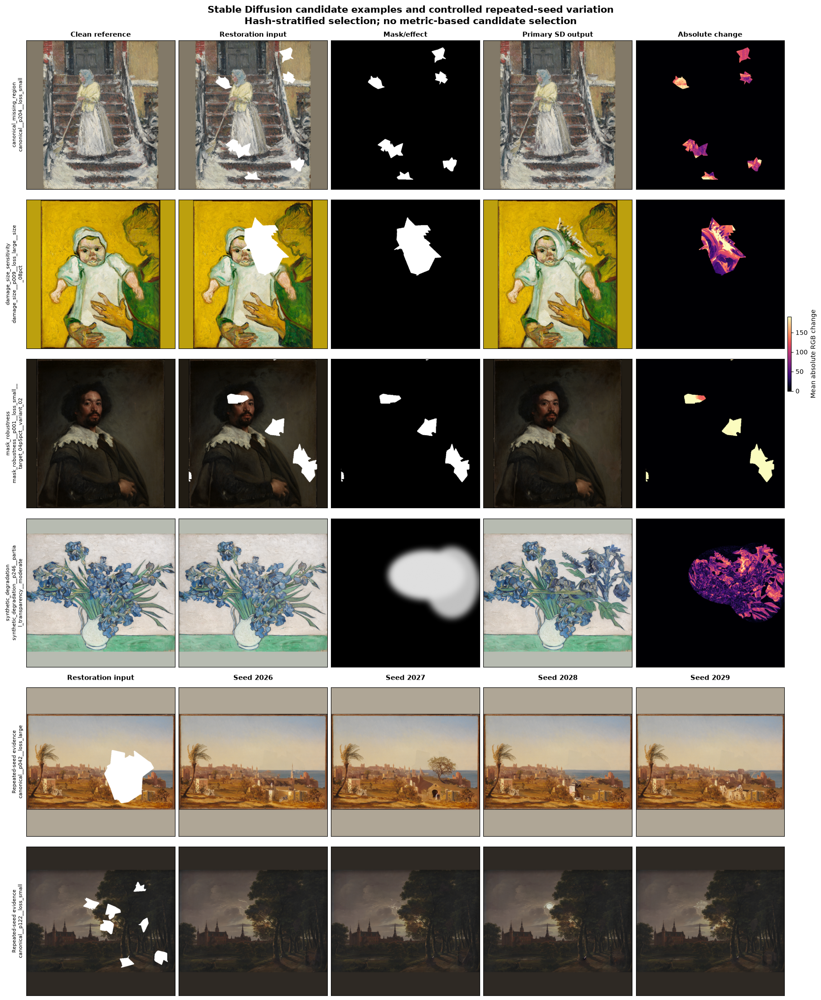

Candidate example figure persisted.
Path: outputs/11_stable_diffusion_restoration/figures/candidate_examples.png
Dimensions: (2717, 3307)
Format: PNG
Primary change-map maximum: 190.667


In [27]:
import os
import textwrap


def replace_file_with_retry(
    temporary_path,
    destination_path,
    maximum_attempts=10,
):
    retry_delay_seconds = 0.125

    for attempt in range(
        1,
        maximum_attempts + 1,
    ):
        try:
            os.replace(
                temporary_path,
                destination_path,
            )
            return
        except PermissionError:
            if attempt == maximum_attempts:
                raise

            time.sleep(retry_delay_seconds)

            retry_delay_seconds = min(
                retry_delay_seconds * 2,
                2.0,
            )


# ---------------------------------------------------------------------------
# Shared normalization for primary absolute-change panels
# ---------------------------------------------------------------------------

primary_change_values = np.concatenate(
    [
        row["input_change"].reshape(-1)
        for row in primary_visual_rows
    ]
)

primary_change_vmax = max(
    float(
        np.percentile(
            primary_change_values,
            99.0,
        )
    ),
    1.0,
)


# ---------------------------------------------------------------------------
# Combined primary and uncertainty figure
# ---------------------------------------------------------------------------

primary_row_count = len(
    primary_visual_rows
)

uncertainty_row_count = len(
    seed_variation_visual_rows
)

total_candidate_figure_rows = (
    primary_row_count
    + uncertainty_row_count
)

figure, axes = plt.subplots(
    nrows=total_candidate_figure_rows,
    ncols=5,
    figsize=(18, 22),
    constrained_layout=True,
)

primary_column_titles = [
    "Clean reference",
    "Restoration input",
    "Mask/effect",
    "Primary SD output",
    "Absolute change",
]

for column_index, title in enumerate(
    primary_column_titles
):
    axes[
        0,
        column_index,
    ].set_title(
        title,
        fontsize=11,
        fontweight="bold",
    )

difference_artist = None

for row_index, visual_row in enumerate(
    primary_visual_rows
):
    axes[row_index, 0].imshow(
        visual_row["clean"]
    )

    axes[row_index, 1].imshow(
        visual_row["input"]
    )

    axes[row_index, 2].imshow(
        visual_row["mask_or_effect"],
        cmap="gray",
        vmin=0,
        vmax=255,
    )

    axes[row_index, 3].imshow(
        visual_row["restored"]
    )

    difference_artist = axes[
        row_index,
        4,
    ].imshow(
        visual_row["input_change"],
        cmap="magma",
        vmin=0,
        vmax=primary_change_vmax,
    )

    axes[row_index, 0].set_ylabel(
        (
            str(
                visual_row[
                    "experiment_id"
                ]
            )
            + "\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=35,
            )
        ),
        fontsize=8,
    )

    for axis in axes[row_index, :]:
        axis.set_xticks([])
        axis.set_yticks([])

if difference_artist is None:
    raise RuntimeError(
        "No primary difference artist was created."
    )

figure.colorbar(
    difference_artist,
    ax=axes[
        :primary_row_count,
        4,
    ],
    orientation="vertical",
    fraction=0.025,
    pad=0.02,
    label="Mean absolute RGB change",
)

seed_column_titles = [
    "Restoration input",
    *[
        f"Seed {seed}"
        for seed in configured_uncertainty_seeds
    ],
]

first_uncertainty_row = (
    primary_row_count
)

for column_index, title in enumerate(
    seed_column_titles
):
    axes[
        first_uncertainty_row,
        column_index,
    ].set_title(
        title,
        fontsize=11,
        fontweight="bold",
        pad=12,
    )

for offset, visual_row in enumerate(
    seed_variation_visual_rows
):
    row_index = (
        first_uncertainty_row
        + offset
    )

    axes[row_index, 0].imshow(
        visual_row["input"]
    )

    for seed_offset, seed in enumerate(
        configured_uncertainty_seeds,
        start=1,
    ):
        axes[
            row_index,
            seed_offset,
        ].imshow(
            visual_row[
                "seed_outputs"
            ][seed]
        )

    axes[row_index, 0].set_ylabel(
        (
            "Repeated-seed evidence\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=35,
            )
        ),
        fontsize=8,
    )

    for axis in axes[row_index, :]:
        axis.set_xticks([])
        axis.set_yticks([])

figure.suptitle(
    (
        "Stable Diffusion candidate examples and "
        "controlled repeated-seed variation\n"
        "Hash-stratified selection; no metric-based "
        "candidate selection"
    ),
    fontsize=15,
    fontweight="bold",
)

OUTPUTS["candidate_examples"].parent.mkdir(
    parents=True,
    exist_ok=True,
)

temporary_candidate_figure_path = (
    OUTPUTS["candidate_examples"]
    .with_suffix(".tmp.png")
)

try:
    figure.savefig(
        temporary_candidate_figure_path,
        format="png",
        dpi=150,
        facecolor="white",
        bbox_inches="tight",
    )

    replace_file_with_retry(
        temporary_candidate_figure_path,
        OUTPUTS["candidate_examples"],
    )
finally:
    temporary_candidate_figure_path.unlink(
        missing_ok=True
    )

plt.show()
plt.close(figure)

with Image.open(
    OUTPUTS["candidate_examples"]
) as saved_figure:
    saved_figure.load()

    candidate_figure_width = (
        saved_figure.width
    )

    candidate_figure_height = (
        saved_figure.height
    )

    candidate_figure_mode = (
        saved_figure.mode
    )

    candidate_figure_format = (
        saved_figure.format
    )

print(
    "Candidate example figure persisted."
)
print(
    "Path:",
    to_repo_relative(
        OUTPUTS["candidate_examples"],
        PROJECT_ROOT,
    ),
)
print(
    "Dimensions:",
    (
        candidate_figure_width,
        candidate_figure_height,
    ),
)
print(
    "Format:",
    candidate_figure_format,
)
print(
    "Primary change-map maximum:",
    round(
        primary_change_vmax,
        3,
    ),
)

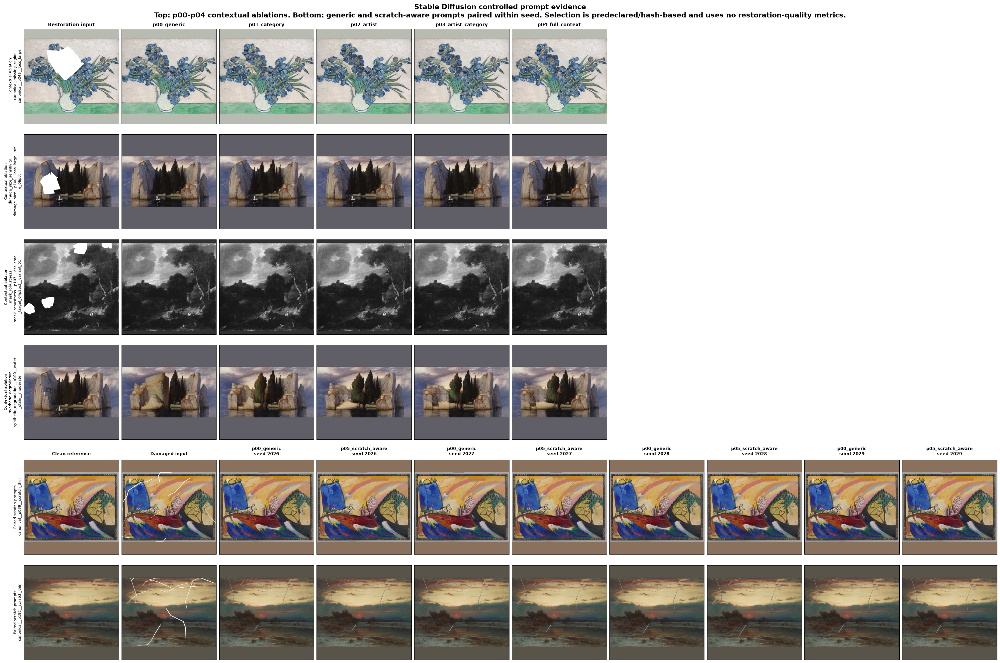

Prompt-comparison figure persisted.
Path: outputs/11_stable_diffusion_restoration/figures/prompt_comparison_examples.png
Dimensions: (4517, 2999)
Format: PNG
Contextual variants: ['p00_generic', 'p01_category', 'p02_artist', 'p03_artist_category', 'p04_full_context']
Scratch variants: ['p00_generic', 'p05_scratch_aware']
Scratch seeds: [2026, 2027, 2028, 2029]


In [28]:
# ---------------------------------------------------------------------------
# Combined contextual and paired scratch-prompt figure
# ---------------------------------------------------------------------------

contextual_row_count = len(
    contextual_prompt_visual_rows
)

scratch_row_count = len(
    scratch_prompt_visual_rows
)

prompt_figure_row_count = (
    contextual_row_count
    + scratch_row_count
)

prompt_figure_column_count = 10

prompt_figure, prompt_axes = plt.subplots(
    nrows=prompt_figure_row_count,
    ncols=prompt_figure_column_count,
    figsize=(30, 20),
    constrained_layout=True,
    squeeze=False,
)

for axis in prompt_axes.flat:
    axis.set_visible(False)


# ---------------------------------------------------------------------------
# Contextual section: input plus p00-p04
# ---------------------------------------------------------------------------

contextual_column_titles = [
    "Restoration input",
    *contextual_prompt_variant_ids,
]

for column_index, title in enumerate(
    contextual_column_titles
):
    prompt_axes[
        0,
        column_index,
    ].set_visible(True)

    prompt_axes[
        0,
        column_index,
    ].set_title(
        title,
        fontsize=10,
        fontweight="bold",
    )

for row_index, visual_row in enumerate(
    contextual_prompt_visual_rows
):
    input_axis = prompt_axes[
        row_index,
        0,
    ]

    input_axis.set_visible(True)
    input_axis.imshow(
        visual_row["input"]
    )

    for variant_offset, variant_id in enumerate(
        contextual_prompt_variant_ids,
        start=1,
    ):
        variant_axis = prompt_axes[
            row_index,
            variant_offset,
        ]

        variant_axis.set_visible(True)
        variant_axis.imshow(
            visual_row[
                "prompt_outputs"
            ][variant_id]
        )

    input_axis.set_ylabel(
        (
            "Contextual ablation\n"
            + str(
                visual_row[
                    "experiment_id"
                ]
            )
            + "\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=34,
            )
        ),
        fontsize=8,
    )

    for axis in prompt_axes[
        row_index,
        :len(contextual_column_titles),
    ]:
        axis.set_xticks([])
        axis.set_yticks([])


# ---------------------------------------------------------------------------
# Scratch section: clean/input plus both prompts at four seeds
# ---------------------------------------------------------------------------

first_scratch_row = contextual_row_count

scratch_column_titles = [
    "Clean reference",
    "Damaged input",
    *[
        (
            f"{prompt_variant_id}\n"
            f"seed {seed}"
        )
        for seed in configured_scratch_seeds
        for prompt_variant_id
        in scratch_prompt_variant_ids
    ],
]

for column_index, title in enumerate(
    scratch_column_titles
):
    prompt_axes[
        first_scratch_row,
        column_index,
    ].set_visible(True)

    prompt_axes[
        first_scratch_row,
        column_index,
    ].set_title(
        title,
        fontsize=9,
        fontweight="bold",
        pad=10,
    )

for scratch_offset, visual_row in enumerate(
    scratch_prompt_visual_rows
):
    row_index = (
        first_scratch_row
        + scratch_offset
    )

    clean_axis = prompt_axes[
        row_index,
        0,
    ]

    input_axis = prompt_axes[
        row_index,
        1,
    ]

    clean_axis.set_visible(True)
    input_axis.set_visible(True)

    clean_axis.imshow(
        visual_row["clean"]
    )

    input_axis.imshow(
        visual_row["input"]
    )

    output_column = 2

    for seed in configured_scratch_seeds:
        for prompt_variant_id in (
            scratch_prompt_variant_ids
        ):
            output_axis = prompt_axes[
                row_index,
                output_column,
            ]

            output_axis.set_visible(True)

            output_axis.imshow(
                visual_row[
                    "scratch_outputs"
                ][
                    (
                        seed,
                        prompt_variant_id,
                    )
                ]
            )

            output_column += 1

    clean_axis.set_ylabel(
        (
            "Paired scratch prompts\n"
            + textwrap.fill(
                str(
                    visual_row[
                        "case_id"
                    ]
                ),
                width=34,
            )
        ),
        fontsize=8,
    )

    for axis in prompt_axes[
        row_index,
        :,
    ]:
        if axis.get_visible():
            axis.set_xticks([])
            axis.set_yticks([])

prompt_figure.suptitle(
    (
        "Stable Diffusion controlled prompt evidence\n"
        "Top: p00-p04 contextual ablations. "
        "Bottom: generic and scratch-aware prompts paired "
        "within seed. Selection is predeclared/hash-based "
        "and uses no restoration-quality metrics."
    ),
    fontsize=15,
    fontweight="bold",
)

OUTPUTS[
    "prompt_comparison_examples"
].parent.mkdir(
    parents=True,
    exist_ok=True,
)

temporary_prompt_figure_path = (
    OUTPUTS[
        "prompt_comparison_examples"
    ]
    .with_suffix(".tmp.png")
)

try:
    prompt_figure.savefig(
        temporary_prompt_figure_path,
        format="png",
        dpi=150,
        facecolor="white",
        bbox_inches="tight",
    )

    replace_file_with_retry(
        temporary_prompt_figure_path,
        OUTPUTS[
            "prompt_comparison_examples"
        ],
    )
finally:
    temporary_prompt_figure_path.unlink(
        missing_ok=True
    )

plt.show()
plt.close(prompt_figure)

with Image.open(
    OUTPUTS[
        "prompt_comparison_examples"
    ]
) as saved_prompt_figure:
    saved_prompt_figure.load()

    prompt_figure_width = (
        saved_prompt_figure.width
    )

    prompt_figure_height = (
        saved_prompt_figure.height
    )

    prompt_figure_mode = (
        saved_prompt_figure.mode
    )

    prompt_figure_format = (
        saved_prompt_figure.format
    )

print(
    "Prompt-comparison figure persisted."
)
print(
    "Path:",
    to_repo_relative(
        OUTPUTS[
            "prompt_comparison_examples"
        ],
        PROJECT_ROOT,
    ),
)
print(
    "Dimensions:",
    (
        prompt_figure_width,
        prompt_figure_height,
    ),
)
print(
    "Format:",
    prompt_figure_format,
)
print(
    "Contextual variants:",
    contextual_prompt_variant_ids,
)
print(
    "Scratch variants:",
    scratch_prompt_variant_ids,
)
print(
    "Scratch seeds:",
    configured_scratch_seeds,
)

In [29]:
# ---------------------------------------------------------------------------
# Runtime and design contracts
# ---------------------------------------------------------------------------

runtime_scope_counts = (
    reloaded_runtime_summary_df[
        "summary_scope"
    ]
    .astype(str)
    .value_counts()
    .sort_index()
    .to_dict()
)

expected_runtime_scope_counts = {
    "overall": 1,
    "experiment": 4,
    "execution_role": 3,
    "prompt_variant": 6,
}

overall_runtime_df = (
    reloaded_runtime_summary_df.loc[
        reloaded_runtime_summary_df[
            "summary_scope"
        ].eq("overall")
    ]
)

runtime_numeric_columns = [
    "total_runtime_seconds",
    "mean_runtime_seconds",
    "median_runtime_seconds",
    "p95_runtime_seconds",
    "max_runtime_seconds",
    "throughput_cases_per_second",
]

runtime_numeric_values = (
    reloaded_runtime_summary_df[
        runtime_numeric_columns
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

runtime_values_valid = bool(
    np.isfinite(
        runtime_numeric_values.to_numpy(
            dtype=float
        )
    ).all()
    and runtime_numeric_values
    .ge(0)
    .all()
    .all()
)

overall_runtime_valid = bool(
    len(overall_runtime_df) == 1
    and int(
        overall_runtime_df.iloc[0][
            "case_count"
        ]
    )
    == EXPECTED_COUNTS[
        "candidate_count"
    ]
    and int(
        overall_runtime_df.iloc[0][
            "completed_count"
        ]
    )
    == EXPECTED_COUNTS[
        "candidate_count"
    ]
    and int(
        overall_runtime_df.iloc[0][
            "failed_count"
        ]
    )
    == 0
    and str(
        overall_runtime_df.iloc[0][
            "status"
        ]
    )
    == "completed"
)

prompt_design_component_counts = (
    reloaded_prompt_ablation_design_df
    .groupby(
        "design_component",
        sort=True,
    )
    .size()
    .to_dict()
)

expected_prompt_design_component_counts = {
    "prompt_ablation": 1115,
    "uncertainty": 240,
}

prompt_design_selection_counts = (
    reloaded_prompt_ablation_design_df
    .groupby(
        "selection_policy",
        sort=True,
    )
    .size()
    .to_dict()
)

expected_prompt_design_selection_counts = {
    "all_canonical_paintings_paired_non_metric.v1": 300,
    "deterministic_hash_stratified_non_metric.v1": 1055,
}


# ---------------------------------------------------------------------------
# Selected-candidate validation
# ---------------------------------------------------------------------------

selected_visual_candidate_ids = (
    set(
        primary_representative_candidates_df[
            "candidate_id"
        ].astype(str)
    )
    | set(
        seed_variation_candidates_df[
            "candidate_id"
        ].astype(str)
    )
    | set(
        contextual_prompt_candidates_df[
            "candidate_id"
        ].astype(str)
    )
    | set(
        scratch_prompt_visual_candidates_df[
            "candidate_id"
        ].astype(str)
    )
)

selected_visual_audit_df = (
    full_candidate_audit_df.loc[
        full_candidate_audit_df[
            "candidate_id"
        ]
        .astype(str)
        .isin(
            selected_visual_candidate_ids
        )
    ]
    .copy()
)

selected_visual_candidates_valid = bool(
    len(selected_visual_audit_df)
    == len(selected_visual_candidate_ids)
    and selected_visual_audit_df[
        "passed"
    ]
    .astype(bool)
    .all()
    and pd.to_numeric(
        selected_visual_audit_df[
            "outside_mask_changed_pixels"
        ],
        errors="coerce",
    )
    .eq(0)
    .all()
)

primary_visual_experiments = sorted(
    primary_representative_candidates_df[
        "experiment_id"
    ]
    .astype(str)
    .tolist()
)

contextual_visual_experiments = sorted(
    contextual_prompt_visual_cases_df[
        "experiment_id"
    ]
    .astype(str)
    .tolist()
)

uncertainty_seed_sets = {
    str(case_id): sorted(
        group["seed"]
        .astype(int)
        .unique()
        .tolist()
    )
    for case_id, group in (
        seed_variation_candidates_df
        .groupby(
            "case_id",
            sort=True,
        )
    )
}

scratch_seed_sets = {
    str(case_id): sorted(
        group["seed"]
        .astype(int)
        .unique()
        .tolist()
    )
    for case_id, group in (
        scratch_prompt_visual_candidates_df
        .groupby(
            "case_id",
            sort=True,
        )
    )
}

scratch_prompt_sets = {
    str(case_id): sorted(
        group[
            "prompt_variant_id"
        ]
        .astype(str)
        .unique()
        .tolist()
    )
    for case_id, group in (
        scratch_prompt_visual_candidates_df
        .groupby(
            "case_id",
            sort=True,
        )
    )
}

visual_selection_valid = bool(
    primary_visual_experiments
    == expected_visual_experiments
    and contextual_visual_experiments
    == expected_visual_experiments
    and len(
        uncertainty_visual_cases_df[
            "category"
        ].unique()
    )
    == 2
    and all(
        seed_set
        == configured_uncertainty_seeds
        for seed_set in (
            uncertainty_seed_sets.values()
        )
    )
    and scratch_smoke_case_id
    in scratch_visual_case_ids
    and len(
        scratch_visual_cases_df[
            "category"
        ].unique()
    )
    == 2
    and all(
        seed_set
        == configured_scratch_seeds
        for seed_set in (
            scratch_seed_sets.values()
        )
    )
    and all(
        prompt_set
        == sorted(
            scratch_prompt_variant_ids
        )
        for prompt_set in (
            scratch_prompt_sets.values()
        )
    )
    and not candidate_visual_selection_policy[
        "metric_columns_used"
    ]
)


# ---------------------------------------------------------------------------
# Figure and filesystem contracts
# ---------------------------------------------------------------------------

candidate_figure_valid = bool(
    OUTPUTS["candidate_examples"].is_file()
    and OUTPUTS[
        "candidate_examples"
    ].stat().st_size > 0
    and candidate_figure_format == "PNG"
    and candidate_figure_width >= 1000
    and candidate_figure_height >= 1000
)

prompt_figure_valid = bool(
    OUTPUTS[
        "prompt_comparison_examples"
    ].is_file()
    and OUTPUTS[
        "prompt_comparison_examples"
    ].stat().st_size > 0
    and prompt_figure_format == "PNG"
    and prompt_figure_width >= 1000
    and prompt_figure_height >= 1000
)

observed_metrics_files = {
    path.resolve()
    for path in OUTPUTS[
        "runtime_summary"
    ].parent.rglob("*")
    if path.is_file()
}

expected_metrics_files = {
    OUTPUTS[
        "runtime_summary"
    ].resolve(),
    OUTPUTS[
        "prompt_ablation_design"
    ].resolve(),
}

observed_figure_files = {
    path.resolve()
    for path in OUTPUTS[
        "candidate_examples"
    ].parent.rglob("*")
    if path.is_file()
}

expected_figure_files = {
    OUTPUTS[
        "candidate_examples"
    ].resolve(),
    OUTPUTS[
        "prompt_comparison_examples"
    ].resolve(),
}


# ---------------------------------------------------------------------------
# Register Batch 6 checks
# ---------------------------------------------------------------------------

# Make this validation cell safe to rerun without duplicating Batch 6 checks.
prior_validation_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != "batch_6_analysis_visualization"
]

VALIDATION = ValidationCollector()
VALIDATION.extend(prior_validation_checks)

def add_batch_6_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    VALIDATION.add(
        validation_stage=(
            "batch_6_analysis_visualization"
        ),
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_batch_6_check(
    check_id="runtime_summary_schema",
    description=(
        "The persisted runtime summary satisfies "
        "its exact normalized schema."
    ),
    expected={
        "schema_valid": True,
        "row_count": 14,
    },
    observed={
        "schema_valid": (
            reloaded_runtime_schema_exact
        ),
        "row_count": len(
            reloaded_runtime_summary_df
        ),
    },
    passed=(
        reloaded_runtime_schema_exact
        and len(
            reloaded_runtime_summary_df
        ) == 14
    ),
)

add_batch_6_check(
    check_id="runtime_summary_scopes",
    description=(
        "Runtime evidence covers overall, experiment, "
        "execution-role, and all six prompt-variant scopes."
    ),
    expected=expected_runtime_scope_counts,
    observed=runtime_scope_counts,
    passed=(
        runtime_scope_counts
        == expected_runtime_scope_counts
    ),
)

add_batch_6_check(
    check_id="runtime_completion_evidence",
    description=(
        "Runtime evidence records every candidate as "
        "completed with finite non-negative values."
    ),
    expected={
        "candidate_count": EXPECTED_COUNTS[
            "candidate_count"
        ],
        "failed_count": 0,
        "runtime_values_valid": True,
    },
    observed={
        "overall_runtime_valid": (
            overall_runtime_valid
        ),
        "runtime_values_valid": (
            runtime_values_valid
        ),
    },
    passed=(
        overall_runtime_valid
        and runtime_values_valid
    ),
)

add_batch_6_check(
    check_id="prompt_ablation_design",
    description=(
        "The persisted design records all base contextual, "
        "uncertainty, and paired scratch cases."
    ),
    expected={
        "schema_valid": True,
        "row_count": EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
        "component_counts": (
            expected_prompt_design_component_counts
        ),
        "selection_counts": (
            expected_prompt_design_selection_counts
        ),
    },
    observed={
        "schema_valid": (
            reloaded_prompt_design_schema_exact
        ),
        "row_count": len(
            reloaded_prompt_ablation_design_df
        ),
        "component_counts": (
            prompt_design_component_counts
        ),
        "selection_counts": (
            prompt_design_selection_counts
        ),
    },
    passed=(
        reloaded_prompt_design_schema_exact
        and len(
            reloaded_prompt_ablation_design_df
        )
        == EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ]
        == 1355
        and prompt_design_component_counts
        == expected_prompt_design_component_counts
        and prompt_design_selection_counts
        == expected_prompt_design_selection_counts
    ),
)

add_batch_6_check(
    check_id="metric_independent_visual_selection",
    description=(
        "All visual cases follow fixed predeclared or "
        "hash-stratified rules without quality metrics."
    ),
    expected={
        "primary_experiments": (
            expected_visual_experiments
        ),
        "contextual_experiments": (
            expected_visual_experiments
        ),
        "uncertainty_cases": 2,
        "scratch_cases": 2,
        "scratch_anchor": scratch_smoke_case_id,
        "metric_columns_used": [],
    },
    observed={
        "primary_experiments": (
            primary_visual_experiments
        ),
        "contextual_experiments": (
            contextual_visual_experiments
        ),
        "uncertainty_cases": len(
            uncertainty_visual_cases_df
        ),
        "uncertainty_seed_sets": (
            uncertainty_seed_sets
        ),
        "scratch_cases": len(
            scratch_visual_cases_df
        ),
        "scratch_case_ids": (
            scratch_visual_case_ids
        ),
        "scratch_seed_sets": (
            scratch_seed_sets
        ),
        "scratch_prompt_sets": (
            scratch_prompt_sets
        ),
        "metric_columns_used": (
            candidate_visual_selection_policy[
                "metric_columns_used"
            ]
        ),
    },
    passed=visual_selection_valid,
)

add_batch_6_check(
    check_id="scratch_visual_pair_contract",
    description=(
        "Both scratch visual cases include matched generic "
        "and scratch-aware outputs at all four seeds."
    ),
    expected={
        "cases": 2,
        "painting_seed_pairs": 8,
        "candidates": 16,
        "prompts_per_pair": 2,
    },
    observed={
        "cases": scratch_prompt_visual_candidates_df[
            "case_id"
        ].nunique(),
        "painting_seed_pairs": len(
            scratch_visual_pair_counts_df
        ),
        "candidates": len(
            scratch_prompt_visual_candidates_df
        ),
        "minimum_prompts_per_pair": int(
            scratch_visual_pair_counts_df[
                "prompt_count"
            ].min()
        ),
        "maximum_prompts_per_pair": int(
            scratch_visual_pair_counts_df[
                "prompt_count"
            ].max()
        ),
    },
    passed=(
        len(scratch_prompt_visual_candidates_df)
        == 16
        and len(
            scratch_visual_pair_counts_df
        ) == 8
        and scratch_visual_pair_counts_df[
            "candidate_count"
        ].eq(2).all()
        and scratch_visual_pair_counts_df[
            "prompt_count"
        ].eq(2).all()
    ),
)

add_batch_6_check(
    check_id="selected_candidate_validation",
    description=(
        "Every candidate rendered in the figures passed "
        "scientific validation and outside-mask invariance."
    ),
    expected={
        "selected_candidates": len(
            selected_visual_candidate_ids
        ),
        "failed_candidates": 0,
        "changed_outside_pixels": 0,
    },
    observed={
        "selected_candidates": len(
            selected_visual_audit_df
        ),
        "failed_candidates": int(
            (
                ~selected_visual_audit_df[
                    "passed"
                ].astype(bool)
            ).sum()
        ),
        "changed_outside_pixels": int(
            pd.to_numeric(
                selected_visual_audit_df[
                    "outside_mask_changed_pixels"
                ],
                errors="coerce",
            ).sum()
        ),
    },
    passed=selected_visual_candidates_valid,
)

add_batch_6_check(
    check_id="candidate_figure_contract",
    description=(
        "The candidate and repeated-seed figure is "
        "a readable, nonempty, detailed PNG."
    ),
    expected={
        "file_exists": True,
        "format": "PNG",
        "minimum_width": 1000,
        "minimum_height": 1000,
    },
    observed={
        "file_exists": OUTPUTS[
            "candidate_examples"
        ].is_file(),
        "file_size_bytes": (
            OUTPUTS[
                "candidate_examples"
            ].stat().st_size
            if OUTPUTS[
                "candidate_examples"
            ].is_file()
            else 0
        ),
        "format": candidate_figure_format,
        "width": candidate_figure_width,
        "height": candidate_figure_height,
        "mode": candidate_figure_mode,
    },
    passed=candidate_figure_valid,
)

add_batch_6_check(
    check_id="prompt_comparison_figure_contract",
    description=(
        "The contextual and paired scratch-prompt figure "
        "is a readable, nonempty, detailed PNG."
    ),
    expected={
        "file_exists": True,
        "format": "PNG",
        "minimum_width": 1000,
        "minimum_height": 1000,
    },
    observed={
        "file_exists": OUTPUTS[
            "prompt_comparison_examples"
        ].is_file(),
        "file_size_bytes": (
            OUTPUTS[
                "prompt_comparison_examples"
            ].stat().st_size
            if OUTPUTS[
                "prompt_comparison_examples"
            ].is_file()
            else 0
        ),
        "format": prompt_figure_format,
        "width": prompt_figure_width,
        "height": prompt_figure_height,
        "mode": prompt_figure_mode,
    },
    passed=prompt_figure_valid,
)

add_batch_6_check(
    check_id="analysis_output_filesystem_scope",
    description=(
        "Metrics and figures directories contain "
        "exactly the approved analysis outputs."
    ),
    expected={
        "metrics_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in expected_metrics_files
        ),
        "figure_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in expected_figure_files
        ),
    },
    observed={
        "metrics_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in observed_metrics_files
        ),
        "figure_files": sorted(
            to_repo_relative(
                path,
                PROJECT_ROOT,
            )
            for path in observed_figure_files
        ),
    },
    passed=(
        observed_metrics_files
        == expected_metrics_files
        and observed_figure_files
        == expected_figure_files
    ),
)

all_validation_checks_df = (
    VALIDATION.to_dataframe()
)

batch_6_checks_df = (
    all_validation_checks_df.loc[
        all_validation_checks_df[
            "validation_stage"
        ].eq(
            "batch_6_analysis_visualization"
        )
    ]
    .drop_duplicates(
        subset=["check_id"],
        keep="last",
    )
    .reset_index(drop=True)
)

VALIDATION.raise_for_blocking()

print(
    "Batch 6 validation checks:"
)

display(
    batch_6_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "\nVisual selection policy:"
)
print(
    json.dumps(
        candidate_visual_selection_policy,
        indent=2,
    )
)

print(
    "\nBatch 6 completed successfully."
)
print(
    "Checks:",
    len(batch_6_checks_df),
)
print(
    "Passed:",
    int(
        batch_6_checks_df[
            "passed"
        ]
        .astype(bool)
        .sum()
    ),
)
print(
    "Runtime-summary rows:",
    len(reloaded_runtime_summary_df),
)
print(
    "Prompt-design rows:",
    len(
        reloaded_prompt_ablation_design_df
    ),
)
print(
    "Selected visual candidates:",
    len(selected_visual_candidate_ids),
)
print(
    "Next approved stage: Batch 7 — canonical "
    "candidate/prompt persistence, prompt-policy report, "
    "manifests, and validation handoff."
)

Batch 6 validation checks:


,check_id,expected,observed,passed
0,runtime_summary_schema,"{""row_count"": 14, ""schema_valid"": true}","{""row_count"": 14, ""schema_valid"": true}",True
1,runtime_summary_scopes,"{""execution_role"": 3, ""experiment"": 4, ""overal...","{""execution_role"": 3, ""experiment"": 4, ""overal...",True
2,runtime_completion_evidence,"{""candidate_count"": 8520, ""failed_count"": 0, ""...","{""overall_runtime_valid"": true, ""runtime_value...",True
3,prompt_ablation_design,"{""component_counts"": {""prompt_ablation"": 1115,...","{""component_counts"": {""prompt_ablation"": 1115,...",True
4,metric_independent_visual_selection,"{""contextual_experiments"": [""canonical_missing...","{""contextual_experiments"": [""canonical_missing...",True
5,scratch_visual_pair_contract,"{""candidates"": 16, ""cases"": 2, ""painting_seed_...","{""candidates"": 16, ""cases"": 2, ""maximum_prompt...",True
6,selected_candidate_validation,"{""changed_outside_pixels"": 0, ""failed_candidat...","{""changed_outside_pixels"": 0, ""failed_candidat...",True
7,candidate_figure_contract,"{""file_exists"": true, ""format"": ""PNG"", ""minimu...","{""file_exists"": true, ""file_size_bytes"": 74416...",True
8,prompt_comparison_figure_contract,"{""file_exists"": true, ""format"": ""PNG"", ""minimu...","{""file_exists"": true, ""file_size_bytes"": 75355...",True
9,analysis_output_filesystem_scope,"{""figure_files"": [""outputs/11_stable_diffusion...","{""figure_files"": [""outputs/11_stable_diffusion...",True



Visual selection policy:
{
  "policy_id": "sd15_visual_selection_hash_stratified.v2",
  "primary_rule": "one non-zero primary candidate per experiment, minimum SHA-256 rank",
  "uncertainty_rule": "two distinct-category uncertainty cases, minimum SHA-256 rank",
  "contextual_prompt_rule": "one base prompt-ablation case per experiment, minimum SHA-256 rank",
  "scratch_prompt_rule": "predeclared p039 smoke anchor plus one minimum-SHA-256 case from a distinct category",
  "scratch_prompt_seed_rule": "render both approved prompt arms at all four frozen seeds",
  "metric_columns_used": []
}

Batch 6 completed successfully.
Checks: 10
Passed: 10
Runtime-summary rows: 14
Prompt-design rows: 1355
Selected visual candidates: 48
Next approved stage: Batch 7 — canonical candidate/prompt persistence, prompt-policy report, manifests, and validation handoff.


## Batch 7 — Canonical Persistence and Provisional Handoff

This batch persists and validates the complete downstream-facing Notebook 11 handoff:

- `data/candidates.csv`;
- `data/prompt_policy.csv`;
- `images/restored/<experiment_id>/<case_id>/<candidate_id>.png`;
- `metrics/runtime_summary.csv`;
- `metrics/prompt_ablation_design.csv`;
- `figures/candidate_examples.png`;
- `figures/prompt_comparison_examples.png`;
- `reports/prompt_policy.md`;
- `validation/checks.csv`;
- `manifests/artifacts.csv`;
- `manifests/run_manifest.json`.

The artifact manifest contains nine records. The run manifest remains provisionally `running` until Batch 8 completes the roadmap audit, final completion gate, project-path registry update, and work-directory cleanup.

The checkpoint and eight smoke-test files remain isolated under `work/` and are not canonical outputs.

The run-manifest count projection records the effective schema-compatible execution roles—4,460 `prompt_context` and 1,440 `uncertainty_extension` candidates—without altering the generation configuration fingerprint stored by the completed candidates.

In [30]:
from restoration_eval.manifests import (
    RUN_MANIFEST_SCHEMA_VERSION,
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    configuration_checksums,
    sha256_path,
    write_artifact_manifest,
    write_run_manifest,
)

from restoration_eval.schemas import (
    RUN_MANIFEST_REQUIRED_KEYS,
)


# ---------------------------------------------------------------------------
# Approved validation and output cardinalities
# ---------------------------------------------------------------------------

EXPECTED_VALIDATION_STAGE_COUNTS = {
    "batch_1_preflight": 83,
    "batch_2_input_design": 40,
    "batch_3_smoke_inference": 18,
    "batch_4_full_execution": 14,
    "batch_5_scientific_validation": 11,
    "batch_6_analysis_visualization": 10,
}

EXPECTED_CONSOLIDATED_VALIDATION_ROWS = sum(
    EXPECTED_VALIDATION_STAGE_COUNTS.values()
)

EXPECTED_ARTIFACT_RECORD_COUNT = int(
    EXPECTED_COUNTS[
        "artifact_record_count"
    ]
)

EXPECTED_CANONICAL_OUTPUT_FILE_COUNT = int(
    EXPECTED_COUNTS[
        "total_output_file_count_without_failure_logs"
    ]
)

EXPECTED_WORK_FILE_COUNT = 9
EXPECTED_SMOKE_WORK_FILE_COUNT = 8

# These are manifest reporting expectations only. They do not
# mutate sd_config or its generation fingerprint.
MANIFEST_EXPECTED_COUNTS = {
    **EXPECTED_COUNTS,
    "prompt_context_candidate_count": 4460,
    "uncertainty_extension_candidate_count": 1440,
}


# ---------------------------------------------------------------------------
# Consolidate Batch 1–6 validation evidence
# ---------------------------------------------------------------------------

if not VALIDATION.overall_passed:
    raise RuntimeError(
        "The cumulative Notebook 11 blocking "
        "validation gate has not passed."
    )

validation_checks_df = (
    VALIDATION.to_dataframe()
    .drop_duplicates(
        subset=[
            "validation_stage",
            "check_id",
        ],
        keep="last",
    )
    .reset_index(drop=True)
)

observed_validation_stage_counts = {
    str(validation_stage): int(count)
    for validation_stage, count in (
        validation_checks_df[
            "validation_stage"
        ]
        .value_counts()
        .sort_index()
        .items()
    )
}

if (
    observed_validation_stage_counts
    != EXPECTED_VALIDATION_STAGE_COUNTS
):
    raise RuntimeError(
        "Consolidated validation-stage counts do not "
        "match the approved Batch 1–6 contract. "
        f"Observed: {observed_validation_stage_counts}"
    )

validation_schema_result = validate_dataframe(
    validation_checks_df,
    VALIDATION_CHECKS_SCHEMA,
    allow_extra_columns=False,
)

validation_schema_exact = bool(
    validation_schema_result.passed
    and not validation_schema_result.unexpected_columns
)

if not validation_schema_exact:
    raise RuntimeError(
        "Consolidated validation evidence does not "
        "match validation_checks.v1."
    )

if (
    len(validation_checks_df)
    != EXPECTED_CONSOLIDATED_VALIDATION_ROWS
):
    raise RuntimeError(
        "Unexpected consolidated validation count: "
        f"{len(validation_checks_df)}."
    )

blocking_failure_mask = (
    validation_checks_df[
        "severity"
    ]
    .astype(str)
    .eq("blocking")
    & ~validation_checks_df[
        "passed"
    ].astype(bool)
)

warning_mask = (
    validation_checks_df[
        "severity"
    ]
    .astype(str)
    .eq("warning")
)

warning_failure_mask = (
    warning_mask
    & ~validation_checks_df[
        "passed"
    ].astype(bool)
)

blocking_validation_passed = bool(
    not blocking_failure_mask.any()
)

warning_check_count = int(
    warning_mask.sum()
)

warning_failure_count = int(
    warning_failure_mask.sum()
)


# ---------------------------------------------------------------------------
# Validate ownership of every declared path
# ---------------------------------------------------------------------------

output_ownership_failures = []

for output_key, output_path in OUTPUTS.items():
    try:
        validated_path = require_notebook_output_path(
            output_path,
            NOTEBOOK_STEM,
            PROJECT_ROOT,
        )

        if validated_path != output_path.resolve():
            output_ownership_failures.append(
                {
                    "output_key": output_key,
                    "path": str(output_path),
                    "issue": "resolved_path_mismatch",
                }
            )

    except Exception as exc:
        output_ownership_failures.append(
            {
                "output_key": output_key,
                "path": str(output_path),
                "issue": (
                    f"{type(exc).__name__}: {exc}"
                ),
            }
        )

if output_ownership_failures:
    raise RuntimeError(
        "One or more Notebook 11 paths violate "
        f"output ownership: {output_ownership_failures}"
    )


# ---------------------------------------------------------------------------
# Canonical candidate and prompt-policy tables
# ---------------------------------------------------------------------------

canonical_candidates_df = (
    validation_candidates_df
    .copy()
    .reset_index(drop=True)
)

canonical_prompt_policy_df = (
    prompt_policy_df
    .copy()
    .reset_index(drop=True)
)

canonical_candidate_schema_result = validate_dataframe(
    canonical_candidates_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

canonical_prompt_schema_result = validate_dataframe(
    canonical_prompt_policy_df,
    PROMPT_POLICY_SCHEMA,
    allow_extra_columns=False,
)

if not (
    canonical_candidate_schema_result.passed
    and not canonical_candidate_schema_result.unexpected_columns
):
    raise RuntimeError(
        "Canonical candidates violate their exact schema."
    )

if not (
    canonical_prompt_schema_result.passed
    and not canonical_prompt_schema_result.unexpected_columns
):
    raise RuntimeError(
        "Canonical prompt policy violates its exact schema."
    )


# ---------------------------------------------------------------------------
# Build the documented prompt-policy report
# ---------------------------------------------------------------------------

prompt_report_lines = [
    "# Stable Diffusion Prompt Policy",
    "",
    "## Scope",
    "",
    (
        "This report documents the fixed Stable Diffusion "
        "prompt policy, contextual prompt ablation, paired "
        "scratch-aware prompt experiment, repeated-seed "
        "design, and known methodological limitations used "
        "by Notebook 11."
    ),
    "",
    f"- Base configuration: `{BASE_CONFIG_PATH.relative_to(PROJECT_ROOT).as_posix()}`",
    f"- Scratch supplement: `{SCRATCH_CONFIG_PATH.relative_to(PROJECT_ROOT).as_posix()}`",
    f"- Model: `{configured_model['hf_model_id']}`",
    f"- Pinned revision: `{configured_model['model_revision']}`",
    f"- Configuration ID: `{configured_model['configuration_id']}`",
    f"- Effective prompt policy ID: `{configured_prompt_policy['policy_id']}`",
    f"- Scheduler: `{configured_model['scheduler']}`",
    f"- Inference steps: `{configured_model['num_inference_steps']}`",
    f"- Guidance scale: `{configured_model['guidance_scale']}`",
    f"- Strength: `{configured_model['strength']}`",
    f"- Precision/device: `{configured_model['precision']}` / `{EFFECTIVE_DEVICE}`",
    f"- Primary seed: `{configured_design['primary_seed']}`",
    (
        "- Frozen repeated seeds: `"
        + ", ".join(
            str(seed)
            for seed in configured_scratch_seeds
        )
        + "`"
    ),
    "",
    "## Primary Generic Prompt",
    "",
    base_sd_config[
        "prompt_policy"
    ][
        "generic_prompt"
    ],
    "",
    "## Base Negative Prompt",
    "",
    base_sd_config[
        "prompt_policy"
    ][
        "negative_prompt"
    ],
    "",
    "## Scratch-Aware Treatment",
    "",
    (
        "The positive treatment describes the desired "
        "complete and visually continuous repaired state:"
    ),
    "",
    configured_scratch_policy[
        "positive_prompt"
    ],
    "",
    (
        "The following morphology terms are appended to "
        "the negative prompt:"
    ),
    "",
    configured_scratch_policy[
        "negative_prompt_extension"
    ],
    "",
    "## Controlled Prompt Variants",
    "",
    (
        "| Variant | Family | Primary | Requires metadata | "
        "Metadata fields | Template |"
    ),
    "|---|---|---:|---:|---|---|",
]

for prompt_row in (
    canonical_prompt_policy_df
    .sort_values(
        "variant_order",
        kind="stable",
    )
    .to_dict(orient="records")
):
    prompt_report_lines.append(
        "| "
        + str(
            prompt_row[
                "prompt_variant_id"
            ]
        ).replace("|", "\\|")
        + " | "
        + str(
            prompt_row[
                "variant_family"
            ]
        ).replace("|", "\\|")
        + " | "
        + str(
            prompt_row[
                "is_primary"
            ]
        )
        + " | "
        + str(
            prompt_row[
                "requires_metadata"
            ]
        )
        + " | "
        + str(
            prompt_row[
                "metadata_fields"
            ]
        ).replace("|", "\\|")
        + " | "
        + str(
            prompt_row[
                "prompt_template"
            ]
        ).replace("|", "\\|")
        + " |"
    )

prompt_report_lines.extend(
    [
        "",
        "## Candidate Design",
        "",
        f"- Eligible primary candidates: `{MANIFEST_EXPECTED_COUNTS['primary_candidate_count']}`",
        f"- Schema-compatible prompt-context candidates: `{MANIFEST_EXPECTED_COUNTS['prompt_context_candidate_count']}`",
        f"- Schema-compatible uncertainty extensions: `{MANIFEST_EXPECTED_COUNTS['uncertainty_extension_candidate_count']}`",
        f"- Total candidates: `{MANIFEST_EXPECTED_COUNTS['candidate_count']}`",
        f"- Model inferences: `{MANIFEST_EXPECTED_COUNTS['model_inference_candidate_count']}`",
        f"- Identity zero controls: `{MANIFEST_EXPECTED_COUNTS['zero_control_case_count']}`",
        "",
        "### Formal Paired Scratch Experiment",
        "",
        "- Paintings: `300` canonical controlled paintings.",
        "- Damage case: `scratch_thin`.",
        "- Prompt arms: `p00_generic`, `p05_scratch_aware`.",
        "- Seeds: `2026`, `2027`, `2028`, `2029`.",
        "- Painting-seed pairs: `1,200`.",
        "- Formal paired outcomes: `2,400`.",
        "- Added generic seed controls: `720`.",
        "- Added scratch-aware candidates: `1,200`.",
        (
            "- Formal selection policy: "
            "`all_canonical_paintings_paired_non_metric.v1`."
        ),
        (
            "- Painting is the independent experimental unit; "
            "seeds are repeated observations nested within paintings."
        ),
        (
            "- Both prompt arms are preserved for every painting-seed "
            "pair. No best seed, prompt, painting, or candidate is "
            "selected using restoration-quality metrics."
        ),
        (
            "- Contextual variants p01–p04 remain exploratory "
            "conditioning evidence and are not part of the formal "
            "two-arm scratch contrast."
        ),
        "",
        "## Selection Policies",
        "",
        (
            "- Base candidate-selection policy: `"
            + str(
                configured_design[
                    "selection_policy"
                ]
            )
            + "`."
        ),
        (
            "- Scratch candidate-selection policy: `"
            + str(
                configured_scratch_design[
                    "selection_policy"
                ]
            )
            + "`."
        ),
        (
            "- Visual-selection policy: `"
            + str(
                candidate_visual_selection_policy[
                    "policy_id"
                ]
            )
            + "`."
        ),
        "- Metric columns used for selection: none.",
        "",
        "## Execution and Compositing",
        "",
        f"- Compositing policy: `{configured_model['compositing_policy']}`.",
        f"- Zero-control policy: `{configured_model['zero_control_policy']}`.",
        f"- Safety-checker policy: `{configured_model['safety_checker_policy']}`.",
        (
            "- Retry policy: at most "
            f"`{configured_model['maximum_retries']}` retry with "
            "the exact declared seed."
        ),
        "",
        "## Thin-Scratch Limitation",
        "",
        (
            "Canonical thin scratches are only a few pixels wide at "
            "768 × 768. Their spatial support can shrink or fragment "
            "during 512-pixel preprocessing and latent-grid mask "
            "resampling. Exact compositing can consequently reveal "
            "generated colour or texture mismatch as a narrow grey "
            "or dark line. Prompting tests semantic mitigation; it "
            "does not change or solve the underlying spatial-resolution "
            "constraint."
        ),
        "",
        "## Downstream Metric Responsibility",
        "",
        (
            "Downstream metric notebooks must compute restoration "
            "quality for both prompt arms, preserve the paired "
            "(case_id, seed) structure, aggregate the four repeated "
            "seeds within each painting, quantify painting-level "
            "consistency, and relate the results to mask and boundary "
            "geometry."
        ),
        "",
        "Notebook 11 performs no restoration-quality-based ranking.",
        "",
        "## Known Limitations",
        "",
    ]
)

for limitation in sd_config[
    "known_limitations"
]:
    prompt_report_lines.append(
        "- " + str(limitation)
    )

prompt_report_lines.extend(
    [
        "",
        "## Interpretation",
        "",
        (
            "Stable Diffusion candidates are plausible, "
            "prompt-conditioned inpaintings. They are not "
            "historically verified reconstructions and must "
            "not be treated as autonomous conservation decisions."
        ),
        "",
    ]
)

prompt_policy_report_text = (
    "\n".join(prompt_report_lines)
)

temporary_report_path = (
    OUTPUTS["prompt_policy_report"]
    .with_suffix(".md.tmp")
)

try:
    temporary_report_path.write_text(
        prompt_policy_report_text,
        encoding="utf-8",
        newline="\n",
    )

    replace_file_with_retry(
        temporary_report_path,
        OUTPUTS["prompt_policy_report"],
    )
finally:
    temporary_report_path.unlink(
        missing_ok=True
    )


# ---------------------------------------------------------------------------
# Atomically persist canonical tables
# ---------------------------------------------------------------------------

canonical_table_specs = [
    (
        canonical_candidates_df,
        OUTPUTS["candidates"],
    ),
    (
        canonical_prompt_policy_df,
        OUTPUTS["prompt_policy"],
    ),
    (
        validation_checks_df,
        OUTPUTS["validation_checks"],
    ),
]

for dataframe, output_path in canonical_table_specs:
    temporary_path = output_path.with_suffix(
        output_path.suffix + ".tmp"
    )

    try:
        dataframe.to_csv(
            temporary_path,
            index=False,
            lineterminator="\n",
        )

        replace_file_with_retry(
            temporary_path,
            output_path,
        )
    finally:
        temporary_path.unlink(
            missing_ok=True
        )

print(
    "Canonical tables and prompt-policy report persisted."
)
print(
    "Candidate rows:",
    len(canonical_candidates_df),
)
print(
    "Prompt-policy rows:",
    len(canonical_prompt_policy_df),
)
print(
    "Consolidated validation rows:",
    len(validation_checks_df),
)
print(
    "Blocking failures:",
    int(blocking_failure_mask.sum()),
)
print(
    "Warning checks:",
    warning_check_count,
)
print(
    "Warning failures:",
    warning_failure_count,
)
print(
    "Validation-stage counts:",
    observed_validation_stage_counts,
)
print(
    "Prompt-policy report bytes:",
    OUTPUTS[
        "prompt_policy_report"
    ].stat().st_size,
)

Canonical tables and prompt-policy report persisted.
Candidate rows: 8520
Prompt-policy rows: 6
Consolidated validation rows: 176
Blocking failures: 0
Warning checks: 0
Warning failures: 0
Validation-stage counts: {'batch_1_preflight': 83, 'batch_2_input_design': 40, 'batch_3_smoke_inference': 18, 'batch_4_full_execution': 14, 'batch_5_scientific_validation': 11, 'batch_6_analysis_visualization': 10}
Prompt-policy report bytes: 7841


In [31]:
# ---------------------------------------------------------------------------
# Independently reload every canonical table
# ---------------------------------------------------------------------------

candidates_reloaded_df = pd.read_csv(
    OUTPUTS["candidates"],
    keep_default_na=False,
    low_memory=False,
)

prompt_policy_reloaded_df = pd.read_csv(
    OUTPUTS["prompt_policy"],
    keep_default_na=False,
)

runtime_summary_reloaded_df = pd.read_csv(
    OUTPUTS["runtime_summary"],
    keep_default_na=False,
)

prompt_design_reloaded_df = pd.read_csv(
    OUTPUTS["prompt_ablation_design"],
    keep_default_na=False,
)

validation_checks_reloaded_df = pd.read_csv(
    OUTPUTS["validation_checks"],
    keep_default_na=False,
)

candidate_reload_result = validate_dataframe(
    candidates_reloaded_df,
    STABLE_DIFFUSION_CANDIDATES_SCHEMA,
    allow_extra_columns=False,
)

prompt_policy_reload_result = validate_dataframe(
    prompt_policy_reloaded_df,
    PROMPT_POLICY_SCHEMA,
    allow_extra_columns=False,
)

runtime_summary_reload_result = validate_dataframe(
    runtime_summary_reloaded_df,
    RESTORATION_RUNTIME_SUMMARY_SCHEMA,
    allow_extra_columns=False,
)

prompt_design_reload_result = validate_dataframe(
    prompt_design_reloaded_df,
    PROMPT_ABLATION_DESIGN_SCHEMA,
    allow_extra_columns=False,
)

validation_checks_reload_result = validate_dataframe(
    validation_checks_reloaded_df,
    VALIDATION_CHECKS_SCHEMA,
    allow_extra_columns=False,
)


# ---------------------------------------------------------------------------
# Stable identity and reload signatures
# ---------------------------------------------------------------------------

expected_candidate_signatures = {
    str(row["candidate_id"]): (
        str(row["restored_path"]),
        str(row["restored_sha256"]),
        str(row["status"]),
        str(row["configuration_fingerprint"]),
    )
    for _, row in canonical_candidates_df.iterrows()
}

reloaded_candidate_signatures = {
    str(row["candidate_id"]): (
        str(row["restored_path"]),
        str(row["restored_sha256"]),
        str(row["status"]),
        str(row["configuration_fingerprint"]),
    )
    for _, row in candidates_reloaded_df.iterrows()
}

expected_prompt_signatures = {
    (
        str(row["prompt_policy_id"]),
        str(row["prompt_variant_id"]),
    ): (
        str(row["prompt_template"]),
        str(row["negative_prompt"]),
        str(row["status"]),
    )
    for _, row in canonical_prompt_policy_df.iterrows()
}

reloaded_prompt_signatures = {
    (
        str(row["prompt_policy_id"]),
        str(row["prompt_variant_id"]),
    ): (
        str(row["prompt_template"]),
        str(row["negative_prompt"]),
        str(row["status"]),
    )
    for _, row in prompt_policy_reloaded_df.iterrows()
}

expected_validation_keys = {
    (
        str(row["validation_stage"]),
        str(row["check_id"]),
    )
    for _, row in validation_checks_df.iterrows()
}

reloaded_validation_keys = {
    (
        str(row["validation_stage"]),
        str(row["check_id"]),
    )
    for _, row in validation_checks_reloaded_df.iterrows()
}

reloaded_blocking_failure_mask = (
    validation_checks_reloaded_df[
        "severity"
    ]
    .astype(str)
    .eq("blocking")
    & ~validation_checks_reloaded_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

reloaded_blocking_checks_passed = bool(
    not reloaded_blocking_failure_mask.any()
)


# ---------------------------------------------------------------------------
# Restored-image, report, figure, and work evidence
# ---------------------------------------------------------------------------

persisted_restored_files = {
    path.resolve()
    for path in OUTPUTS[
        "restored_images"
    ].rglob("*")
    if path.is_file()
}

expected_persisted_restored_files = {
    (
        OUTPUT_ROOT
        / str(relative_path)
    ).resolve()
    for relative_path in (
        candidates_reloaded_df[
            "restored_path"
        ].astype(str)
    )
}

persisted_figure_evidence = {}

for figure_key in (
    "candidate_examples",
    "prompt_comparison_examples",
):
    figure_path = OUTPUTS[figure_key]

    with Image.open(
        figure_path
    ) as persisted_figure:
        persisted_figure.load()

        persisted_figure_evidence[
            figure_key
        ] = {
            "format": str(
                persisted_figure.format
            ),
            "mode": str(
                persisted_figure.mode
            ),
            "width": int(
                persisted_figure.width
            ),
            "height": int(
                persisted_figure.height
            ),
            "size_bytes": int(
                figure_path.stat().st_size
            ),
            "sha256": sha256_file(
                figure_path
            ),
        }

persisted_prompt_report_text = (
    OUTPUTS["prompt_policy_report"]
    .read_text(
        encoding="utf-8",
    )
)

WORK_ROOT = (
    OUTPUT_ROOT / "work"
).resolve()

observed_work_files = {
    path.resolve()
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
}

observed_smoke_work_files = {
    path.resolve()
    for path in OUTPUTS[
        "smoke_directory"
    ].rglob("*")
    if path.is_file()
}

required_work_control_files = {
    OUTPUTS["checkpoint"].resolve(),
}

temporary_work_files = {
    path
    for path in observed_work_files
    if (
        ".tmp" in path.name.lower()
        or ".staging" in path.name.lower()
        or path.suffix.lower()
        in {
            ".temp",
            ".part",
        }
    )
}


# ---------------------------------------------------------------------------
# Persistence conditions
# ---------------------------------------------------------------------------

candidate_reload_valid = bool(
    candidate_reload_result.passed
    and not candidate_reload_result.unexpected_columns
    and len(candidates_reloaded_df)
    == MANIFEST_EXPECTED_COUNTS[
        "candidate_count"
    ]
    and candidates_reloaded_df[
        "candidate_id"
    ].is_unique
    and reloaded_candidate_signatures
    == expected_candidate_signatures
    and candidates_reloaded_df[
        "status"
    ]
    .astype(str)
    .eq("completed")
    .all()
)

prompt_policy_reload_valid = bool(
    prompt_policy_reload_result.passed
    and not prompt_policy_reload_result.unexpected_columns
    and len(prompt_policy_reloaded_df)
    == MANIFEST_EXPECTED_COUNTS[
        "prompt_policy_row_count"
    ]
    and reloaded_prompt_signatures
    == expected_prompt_signatures
)

analysis_tables_reload_valid = bool(
    runtime_summary_reload_result.passed
    and not runtime_summary_reload_result.unexpected_columns
    and prompt_design_reload_result.passed
    and not prompt_design_reload_result.unexpected_columns
    and len(runtime_summary_reloaded_df) == 14
    and len(prompt_design_reloaded_df)
    == MANIFEST_EXPECTED_COUNTS[
        "prompt_ablation_design_row_count"
    ]
)

validation_reload_valid = bool(
    validation_checks_reload_result.passed
    and not validation_checks_reload_result.unexpected_columns
    and len(validation_checks_reloaded_df)
    == EXPECTED_CONSOLIDATED_VALIDATION_ROWS
    and reloaded_validation_keys
    == expected_validation_keys
    and reloaded_blocking_checks_passed
)

restored_directory_valid = bool(
    len(persisted_restored_files)
    == MANIFEST_EXPECTED_COUNTS[
        "restored_file_count"
    ]
    and persisted_restored_files
    == expected_persisted_restored_files
)

figures_reload_valid = bool(
    len(persisted_figure_evidence) == 2
    and all(
        evidence["format"] == "PNG"
        and evidence["width"] >= 1000
        and evidence["height"] >= 1000
        and evidence["size_bytes"] > 0
        for evidence in (
            persisted_figure_evidence.values()
        )
    )
)

prompt_report_valid = bool(
    OUTPUTS[
        "prompt_policy_report"
    ].is_file()
    and OUTPUTS[
        "prompt_policy_report"
    ].stat().st_size > 0
    and "# Stable Diffusion Prompt Policy"
    in persisted_prompt_report_text
    and configured_prompt_policy[
        "policy_id"
    ]
    in persisted_prompt_report_text
    and configured_model[
        "model_revision"
    ]
    in persisted_prompt_report_text
    and "Metric columns used for selection: none."
    in persisted_prompt_report_text
    and "Painting is the independent experimental unit"
    in persisted_prompt_report_text
    and "Downstream metric notebooks"
    in persisted_prompt_report_text
    and "spatial support can shrink or fragment"
    in persisted_prompt_report_text
)

work_isolation_valid = bool(
    len(observed_work_files)
    == EXPECTED_WORK_FILE_COUNT
    and len(observed_smoke_work_files)
    == EXPECTED_SMOKE_WORK_FILE_COUNT
    and required_work_control_files.issubset(
        observed_work_files
    )
    and observed_work_files
    == (
        observed_smoke_work_files
        | required_work_control_files
    )
    and not temporary_work_files
)


# ---------------------------------------------------------------------------
# Separate persistence validation layer
# ---------------------------------------------------------------------------

PERSISTENCE_VALIDATION = ValidationCollector()


def add_persistence_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    PERSISTENCE_VALIDATION.add(
        validation_stage="canonical_persistence",
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_persistence_check(
    check_id="output_path_ownership",
    description=(
        "Every declared Notebook 11 path resolves "
        "inside its owned output root."
    ),
    expected={
        "ownership_failures": 0,
    },
    observed={
        "ownership_failures": len(
            output_ownership_failures
        ),
    },
    passed=(
        not output_ownership_failures
    ),
    details=output_ownership_failures,
)

add_persistence_check(
    check_id="candidates_csv_reload",
    description=(
        "candidates.csv reloads with all 8520 "
        "normalized completed candidates."
    ),
    expected={
        "rows": MANIFEST_EXPECTED_COUNTS[
            "candidate_count"
        ],
        "unique_candidate_ids": (
            MANIFEST_EXPECTED_COUNTS[
                "candidate_count"
            ]
        ),
        "signatures_match": True,
    },
    observed={
        "rows": len(
            candidates_reloaded_df
        ),
        "unique_candidate_ids": int(
            candidates_reloaded_df[
                "candidate_id"
            ].nunique()
        ),
        "signatures_match": (
            reloaded_candidate_signatures
            == expected_candidate_signatures
        ),
    },
    passed=candidate_reload_valid,
)

add_persistence_check(
    check_id="prompt_policy_csv_reload",
    description=(
        "prompt_policy.csv reloads with all six "
        "approved prompt variants."
    ),
    expected={
        "rows": MANIFEST_EXPECTED_COUNTS[
            "prompt_policy_row_count"
        ],
        "signatures_match": True,
    },
    observed={
        "rows": len(
            prompt_policy_reloaded_df
        ),
        "signatures_match": (
            reloaded_prompt_signatures
            == expected_prompt_signatures
        ),
    },
    passed=prompt_policy_reload_valid,
)

add_persistence_check(
    check_id="analysis_tables_reload",
    description=(
        "Runtime and prompt-design tables reload "
        "under their exact normalized schemas."
    ),
    expected={
        "runtime_rows": 14,
        "prompt_design_rows": (
            MANIFEST_EXPECTED_COUNTS[
                "prompt_ablation_design_row_count"
            ]
        ),
    },
    observed={
        "runtime_rows": len(
            runtime_summary_reloaded_df
        ),
        "prompt_design_rows": len(
            prompt_design_reloaded_df
        ),
    },
    passed=analysis_tables_reload_valid,
)

add_persistence_check(
    check_id="validation_csv_reload",
    description=(
        "checks.csv reloads with every unique "
        "Batch 1–6 check and no blocking failure."
    ),
    expected={
        "rows": (
            EXPECTED_CONSOLIDATED_VALIDATION_ROWS
        ),
        "keys_match": True,
        "blocking_failures": 0,
    },
    observed={
        "rows": len(
            validation_checks_reloaded_df
        ),
        "keys_match": (
            reloaded_validation_keys
            == expected_validation_keys
        ),
        "blocking_failures": int(
            reloaded_blocking_failure_mask.sum()
        ),
    },
    passed=validation_reload_valid,
)

add_persistence_check(
    check_id="restored_image_directory",
    description=(
        "The restored-image directory contains exactly "
        "the 8520 candidates declared by candidates.csv."
    ),
    expected={
        "recorded_files": MANIFEST_EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "observed_files": MANIFEST_EXPECTED_COUNTS[
            "restored_file_count"
        ],
        "exact_set": True,
    },
    observed={
        "recorded_files": len(
            expected_persisted_restored_files
        ),
        "observed_files": len(
            persisted_restored_files
        ),
        "exact_set": (
            persisted_restored_files
            == expected_persisted_restored_files
        ),
    },
    passed=restored_directory_valid,
)

add_persistence_check(
    check_id="analysis_figures_reload",
    description=(
        "Both analysis figures reload as readable, "
        "nonempty, full-resolution PNG files."
    ),
    expected={
        "figure_count": 2,
        "minimum_width": 1000,
        "minimum_height": 1000,
    },
    observed=persisted_figure_evidence,
    passed=figures_reload_valid,
)

add_persistence_check(
    check_id="prompt_policy_report",
    description=(
        "The prompt-policy report documents the model, "
        "effective prompt policy, paired scratch design, "
        "selection rules, downstream metric responsibility, "
        "and thin-mask limitation."
    ),
    expected={
        "file_exists": True,
        "effective_policy_documented": True,
        "model_revision_documented": True,
        "paired_design_documented": True,
        "metric_selection": "none",
        "downstream_metric_authority": True,
    },
    observed={
        "file_exists": OUTPUTS[
            "prompt_policy_report"
        ].is_file(),
        "size_bytes": (
            OUTPUTS[
                "prompt_policy_report"
            ].stat().st_size
            if OUTPUTS[
                "prompt_policy_report"
            ].is_file()
            else 0
        ),
    },
    passed=prompt_report_valid,
)

add_persistence_check(
    check_id="temporary_work_isolation",
    description=(
        "Checkpoint and smoke files remain isolated "
        "under work/ without partial temporary files."
    ),
    expected={
        "work_files": EXPECTED_WORK_FILE_COUNT,
        "smoke_files": (
            EXPECTED_SMOKE_WORK_FILE_COUNT
        ),
        "control_files": 1,
        "temporary_files": 0,
    },
    observed={
        "work_files": len(
            observed_work_files
        ),
        "smoke_files": len(
            observed_smoke_work_files
        ),
        "control_files": len(
            required_work_control_files
            & observed_work_files
        ),
        "temporary_files": len(
            temporary_work_files
        ),
    },
    passed=work_isolation_valid,
)

persistence_checks_df = (
    PERSISTENCE_VALIDATION
    .to_dataframe()
)

PERSISTENCE_VALIDATION.raise_for_blocking()

print(
    "Canonical persistence validation passed."
)

display(
    persistence_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "Canonical outputs reloaded."
)
print(
    "Candidate rows:",
    len(candidates_reloaded_df),
)
print(
    "Prompt-policy rows:",
    len(prompt_policy_reloaded_df),
)
print(
    "Runtime-summary rows:",
    len(runtime_summary_reloaded_df),
)
print(
    "Prompt-design rows:",
    len(prompt_design_reloaded_df),
)
print(
    "Validation rows:",
    len(validation_checks_reloaded_df),
)
print(
    "Restored files:",
    len(persisted_restored_files),
)
print(
    "Work files:",
    len(observed_work_files),
)
print(
    "Persistence checks:",
    len(persistence_checks_df),
)
print(
    "Figure evidence:",
    persisted_figure_evidence,
)

Canonical persistence validation passed.


,check_id,expected,observed,passed
0,output_path_ownership,"{""ownership_failures"": 0}","{""ownership_failures"": 0}",True
1,candidates_csv_reload,"{""rows"": 8520, ""signatures_match"": true, ""uniq...","{""rows"": 8520, ""signatures_match"": true, ""uniq...",True
2,prompt_policy_csv_reload,"{""rows"": 6, ""signatures_match"": true}","{""rows"": 6, ""signatures_match"": true}",True
3,analysis_tables_reload,"{""prompt_design_rows"": 1355, ""runtime_rows"": 14}","{""prompt_design_rows"": 1355, ""runtime_rows"": 14}",True
4,validation_csv_reload,"{""blocking_failures"": 0, ""keys_match"": true, ""...","{""blocking_failures"": 0, ""keys_match"": true, ""...",True
5,restored_image_directory,"{""exact_set"": true, ""observed_files"": 8520, ""r...","{""exact_set"": true, ""observed_files"": 8520, ""r...",True
6,analysis_figures_reload,"{""figure_count"": 2, ""minimum_height"": 1000, ""m...","{""candidate_examples"": {""format"": ""PNG"", ""heig...",True
7,prompt_policy_report,"{""downstream_metric_authority"": true, ""effecti...","{""file_exists"": true, ""size_bytes"": 7841}",True
8,temporary_work_isolation,"{""control_files"": 1, ""smoke_files"": 8, ""tempor...","{""control_files"": 1, ""smoke_files"": 8, ""tempor...",True


Canonical outputs reloaded.
Candidate rows: 8520
Prompt-policy rows: 6
Runtime-summary rows: 14
Prompt-design rows: 1355
Validation rows: 176
Restored files: 8520
Work files: 9
Persistence checks: 9
Figure evidence: {'candidate_examples': {'format': 'PNG', 'mode': 'RGBA', 'width': 2717, 'height': 3307, 'size_bytes': 7441692, 'sha256': 'd221140d12f9f153afe981966ab613bba0e83126395c3d8a6b4a07c9df585374'}, 'prompt_comparison_examples': {'format': 'PNG', 'mode': 'RGBA', 'width': 4517, 'height': 2999, 'size_bytes': 7535574, 'sha256': '4f435b5c6b00907514f9a367d1532c8e3387c9b3f123002eb344584b3741f80b'}}


In [32]:
# ---------------------------------------------------------------------------
# Notebook 11 artifact identity
# ---------------------------------------------------------------------------

DATASET_SCOPE = sd_config[
    "dataset"
][
    "dataset_scope"
]

RUN_EXPERIMENT_ID = sd_config[
    "dataset"
][
    "experiment_id"
]


# ---------------------------------------------------------------------------
# Build the nine normalized artifact records
# ---------------------------------------------------------------------------

artifact_specifications = [
    {
        "artifact_key": "stable_diffusion.candidates",
        "path": OUTPUTS["candidates"],
        "artifact_type": "table",
        "artifact_role": "primary_candidate_records",
        "schema_version": (
            STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
        ),
        "row_count": MANIFEST_EXPECTED_COUNTS[
            "candidate_count"
        ],
    },
    {
        "artifact_key": "stable_diffusion.prompt_policy",
        "path": OUTPUTS["prompt_policy"],
        "artifact_type": "table",
        "artifact_role": "prompt_policy",
        "schema_version": (
            PROMPT_POLICY_SCHEMA.version
        ),
        "row_count": MANIFEST_EXPECTED_COUNTS[
            "prompt_policy_row_count"
        ],
    },
    {
        "artifact_key": "stable_diffusion.restored_images",
        "path": OUTPUTS["restored_images"],
        "artifact_type": "image_directory",
        "artifact_role": "candidate_images",
        "schema_version": sd_config[
            "schema_versions"
        ][
            "restored_images"
        ],
        "row_count": MANIFEST_EXPECTED_COUNTS[
            "restored_file_count"
        ],
    },
    {
        "artifact_key": "stable_diffusion.runtime_summary",
        "path": OUTPUTS["runtime_summary"],
        "artifact_type": "table",
        "artifact_role": "runtime_evidence",
        "schema_version": (
            RESTORATION_RUNTIME_SUMMARY_SCHEMA.version
        ),
        "row_count": 14,
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_ablation_design"
        ),
        "path": OUTPUTS[
            "prompt_ablation_design"
        ],
        "artifact_type": "table",
        "artifact_role": "controlled_experimental_design",
        "schema_version": (
            PROMPT_ABLATION_DESIGN_SCHEMA.version
        ),
        "row_count": MANIFEST_EXPECTED_COUNTS[
            "prompt_ablation_design_row_count"
        ],
    },
    {
        "artifact_key": "stable_diffusion.candidate_examples",
        "path": OUTPUTS["candidate_examples"],
        "artifact_type": "figure",
        "artifact_role": (
            "candidate_and_seed_visual_evidence"
        ),
        "schema_version": sd_config[
            "schema_versions"
        ][
            "candidate_examples_figure"
        ],
        "row_count": 6,
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_comparison_examples"
        ),
        "path": OUTPUTS[
            "prompt_comparison_examples"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "contextual_and_paired_prompt_visual_evidence"
        ),
        "schema_version": sd_config[
            "schema_versions"
        ][
            "prompt_comparison_figure"
        ],
        "row_count": 6,
    },
    {
        "artifact_key": (
            "stable_diffusion.prompt_policy_report"
        ),
        "path": OUTPUTS[
            "prompt_policy_report"
        ],
        "artifact_type": "report",
        "artifact_role": "prompt_method_documentation",
        "schema_version": sd_config[
            "schema_versions"
        ][
            "prompt_policy_report"
        ],
        "row_count": 1,
    },
    {
        "artifact_key": (
            "validation.11_stable_diffusion_restoration"
        ),
        "path": OUTPUTS[
            "validation_checks"
        ],
        "artifact_type": "table",
        "artifact_role": "validation_evidence",
        "schema_version": (
            VALIDATION_CHECKS_SCHEMA.version
        ),
        "row_count": (
            EXPECTED_CONSOLIDATED_VALIDATION_ROWS
        ),
    },
]

print(
    "Building artifact records and checksums."
)

artifact_records = []

for artifact_index, specification in enumerate(
    artifact_specifications,
    start=1,
):
    print(
        (
            f"Artifact {artifact_index}/"
            f"{len(artifact_specifications)}: "
            f"{specification['artifact_key']}"
        )
    )

    artifact_records.append(
        build_artifact_record(
            artifact_key=specification[
                "artifact_key"
            ],
            producer_notebook=NOTEBOOK_STEM,
            path=specification["path"],
            artifact_type=specification[
                "artifact_type"
            ],
            artifact_role=specification[
                "artifact_role"
            ],
            schema_version=specification[
                "schema_version"
            ],
            dataset_scope=DATASET_SCOPE,
            experiment_id=RUN_EXPERIMENT_ID,
            validation_status="passed",
            row_count=specification[
                "row_count"
            ],
            project_root=PROJECT_ROOT,
        )
    )

artifact_manifest_df = artifact_records_dataframe(
    artifact_records
)

if (
    len(artifact_manifest_df)
    != EXPECTED_ARTIFACT_RECORD_COUNT
):
    raise RuntimeError(
        "Artifact manifest must contain exactly nine records."
    )

write_artifact_manifest(
    OUTPUTS["artifact_manifest"],
    artifact_records,
)


# ---------------------------------------------------------------------------
# JSON normalization helper
# ---------------------------------------------------------------------------

def to_json_safe(value):
    def convert_value(item):
        if isinstance(item, np.generic):
            return item.item()

        if isinstance(item, Path):
            return str(item)

        return str(item)

    return json.loads(
        json.dumps(
            value,
            ensure_ascii=False,
            default=convert_value,
        )
    )


# ---------------------------------------------------------------------------
# Configuration and upstream provenance
# ---------------------------------------------------------------------------

configuration_path_objects = [
    BASE_CONFIG_PATH,
    SCRATCH_CONFIG_PATH,
    INPUTS[
        "evaluation_contract_config"
    ],
    INPUTS[
        "synthetic_degradation_config"
    ],
]

configuration_paths = [
    to_repo_relative(
        path,
        PROJECT_ROOT,
    )
    for path in configuration_path_objects
]

configuration_checksums_by_path = (
    configuration_checksums(
        configuration_path_objects,
        PROJECT_ROOT,
    )
)

run_inputs = to_json_safe(
    INPUT_CONTRACT.to_dict(
        orient="records"
    )
)

run_outputs = to_json_safe(
    OUTPUT_CONTRACT.to_dict(
        orient="records"
    )
)

upstream_run_id = str(
    upstream_run_manifest[
        "run_id"
    ]
)

upstream_manifest_checksum = sha256_file(
    INPUTS[
        "upstream_run_manifest"
    ]
)

inventory_checksum = str(
    inventory_run.get(
        "inventory_sha256",
        "",
    )
)

if len(inventory_checksum) != 64:
    raise RuntimeError(
        "inventory_run.json does not contain "
        "a valid inventory SHA-256 value."
    )


# ---------------------------------------------------------------------------
# Effective scratch matrix and observed counts
# ---------------------------------------------------------------------------

formal_scratch_reloaded_df = (
    candidates_reloaded_df.loc[
        candidates_reloaded_df[
            "candidate_id"
        ]
        .astype(str)
        .isin(formal_scratch_candidate_ids)
    ]
    .copy()
)

added_generic_controls_reloaded_df = (
    candidates_reloaded_df.loc[
        candidates_reloaded_df[
            "candidate_selection_policy"
        ]
        .astype(str)
        .eq(
            "all_canonical_paintings_paired_non_metric.v1"
        )
        & candidates_reloaded_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .eq("p00_generic")
    ]
    .copy()
)

scratch_aware_reloaded_df = (
    candidates_reloaded_df.loc[
        candidates_reloaded_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .eq("p05_scratch_aware")
    ]
    .copy()
)


# ---------------------------------------------------------------------------
# Expected and observed run counts
# ---------------------------------------------------------------------------

expected_run_counts = to_json_safe(
    {
        **MANIFEST_EXPECTED_COUNTS,
        "runtime_summary_row_count": 14,
        "consolidated_validation_rows": (
            EXPECTED_CONSOLIDATED_VALIDATION_ROWS
        ),
        "blocking_validation_failures": 0,
        "warning_validation_failures": 0,
        "canonical_output_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "temporary_work_files_before_completion": (
            EXPECTED_WORK_FILE_COUNT
        ),
        "selected_visual_candidate_count": (
            len(selected_visual_candidate_ids)
        ),
    }
)

observed_run_counts = {
    "artwork_count": int(
        len(artworks_df)
    ),
    "case_registry_rows": int(
        len(case_registry_df)
    ),
    "model_eligibility_rows": int(
        len(model_eligibility_df)
    ),
    "eligible_case_count": int(
        len(execution_worklist_df)
    ),
    "primary_candidate_count": int(
        candidates_reloaded_df[
            "execution_role"
        ]
        .astype(str)
        .eq("primary")
        .sum()
    ),
    "prompt_context_candidate_count": int(
        candidates_reloaded_df[
            "execution_role"
        ]
        .astype(str)
        .eq("prompt_context")
        .sum()
    ),
    "uncertainty_extension_candidate_count": int(
        candidates_reloaded_df[
            "execution_role"
        ]
        .astype(str)
        .eq("uncertainty_extension")
        .sum()
    ),
    "scratch_prompt_case_count": int(
        formal_scratch_reloaded_df[
            "case_id"
        ].nunique()
    ),
    "scratch_seed_control_extension_candidate_count": int(
        len(added_generic_controls_reloaded_df)
    ),
    "scratch_damage_prompt_candidate_count": int(
        len(scratch_aware_reloaded_df)
    ),
    "scratch_prompt_paired_outcome_count": int(
        len(formal_scratch_reloaded_df)
    ),
    "candidate_count": int(
        len(candidates_reloaded_df)
    ),
    "model_inference_candidate_count": int(
        (
            ~candidates_reloaded_df[
                "case_id"
            ]
            .astype(str)
            .isin(zero_control_case_ids)
        ).sum()
    ),
    "zero_control_case_count": int(
        candidates_reloaded_df[
            "case_id"
        ]
        .astype(str)
        .isin(zero_control_case_ids)
        .sum()
    ),
    "restored_file_count": int(
        len(persisted_restored_files)
    ),
    "prompt_policy_row_count": int(
        len(prompt_policy_reloaded_df)
    ),
    "runtime_summary_row_count": int(
        len(runtime_summary_reloaded_df)
    ),
    "prompt_ablation_design_row_count": int(
        len(prompt_design_reloaded_df)
    ),
    "artifact_record_count": int(
        len(artifact_manifest_df)
    ),
    "consolidated_validation_rows": int(
        len(validation_checks_reloaded_df)
    ),
    "blocking_validation_failures": int(
        reloaded_blocking_failure_mask.sum()
    ),
    "warning_validation_failures": (
        warning_failure_count
    ),
    "canonical_output_files": (
        EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
    ),
    "temporary_work_files_before_completion": int(
        len(observed_work_files)
    ),
    "selected_visual_candidate_count": int(
        len(selected_visual_candidate_ids)
    ),
}

effective_candidate_fingerprints = sorted(
    candidates_reloaded_df[
        "configuration_fingerprint"
    ]
    .astype(str)
    .unique()
    .tolist()
)

if len(effective_candidate_fingerprints) != 1:
    raise RuntimeError(
        "Canonical candidates do not share one "
        "effective configuration fingerprint."
    )


# ---------------------------------------------------------------------------
# Provisional run manifest
# ---------------------------------------------------------------------------

run_manifest = build_run_manifest(
    notebook_id=NOTEBOOK_ID,
    notebook_name=NOTEBOOK_NAME,
    origin=ORIGIN,
    run_status="running",
    started_at_utc=RUN_STARTED_AT_UTC,
    completed_at_utc="",
    inventory_run_id=str(
        inventory_run[
            "inventory_run_id"
        ]
    ),
    dataset_versions={
        "dataset_id": sd_config[
            "dataset"
        ][
            "dataset_id"
        ],
        "dataset_version": sd_config[
            "dataset"
        ][
            "dataset_version"
        ],
        "dataset_scope": DATASET_SCOPE,
        "experiment_id": RUN_EXPERIMENT_ID,
        "base_configuration_schema": base_sd_config[
            "config_schema_version"
        ],
        "base_configuration_version": base_sd_config[
            "config_version"
        ],
        "scratch_configuration_schema": scratch_prompt_config[
            "config_schema_version"
        ],
        "scratch_configuration_version": scratch_prompt_config[
            "config_version"
        ],
        "effective_configuration_fingerprint": (
            effective_candidate_fingerprints[0]
        ),
        "configuration_id": configured_model[
            "configuration_id"
        ],
        "methodological_role": configured_model[
            "methodological_role"
        ],
        "implementation": configured_model[
            "implementation"
        ],
        "implementation_source": configured_model[
            "implementation_source"
        ],
        "hf_model_id": configured_model[
            "hf_model_id"
        ],
        "lineage_model_id": configured_model[
            "lineage_model_id"
        ],
        "model_revision": configured_model[
            "model_revision"
        ],
        "requested_device": configured_model[
            "requested_device"
        ],
        "effective_device": EFFECTIVE_DEVICE,
        "precision": configured_model[
            "precision"
        ],
        "scheduler": configured_model[
            "scheduler"
        ],
        "num_inference_steps": configured_model[
            "num_inference_steps"
        ],
        "guidance_scale": configured_model[
            "guidance_scale"
        ],
        "strength": configured_model[
            "strength"
        ],
        "attention_slicing": configured_model[
            "attention_slicing"
        ],
        "safety_checker_policy": configured_model[
            "safety_checker_policy"
        ],
        "compositing_policy": configured_model[
            "compositing_policy"
        ],
        "mask_threshold_policy": configured_model[
            "mask_threshold_policy"
        ],
        "prompt_policy_id": configured_prompt_policy[
            "policy_id"
        ],
        "base_candidate_selection_policy": (
            configured_design[
                "selection_policy"
            ]
        ),
        "scratch_candidate_selection_policy": (
            configured_scratch_design[
                "selection_policy"
            ]
        ),
        "visual_selection_policy": (
            candidate_visual_selection_policy
        ),
        "primary_seed": configured_design[
            "primary_seed"
        ],
        "uncertainty_seeds": configured_design[
            "uncertainty_seeds"
        ],
        "scratch_prompt_arms": (
            scratch_prompt_variant_ids
        ),
        "scratch_prompt_seeds": (
            configured_scratch_seeds
        ),
        "scratch_independent_unit": "painting",
        "scratch_repeated_unit": "seed_nested_within_painting",
        "restoration_quality_metric_authority": (
            "downstream_notebooks_13_onward"
        ),
        "candidates_schema": (
            STABLE_DIFFUSION_CANDIDATES_SCHEMA.version
        ),
        "runtime_summary_schema": (
            RESTORATION_RUNTIME_SUMMARY_SCHEMA.version
        ),
        "prompt_policy_schema": (
            PROMPT_POLICY_SCHEMA.version
        ),
        "prompt_design_schema": (
            PROMPT_ABLATION_DESIGN_SCHEMA.version
        ),
        "upstream_notebook": (
            "08_experiment_contracts_"
            "and_region_policy"
        ),
        "upstream_run_id": upstream_run_id,
        "upstream_manifest_checksum": (
            upstream_manifest_checksum
        ),
        "inventory_checksum": (
            inventory_checksum
        ),
        "restoration_helper_sha256": (
            sha256_file(HELPER_PATH)
        ),
        "scratch_prompt_helper_sha256": (
            sha256_file(SCRATCH_HELPER_PATH)
        ),
        "scratch_contract_helper_sha256": (
            sha256_file(
                SCRATCH_CONTRACT_HELPER_PATH
            )
        ),
        "schemas_helper_sha256": (
            sha256_file(SCHEMAS_PATH)
        ),
    },
    configuration_paths=configuration_paths,
    configuration_checksums_by_path=(
        configuration_checksums_by_path
    ),
    helper_versions=HELPER_VERSIONS,
    inputs=run_inputs,
    outputs=run_outputs,
    expected_counts=expected_run_counts,
    observed_counts=observed_run_counts,
    validation_summary={
        "consolidated": (
            VALIDATION.summary()
        ),
        "canonical_persistence": (
            PERSISTENCE_VALIDATION.summary()
        ),
        "manifest_handoff": {
            "status": "pending",
            "passed": False,
        },
        "completion_gate": {
            "status": "pending",
            "passed": False,
        },
    },
    known_limitations=sd_config[
        "known_limitations"
    ],
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "PyYAML",
        "matplotlib",
        "torch",
        "diffusers",
        "transformers",
        "accelerate",
        "safetensors",
    ),
    hardware={
        "execution_device": EFFECTIVE_DEVICE,
        "gpu_required": True,
        "cuda_available": (
            sd_runtime_environment[
                "cuda_available"
            ]
        ),
        "cuda_device_name": (
            sd_runtime_environment[
                "gpu_name"
            ]
        ),
        "cuda_runtime_version": (
            sd_runtime_environment[
                "cuda_version"
            ]
        ),
        "torch_version": torch.__version__,
        "execution_backend": (
            "diffusers_stable_diffusion_inpaint"
        ),
        "maximum_gpu_peak_bytes": int(
            pd.to_numeric(
                candidates_reloaded_df[
                    "gpu_peak_memory_bytes"
                ],
                errors="coerce",
            ).max()
        ),
    },
)

run_manifest.update(
    {
        "refactor_status": (
            "refactored_pending_completion_gate"
        ),
        "validation_status": (
            "passed_pending_completion_gate"
        ),
        "depends_on": [
            "experiment_contracts.case_registry",
            "experiment_contracts.model_eligibility",
            "experiment_contracts.schema_registry",
            (
                "08_experiment_contracts_"
                "and_region_policy.run_manifest"
            ),
            "stable_diffusion_config",
            (
                "stable_diffusion_"
                "scratch_prompt_ablation_config"
            ),
            "current_inventory",
            "project_paths_registry",
        ],
        "applicable_dataset_scopes": [
            DATASET_SCOPE,
        ],
        "applicable_experiment_scopes": [
            "canonical_missing_region",
            "damage_size_sensitivity",
            "mask_robustness",
            "synthetic_degradation",
            RUN_EXPERIMENT_ID,
        ],
        "expensive_execution": True,
        "completion_gate_passed": False,
    }
)

RUN_ID = str(
    run_manifest["run_id"]
)

write_run_manifest(
    OUTPUTS["run_manifest"],
    run_manifest,
)

print(
    "Artifact and provisional run manifests written."
)
print(
    "Artifact records:",
    len(artifact_manifest_df),
)
print(
    "Configuration paths:",
    configuration_paths,
)
print(
    "Inventory checksum:",
    inventory_checksum,
)
print(
    "Run ID:",
    RUN_ID,
)
print(
    "Run status:",
    run_manifest[
        "run_status"
    ],
)
print(
    "Completion gate passed:",
    run_manifest[
        "completion_gate_passed"
    ],
)

Building artifact records and checksums.
Artifact 1/9: stable_diffusion.candidates
Artifact 2/9: stable_diffusion.prompt_policy
Artifact 3/9: stable_diffusion.restored_images
Artifact 4/9: stable_diffusion.runtime_summary
Artifact 5/9: stable_diffusion.prompt_ablation_design
Artifact 6/9: stable_diffusion.candidate_examples
Artifact 7/9: stable_diffusion.prompt_comparison_examples
Artifact 8/9: stable_diffusion.prompt_policy_report
Artifact 9/9: validation.11_stable_diffusion_restoration
Artifact and provisional run manifests written.
Artifact records: 9
Configuration paths: ['config/experiments/stable_diffusion.yaml', 'config/experiments/stable_diffusion_scratch_prompt_ablation.yaml', 'config/experiments/evaluation_contract.yaml', 'config/experiments/synthetic_degradation.yaml']
Inventory checksum: e4d782ecb99aab530bc226d10f418168314b473ae3f286593256de4539fc3eaf
Run ID: run_4385124a0cca4d758d357de654a33f13
Run status: running
Completion gate passed: False


In [33]:
# ---------------------------------------------------------------------------
# Reload both normalized manifests
# ---------------------------------------------------------------------------

artifact_manifest_reloaded_df = pd.read_csv(
    OUTPUTS["artifact_manifest"],
    keep_default_na=False,
)

with OUTPUTS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as run_manifest_file:
    run_manifest_reloaded = json.load(
        run_manifest_file
    )

artifact_manifest_reload_result = validate_dataframe(
    artifact_manifest_reloaded_df,
    ARTIFACT_MANIFEST_SCHEMA,
    allow_extra_columns=False,
)

expected_artifact_keys = {
    "stable_diffusion.candidates",
    "stable_diffusion.prompt_policy",
    "stable_diffusion.restored_images",
    "stable_diffusion.runtime_summary",
    "stable_diffusion.prompt_ablation_design",
    "stable_diffusion.candidate_examples",
    "stable_diffusion.prompt_comparison_examples",
    "stable_diffusion.prompt_policy_report",
    "validation.11_stable_diffusion_restoration",
}

observed_artifact_keys = set(
    artifact_manifest_reloaded_df[
        "artifact_key"
    ].astype(str)
)


# ---------------------------------------------------------------------------
# Verify every artifact path and checksum
# ---------------------------------------------------------------------------

artifact_path_failures = []
artifact_checksum_failures = []

for artifact_index, artifact_row in enumerate(
    artifact_manifest_reloaded_df
    .itertuples(index=False),
    start=1,
):
    print(
        (
            f"Verifying artifact {artifact_index}/"
            f"{len(artifact_manifest_reloaded_df)}: "
            f"{artifact_row.artifact_key}"
        )
    )

    try:
        artifact_path = (
            PROJECT_ROOT
            / str(
                artifact_row.relative_path
            )
        ).resolve()

        if not artifact_path.exists():
            raise FileNotFoundError(
                artifact_path
            )

        require_notebook_output_path(
            artifact_path,
            NOTEBOOK_STEM,
            PROJECT_ROOT,
        )

        observed_artifact_checksum = sha256_path(
            artifact_path
        )

        if (
            observed_artifact_checksum
            != str(
                artifact_row.checksum
            )
        ):
            artifact_checksum_failures.append(
                {
                    "artifact_key": (
                        artifact_row.artifact_key
                    ),
                    "expected_checksum": (
                        artifact_row.checksum
                    ),
                    "observed_checksum": (
                        observed_artifact_checksum
                    ),
                }
            )

    except Exception as exc:
        artifact_path_failures.append(
            {
                "artifact_key": (
                    artifact_row.artifact_key
                ),
                "relative_path": (
                    artifact_row.relative_path
                ),
                "issue": (
                    f"{type(exc).__name__}: {exc}"
                ),
            }
        )


# ---------------------------------------------------------------------------
# Provisional run-manifest evidence
# ---------------------------------------------------------------------------

run_manifest_missing_keys = sorted(
    set(RUN_MANIFEST_REQUIRED_KEYS)
    - set(run_manifest_reloaded)
)

run_manifest_matches_memory = bool(
    run_manifest_reloaded
    == to_json_safe(run_manifest)
)

run_manifest_state_valid = bool(
    not run_manifest_missing_keys
    and run_manifest_matches_memory
    and run_manifest_reloaded[
        "manifest_schema_version"
    ]
    == RUN_MANIFEST_SCHEMA_VERSION
    and run_manifest_reloaded[
        "run_status"
    ]
    == "running"
    and run_manifest_reloaded[
        "completed_at_utc"
    ]
    == ""
    and run_manifest_reloaded[
        "run_id"
    ]
    == RUN_ID
    and run_manifest_reloaded[
        "inventory_run_id"
    ]
    == str(
        inventory_run[
            "inventory_run_id"
        ]
    )
    and run_manifest_reloaded[
        "completion_gate_passed"
    ]
    is False
)


# ---------------------------------------------------------------------------
# Exact canonical 8530-file output contract
# ---------------------------------------------------------------------------

expected_canonical_output_paths = (
    expected_persisted_restored_files
    | {
        OUTPUTS["candidates"].resolve(),
        OUTPUTS["prompt_policy"].resolve(),
        OUTPUTS["runtime_summary"].resolve(),
        OUTPUTS[
            "prompt_ablation_design"
        ].resolve(),
        OUTPUTS["candidate_examples"].resolve(),
        OUTPUTS[
            "prompt_comparison_examples"
        ].resolve(),
        OUTPUTS[
            "prompt_policy_report"
        ].resolve(),
        OUTPUTS["run_manifest"].resolve(),
        OUTPUTS[
            "artifact_manifest"
        ].resolve(),
        OUTPUTS[
            "validation_checks"
        ].resolve(),
    }
)

observed_canonical_output_paths = set()

for observed_path in OUTPUT_ROOT.rglob("*"):
    if not observed_path.is_file():
        continue

    relative_output_path = (
        observed_path.resolve()
        .relative_to(
            OUTPUT_ROOT.resolve()
        )
    )

    if (
        relative_output_path.parts
        and relative_output_path.parts[0]
        == "work"
    ):
        continue

    observed_canonical_output_paths.add(
        observed_path.resolve()
    )

missing_canonical_output_paths = (
    expected_canonical_output_paths
    - observed_canonical_output_paths
)

undeclared_canonical_output_paths = (
    observed_canonical_output_paths
    - expected_canonical_output_paths
)

temporary_canonical_output_paths = {
    path
    for path in observed_canonical_output_paths
    if (
        ".tmp" in path.name.lower()
        or ".staging" in path.name.lower()
        or path.suffix.lower()
        in {
            ".temp",
            ".part",
        }
    )
}

exact_canonical_output_set_valid = bool(
    len(observed_canonical_output_paths)
    == EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
    and observed_canonical_output_paths
    == expected_canonical_output_paths
    and not missing_canonical_output_paths
    and not undeclared_canonical_output_paths
    and not temporary_canonical_output_paths
)

artifact_manifest_contract_valid = bool(
    artifact_manifest_reload_result.passed
    and not artifact_manifest_reload_result.unexpected_columns
    and len(
        artifact_manifest_reloaded_df
    )
    == EXPECTED_ARTIFACT_RECORD_COUNT
    and observed_artifact_keys
    == expected_artifact_keys
    and artifact_manifest_reloaded_df[
        "validation_status"
    ]
    .astype(str)
    .eq("passed")
    .all()
)

artifact_integrity_valid = bool(
    not artifact_path_failures
    and not artifact_checksum_failures
)

work_noncanonical_valid = bool(
    len(observed_work_files)
    == EXPECTED_WORK_FILE_COUNT
    and not (
        observed_work_files
        & observed_canonical_output_paths
    )
)


# ---------------------------------------------------------------------------
# Separate manifest-handoff validation
# ---------------------------------------------------------------------------

MANIFEST_HANDOFF_VALIDATION = ValidationCollector()


def add_manifest_handoff_check(
    *,
    check_id,
    description,
    expected,
    observed,
    passed,
    details="",
):
    MANIFEST_HANDOFF_VALIDATION.add(
        validation_stage="manifest_handoff",
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
        details=details,
    )


add_manifest_handoff_check(
    check_id="artifact_manifest_contract",
    description=(
        "artifacts.csv satisfies its exact schema and "
        "contains nine declared artifacts."
    ),
    expected={
        "records": EXPECTED_ARTIFACT_RECORD_COUNT,
        "artifact_keys": sorted(
            expected_artifact_keys
        ),
        "schema_valid": True,
    },
    observed={
        "records": len(
            artifact_manifest_reloaded_df
        ),
        "artifact_keys": sorted(
            observed_artifact_keys
        ),
        "schema_valid": (
            artifact_manifest_reload_result.passed
        ),
    },
    passed=artifact_manifest_contract_valid,
)

add_manifest_handoff_check(
    check_id="artifact_paths_and_checksums",
    description=(
        "Every artifact exists inside Notebook 11 "
        "and matches its recorded checksum."
    ),
    expected={
        "path_failures": 0,
        "checksum_failures": 0,
    },
    observed={
        "path_failures": len(
            artifact_path_failures
        ),
        "checksum_failures": len(
            artifact_checksum_failures
        ),
    },
    passed=artifact_integrity_valid,
    details={
        "path_failures": artifact_path_failures,
        "checksum_failures": (
            artifact_checksum_failures
        ),
    },
)

add_manifest_handoff_check(
    check_id="provisional_run_manifest",
    description=(
        "run_manifest.json reloads under run_manifest.v1 "
        "in its stable provisional state."
    ),
    expected={
        "missing_required_keys": 0,
        "run_status": "running",
        "completion_gate_passed": False,
        "matches_memory": True,
    },
    observed={
        "missing_required_keys": (
            run_manifest_missing_keys
        ),
        "run_status": (
            run_manifest_reloaded.get(
                "run_status"
            )
        ),
        "completion_gate_passed": (
            run_manifest_reloaded.get(
                "completion_gate_passed"
            )
        ),
        "matches_memory": (
            run_manifest_matches_memory
        ),
    },
    passed=run_manifest_state_valid,
)

add_manifest_handoff_check(
    check_id="exact_canonical_output_set",
    description=(
        "The Notebook 11 output root contains exactly "
        "8530 canonical files outside work/."
    ),
    expected={
        "canonical_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "missing_files": 0,
        "undeclared_files": 0,
        "temporary_files": 0,
    },
    observed={
        "canonical_files": len(
            observed_canonical_output_paths
        ),
        "missing_files": len(
            missing_canonical_output_paths
        ),
        "undeclared_files": len(
            undeclared_canonical_output_paths
        ),
        "temporary_files": len(
            temporary_canonical_output_paths
        ),
    },
    passed=exact_canonical_output_set_valid,
    details={
        "missing_files": sorted(
            str(path)
            for path in (
                missing_canonical_output_paths
            )
        ),
        "undeclared_files": sorted(
            str(path)
            for path in (
                undeclared_canonical_output_paths
            )
        ),
        "temporary_files": sorted(
            str(path)
            for path in (
                temporary_canonical_output_paths
            )
        ),
    },
)

add_manifest_handoff_check(
    check_id="work_files_remain_noncanonical",
    description=(
        "Checkpoint and smoke evidence remain isolated "
        "under work/ and excluded from canonical outputs."
    ),
    expected={
        "work_files": EXPECTED_WORK_FILE_COUNT,
        "canonical_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "overlap": 0,
    },
    observed={
        "work_files": len(
            observed_work_files
        ),
        "canonical_files": len(
            observed_canonical_output_paths
        ),
        "overlap": len(
            observed_work_files
            & observed_canonical_output_paths
        ),
    },
    passed=work_noncanonical_valid,
)

manifest_handoff_checks_df = (
    MANIFEST_HANDOFF_VALIDATION
    .to_dataframe()
)

MANIFEST_HANDOFF_VALIDATION.raise_for_blocking()

print(
    "Manifest handoff validation passed."
)

display(
    manifest_handoff_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "\nCanonical artifact manifest:"
)

display(
    artifact_manifest_reloaded_df
)

print(
    "\nCanonical output summary:"
)

display(
    pd.DataFrame(
        [
            {
                "scope": "canonical",
                "file_count": len(
                    observed_canonical_output_paths
                ),
                "expected_count": (
                    EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
                ),
                "status": (
                    "passed"
                    if exact_canonical_output_set_valid
                    else "failed"
                ),
            },
            {
                "scope": "temporary_work",
                "file_count": len(
                    observed_work_files
                ),
                "expected_count": (
                    EXPECTED_WORK_FILE_COUNT
                ),
                "status": (
                    "isolated"
                    if work_noncanonical_valid
                    else "failed"
                ),
            },
        ]
    )
)

print(
    "\nBatch 7 completed successfully."
)
print(
    "Consolidated scientific checks:",
    len(validation_checks_reloaded_df),
)
print(
    "Persistence checks:",
    len(persistence_checks_df),
)
print(
    "Manifest-handoff checks:",
    len(manifest_handoff_checks_df),
)
print(
    "Artifact records:",
    len(
        artifact_manifest_reloaded_df
    ),
)
print(
    "Canonical output files:",
    len(
        observed_canonical_output_paths
    ),
)
print(
    "Provisional run status:",
    run_manifest_reloaded[
        "run_status"
    ],
)
print(
    "Next approved stage: Batch 8 — roadmap "
    "completion gate, completed run manifest, "
    "project-path registry update, and work cleanup."
)

Verifying artifact 1/9: stable_diffusion.candidates
Verifying artifact 2/9: stable_diffusion.prompt_policy
Verifying artifact 3/9: stable_diffusion.restored_images
Verifying artifact 4/9: stable_diffusion.runtime_summary
Verifying artifact 5/9: stable_diffusion.prompt_ablation_design
Verifying artifact 6/9: stable_diffusion.candidate_examples
Verifying artifact 7/9: stable_diffusion.prompt_comparison_examples
Verifying artifact 8/9: stable_diffusion.prompt_policy_report
Verifying artifact 9/9: validation.11_stable_diffusion_restoration
Manifest handoff validation passed.


,check_id,expected,observed,passed
0,artifact_manifest_contract,"{""artifact_keys"": [""stable_diffusion.candidate...","{""artifact_keys"": [""stable_diffusion.candidate...",True
1,artifact_paths_and_checksums,"{""checksum_failures"": 0, ""path_failures"": 0}","{""checksum_failures"": 0, ""path_failures"": 0}",True
2,provisional_run_manifest,"{""completion_gate_passed"": false, ""matches_mem...","{""completion_gate_passed"": false, ""matches_mem...",True
3,exact_canonical_output_set,"{""canonical_files"": 8530, ""missing_files"": 0, ...","{""canonical_files"": 8530, ""missing_files"": 0, ...",True
4,work_files_remain_noncanonical,"{""canonical_files"": 8530, ""overlap"": 0, ""work_...","{""canonical_files"": 8530, ""overlap"": 0, ""work_...",True



Canonical artifact manifest:


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_98b48dd6f72a61458cf2,stable_diffusion.candidates,11_stable_diffusion_restoration,table,primary_candidate_records,outputs/11_stable_diffusion_restoration/data/c...,csv,controlled_300,cross_experiment_stable_diffusion,stable_diffusion_candidates.v1,8520,1,15634741,9806293b1e5fc888315e453c628aa21b04bc62bb08c0dd...,passed
1,artifact_1f5d6152d0c541e2d23a,stable_diffusion.prompt_policy,11_stable_diffusion_restoration,table,prompt_policy,outputs/11_stable_diffusion_restoration/data/p...,csv,controlled_300,cross_experiment_stable_diffusion,prompt_policy.v1,6,1,3353,1be055d2244f1c6af94d4c8474fc6cbd81b6f47810e1a4...,passed
2,artifact_c8c3cdc66544c686b6f4,stable_diffusion.restored_images,11_stable_diffusion_restoration,image_directory,candidate_images,outputs/11_stable_diffusion_restoration/images...,directory,controlled_300,cross_experiment_stable_diffusion,restored_images.stable_diffusion.v1,8520,8520,6157836387,c03cabd026720553a78db75b2716d981ff0d8e976f4dec...,passed
3,artifact_7ab81d97d73714ab8a3d,stable_diffusion.runtime_summary,11_stable_diffusion_restoration,table,runtime_evidence,outputs/11_stable_diffusion_restoration/metric...,csv,controlled_300,cross_experiment_stable_diffusion,restoration_runtime_summary.v1,14,1,2459,cdb993125c85dc06520ae54f7bc6a1d823bb07faffbdaa...,passed
4,artifact_fdfe942096a3ee99d014,stable_diffusion.prompt_ablation_design,11_stable_diffusion_restoration,table,controlled_experimental_design,outputs/11_stable_diffusion_restoration/metric...,csv,controlled_300,cross_experiment_stable_diffusion,prompt_ablation_design.v1,1355,1,337652,e5057e7d0c72d3ec75eb528e9bb27dd792bb51088f43fa...,passed
5,artifact_571dd42babfcf4740057,stable_diffusion.candidate_examples,11_stable_diffusion_restoration,figure,candidate_and_seed_visual_evidence,outputs/11_stable_diffusion_restoration/figure...,png,controlled_300,cross_experiment_stable_diffusion,figure.stable_diffusion_candidates.v1,6,1,7441692,d221140d12f9f153afe981966ab613bba0e83126395c3d...,passed
6,artifact_4c6caca761fb0729c4d7,stable_diffusion.prompt_comparison_examples,11_stable_diffusion_restoration,figure,contextual_and_paired_prompt_visual_evidence,outputs/11_stable_diffusion_restoration/figure...,png,controlled_300,cross_experiment_stable_diffusion,figure.prompt_comparison.v1,6,1,7535574,4f435b5c6b00907514f9a367d1532c8e3387c9b3f12300...,passed
7,artifact_13e165070f2218fd8879,stable_diffusion.prompt_policy_report,11_stable_diffusion_restoration,report,prompt_method_documentation,outputs/11_stable_diffusion_restoration/report...,md,controlled_300,cross_experiment_stable_diffusion,report.prompt_policy.v1,1,1,7841,1b8b773b626dae9310d8a146cff867420869a30c0dc594...,passed
8,artifact_83057725c7e184892a4d,validation.11_stable_diffusion_restoration,11_stable_diffusion_restoration,table,validation_evidence,outputs/11_stable_diffusion_restoration/valida...,csv,controlled_300,cross_experiment_stable_diffusion,validation_checks.v1,176,1,58135,e346ede580fb93a69e48cec49dd73012943b155dc4f001...,passed



Canonical output summary:


,scope,file_count,expected_count,status
0,canonical,8530,8530,passed
1,temporary_work,9,9,isolated



Batch 7 completed successfully.
Consolidated scientific checks: 176
Persistence checks: 9
Manifest-handoff checks: 5
Artifact records: 9
Canonical output files: 8530
Provisional run status: running
Next approved stage: Batch 8 — roadmap completion gate, completed run manifest, project-path registry update, and work cleanup.


## Batch 8 — Roadmap Completion, Registry Handoff, and Finalization

This final batch:

- maps every Notebook 11 roadmap and scratch-ablation requirement to persisted evidence;
- verifies all declared inputs, outputs, schemas, counts, configurations, and limitations;
- records the intentional deferral of restoration-quality metrics to downstream notebooks;
- updates the normalized project-path registry only after the pre-registry completion gate passes;
- preserves checksum-backed evidence for resumable temporary files before removing them;
- transitions the stable run manifest from `running` to `completed`;
- performs the final Notebook 11 completion gate.

In [39]:
# ---------------------------------------------------------------------------
# Independently reload the complete Notebook 11 handoff
# ---------------------------------------------------------------------------

final_candidates_df = pd.read_csv(
    OUTPUTS["candidates"],
    keep_default_na=False,
    low_memory=False,
)

final_prompt_policy_df = pd.read_csv(
    OUTPUTS["prompt_policy"],
    keep_default_na=False,
)

final_runtime_summary_df = pd.read_csv(
    OUTPUTS["runtime_summary"],
    keep_default_na=False,
)

final_prompt_design_df = pd.read_csv(
    OUTPUTS["prompt_ablation_design"],
    keep_default_na=False,
)

final_validation_df = pd.read_csv(
    OUTPUTS["validation_checks"],
    keep_default_na=False,
)

final_artifact_manifest_df = pd.read_csv(
    OUTPUTS["artifact_manifest"],
    keep_default_na=False,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as manifest_file:
    final_precompletion_run_manifest = json.load(
        manifest_file
    )


# ---------------------------------------------------------------------------
# Revalidate all normalized schemas
# ---------------------------------------------------------------------------

final_schema_results = {
    "candidates": validate_dataframe(
        final_candidates_df,
        STABLE_DIFFUSION_CANDIDATES_SCHEMA,
        allow_extra_columns=False,
    ),
    "prompt_policy": validate_dataframe(
        final_prompt_policy_df,
        PROMPT_POLICY_SCHEMA,
        allow_extra_columns=False,
    ),
    "runtime_summary": validate_dataframe(
        final_runtime_summary_df,
        RESTORATION_RUNTIME_SUMMARY_SCHEMA,
        allow_extra_columns=False,
    ),
    "prompt_ablation_design": validate_dataframe(
        final_prompt_design_df,
        PROMPT_ABLATION_DESIGN_SCHEMA,
        allow_extra_columns=False,
    ),
    "validation": validate_dataframe(
        final_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    ),
    "artifact_manifest": validate_dataframe(
        final_artifact_manifest_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    ),
}

all_final_schemas_valid = all(
    result.passed
    for result in final_schema_results.values()
)


# ---------------------------------------------------------------------------
# Candidate-role and primary-scope evidence
# ---------------------------------------------------------------------------

primary_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_role"]
    .astype(str)
    .eq("primary")
].copy()

prompt_context_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_role"]
    .astype(str)
    .eq("prompt_context")
].copy()

uncertainty_candidates_df = final_candidates_df.loc[
    final_candidates_df["execution_role"]
    .astype(str)
    .eq("uncertainty_extension")
].copy()

zero_control_candidates_df = final_candidates_df.loc[
    final_candidates_df["case_id"]
    .astype(str)
    .str.endswith("__zero_control")
].copy()

nonzero_candidates_df = final_candidates_df.loc[
    ~final_candidates_df["case_id"]
    .astype(str)
    .str.endswith("__zero_control")
].copy()

candidate_role_counts = {
    str(role): int(count)
    for role, count in (
        final_candidates_df["execution_role"]
        .astype(str)
        .value_counts()
        .sort_index()
        .items()
    )
}

expected_candidate_role_counts = {
    "primary": int(
        MANIFEST_EXPECTED_COUNTS[
            "primary_candidate_count"
        ]
    ),
    "prompt_context": int(
        MANIFEST_EXPECTED_COUNTS[
            "prompt_context_candidate_count"
        ]
    ),
    "uncertainty_extension": int(
        MANIFEST_EXPECTED_COUNTS[
            "uncertainty_extension_candidate_count"
        ]
    ),
}

expected_primary_case_ids = set(
    execution_worklist_df["case_id"].astype(str)
)

observed_primary_case_ids = set(
    primary_candidates_df["case_id"].astype(str)
)

primary_scope_valid = bool(
    len(primary_candidates_df)
    == MANIFEST_EXPECTED_COUNTS[
        "primary_candidate_count"
    ]
    and observed_primary_case_ids
    == expected_primary_case_ids
)

fixed_primary_prompt_valid = bool(
    primary_candidates_df["prompt_variant_id"]
    .astype(str)
    .eq("p00_generic")
    .all()
    and primary_candidates_df["prompt_policy_id"]
    .astype(str)
    .eq(sd_config["prompt_policy"]["policy_id"])
    .all()
    and primary_candidates_df["prompt"]
    .astype(str)
    .nunique()
    == 1
    and primary_candidates_df["negative_prompt"]
    .astype(str)
    .nunique()
    == 1
)

candidate_identity_valid = bool(
    len(final_candidates_df)
    == MANIFEST_EXPECTED_COUNTS["candidate_count"]
    and final_candidates_df["candidate_id"]
    .astype(str)
    .is_unique
    and final_candidates_df["restored_path"]
    .astype(str)
    .is_unique
    and candidate_role_counts
    == expected_candidate_role_counts
    and final_candidates_df["status"]
    .astype(str)
    .eq("completed")
    .all()
)


# ---------------------------------------------------------------------------
# Original contextual-prompt ablation
# ---------------------------------------------------------------------------

base_context_prompt_ids = {
    "p01_category",
    "p02_artist",
    "p03_artist_category",
    "p04_full_context",
}

base_context_candidates_df = (
    prompt_context_candidates_df.loc[
        prompt_context_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .isin(base_context_prompt_ids)
    ]
    .copy()
)

base_context_counts_by_case = (
    base_context_candidates_df["case_id"]
    .astype(str)
    .value_counts()
)

controlled_context_ablation_valid = bool(
    len(base_context_candidates_df) == 3260
    and base_context_candidates_df["case_id"]
    .astype(str)
    .nunique()
    == 815
    and base_context_counts_by_case.eq(4).all()
    and set(
        base_context_candidates_df[
            "prompt_variant_id"
        ].astype(str)
    )
    == base_context_prompt_ids
)


# ---------------------------------------------------------------------------
# Original uncertainty extension
# ---------------------------------------------------------------------------

configured_additional_uncertainty_seeds = {
    int(seed)
    for seed in configured_design[
        "uncertainty_seeds"
    ]
    if int(seed)
    != int(configured_design["primary_seed"])
}

base_uncertainty_candidates_df = (
    uncertainty_candidates_df.loc[
        uncertainty_candidates_df[
            "candidate_selection_policy"
        ]
        .astype(str)
        .eq(configured_design["selection_policy"])
    ]
    .copy()
)

base_uncertainty_counts_by_case = (
    base_uncertainty_candidates_df["case_id"]
    .astype(str)
    .value_counts()
)

base_uncertainty_seeds = set(
    pd.to_numeric(
        base_uncertainty_candidates_df["seed"],
        errors="raise",
    ).astype(int)
)

base_uncertainty_valid = bool(
    len(base_uncertainty_candidates_df) == 720
    and base_uncertainty_candidates_df["case_id"]
    .astype(str)
    .nunique()
    == 240
    and base_uncertainty_counts_by_case.eq(3).all()
    and base_uncertainty_seeds
    == configured_additional_uncertainty_seeds
)


# ---------------------------------------------------------------------------
# Formal paired scratch-prompt experiment
# ---------------------------------------------------------------------------

scratch_design = scratch_prompt_config[
    "candidate_design"
]
scratch_expected = scratch_prompt_config[
    "expected"
]

approved_scratch_prompt_ids = tuple(
    str(value)
    for value in scratch_design[
        "prompt_variant_ids"
    ]
)

approved_scratch_seeds = tuple(
    int(value)
    for value in scratch_design["seeds"]
)

formal_scratch_candidates_df = (
    final_candidates_df.loc[
        final_candidates_df["experiment_id"]
        .astype(str)
        .eq(scratch_design["experiment_id"])
        & final_candidates_df["case_id"]
        .astype(str)
        .str.endswith(
            scratch_design["case_id_suffix"]
        )
        & final_candidates_df["prompt_variant_id"]
        .astype(str)
        .isin(approved_scratch_prompt_ids)
        & pd.to_numeric(
            final_candidates_df["seed"],
            errors="coerce",
        )
        .isin(approved_scratch_seeds)
    ]
    .copy()
)

formal_scratch_candidates_df["seed"] = (
    pd.to_numeric(
        formal_scratch_candidates_df["seed"],
        errors="raise",
    ).astype(int)
)

formal_prompt_counts = {
    str(prompt_id): int(count)
    for prompt_id, count in (
        formal_scratch_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .value_counts()
        .sort_index()
        .items()
    )
}

formal_seed_counts = {
    int(seed): int(count)
    for seed, count in (
        formal_scratch_candidates_df["seed"]
        .value_counts()
        .sort_index()
        .items()
    )
}

formal_pair_prompt_sets = (
    formal_scratch_candidates_df
    .groupby(
        ["painting_id", "seed"],
        sort=True,
    )["prompt_variant_id"]
    .agg(
        lambda values: tuple(
            sorted(str(value) for value in values)
        )
    )
)

expected_prompt_pair = tuple(
    sorted(approved_scratch_prompt_ids)
)

formal_pairing_valid = bool(
    len(formal_pair_prompt_sets) == 1200
    and formal_pair_prompt_sets.map(
        lambda value: value == expected_prompt_pair
    ).all()
)

formal_case_seed_coverage_valid = bool(
    formal_scratch_candidates_df
    .groupby(
        ["case_id", "prompt_variant_id"],
        sort=True,
    )["seed"]
    .nunique()
    .eq(len(approved_scratch_seeds))
    .all()
)

formal_generic_candidates_df = (
    formal_scratch_candidates_df.loc[
        formal_scratch_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .eq("p00_generic")
    ]
    .copy()
)

formal_scratch_aware_candidates_df = (
    formal_scratch_candidates_df.loc[
        formal_scratch_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .eq("p05_scratch_aware")
    ]
    .copy()
)

added_generic_candidates_df = (
    formal_generic_candidates_df.loc[
        formal_generic_candidates_df[
            "candidate_selection_policy"
        ]
        .astype(str)
        .eq(scratch_design["selection_policy"])
    ]
    .copy()
)

existing_generic_candidates_df = (
    formal_generic_candidates_df.loc[
        ~formal_generic_candidates_df[
            "candidate_selection_policy"
        ]
        .astype(str)
        .eq(scratch_design["selection_policy"])
    ]
    .copy()
)

formal_scratch_matrix_valid = bool(
    len(formal_scratch_candidates_df)
    == scratch_expected["paired_outcome_count"]
    and formal_scratch_candidates_df[
        "painting_id"
    ]
    .astype(str)
    .nunique()
    == scratch_expected["scratch_case_count"]
    and formal_scratch_candidates_df[
        "case_id"
    ]
    .astype(str)
    .nunique()
    == scratch_expected["scratch_case_count"]
    and set(formal_prompt_counts)
    == set(approved_scratch_prompt_ids)
    and all(
        count == 1200
        for count in formal_prompt_counts.values()
    )
    and set(formal_seed_counts)
    == set(approved_scratch_seeds)
    and all(
        count == 600
        for count in formal_seed_counts.values()
    )
    and formal_pairing_valid
    and formal_case_seed_coverage_valid
)

generic_reuse_and_extension_valid = bool(
    len(formal_generic_candidates_df) == 1200
    and len(existing_generic_candidates_df)
    == scratch_expected[
        "existing_generic_outcome_count"
    ]
    and len(added_generic_candidates_df)
    == scratch_expected[
        "generic_extension_candidate_count"
    ]
    and len(formal_scratch_aware_candidates_df)
    == scratch_expected[
        "damage_prompt_candidate_count"
    ]
    and added_generic_candidates_df[
        "execution_role"
    ]
    .astype(str)
    .eq("uncertainty_extension")
    .all()
    and formal_scratch_aware_candidates_df[
        "execution_role"
    ]
    .astype(str)
    .eq("prompt_context")
    .all()
)

scratch_prompt_policy_row = (
    final_prompt_policy_df.loc[
        final_prompt_policy_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .eq("p05_scratch_aware")
    ]
)

scratch_prompt_treatment_valid = bool(
    len(scratch_prompt_policy_row) == 1
    and formal_scratch_aware_candidates_df[
        "prompt"
    ]
    .astype(str)
    .eq(
        configured_scratch_policy[
            "positive_prompt"
        ]
    )
    .all()
    and formal_scratch_aware_candidates_df[
        "negative_prompt"
    ]
    .astype(str)
    .str.contains(
        configured_scratch_policy[
            "negative_prompt_extension"
        ],
        regex=False,
    )
    .all()
    and formal_scratch_aware_candidates_df[
        "prompt_metadata_fields_used"
    ]
    .astype(str)
    .str.contains(
        "damage_or_degradation_type",
        regex=False,
    )
    .all()
)

formal_design_rows_df = (
    final_prompt_design_df.loc[
        final_prompt_design_df[
            "selection_policy"
        ]
        .astype(str)
        .eq(scratch_design["selection_policy"])
    ]
    .copy()
)

formal_design_valid = bool(
    len(formal_design_rows_df) == 300
    and formal_design_rows_df["case_id"]
    .astype(str)
    .nunique()
    == 300
    and pd.to_numeric(
        formal_design_rows_df[
            "prompt_variant_count"
        ],
        errors="raise",
    )
    .eq(2)
    .all()
    and pd.to_numeric(
        formal_design_rows_df["seed_count"],
        errors="raise",
    )
    .eq(4)
    .all()
    and formal_design_rows_df["included"]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
    .all()
)


# ---------------------------------------------------------------------------
# Recorded settings, runtime, failure, and resume evidence
# ---------------------------------------------------------------------------

required_candidate_fields = [
    "prompt",
    "negative_prompt",
    "prompt_policy_id",
    "prompt_variant_id",
    "model_id",
    "hf_model_id",
    "model_revision",
    "configuration_id",
    "scheduler",
    "num_inference_steps",
    "guidance_scale",
    "strength",
    "seed",
    "precision",
    "device",
    "compositing_policy",
    "configuration_fingerprint",
    "started_at_utc",
    "completed_at_utc",
    "generator_name",
    "generator_version",
    "status",
]

recorded_setting_failures = {
    field: int(
        final_candidates_df[field]
        .astype(str)
        .str.strip()
        .eq("")
        .sum()
    )
    for field in required_candidate_fields
}

settings_and_environment_valid = bool(
    not any(recorded_setting_failures.values())
    and final_candidates_df["scheduler"]
    .astype(str)
    .eq(configured_model["scheduler"])
    .all()
    and pd.to_numeric(
        final_candidates_df[
            "num_inference_steps"
        ],
        errors="coerce",
    )
    .eq(configured_model["num_inference_steps"])
    .all()
    and pd.to_numeric(
        final_candidates_df["guidance_scale"],
        errors="coerce",
    )
    .eq(configured_model["guidance_scale"])
    .all()
    and pd.to_numeric(
        final_candidates_df["strength"],
        errors="coerce",
    )
    .eq(configured_model["strength"])
    .all()
    and final_candidates_df[
        "configuration_fingerprint"
    ]
    .astype(str)
    .nunique()
    == 1
)

runtime_and_failure_evidence_valid = bool(
    len(final_runtime_summary_df) == 14
    and final_runtime_summary_df["status"]
    .astype(str)
    .eq("completed")
    .all()
    and pd.to_numeric(
        final_candidates_df["runtime_seconds"],
        errors="coerce",
    )
    .ge(0)
    .all()
    and pd.to_numeric(
        final_candidates_df[
            "gpu_peak_memory_bytes"
        ],
        errors="coerce",
    )
    .ge(0)
    .all()
    and pd.to_numeric(
        final_candidates_df["retry_count"],
        errors="coerce",
    )
    .between(
        0,
        configured_model["maximum_retries"],
        inclusive="both",
    )
    .all()
    and pd.to_numeric(
        final_candidates_df["attempt_count"],
        errors="coerce",
    )
    .ge(1)
    .all()
    and final_candidates_df["status"]
    .astype(str)
    .eq("completed")
    .all()
    and "issue" in final_candidates_df.columns
)

candidate_selection_policies = set(
    final_candidates_df[
        "candidate_selection_policy"
    ].astype(str)
)

prompt_design_selection_policies = set(
    final_prompt_design_df[
        "selection_policy"
    ].astype(str)
)

no_metric_selection_valid = bool(
    candidate_selection_policies
    == {
        configured_design["selection_policy"],
        scratch_design["selection_policy"],
    }
    and prompt_design_selection_policies
    == {
        configured_design["selection_policy"],
        scratch_design["selection_policy"],
    }
    and all(
        "non_metric" in policy
        for policy in candidate_selection_policies
    )
    and all(
        "non_metric" in policy
        for policy in prompt_design_selection_policies
    )
    and visual_selection_valid
    and selected_visual_candidates_valid
    and not candidate_visual_selection_policy[
        "metric_columns_used"
    ]
)

mask_and_compositing_valid = bool(
    file_geometry_valid
    and outside_mask_invariance_valid
    and pd.to_numeric(
        final_candidates_df["mask_threshold"],
        errors="coerce",
    )
    .notna()
    .all()
    and final_candidates_df[
        "compositing_policy"
    ]
    .astype(str)
    .eq(configured_model["compositing_policy"])
    .all()
)

zero_control_policy_valid = bool(
    len(zero_control_candidates_df)
    == MANIFEST_EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
    and zero_control_identity_valid
    and zero_control_candidates_df[
        "restored_sha256"
    ]
    .astype(str)
    .eq(
        zero_control_candidates_df[
            "input_sha256"
        ].astype(str)
    )
    .all()
)

current_work_files = [
    path
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
]

preserved_work_evidence = (
    final_precompletion_run_manifest.get(
        "temporary_work_evidence",
        [],
    )
)

precleanup_resume_state_valid = bool(
    OUTPUTS["checkpoint"].is_file()
    and len(current_work_files)
    == EXPECTED_WORK_FILE_COUNT
)

completed_resume_state_valid = bool(
    final_precompletion_run_manifest.get(
        "run_status"
    )
    == "completed"
    and final_precompletion_run_manifest.get(
        "validation_status"
    )
    == "passed"
    and final_precompletion_run_manifest.get(
        "completion_gate_passed"
    )
    is True
    and len(current_work_files) == 0
    and len(preserved_work_evidence)
    == EXPECTED_WORK_FILE_COUNT
)

resume_contract_valid = bool(
    bool(sd_config["execution"]["resume_enabled"])
    and (
        precleanup_resume_state_valid
        or completed_resume_state_valid
    )
    and final_candidates_df[
        "configuration_fingerprint"
    ]
    .astype(str)
    .nunique()
    == 1
    and final_candidates_df["input_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
    and final_candidates_df["mask_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
    and final_candidates_df["restored_sha256"]
    .astype(str)
    .str.len()
    .eq(64)
    .all()
)

failure_and_omission_visibility_valid = bool(
    len(final_candidates_df)
    == MANIFEST_EXPECTED_COUNTS["candidate_count"]
    and len(nonzero_candidates_df)
    == MANIFEST_EXPECTED_COUNTS[
        "model_inference_candidate_count"
    ]
    and len(zero_control_candidates_df)
    == MANIFEST_EXPECTED_COUNTS[
        "zero_control_case_count"
    ]
    and final_candidates_df["status"]
    .astype(str)
    .eq("completed")
    .all()
    and "issue" in final_candidates_df.columns
)


# ---------------------------------------------------------------------------
# Documentation, validation, configuration, and manifest evidence
# ---------------------------------------------------------------------------

final_prompt_report_text = (
    OUTPUTS["prompt_policy_report"]
    .read_text(encoding="utf-8")
)

final_prompt_report_lower = (
    final_prompt_report_text.lower()
)

prompt_documentation_valid = bool(
    len(final_prompt_policy_df)
    == MANIFEST_EXPECTED_COUNTS[
        "prompt_policy_row_count"
    ]
    and final_prompt_policy_df[
        "prompt_variant_id"
    ]
    .astype(str)
    .is_unique
    and "not historically verified"
    in final_prompt_report_lower
    and "metric columns used for selection: none"
    in final_prompt_report_lower
)

scratch_method_documentation_valid = bool(
    "painting is the independent experimental unit"
    in final_prompt_report_lower
    and "seeds are repeated observations nested"
    in final_prompt_report_lower
    and "thin-scratch limitation"
    in final_prompt_report_lower
    and "spatial support can shrink or fragment"
    in final_prompt_report_lower
    and "does not change or solve the underlying "
    "spatial-resolution constraint"
    in final_prompt_report_lower
    and "downstream metric notebooks must compute"
    in final_prompt_report_lower
)

final_validation_pass_mask = (
    final_validation_df["passed"]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_blocking_failure_mask = (
    final_validation_df["severity"]
    .astype(str)
    .eq("blocking")
    & ~final_validation_pass_mask
)

final_validation_valid = bool(
    len(final_validation_df)
    == EXPECTED_CONSOLIDATED_VALIDATION_ROWS
    and final_schema_results[
        "validation"
    ].passed
    and not final_validation_df.duplicated(
        ["validation_stage", "check_id"]
    ).any()
    and not final_blocking_failure_mask.any()
)

expected_required_config_paths = {
    to_repo_relative(
        BASE_CONFIG_PATH,
        PROJECT_ROOT,
    ),
    to_repo_relative(
        SCRATCH_CONFIG_PATH,
        PROJECT_ROOT,
    ),
}

manifest_configuration_checksums = (
    final_precompletion_run_manifest[
        "configuration_checksums"
    ]
)

required_configuration_provenance_valid = bool(
    expected_required_config_paths.issubset(
        set(manifest_configuration_checksums)
    )
    and all(
        manifest_configuration_checksums[
            to_repo_relative(
                config_path,
                PROJECT_ROOT,
            )
        ]
        == sha256_file(config_path)
        for config_path in (
            BASE_CONFIG_PATH,
            SCRATCH_CONFIG_PATH,
        )
    )
)

artifact_manifest_valid = bool(
    len(final_artifact_manifest_df)
    == EXPECTED_ARTIFACT_RECORD_COUNT
    and final_schema_results[
        "artifact_manifest"
    ].passed
    and final_artifact_manifest_df[
        "artifact_key"
    ]
    .astype(str)
    .is_unique
    and final_artifact_manifest_df[
        "validation_status"
    ]
    .astype(str)
    .eq("passed")
    .all()
)

precompletion_manifest_state_valid = bool(
    final_precompletion_run_manifest[
        "run_status"
    ]
    == "running"
    and final_precompletion_run_manifest[
        "completion_gate_passed"
    ]
    is False
)

completed_manifest_state_valid = bool(
    final_precompletion_run_manifest[
        "run_status"
    ]
    == "completed"
    and final_precompletion_run_manifest[
        "validation_status"
    ]
    == "passed"
    and final_precompletion_run_manifest[
        "completion_gate_passed"
    ]
    is True
)

canonical_and_manifest_handoff_valid = bool(
    exact_canonical_output_set_valid
    and artifact_manifest_contract_valid
    and artifact_integrity_valid
    and artifact_manifest_valid
    and PERSISTENCE_VALIDATION.overall_passed
    and MANIFEST_HANDOFF_VALIDATION.overall_passed
    and final_precompletion_run_manifest[
        "run_id"
    ]
    == RUN_ID
    and (
        precompletion_manifest_state_valid
        or completed_manifest_state_valid
    )
)


# ---------------------------------------------------------------------------
# Map the roadmap and supplemental contract to explicit evidence
# ---------------------------------------------------------------------------

completion_requirement_records = [
    {
        "requirement_id": "eligible_case_coverage",
        "description": (
            "Every Stable-Diffusion-eligible case "
            "has one primary candidate."
        ),
        "passed": primary_scope_valid,
        "evidence": (
            f"{len(observed_primary_case_ids)} of "
            f"{len(expected_primary_case_ids)} cases"
        ),
    },
    {
        "requirement_id": "fixed_primary_prompt",
        "description": (
            "The primary scope uses one fixed, "
            "documented generic prompt."
        ),
        "passed": (
            fixed_primary_prompt_valid
            and prompt_documentation_valid
        ),
        "evidence": (
            "3260 p00_generic primary candidates"
        ),
    },
    {
        "requirement_id": "prompt_provenance",
        "description": (
            "Prompt text, negative prompt, policy ID, "
            "variant ID, and metadata fields are recorded."
        ),
        "passed": settings_and_environment_valid,
        "evidence": (
            "Complete candidate-level prompt provenance"
        ),
    },
    {
        "requirement_id": "model_runtime_settings",
        "description": (
            "Model revision, scheduler, steps, guidance, "
            "strength, seed, precision, device, runtime, "
            "memory, retry, and compositing data exist."
        ),
        "passed": (
            settings_and_environment_valid
            and runtime_and_failure_evidence_valid
        ),
        "evidence": (
            "8520 candidate records and "
            "14 runtime-summary rows"
        ),
    },
    {
        "requirement_id": "contextual_prompt_ablation",
        "description": (
            "Context-specific prompts remain restricted "
            "to the approved controlled ablation."
        ),
        "passed": controlled_context_ablation_valid,
        "evidence": (
            "2620 candidates: four variants "
            "for each of 815 cases"
        ),
    },
    {
        "requirement_id": "original_uncertainty_scope",
        "description": (
            "The original repeated-seed uncertainty "
            "extension remains complete."
        ),
        "passed": base_uncertainty_valid,
        "evidence": (
            "720 candidates: three additional seeds "
            "for each of 240 cases"
        ),
    },
    {
        "requirement_id": "formal_scratch_matrix",
        "description": (
            "All 300 canonical scratch cases have both "
            "prompt arms at all four frozen seeds."
        ),
        "passed": formal_scratch_matrix_valid,
        "evidence": (
            "2400 outcomes; 1200 matched "
            "painting-seed pairs"
        ),
    },
    {
        "requirement_id": "generic_reuse_and_extension",
        "description": (
            "Existing generic scratch outcomes are "
            "reused and only missing controls are added."
        ),
        "passed": generic_reuse_and_extension_valid,
        "evidence": (
            "480 existing generic + 720 added generic "
            "+ 1200 scratch-aware outcomes"
        ),
    },
    {
        "requirement_id": "scratch_prompt_treatment",
        "description": (
            "The scratch-aware arm changes semantic "
            "conditioning while preserving other settings."
        ),
        "passed": scratch_prompt_treatment_valid,
        "evidence": (
            "1200 approved p05_scratch_aware candidates"
        ),
    },
    {
        "requirement_id": "scratch_design_table",
        "description": (
            "The normalized design table declares the "
            "300-case paired scratch experiment."
        ),
        "passed": formal_design_valid,
        "evidence": (
            "300 all-painting non-metric design rows"
        ),
    },
    {
        "requirement_id": "independent_unit",
        "description": (
            "Paintings are independent units and seeds "
            "are documented as nested repeats."
        ),
        "passed": scratch_method_documentation_valid,
        "evidence": (
            "Painting-level inference boundary "
            "documented in prompt_policy.md"
        ),
    },
    {
        "requirement_id": "thin_mask_limitation",
        "description": (
            "Thin-mask downsampling and compositing "
            "residuals are explicitly documented."
        ),
        "passed": scratch_method_documentation_valid,
        "evidence": (
            "Prompting is not claimed as a geometric fix"
        ),
    },
    {
        "requirement_id": "no_metric_selection",
        "description": (
            "No candidate, prompt, seed, or figure is "
            "selected using restoration-quality metrics."
        ),
        "passed": no_metric_selection_valid,
        "evidence": (
            "Two declared non-metric selection policies"
        ),
    },
    {
        "requirement_id": "candidate_identity",
        "description": (
            "Candidate IDs and output paths are stable "
            "and unique."
        ),
        "passed": candidate_identity_valid,
        "evidence": "8520 unique completed candidates",
    },
    {
        "requirement_id": "mask_and_compositing",
        "description": (
            "Geometry, mask thresholding, compositing, "
            "and outside-mask preservation are valid."
        ),
        "passed": mask_and_compositing_valid,
        "evidence": (
            "8520 geometry-valid outputs with exact "
            "outside-mask preservation"
        ),
    },
    {
        "requirement_id": "zero_control_policy",
        "description": (
            "Zero controls preserve exact input identity."
        ),
        "passed": zero_control_policy_valid,
        "evidence": "300 checksum-identical controls",
    },
    {
        "requirement_id": "resume_and_rerun_contract",
        "description": (
            "Execution is ID-, checksum-, revision-, "
            "and configuration-aware and resumable."
        ),
        "passed": resume_contract_valid,
        "evidence": (
            "Validated 8520-row checkpoint before "
            "final work cleanup"
        ),
    },
    {
        "requirement_id": "normalized_outputs",
        "description": (
            "All canonical tables and manifests satisfy "
            "their exact normalized schemas."
        ),
        "passed": all_final_schemas_valid,
        "evidence": (
            "Six exact schemas validated"
        ),
    },
    {
        "requirement_id": "failure_visibility",
        "description": (
            "Failures and omissions cannot disappear "
            "silently from the candidate table."
        ),
        "passed": failure_and_omission_visibility_valid,
        "evidence": (
            "8520 expected and 8520 completed records"
        ),
    },
    {
        "requirement_id": "visual_report_evidence",
        "description": (
            "Candidate, seed, prompt-comparison, and "
            "methodological evidence is persisted."
        ),
        "passed": (
            prompt_documentation_valid
            and OUTPUTS[
                "candidate_examples"
            ].is_file()
            and OUTPUTS[
                "prompt_comparison_examples"
            ].is_file()
        ),
        "evidence": (
            "Two validated figures and prompt_policy.md"
        ),
    },
    {
        "requirement_id": "configuration_provenance",
        "description": (
            "Both the base and scratch-ablation "
            "configurations are checksummed."
        ),
        "passed": (
            required_configuration_provenance_valid
        ),
        "evidence": (
            "stable_diffusion.yaml and "
            "stable_diffusion_scratch_prompt_ablation.yaml"
        ),
    },
    {
        "requirement_id": "canonical_handoff",
        "description": (
            "The exact canonical output, artifact, "
            "validation, and provisional-manifest "
            "contracts pass."
        ),
        "passed": (
            canonical_and_manifest_handoff_valid
            and final_validation_valid
        ),
        "evidence": (
            "8530 canonical files, nine artifacts, "
            "176 scientific checks"
        ),
    },
    {
        "requirement_id": "downstream_metric_boundary",
        "description": (
            "Formal restoration-quality metrics are "
            "intentionally deferred to Notebooks 13+."
        ),
        "passed": scratch_method_documentation_valid,
        "evidence": (
            "Intentional methodological boundary, "
            "not a missing Notebook 11 output"
        ),
    },
]

completion_gate_df = pd.DataFrame(
    completion_requirement_records
)

completion_gate_df["passed"] = (
    completion_gate_df["passed"].astype(bool)
)

completion_gate_df["status"] = (
    completion_gate_df["passed"]
    .map({True: "PASS", False: "FAIL"})
)

failed_completion_requirements = (
    completion_gate_df.loc[
        ~completion_gate_df["passed"],
        "requirement_id",
    ]
    .astype(str)
    .tolist()
)

PRE_REGISTRY_COMPLETION_PASSED = bool(
    not failed_completion_requirements
)

if not PRE_REGISTRY_COMPLETION_PASSED:
    raise RuntimeError(
        "Notebook 11 pre-registry completion gate "
        "failed: "
        + ", ".join(failed_completion_requirements)
    )

print("Notebook 11 pre-registry completion gate:")

display(
    completion_gate_df[
        [
            "requirement_id",
            "description",
            "status",
            "evidence",
        ]
    ]
)

print(
    "\nPre-registry completion passed:",
    PRE_REGISTRY_COMPLETION_PASSED,
)
print(
    "Roadmap and supplemental requirements:",
    len(completion_gate_df),
)
print(
    "Failed requirements:",
    len(failed_completion_requirements),
)
print(
    "Next: idempotent project-path registry update."
)

Notebook 11 pre-registry completion gate:


,requirement_id,description,status,evidence
0,eligible_case_coverage,Every Stable-Diffusion-eligible case has one p...,PASS,2620 of 2620 cases
1,fixed_primary_prompt,"The primary scope uses one fixed, documented g...",PASS,3260 p00_generic primary candidates
2,prompt_provenance,"Prompt text, negative prompt, policy ID, varia...",PASS,Complete candidate-level prompt provenance
3,model_runtime_settings,"Model revision, scheduler, steps, guidance, st...",PASS,8520 candidate records and 14 runtime-summary ...
4,contextual_prompt_ablation,Context-specific prompts remain restricted to ...,PASS,2620 candidates: four variants for each of 815...
5,original_uncertainty_scope,The original repeated-seed uncertainty extensi...,PASS,720 candidates: three additional seeds for eac...
6,formal_scratch_matrix,All 300 canonical scratch cases have both prom...,PASS,2400 outcomes; 1200 matched painting-seed pairs
7,generic_reuse_and_extension,Existing generic scratch outcomes are reused a...,PASS,480 existing generic + 720 added generic + 120...
8,scratch_prompt_treatment,The scratch-aware arm changes semantic conditi...,PASS,1200 approved p05_scratch_aware candidates
9,scratch_design_table,The normalized design table declares the 300-c...,PASS,300 all-painting non-metric design rows



Pre-registry completion passed: True
Roadmap and supplemental requirements: 23
Failed requirements: 0
Next: idempotent project-path registry update.


In [35]:
from restoration_eval.paths import (
    PROJECT_PATHS_MARKDOWN_PATH,
    load_project_paths_registry,
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)


if not PRE_REGISTRY_COMPLETION_PASSED:
    raise RuntimeError(
        "The project-path registry cannot be updated "
        "before the completion requirements pass."
    )


# ---------------------------------------------------------------------------
# Convert artifact-manifest rows into registry records
# ---------------------------------------------------------------------------

registry_artifact_records = []

for artifact_row in final_artifact_manifest_df.itertuples(
    index=False
):
    row_count_text = str(
        artifact_row.row_count
    ).strip()

    normalized_row_count = (
        ""
        if not row_count_text
        else int(float(row_count_text))
    )

    registry_artifact_records.append(
        {
            "artifact_key": str(
                artifact_row.artifact_key
            ),
            "producer_notebook": NOTEBOOK_STEM,
            "relative_path": str(
                artifact_row.relative_path
            ),
            "artifact_type": str(
                artifact_row.artifact_type
            ),
            "artifact_role": str(
                artifact_row.artifact_role
            ),
            "schema_version": str(
                artifact_row.schema_version
            ),
            "dataset_scope": str(
                artifact_row.dataset_scope
            ),
            "experiment_scope": str(
                artifact_row.experiment_id
            ),
            "validation_status": "passed",
            "row_count": normalized_row_count,
            "file_count": int(
                artifact_row.file_count
            ),
            "checksum": str(
                artifact_row.checksum
            ),
        }
    )


# ---------------------------------------------------------------------------
# Perform an idempotent JSON and Markdown registry update
# ---------------------------------------------------------------------------

project_paths_registry_before = (
    load_project_paths_registry(PROJECT_ROOT)
)

registry_keys_before = {
    str(record["artifact_key"])
    for record in project_paths_registry_before[
        "artifacts"
    ]
}

expected_registry_keys = {
    str(record["artifact_key"])
    for record in registry_artifact_records
}

new_registry_keys = (
    expected_registry_keys
    - registry_keys_before
)

expected_registry_count_after = (
    len(project_paths_registry_before["artifacts"])
    + len(new_registry_keys)
)

updated_project_paths_registry = (
    upsert_project_path_artifacts(
        project_paths_registry_before,
        registry_artifact_records,
    )
)

(
    written_registry_json_path,
    written_registry_markdown_path,
) = write_project_paths_registry(
    updated_project_paths_registry,
    PROJECT_ROOT,
)

project_paths_registry_after = (
    load_project_paths_registry(PROJECT_ROOT)
)

registry_validation_errors = (
    validate_project_paths_registry(
        project_paths_registry_after
    )
)

registry_artifacts_by_key = {
    str(record["artifact_key"]): record
    for record in project_paths_registry_after[
        "artifacts"
    ]
}

missing_registry_keys = sorted(
    expected_registry_keys
    - set(registry_artifacts_by_key)
)

registry_record_failures = []

for expected_record in registry_artifact_records:
    artifact_key = expected_record["artifact_key"]

    observed_record = (
        registry_artifacts_by_key.get(artifact_key)
    )

    if observed_record is None:
        continue

    fields_to_compare = [
        "producer_notebook",
        "relative_path",
        "artifact_type",
        "artifact_role",
        "schema_version",
        "dataset_scope",
        "experiment_scope",
        "validation_status",
        "row_count",
        "file_count",
        "checksum",
    ]

    mismatched_fields = {
        field: {
            "expected": expected_record[field],
            "observed": observed_record.get(field),
        }
        for field in fields_to_compare
        if observed_record.get(field)
        != expected_record[field]
    }

    if mismatched_fields:
        registry_record_failures.append(
            {
                "artifact_key": artifact_key,
                "mismatched_fields": (
                    mismatched_fields
                ),
            }
        )

registry_markdown_text = (
    PROJECT_PATHS_MARKDOWN_PATH
    .read_text(encoding="utf-8")
)

missing_markdown_registry_keys = sorted(
    artifact_key
    for artifact_key in expected_registry_keys
    if artifact_key not in registry_markdown_text
)


# ---------------------------------------------------------------------------
# Registry-update validation
# ---------------------------------------------------------------------------

REGISTRY_UPDATE_VALIDATION = ValidationCollector()

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="registry_schema",
    check_description=(
        "The updated project-path registry reloads "
        "without schema errors."
    ),
    severity="blocking",
    expected={"errors": 0},
    observed={
        "errors": len(registry_validation_errors)
    },
    passed=not registry_validation_errors,
    details=registry_validation_errors,
)

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="notebook_11_registry_keys",
    check_description=(
        "All nine Notebook 11 artifact keys are "
        "present exactly once."
    ),
    severity="blocking",
    expected={
        "records": EXPECTED_ARTIFACT_RECORD_COUNT,
        "missing_keys": 0,
    },
    observed={
        "records": len(expected_registry_keys),
        "missing_keys": missing_registry_keys,
    },
    passed=(
        len(expected_registry_keys)
        == EXPECTED_ARTIFACT_RECORD_COUNT
        and not missing_registry_keys
    ),
)

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="notebook_11_registry_records",
    check_description=(
        "Every Notebook 11 registry record matches "
        "its artifact-manifest metadata and checksum."
    ),
    severity="blocking",
    expected={"record_failures": 0},
    observed={
        "record_failures": len(
            registry_record_failures
        )
    },
    passed=not registry_record_failures,
    details=registry_record_failures,
)

REGISTRY_UPDATE_VALIDATION.add(
    validation_stage="project_registry_update",
    check_id="registry_markdown_view",
    check_description=(
        "The generated Markdown view contains all "
        "Notebook 11 artifact keys."
    ),
    severity="blocking",
    expected={
        "missing_keys": 0,
        "registry_count": (
            expected_registry_count_after
        ),
    },
    observed={
        "missing_keys": (
            missing_markdown_registry_keys
        ),
        "registry_count": len(
            project_paths_registry_after[
                "artifacts"
            ]
        ),
    },
    passed=(
        not missing_markdown_registry_keys
        and len(
            project_paths_registry_after[
                "artifacts"
            ]
        )
        == expected_registry_count_after
    ),
)

registry_update_checks_df = (
    REGISTRY_UPDATE_VALIDATION.to_dataframe()
)

REGISTRY_UPDATE_VALIDATION.raise_for_blocking()

print("Project-path registry update passed.")

display(
    registry_update_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print(
    "Registry JSON:",
    to_repo_relative(
        written_registry_json_path,
        PROJECT_ROOT,
    ),
)
print(
    "Registry Markdown:",
    to_repo_relative(
        written_registry_markdown_path,
        PROJECT_ROOT,
    ),
)
print(
    "Registered Notebook 11 artifacts:",
    len(expected_registry_keys),
)
print(
    "Total registered project artifacts:",
    len(
        project_paths_registry_after["artifacts"]
    ),
)

Project-path registry update passed.


,check_id,expected,observed,passed
0,registry_schema,"{""errors"": 0}","{""errors"": 0}",True
1,notebook_11_registry_keys,"{""missing_keys"": 0, ""records"": 9}","{""missing_keys"": [], ""records"": 9}",True
2,notebook_11_registry_records,"{""record_failures"": 0}","{""record_failures"": 0}",True
3,registry_markdown_view,"{""missing_keys"": 0, ""registry_count"": 230}","{""missing_keys"": [], ""registry_count"": 230}",True


Registry JSON: outputs/inventory/project_paths.json
Registry Markdown: outputs/inventory/project_paths.md
Registered Notebook 11 artifacts: 9
Total registered project artifacts: 230


In [36]:
# ---------------------------------------------------------------------------
# Preserve evidence before removing temporary resumable files
# ---------------------------------------------------------------------------

work_files_before_cleanup = sorted(
    path.resolve()
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
)

if (
    len(work_files_before_cleanup)
    != EXPECTED_WORK_FILE_COUNT
):
    raise RuntimeError(
        "The pre-cleanup work-file count changed. "
        f"Observed {len(work_files_before_cleanup)}; "
        f"expected {EXPECTED_WORK_FILE_COUNT}."
    )

work_cleanup_evidence = []

for work_file in work_files_before_cleanup:
    require_notebook_output_path(
        work_file,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )

    work_relative_path = work_file.relative_to(
        WORK_ROOT
    )

    work_cleanup_evidence.append(
        {
            "relative_path": str(
                Path("work") / work_relative_path
            ).replace("\\", "/"),
            "size_bytes": int(
                work_file.stat().st_size
            ),
            "sha256": sha256_file(work_file),
        }
    )

if (
    len(work_cleanup_evidence)
    != EXPECTED_WORK_FILE_COUNT
):
    raise RuntimeError(
        "Temporary work evidence is incomplete."
    )


# ---------------------------------------------------------------------------
# Remove only individually validated Notebook 11 work files
# ---------------------------------------------------------------------------

for work_file in work_files_before_cleanup:
    work_file.relative_to(WORK_ROOT)

    require_notebook_output_path(
        work_file,
        NOTEBOOK_STEM,
        PROJECT_ROOT,
    )

    work_file.unlink()

work_child_directories = sorted(
    (
        path.resolve()
        for path in WORK_ROOT.rglob("*")
        if path.is_dir()
    ),
    key=lambda path: len(path.parts),
    reverse=True,
)

for work_directory in work_child_directories:
    work_directory.relative_to(WORK_ROOT)

    if work_directory != WORK_ROOT:
        work_directory.rmdir()

WORK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

work_files_after_cleanup = sorted(
    path.resolve()
    for path in WORK_ROOT.rglob("*")
    if path.is_file()
)

if work_files_after_cleanup:
    raise RuntimeError(
        "Notebook 11 work cleanup left "
        "unexpected files."
    )


# ---------------------------------------------------------------------------
# Transition the stable run manifest to completed
# ---------------------------------------------------------------------------

completed_run_manifest = json.loads(
    json.dumps(final_precompletion_run_manifest)
)

completed_run_manifest["run_status"] = "completed"
completed_run_manifest[
    "completed_at_utc"
] = utc_now_iso()
completed_run_manifest[
    "refactor_status"
] = "complete"
completed_run_manifest[
    "validation_status"
] = "passed"
completed_run_manifest[
    "completion_gate_passed"
] = True

completed_run_manifest[
    "temporary_work_evidence"
] = work_cleanup_evidence

completed_run_manifest[
    "observed_counts"
] = dict(
    completed_run_manifest["observed_counts"]
)

completed_run_manifest[
    "observed_counts"
].update(
    {
        "canonical_output_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "temporary_work_files_before_completion": (
            len(work_files_before_cleanup)
        ),
        "temporary_work_files_after_completion": (
            len(work_files_after_cleanup)
        ),
        "registered_project_artifacts": (
            len(expected_registry_keys)
        ),
    }
)

completed_run_manifest[
    "validation_summary"
] = {
    "consolidated": VALIDATION.summary(),
    "canonical_persistence": (
        PERSISTENCE_VALIDATION.summary()
    ),
    "manifest_handoff": (
        MANIFEST_HANDOFF_VALIDATION.summary()
    ),
    "completion_gate": {
        "status": "passed",
        "passed": True,
        "requirement_count": len(
            completion_gate_df
        ),
        "failed_requirement_ids": [],
    },
    "project_registry_update": (
        REGISTRY_UPDATE_VALIDATION.summary()
    ),
    "work_cleanup": {
        "status": "passed",
        "passed": True,
        "files_before": len(
            work_files_before_cleanup
        ),
        "files_after": len(
            work_files_after_cleanup
        ),
    },
    "final_completion_gate": {
        "status": "pending",
        "passed": False,
    },
}

if completed_run_manifest["run_id"] != RUN_ID:
    raise RuntimeError(
        "The completed manifest changed the "
        "stable Batch 7 run ID."
    )

write_run_manifest(
    OUTPUTS["run_manifest"],
    completed_run_manifest,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as completed_manifest_file:
    completed_manifest_reloaded = json.load(
        completed_manifest_file
    )

completed_manifest_missing_keys = sorted(
    set(RUN_MANIFEST_REQUIRED_KEYS)
    - set(completed_manifest_reloaded)
)

completed_manifest_state_valid = bool(
    not completed_manifest_missing_keys
    and completed_manifest_reloaded[
        "manifest_schema_version"
    ]
    == RUN_MANIFEST_SCHEMA_VERSION
    and completed_manifest_reloaded["run_id"]
    == RUN_ID
    and completed_manifest_reloaded[
        "run_status"
    ]
    == "completed"
    and bool(
        completed_manifest_reloaded[
            "completed_at_utc"
        ]
    )
    and completed_manifest_reloaded[
        "refactor_status"
    ]
    == "complete"
    and completed_manifest_reloaded[
        "validation_status"
    ]
    == "passed"
    and completed_manifest_reloaded[
        "completion_gate_passed"
    ]
    is True
    and len(
        completed_manifest_reloaded[
            "temporary_work_evidence"
        ]
    )
    == EXPECTED_WORK_FILE_COUNT
)

if not completed_manifest_state_valid:
    raise RuntimeError(
        "The completed run manifest does not "
        "satisfy its final state contract."
    )

print(
    "Temporary work cleanup and run-manifest "
    "completion passed."
)
print(
    "Work files before cleanup:",
    len(work_files_before_cleanup),
)
print(
    "Work files after cleanup:",
    len(work_files_after_cleanup),
)
print(
    "Preserved work-evidence records:",
    len(work_cleanup_evidence),
)
print(
    "Run ID:",
    completed_manifest_reloaded["run_id"],
)
print(
    "Run status:",
    completed_manifest_reloaded[
        "run_status"
    ],
)
print(
    "Validation status:",
    completed_manifest_reloaded[
        "validation_status"
    ],
)
print(
    "Completion gate passed:",
    completed_manifest_reloaded[
        "completion_gate_passed"
    ],
)

Temporary work cleanup and run-manifest completion passed.
Work files before cleanup: 9
Work files after cleanup: 0
Preserved work-evidence records: 9
Run ID: run_4385124a0cca4d758d357de654a33f13
Run status: completed
Validation status: passed
Completion gate passed: True


In [40]:
# ---------------------------------------------------------------------------
# Recheck the completed canonical output set
# ---------------------------------------------------------------------------

post_completion_canonical_paths = set()

for output_path in OUTPUT_ROOT.rglob("*"):
    if not output_path.is_file():
        continue

    relative_output_path = (
        output_path.resolve()
        .relative_to(OUTPUT_ROOT.resolve())
    )

    if (
        relative_output_path.parts
        and relative_output_path.parts[0]
        == "work"
    ):
        continue

    post_completion_canonical_paths.add(
        output_path.resolve()
    )

post_completion_output_valid = bool(
    post_completion_canonical_paths
    == expected_canonical_output_paths
    and len(post_completion_canonical_paths)
    == EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
)


# ---------------------------------------------------------------------------
# Recheck all artifact checksums
# ---------------------------------------------------------------------------

post_completion_artifact_failures = []

for artifact_index, artifact_row in enumerate(
    final_artifact_manifest_df.itertuples(
        index=False
    ),
    start=1,
):
    print(
        f"Final artifact check "
        f"{artifact_index}/"
        f"{len(final_artifact_manifest_df)}: "
        f"{artifact_row.artifact_key}"
    )

    artifact_path = (
        PROJECT_ROOT
        / str(artifact_row.relative_path)
    ).resolve()

    observed_checksum = sha256_path(
        artifact_path
    )

    if (
        observed_checksum
        != str(artifact_row.checksum)
    ):
        post_completion_artifact_failures.append(
            {
                "artifact_key": (
                    artifact_row.artifact_key
                ),
                "expected": str(
                    artifact_row.checksum
                ),
                "observed": observed_checksum,
            }
        )


# ---------------------------------------------------------------------------
# Recheck project-registry records
# ---------------------------------------------------------------------------

final_project_paths_registry = (
    load_project_paths_registry(PROJECT_ROOT)
)

final_registry_by_key = {
    str(record["artifact_key"]): record
    for record in final_project_paths_registry[
        "artifacts"
    ]
}

final_missing_registry_keys = sorted(
    expected_registry_keys
    - set(final_registry_by_key)
)

final_registry_checksum_failures = []

for artifact_key in expected_registry_keys:
    registry_record = final_registry_by_key.get(
        artifact_key
    )

    if registry_record is None:
        continue

    manifest_record = (
        final_artifact_manifest_df.loc[
            final_artifact_manifest_df[
                "artifact_key"
            ]
            .astype(str)
            .eq(artifact_key)
        ]
        .iloc[0]
    )

    if (
        str(registry_record["checksum"])
        != str(manifest_record["checksum"])
    ):
        final_registry_checksum_failures.append(
            {
                "artifact_key": artifact_key,
                "registry_checksum": (
                    registry_record["checksum"]
                ),
                "manifest_checksum": (
                    manifest_record["checksum"]
                ),
            }
        )


# ---------------------------------------------------------------------------
# Final completion validation
# ---------------------------------------------------------------------------

FINAL_COMPLETION_VALIDATION = ValidationCollector()

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="completed_run_manifest",
    check_description=(
        "The run manifest retains its stable ID "
        "and completed passing state."
    ),
    severity="blocking",
    expected={
        "run_status": "completed",
        "validation_status": "passed",
        "completion_gate_passed": True,
        "missing_required_keys": 0,
    },
    observed={
        "run_status": (
            completed_manifest_reloaded.get(
                "run_status"
            )
        ),
        "validation_status": (
            completed_manifest_reloaded.get(
                "validation_status"
            )
        ),
        "completion_gate_passed": (
            completed_manifest_reloaded.get(
                "completion_gate_passed"
            )
        ),
        "missing_required_keys": (
            completed_manifest_missing_keys
        ),
    },
    passed=completed_manifest_state_valid,
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="all_validation_layers",
    check_description=(
        "Scientific, persistence, manifest, roadmap, "
        "and registry validation layers all pass."
    ),
    severity="blocking",
    expected={"all_layers_passed": True},
    observed={
        "scientific": VALIDATION.overall_passed,
        "persistence": (
            PERSISTENCE_VALIDATION.overall_passed
        ),
        "manifest_handoff": (
            MANIFEST_HANDOFF_VALIDATION.overall_passed
        ),
        "roadmap_completion": (
            PRE_REGISTRY_COMPLETION_PASSED
        ),
        "registry_update": (
            REGISTRY_UPDATE_VALIDATION.overall_passed
        ),
    },
    passed=(
        VALIDATION.overall_passed
        and PERSISTENCE_VALIDATION.overall_passed
        and MANIFEST_HANDOFF_VALIDATION.overall_passed
        and PRE_REGISTRY_COMPLETION_PASSED
        and REGISTRY_UPDATE_VALIDATION.overall_passed
    ),
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="final_artifact_integrity",
    check_description=(
        "All nine artifact records retain their "
        "final checksums."
    ),
    severity="blocking",
    expected={"checksum_failures": 0},
    observed={
        "checksum_failures": len(
            post_completion_artifact_failures
        )
    },
    passed=not post_completion_artifact_failures,
    details=post_completion_artifact_failures,
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="final_exact_output_set",
    check_description=(
        "The completed Notebook 11 output root "
        "retains exactly 8530 canonical files."
    ),
    severity="blocking",
    expected={
        "canonical_files": (
            EXPECTED_CANONICAL_OUTPUT_FILE_COUNT
        ),
        "exact_set": True,
    },
    observed={
        "canonical_files": len(
            post_completion_canonical_paths
        ),
        "exact_set": (
            post_completion_canonical_paths
            == expected_canonical_output_paths
        ),
    },
    passed=post_completion_output_valid,
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="final_registry_handoff",
    check_description=(
        "All nine Notebook 11 registry records "
        "retain their artifact checksums."
    ),
    severity="blocking",
    expected={
        "missing_keys": 0,
        "checksum_failures": 0,
    },
    observed={
        "missing_keys": final_missing_registry_keys,
        "checksum_failures": len(
            final_registry_checksum_failures
        ),
    },
    passed=(
        not final_missing_registry_keys
        and not final_registry_checksum_failures
    ),
    details={
        "missing_keys": final_missing_registry_keys,
        "checksum_failures": (
            final_registry_checksum_failures
        ),
    },
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="roadmap_requirements",
    check_description=(
        "Every Notebook 11 roadmap and supplemental "
        "contract requirement has passing evidence."
    ),
    severity="blocking",
    expected={
        "requirements": len(completion_gate_df),
        "failed_requirements": 0,
    },
    observed={
        "requirements": len(completion_gate_df),
        "failed_requirements": int(
            (~completion_gate_df["passed"]).sum()
        ),
    },
    passed=completion_gate_df[
        "passed"
    ].all(),
)

FINAL_COMPLETION_VALIDATION.add(
    validation_stage="final_completion",
    check_id="temporary_work_cleanup",
    check_description=(
        "The Notebook 11 work directory contains "
        "no remaining files."
    ),
    severity="blocking",
    expected={"work_files": 0},
    observed={
        "work_files": len(
            work_files_after_cleanup
        )
    },
    passed=not work_files_after_cleanup,
)

final_completion_checks_df = (
    FINAL_COMPLETION_VALIDATION.to_dataframe()
)

FINAL_COMPLETION_VALIDATION.raise_for_blocking()


# ---------------------------------------------------------------------------
# Persist the passed final layer in the completed manifest
# ---------------------------------------------------------------------------

completed_run_manifest[
    "validation_summary"
][
    "final_completion_gate"
] = FINAL_COMPLETION_VALIDATION.summary()

write_run_manifest(
    OUTPUTS["run_manifest"],
    completed_run_manifest,
)

with OUTPUTS["run_manifest"].open(
    "r",
    encoding="utf-8",
) as final_manifest_file:
    final_run_manifest = json.load(
        final_manifest_file
    )

final_manifest_matches_memory = bool(
    final_run_manifest
    == to_json_safe(completed_run_manifest)
)

FINAL_NOTEBOOK_COMPLETION_PASSED = bool(
    FINAL_COMPLETION_VALIDATION.overall_passed
    and final_manifest_matches_memory
    and final_run_manifest["run_status"]
    == "completed"
    and final_run_manifest[
        "validation_status"
    ]
    == "passed"
    and final_run_manifest[
        "completion_gate_passed"
    ]
    is True
    and not work_files_after_cleanup
)

if not FINAL_NOTEBOOK_COMPLETION_PASSED:
    raise RuntimeError(
        "Notebook 11 final completion gate failed."
    )


# ---------------------------------------------------------------------------
# Final rendered completion summary
# ---------------------------------------------------------------------------

print("Final completion checks:")

display(
    final_completion_checks_df[
        [
            "check_id",
            "expected",
            "observed",
            "passed",
        ]
    ]
)

print("\nFinal roadmap-completion table:")

display(
    completion_gate_df[
        [
            "requirement_id",
            "description",
            "status",
            "evidence",
        ]
    ]
)

print(
    "\nNotebook 11 completion gate passed:",
    FINAL_NOTEBOOK_COMPLETION_PASSED,
)
print(
    "Run status:",
    final_run_manifest["run_status"],
)
print(
    "Validation status:",
    final_run_manifest[
        "validation_status"
    ],
)
print(
    "Run ID:",
    final_run_manifest["run_id"],
)
print(
    "Consolidated scientific checks:",
    len(final_validation_df),
)
print(
    "Persistence checks:",
    len(persistence_checks_df),
)
print(
    "Manifest-handoff checks:",
    len(manifest_handoff_checks_df),
)
print(
    "Roadmap and supplemental requirements:",
    len(completion_gate_df),
)
print(
    "Registry-update checks:",
    len(registry_update_checks_df),
)
print(
    "Final completion checks:",
    len(final_completion_checks_df),
)
print(
    "Registered Notebook 11 artifacts:",
    len(expected_registry_keys),
)
print(
    "Final canonical output files:",
    len(post_completion_canonical_paths),
)
print(
    "Remaining work files:",
    len(work_files_after_cleanup),
)
print(
    "\nNotebook 11 is ready for final inspection, "
    "header-status update, inventory refresh, "
    "and commit."
)

Final artifact check 1/9: stable_diffusion.candidates
Final artifact check 2/9: stable_diffusion.prompt_policy
Final artifact check 3/9: stable_diffusion.restored_images
Final artifact check 4/9: stable_diffusion.runtime_summary
Final artifact check 5/9: stable_diffusion.prompt_ablation_design
Final artifact check 6/9: stable_diffusion.candidate_examples
Final artifact check 7/9: stable_diffusion.prompt_comparison_examples
Final artifact check 8/9: stable_diffusion.prompt_policy_report
Final artifact check 9/9: validation.11_stable_diffusion_restoration
Final completion checks:


,check_id,expected,observed,passed
0,completed_run_manifest,"{""completion_gate_passed"": true, ""missing_requ...","{""completion_gate_passed"": true, ""missing_requ...",True
1,all_validation_layers,"{""all_layers_passed"": true}","{""manifest_handoff"": true, ""persistence"": true...",True
2,final_artifact_integrity,"{""checksum_failures"": 0}","{""checksum_failures"": 0}",True
3,final_exact_output_set,"{""canonical_files"": 8530, ""exact_set"": true}","{""canonical_files"": 8530, ""exact_set"": true}",True
4,final_registry_handoff,"{""checksum_failures"": 0, ""missing_keys"": 0}","{""checksum_failures"": 0, ""missing_keys"": []}",True
5,roadmap_requirements,"{""failed_requirements"": 0, ""requirements"": 23}","{""failed_requirements"": 0, ""requirements"": 23}",True
6,temporary_work_cleanup,"{""work_files"": 0}","{""work_files"": 0}",True



Final roadmap-completion table:


,requirement_id,description,status,evidence
0,eligible_case_coverage,Every Stable-Diffusion-eligible case has one p...,PASS,2620 of 2620 cases
1,fixed_primary_prompt,"The primary scope uses one fixed, documented g...",PASS,3260 p00_generic primary candidates
2,prompt_provenance,"Prompt text, negative prompt, policy ID, varia...",PASS,Complete candidate-level prompt provenance
3,model_runtime_settings,"Model revision, scheduler, steps, guidance, st...",PASS,8520 candidate records and 14 runtime-summary ...
4,contextual_prompt_ablation,Context-specific prompts remain restricted to ...,PASS,2620 candidates: four variants for each of 815...
5,original_uncertainty_scope,The original repeated-seed uncertainty extensi...,PASS,720 candidates: three additional seeds for eac...
6,formal_scratch_matrix,All 300 canonical scratch cases have both prom...,PASS,2400 outcomes; 1200 matched painting-seed pairs
7,generic_reuse_and_extension,Existing generic scratch outcomes are reused a...,PASS,480 existing generic + 720 added generic + 120...
8,scratch_prompt_treatment,The scratch-aware arm changes semantic conditi...,PASS,1200 approved p05_scratch_aware candidates
9,scratch_design_table,The normalized design table declares the 300-c...,PASS,300 all-painting non-metric design rows



Notebook 11 completion gate passed: True
Run status: completed
Validation status: passed
Run ID: run_4385124a0cca4d758d357de654a33f13
Consolidated scientific checks: 176
Persistence checks: 9
Manifest-handoff checks: 5
Roadmap and supplemental requirements: 23
Registry-update checks: 4
Final completion checks: 7
Registered Notebook 11 artifacts: 9
Final canonical output files: 8530
Remaining work files: 0

Notebook 11 is ready for final inspection, header-status update, inventory refresh, and commit.
